In [1]:
import numpy as np
import matplotlib.pyplot as pl
import json
import pandas as pd
import geopandas as gpd
from sklearn.utils import class_weight
from keras import Sequential
from keras.models import Model
from keras.layers.core import Dense, Dropout, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.layers.experimental.preprocessing import Rescaling

# Import project utils scripts
import os
import sys

src_path = os.path.abspath(os.path.join('../src/'))

if src_path not in sys.path:
    sys.path.append(src_path)

from statisticsUtils import (
    recall_precision_fscore_from_confusion_matrix
)

from labelsUtils import (
    Label,
)

from regionUtils import (
    vietnam_labels_coordinates,
)

from rasterUtils import (
    make_dataset_from_raster_files,
)

from convNetUtils import (
    cross_validation,
    spatial_separation_dataset,
    spatial_cross_validation,
    plot_confusion_matrix,
    display_cross_val_map_class
)

/home/simon/miniconda3/envs/earthEngine/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
from enum import Enum

class Band(Enum):
    COASTAL_AEROSOL = 0
    BLUE = 1
    GREEN = 2
    RED = 3
    NIR = 4
    SWIR1 = 5
    SWIR2 = 6
    PANCHROMATIC = 7
    CIRRUS = 8
    TIRS1 = 9
    TIRS2 = 10

In [3]:
EPOCHS = 500
NB_TESTS = 4
DATA_ROOT_PATH ='../data/'
LABELS_COORDINATES = vietnam_labels_coordinates()
BANDS = [
    Band.BLUE.value,
    Band.RED.value,
    Band.NIR.value
]

In [4]:
labels = [
    Label.COFFEE,
    Label.NATIVEVEGE,
    Label.URBAN,
    Label.WATER,
    Label.PEPPER,
    Label.TEA,
]

# Spatial validation

In [12]:
NB_PIXEL_AROUND=4

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

BANDS = [
    Band.NIR.value,
    Band.RED.value,
    Band.SWIR1.value
]

NB_TESTS = 4
EPOCHS = 500

DATA_ROOT_PATH = '../data/'
DISTRICTS_PATH = DATA_ROOT_PATH + "districts/diaphantinh.geojson"

In [13]:
vietnam_shape = gpd.read_file(DISTRICTS_PATH)

In [14]:
df = pd.DataFrame(dataset, columns=['labels_names', 'images', 'coords'])
geo_df = gpd.GeoDataFrame(df, geometry='coords')  # spacv requests a dataframe

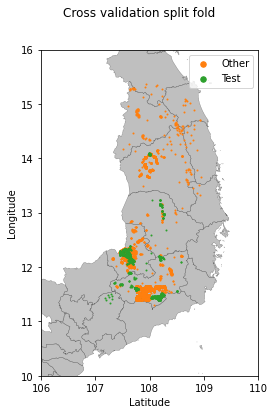

In [15]:
test, other = next(spatial_separation_dataset(geo_df, labels))
display_cross_val_map_class([other, test], vietnam_shape, f"Cross validation split fold")

In [16]:
# Save test set on the disk
test.to_csv(os.path.join(DATA_ROOT_PATH, 'datasets', 'test.csv'), index=False)

In [21]:
# Here's how you read it
# test = gpd.GeoDataFrame(pd.read_csv(os.path.join(DATA_ROOT_PATH, 'datasets', 'test.csv')))

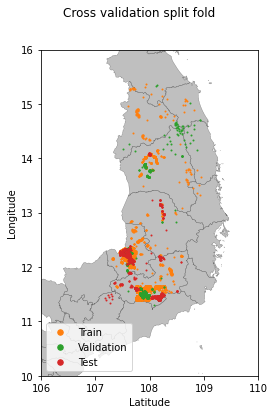

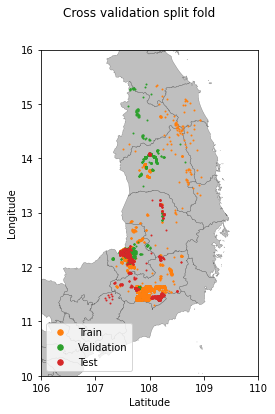

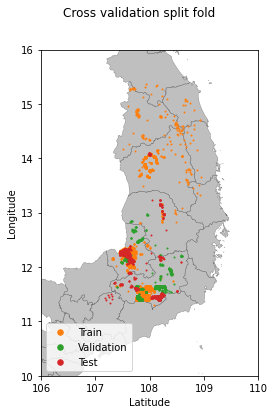

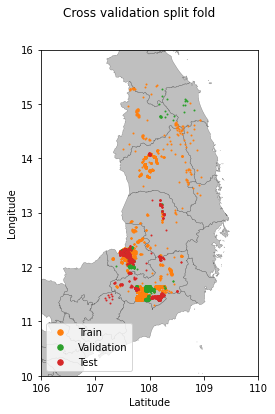

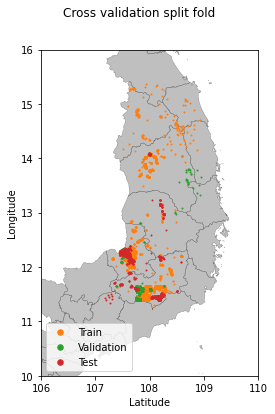

In [18]:
for validation, train in spatial_separation_dataset(other, labels):
    display_cross_val_map_class([train, validation, test], vietnam_shape, f"Cross validation split fold", legends=["Train", "Validation", "Test"])

In [15]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

spatial_cross_validation

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])

gpd_df = spatial_cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, early_stopping=True)
# mean_loss, mean_accuracy, histories, conf_matrix = spatial_cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS, True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 3)           0         
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 16)          448       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 16)          2320      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 3, 3, 16)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
flat (Flatten)               (None, 144)               0

## Comparaison nb px autour du café

### 9x9px

In [40]:
NB_PIXEL_AROUND = 4

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 9, 9, 3)           0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 9, 9, 16)          448       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 9, 9, 16)          2320      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 16)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
flat (Flatten)               (None, 144)              

Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9803 - accuracy: 0.5322 - val_loss: 1.0784 - val_accuracy: 0.5575
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0247 - accuracy: 0.5237 - val_loss: 1.2217 - val_accuracy: 0.4688
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0749 - accuracy: 0.4689 - val_loss: 1.1160 - val_accuracy: 0.5269
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1019 - accuracy: 0.4579 - val_loss: 1.0954 - val_accuracy: 0.5428
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0569 - accuracy: 0.4937 - val_loss: 1.1439 - val_accuracy: 0.5296
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0600 - accuracy: 0.4959 - val_loss: 1.0754 - val_accuracy: 0.5558
Epoch 53/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9997 - accuracy: 0.5180 - val_loss: 1.1360 - val_accuracy: 0.5171
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8816 - accuracy: 0.5722 - val_loss: 0.9931 - val_accuracy: 0.5905
Epoch 162/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8694 - accuracy: 0.5737 - val_loss: 1.0869 - val_accuracy: 0.5361
Epoch 163/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8747 - accuracy: 0.5451 - val_loss: 1.0236 - val_accuracy: 0.5677
Epoch 164/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7964 - accuracy: 0.5796 - val_loss: 1.0384 - val_accuracy: 0.5562
Epoch 165/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8387 - accuracy: 0.5591 - val_loss: 1.0623 - val_accuracy: 0.5398
Epoch 166/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8500 - accuracy: 0.5651 - val_loss: 1.0219 - val_accuracy: 0.5684
Epoch 167/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8475 - accuracy: 0.5423 - val_loss: 0.9813 - val_accuracy: 0.6072
Epoch 168/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7434 - accuracy: 0.5755 - val_loss: 1.0539 - val_accuracy: 0.5555
Epoch 276/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7591 - accuracy: 0.5790 - val_loss: 0.9924 - val_accuracy: 0.5813
Epoch 277/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7511 - accuracy: 0.5860 - val_loss: 1.0031 - val_accuracy: 0.5928
Epoch 278/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7410 - accuracy: 0.5983 - val_loss: 1.1440 - val_accuracy: 0.5398
Epoch 279/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7278 - accuracy: 0.5891 - val_loss: 1.0239 - val_accuracy: 0.5810
Epoch 280/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7023 - accuracy: 0.6073 - val_loss: 1.0012 - val_accuracy: 0.5943
Epoch 281/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7812 - accuracy: 0.5988 - val_loss: 0.9940 - val_accuracy: 0.5957
Epoch 282/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7260 - accuracy: 0.5994 - val_loss: 1.2033 - val_accuracy: 0.5190
Epoch 390/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6992 - accuracy: 0.5739 - val_loss: 0.9772 - val_accuracy: 0.6030
Epoch 391/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7111 - accuracy: 0.6260 - val_loss: 0.9365 - val_accuracy: 0.6352
Epoch 392/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6277 - accuracy: 0.6428 - val_loss: 0.9609 - val_accuracy: 0.6196
Epoch 393/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6905 - accuracy: 0.6299 - val_loss: 0.9914 - val_accuracy: 0.5931
Epoch 394/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6204 - accuracy: 0.6113 - val_loss: 0.9881 - val_accuracy: 0.6116
Epoch 395/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6249 - accuracy: 0.6050 - val_loss: 1.0623 - val_accuracy: 0.5761
Epoch 396/500


Fold  2 :
--------

Epoch 1/500
57/57 [==============================] - 1s 9ms/step - loss: 1.7778 - accuracy: 0.1853 - val_loss: 1.7676 - val_accuracy: 0.1578
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.6972 - accuracy: 0.2448 - val_loss: 1.5364 - val_accuracy: 0.2626
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4953 - accuracy: 0.2596 - val_loss: 1.4885 - val_accuracy: 0.3764
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4059 - accuracy: 0.3444 - val_loss: 1.4017 - val_accuracy: 0.4146
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4133 - accuracy: 0.3655 - val_loss: 1.3970 - val_accuracy: 0.3939
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4040 - accuracy: 0.3646 - val_loss: 1.3793 - val_accuracy: 0.4007
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3924 - accuracy: 0.3723 - val_loss: 1.3973 - val_accuracy:

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9278 - accuracy: 0.5083 - val_loss: 1.0286 - val_accuracy: 0.5773
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9127 - accuracy: 0.5649 - val_loss: 1.0807 - val_accuracy: 0.5567
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8933 - accuracy: 0.5561 - val_loss: 1.0953 - val_accuracy: 0.5466
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9579 - accuracy: 0.5459 - val_loss: 1.0483 - val_accuracy: 0.5660
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8559 - accuracy: 0.5790 - val_loss: 1.0384 - val_accuracy: 0.5765
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9307 - accuracy: 0.5722 - val_loss: 1.0781 - val_accuracy: 0.5411
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9040 - accuracy: 0.5821 - val_loss: 1.0908 - val_accuracy: 0.5382

57/57 [==============================] - 0s 8ms/step - loss: 0.7813 - accuracy: 0.6231 - val_loss: 1.0504 - val_accuracy: 0.5648
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8087 - accuracy: 0.6111 - val_loss: 0.9460 - val_accuracy: 0.6126
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8095 - accuracy: 0.6183 - val_loss: 1.0830 - val_accuracy: 0.5598
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8616 - accuracy: 0.5674 - val_loss: 0.9936 - val_accuracy: 0.5948
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8151 - accuracy: 0.6196 - val_loss: 0.9798 - val_accuracy: 0.5881
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7888 - accuracy: 0.5702 - val_loss: 1.0551 - val_accuracy: 0.5625
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7812 - accuracy: 0.5757 - val_loss: 1.0754 - val_accuracy: 0.5440
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6781 - accuracy: 0.6227 - val_loss: 0.9569 - val_accuracy: 0.6055
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7335 - accuracy: 0.6198 - val_loss: 1.0517 - val_accuracy: 0.5725
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7391 - accuracy: 0.6261 - val_loss: 1.0118 - val_accuracy: 0.5793
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7228 - accuracy: 0.6238 - val_loss: 0.9885 - val_accuracy: 0.5986
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7453 - accuracy: 0.6058 - val_loss: 1.1857 - val_accuracy: 0.5174
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7875 - accuracy: 0.6020 - val_loss: 0.9775 - val_accuracy: 0.6028
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7106 - accuracy: 0.6217 - val_loss: 0.9929 - val_accuracy: 0.6036
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6807 - accuracy: 0.6035 - val_loss: 0.9294 - val_accuracy: 0.6327
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6691 - accuracy: 0.6528 - val_loss: 0.9828 - val_accuracy: 0.6221
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.6333 - val_loss: 0.9885 - val_accuracy: 0.6132
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6224 - accuracy: 0.6492 - val_loss: 1.0331 - val_accuracy: 0.5890
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6325 - accuracy: 0.6475 - val_loss: 0.9972 - val_accuracy: 0.6166
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7212 - accuracy: 0.6228 - val_loss: 1.0565 - val_accuracy: 0.5860
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7002 - accuracy: 0.6146 - val_loss: 1.0122 - val_accuracy: 0.5995
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9944 - accuracy: 0.5288 - val_loss: 1.0487 - val_accuracy: 0.5705
Epoch 69/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8978 - accuracy: 0.5769 - val_loss: 1.0997 - val_accuracy: 0.5478
Epoch 70/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9648 - accuracy: 0.5333 - val_loss: 1.0711 - val_accuracy: 0.5571
Epoch 71/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9153 - accuracy: 0.5659 - val_loss: 1.1164 - val_accuracy: 0.5272
Epoch 72/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9599 - accuracy: 0.5034 - val_loss: 1.0451 - val_accuracy: 0.5814
Epoch 73/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9140 - accuracy: 0.5878 - val_loss: 1.1406 - val_accuracy: 0.5261
Epoch 74/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9138 - accuracy: 0.5656 - val_loss: 1.1921 - val_accuracy: 0.5109
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8352 - accuracy: 0.5874 - val_loss: 1.1056 - val_accuracy: 0.5425
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8683 - accuracy: 0.5772 - val_loss: 1.1641 - val_accuracy: 0.5001
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8558 - accuracy: 0.5519 - val_loss: 1.0709 - val_accuracy: 0.5679
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7919 - accuracy: 0.6018 - val_loss: 1.0608 - val_accuracy: 0.5767
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8541 - accuracy: 0.5801 - val_loss: 1.0459 - val_accuracy: 0.5838
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8184 - accuracy: 0.6053 - val_loss: 1.0326 - val_accuracy: 0.5800
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7916 - accuracy: 0.6141 - val_loss: 1.0378 - val_accuracy: 0.5819
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7456 - accuracy: 0.6204 - val_loss: 1.0579 - val_accuracy: 0.5774
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7831 - accuracy: 0.5787 - val_loss: 1.0088 - val_accuracy: 0.5833
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7870 - accuracy: 0.6149 - val_loss: 1.0724 - val_accuracy: 0.5595
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8533 - accuracy: 0.5729 - val_loss: 1.0104 - val_accuracy: 0.5938
Epoch 300/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8045 - accuracy: 0.5964 - val_loss: 1.0577 - val_accuracy: 0.5788
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7876 - accuracy: 0.5925 - val_loss: 0.9485 - val_accuracy: 0.6248
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7953 - accuracy: 0.5993 - val_loss: 1.0793 - val_accuracy: 0.5668
Epoch 303/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7275 - accuracy: 0.6164 - val_loss: 1.0249 - val_accuracy: 0.6004
Epoch 411/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7346 - accuracy: 0.5873 - val_loss: 1.0481 - val_accuracy: 0.5708
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6815 - accuracy: 0.6089 - val_loss: 0.9820 - val_accuracy: 0.6067
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7458 - accuracy: 0.6311 - val_loss: 1.1165 - val_accuracy: 0.5614
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6914 - accuracy: 0.6212 - val_loss: 1.0326 - val_accuracy: 0.5995
Epoch 415/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7076 - accuracy: 0.6348 - val_loss: 1.0299 - val_accuracy: 0.5899
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6984 - accuracy: 0.6416 - val_loss: 1.0082 - val_accuracy: 0.6089
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0594 - accuracy: 0.4830 - val_loss: 1.1310 - val_accuracy: 0.4950
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1777 - accuracy: 0.4598 - val_loss: 1.1456 - val_accuracy: 0.4695
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1145 - accuracy: 0.4847 - val_loss: 1.2083 - val_accuracy: 0.4560
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1031 - accuracy: 0.4903 - val_loss: 1.1583 - val_accuracy: 0.5093
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0205 - accuracy: 0.5133 - val_loss: 1.1288 - val_accuracy: 0.5154
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0211 - accuracy: 0.4806 - val_loss: 1.1409 - val_accuracy: 0.5120
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0952 - accuracy: 0.4648 - val_loss: 1.1767 - val_accuracy: 0.5223
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9360 - accuracy: 0.5603 - val_loss: 1.0807 - val_accuracy: 0.5675
Epoch 78/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9783 - accuracy: 0.5351 - val_loss: 1.1056 - val_accuracy: 0.5624
Epoch 79/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9431 - accuracy: 0.5807 - val_loss: 1.0793 - val_accuracy: 0.5656
Epoch 80/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9919 - accuracy: 0.5306 - val_loss: 1.1512 - val_accuracy: 0.5389
Epoch 81/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0435 - accuracy: 0.5269 - val_loss: 1.0983 - val_accuracy: 0.5625
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9347 - accuracy: 0.5601 - val_loss: 1.0896 - val_accuracy: 0.5457
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9440 - accuracy: 0.5617 - val_loss: 1.0915 - val_accuracy: 0.5653
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.7976 - accuracy: 0.5932 - val_loss: 0.9941 - val_accuracy: 0.5735
Epoch 192/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7875 - accuracy: 0.5760 - val_loss: 1.0789 - val_accuracy: 0.5291
Epoch 193/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8152 - accuracy: 0.6044 - val_loss: 1.0511 - val_accuracy: 0.5526
Epoch 194/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8228 - accuracy: 0.5942 - val_loss: 1.0080 - val_accuracy: 0.5743
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8378 - accuracy: 0.5824 - val_loss: 1.0108 - val_accuracy: 0.5769
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7178 - accuracy: 0.6127 - val_loss: 1.0299 - val_accuracy: 0.5671
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7682 - accuracy: 0.5986 - val_loss: 1.0202 - val_accuracy: 0.5824
Epoch 198/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6924 - accuracy: 0.6283 - val_loss: 1.0124 - val_accuracy: 0.5667
Epoch 306/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7422 - accuracy: 0.5951 - val_loss: 1.0115 - val_accuracy: 0.5634
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7147 - accuracy: 0.6373 - val_loss: 1.0016 - val_accuracy: 0.5731
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7408 - accuracy: 0.6127 - val_loss: 1.0437 - val_accuracy: 0.5434
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6833 - accuracy: 0.6365 - val_loss: 0.9951 - val_accuracy: 0.5862
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7450 - accuracy: 0.5948 - val_loss: 0.9768 - val_accuracy: 0.5856
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7373 - accuracy: 0.6184 - val_loss: 0.9744 - val_accuracy: 0.5864
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6716 - accuracy: 0.6279 - val_loss: 1.0309 - val_accuracy: 0.5662
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6452 - accuracy: 0.6573 - val_loss: 0.9852 - val_accuracy: 0.5961
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6236 - accuracy: 0.6597 - val_loss: 1.0135 - val_accuracy: 0.5782
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6223 - accuracy: 0.6314 - val_loss: 0.9734 - val_accuracy: 0.6071
Epoch 423/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6813 - accuracy: 0.6209 - val_loss: 0.9506 - val_accuracy: 0.6024
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.6356 - val_loss: 0.9986 - val_accuracy: 0.5814
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6258 - accuracy: 0.6351 - val_loss: 0.9673 - val_accuracy: 0.6082
Epoch 426/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0559 - accuracy: 0.5146 - val_loss: 1.1207 - val_accuracy: 0.5362
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0502 - accuracy: 0.5019 - val_loss: 1.1504 - val_accuracy: 0.5025
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0272 - accuracy: 0.5167 - val_loss: 1.1515 - val_accuracy: 0.4817
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0163 - accuracy: 0.5093 - val_loss: 1.1365 - val_accuracy: 0.5159
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0215 - accuracy: 0.5239 - val_loss: 1.1041 - val_accuracy: 0.5406
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0414 - accuracy: 0.5143 - val_loss: 1.1493 - val_accuracy: 0.4953
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0549 - accuracy: 0.4819 - val_loss: 1.1383 - val_accuracy: 0.5155
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0370 - accuracy: 0.5390 - val_loss: 1.1301 - val_accuracy: 0.5200
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9317 - accuracy: 0.5608 - val_loss: 1.0821 - val_accuracy: 0.5572
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9472 - accuracy: 0.5693 - val_loss: 1.1007 - val_accuracy: 0.5656
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9792 - accuracy: 0.5748 - val_loss: 1.0643 - val_accuracy: 0.5611
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9296 - accuracy: 0.5772 - val_loss: 1.0863 - val_accuracy: 0.5713
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9597 - accuracy: 0.5549 - val_loss: 1.1508 - val_accuracy: 0.5368
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9046 - accuracy: 0.5922 - val_loss: 1.0791 - val_accuracy: 0.5510
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8136 - accuracy: 0.6023 - val_loss: 1.0175 - val_accuracy: 0.5884
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8484 - accuracy: 0.6198 - val_loss: 1.0148 - val_accuracy: 0.5865
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7679 - accuracy: 0.6345 - val_loss: 1.2605 - val_accuracy: 0.4702
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9256 - accuracy: 0.5752 - val_loss: 1.0455 - val_accuracy: 0.5888
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8626 - accuracy: 0.5957 - val_loss: 1.0710 - val_accuracy: 0.5630
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8110 - accuracy: 0.6077 - val_loss: 1.0371 - val_accuracy: 0.5869
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7865 - accuracy: 0.6157 - val_loss: 0.9403 - val_accuracy: 0.6080
Epoch 207/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7021 - accuracy: 0.6288 - val_loss: 0.9460 - val_accuracy: 0.6086
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7329 - accuracy: 0.6358 - val_loss: 1.0053 - val_accuracy: 0.5843
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7640 - accuracy: 0.6287 - val_loss: 1.0064 - val_accuracy: 0.5689
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7471 - accuracy: 0.6116 - val_loss: 0.9900 - val_accuracy: 0.5885
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6960 - accuracy: 0.6226 - val_loss: 0.9576 - val_accuracy: 0.6222
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7164 - accuracy: 0.6336 - val_loss: 1.0036 - val_accuracy: 0.5747
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6703 - accuracy: 0.6264 - val_loss: 0.9881 - val_accuracy: 0.5978
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6260 - accuracy: 0.6720 - val_loss: 0.9424 - val_accuracy: 0.6305
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5814 - accuracy: 0.6940 - val_loss: 1.0161 - val_accuracy: 0.5975
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5766 - accuracy: 0.6657 - val_loss: 0.9888 - val_accuracy: 0.6050
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6154 - accuracy: 0.6517 - val_loss: 1.0296 - val_accuracy: 0.6066
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6702 - accuracy: 0.6798 - val_loss: 0.9707 - val_accuracy: 0.6213
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6314 - accuracy: 0.6625 - val_loss: 0.9061 - val_accuracy: 0.6453
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6269 - accuracy: 0.6802 - val_loss: 1.0037 - val_accuracy: 0.6194
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 0.9575 - accuracy: 0.5334 - val_loss: 1.1291 - val_accuracy: 0.5210
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0501 - accuracy: 0.4911 - val_loss: 1.1084 - val_accuracy: 0.5495
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9952 - accuracy: 0.5158 - val_loss: 1.1407 - val_accuracy: 0.5200
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0370 - accuracy: 0.5171 - val_loss: 1.1262 - val_accuracy: 0.5252
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9747 - accuracy: 0.5008 - val_loss: 1.1839 - val_accuracy: 0.5027
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0009 - accuracy: 0.4999 - val_loss: 1.0986 - val_accuracy: 0.5430
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0118 - accuracy: 0.5072 - val_loss: 1.1386 - val_accuracy: 0.5041
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9456 - accuracy: 0.5707 - val_loss: 1.0432 - val_accuracy: 0.5821
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9849 - accuracy: 0.5573 - val_loss: 1.0799 - val_accuracy: 0.5653
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8660 - accuracy: 0.5845 - val_loss: 1.2184 - val_accuracy: 0.4974
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9675 - accuracy: 0.5364 - val_loss: 1.0536 - val_accuracy: 0.5957
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9360 - accuracy: 0.5787 - val_loss: 1.0787 - val_accuracy: 0.5718
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9529 - accuracy: 0.5557 - val_loss: 1.1434 - val_accuracy: 0.5343
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9532 - accuracy: 0.5622 - val_loss: 1.0394 - val_accuracy: 0.5932
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.7666 - accuracy: 0.5963 - val_loss: 1.0945 - val_accuracy: 0.5509
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8196 - accuracy: 0.6062 - val_loss: 0.9909 - val_accuracy: 0.5900
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7983 - accuracy: 0.5922 - val_loss: 1.0309 - val_accuracy: 0.5555
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8787 - accuracy: 0.5569 - val_loss: 0.9975 - val_accuracy: 0.5836
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7898 - accuracy: 0.5747 - val_loss: 1.0354 - val_accuracy: 0.5657
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8114 - accuracy: 0.5811 - val_loss: 1.0830 - val_accuracy: 0.5453
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8616 - accuracy: 0.5819 - val_loss: 1.0392 - val_accuracy: 0.5797
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7108 - accuracy: 0.5997 - val_loss: 0.9899 - val_accuracy: 0.5930
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7175 - accuracy: 0.6431 - val_loss: 0.9809 - val_accuracy: 0.6090
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7481 - accuracy: 0.6115 - val_loss: 1.0116 - val_accuracy: 0.5886
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7742 - accuracy: 0.6079 - val_loss: 1.0133 - val_accuracy: 0.5803
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7151 - accuracy: 0.6079 - val_loss: 0.9947 - val_accuracy: 0.5974
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6610 - accuracy: 0.6401 - val_loss: 1.0670 - val_accuracy: 0.5670
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7136 - accuracy: 0.6156 - val_loss: 1.0196 - val_accuracy: 0.5911
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6510 - accuracy: 0.6170 - val_loss: 1.0555 - val_accuracy: 0.5771
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7105 - accuracy: 0.6314 - val_loss: 0.9974 - val_accuracy: 0.6012
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6652 - accuracy: 0.6383 - val_loss: 1.0172 - val_accuracy: 0.5960
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6469 - accuracy: 0.6167 - val_loss: 1.0410 - val_accuracy: 0.5926
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.6352 - val_loss: 0.9980 - val_accuracy: 0.6079
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6382 - accuracy: 0.6574 - val_loss: 1.0277 - val_accuracy: 0.5930
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6556 - accuracy: 0.6670 - val_loss: 1.0373 - val_accuracy: 0.5784
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 0.9549 - accuracy: 0.5147 - val_loss: 1.1548 - val_accuracy: 0.5082
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9823 - accuracy: 0.5067 - val_loss: 1.0905 - val_accuracy: 0.5663
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0403 - accuracy: 0.4999 - val_loss: 1.1104 - val_accuracy: 0.5436
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0765 - accuracy: 0.4821 - val_loss: 1.1415 - val_accuracy: 0.5109
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0467 - accuracy: 0.4598 - val_loss: 1.0893 - val_accuracy: 0.5370
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9558 - accuracy: 0.5168 - val_loss: 1.1660 - val_accuracy: 0.5101
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0054 - accuracy: 0.5148 - val_loss: 1.1243 - val_accuracy: 0.5235
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9130 - accuracy: 0.5281 - val_loss: 1.1336 - val_accuracy: 0.5096
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9964 - accuracy: 0.4989 - val_loss: 1.2221 - val_accuracy: 0.4785
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9097 - accuracy: 0.5256 - val_loss: 1.0645 - val_accuracy: 0.5645
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9059 - accuracy: 0.5386 - val_loss: 1.0641 - val_accuracy: 0.5321
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9443 - accuracy: 0.5087 - val_loss: 1.1103 - val_accuracy: 0.5307
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9370 - accuracy: 0.5248 - val_loss: 1.0682 - val_accuracy: 0.5496
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9445 - accuracy: 0.5292 - val_loss: 1.0447 - val_accuracy: 0.5523

57/57 [==============================] - 0s 8ms/step - loss: 0.8389 - accuracy: 0.5520 - val_loss: 0.9873 - val_accuracy: 0.5808
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7790 - accuracy: 0.5795 - val_loss: 1.0352 - val_accuracy: 0.5630
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7530 - accuracy: 0.5897 - val_loss: 1.0770 - val_accuracy: 0.5299
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8063 - accuracy: 0.5740 - val_loss: 1.0467 - val_accuracy: 0.5660
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8460 - accuracy: 0.5831 - val_loss: 1.0323 - val_accuracy: 0.5599
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7926 - accuracy: 0.5892 - val_loss: 1.1183 - val_accuracy: 0.4925
Epoch 224/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7948 - accuracy: 0.5731 - val_loss: 0.9982 - val_accuracy: 0.5645
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7755 - accuracy: 0.5703 - val_loss: 1.0031 - val_accuracy: 0.5705
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7201 - accuracy: 0.6081 - val_loss: 1.0228 - val_accuracy: 0.5736
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6756 - accuracy: 0.6286 - val_loss: 0.9983 - val_accuracy: 0.5843
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6911 - accuracy: 0.6122 - val_loss: 1.0291 - val_accuracy: 0.5700
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7016 - accuracy: 0.6362 - val_loss: 1.0305 - val_accuracy: 0.5793
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7108 - accuracy: 0.6061 - val_loss: 1.0283 - val_accuracy: 0.5833
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7226 - accuracy: 0.6225 - val_loss: 1.0150 - val_accuracy: 0.5784
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6470 - accuracy: 0.6206 - val_loss: 0.9841 - val_accuracy: 0.6137
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6419 - accuracy: 0.6527 - val_loss: 1.0280 - val_accuracy: 0.5831
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6401 - accuracy: 0.6137 - val_loss: 1.0054 - val_accuracy: 0.6024
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6625 - accuracy: 0.6156 - val_loss: 1.1054 - val_accuracy: 0.5602
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6996 - accuracy: 0.5989 - val_loss: 1.0540 - val_accuracy: 0.5595
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6962 - accuracy: 0.6113 - val_loss: 0.9797 - val_accuracy: 0.6078
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6875 - accuracy: 0.6186 - val_loss: 1.0385 - val_accuracy: 0.5881
Epoch 453/500


Fold  3 :
--------

Epoch 1/500
57/57 [==============================] - 1s 9ms/step - loss: 1.8041 - accuracy: 0.1236 - val_loss: 1.7897 - val_accuracy: 0.1851
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.7931 - accuracy: 0.1612 - val_loss: 1.6986 - val_accuracy: 0.1357
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.6086 - accuracy: 0.1913 - val_loss: 1.5712 - val_accuracy: 0.2445
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5170 - accuracy: 0.2488 - val_loss: 1.5234 - val_accuracy: 0.3303
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5547 - accuracy: 0.2697 - val_loss: 1.4738 - val_accuracy: 0.4435
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4331 - accuracy: 0.3844 - val_loss: 1.4945 - val_accuracy: 0.3410
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4509 - accuracy: 0.3534 - val_loss: 1.4268 - val_accuracy:

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9232 - accuracy: 0.5683 - val_loss: 1.0998 - val_accuracy: 0.5362
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9251 - accuracy: 0.5706 - val_loss: 1.0527 - val_accuracy: 0.5735
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8131 - accuracy: 0.6019 - val_loss: 1.0387 - val_accuracy: 0.5701
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9120 - accuracy: 0.5895 - val_loss: 1.0020 - val_accuracy: 0.5968
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8628 - accuracy: 0.6061 - val_loss: 1.0051 - val_accuracy: 0.5877
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8613 - accuracy: 0.5851 - val_loss: 1.1285 - val_accuracy: 0.5127
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8615 - accuracy: 0.5648 - val_loss: 1.0542 - val_accuracy: 0.5671

57/57 [==============================] - 0s 8ms/step - loss: 0.7578 - accuracy: 0.6120 - val_loss: 1.0548 - val_accuracy: 0.5531
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8016 - accuracy: 0.5724 - val_loss: 1.0446 - val_accuracy: 0.5698
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7581 - accuracy: 0.6037 - val_loss: 1.0422 - val_accuracy: 0.5549
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7563 - accuracy: 0.6199 - val_loss: 1.0007 - val_accuracy: 0.5887
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8159 - accuracy: 0.5797 - val_loss: 0.9508 - val_accuracy: 0.6052
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7406 - accuracy: 0.6143 - val_loss: 0.9692 - val_accuracy: 0.5968
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7853 - accuracy: 0.6056 - val_loss: 0.9898 - val_accuracy: 0.5923
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7207 - accuracy: 0.6402 - val_loss: 0.9720 - val_accuracy: 0.6211
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7146 - accuracy: 0.6391 - val_loss: 0.9809 - val_accuracy: 0.6027
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6883 - accuracy: 0.6368 - val_loss: 0.9555 - val_accuracy: 0.6181
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6598 - accuracy: 0.6580 - val_loss: 0.9663 - val_accuracy: 0.6063
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7450 - accuracy: 0.6274 - val_loss: 1.0196 - val_accuracy: 0.5917
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7098 - accuracy: 0.6303 - val_loss: 1.0085 - val_accuracy: 0.5953
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7291 - accuracy: 0.6239 - val_loss: 1.0172 - val_accuracy: 0.5937
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.5979 - accuracy: 0.6641 - val_loss: 0.9966 - val_accuracy: 0.6251
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6808 - accuracy: 0.6215 - val_loss: 0.9963 - val_accuracy: 0.6028
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6296 - accuracy: 0.6315 - val_loss: 1.0304 - val_accuracy: 0.5850
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7205 - accuracy: 0.6060 - val_loss: 0.9397 - val_accuracy: 0.6389
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6276 - accuracy: 0.6646 - val_loss: 1.0355 - val_accuracy: 0.6119
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6213 - accuracy: 0.6692 - val_loss: 1.0044 - val_accuracy: 0.6005
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6366 - accuracy: 0.6439 - val_loss: 1.0048 - val_accuracy: 0.6056
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0233 - accuracy: 0.5556 - val_loss: 1.0937 - val_accuracy: 0.5377
Epoch 69/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0028 - accuracy: 0.5263 - val_loss: 1.1339 - val_accuracy: 0.5229
Epoch 70/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9629 - accuracy: 0.5615 - val_loss: 1.0813 - val_accuracy: 0.5503
Epoch 71/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9680 - accuracy: 0.5758 - val_loss: 1.1845 - val_accuracy: 0.4849
Epoch 72/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9485 - accuracy: 0.5172 - val_loss: 1.1380 - val_accuracy: 0.5107
Epoch 73/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0072 - accuracy: 0.5577 - val_loss: 1.1096 - val_accuracy: 0.5188
Epoch 74/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9295 - accuracy: 0.5665 - val_loss: 1.1205 - val_accuracy: 0.5287
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8909 - accuracy: 0.5729 - val_loss: 1.0769 - val_accuracy: 0.5573
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8042 - accuracy: 0.6119 - val_loss: 1.0718 - val_accuracy: 0.5561
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8680 - accuracy: 0.6067 - val_loss: 1.0511 - val_accuracy: 0.5653
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8276 - accuracy: 0.6105 - val_loss: 1.0868 - val_accuracy: 0.5435
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8472 - accuracy: 0.5793 - val_loss: 1.0715 - val_accuracy: 0.5632
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8725 - accuracy: 0.5961 - val_loss: 1.1696 - val_accuracy: 0.5355
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9622 - accuracy: 0.5490 - val_loss: 1.0239 - val_accuracy: 0.5828
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7903 - accuracy: 0.6090 - val_loss: 1.0329 - val_accuracy: 0.5885
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8328 - accuracy: 0.6124 - val_loss: 1.0600 - val_accuracy: 0.5651
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7619 - accuracy: 0.6162 - val_loss: 1.0552 - val_accuracy: 0.5583
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7752 - accuracy: 0.6102 - val_loss: 1.0927 - val_accuracy: 0.5478
Epoch 300/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7459 - accuracy: 0.6161 - val_loss: 1.0766 - val_accuracy: 0.5757
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7314 - accuracy: 0.6086 - val_loss: 1.0855 - val_accuracy: 0.5706
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7422 - accuracy: 0.6154 - val_loss: 1.0752 - val_accuracy: 0.5695
Epoch 303/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6574 - accuracy: 0.6408 - val_loss: 1.0024 - val_accuracy: 0.5902
Epoch 411/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7157 - accuracy: 0.6279 - val_loss: 1.0024 - val_accuracy: 0.5932
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7172 - accuracy: 0.6518 - val_loss: 1.0965 - val_accuracy: 0.5549
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7395 - accuracy: 0.6039 - val_loss: 1.1200 - val_accuracy: 0.5592
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6798 - accuracy: 0.6151 - val_loss: 1.0868 - val_accuracy: 0.5571
Epoch 415/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6534 - accuracy: 0.6357 - val_loss: 1.0811 - val_accuracy: 0.5657
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7081 - accuracy: 0.6269 - val_loss: 1.0727 - val_accuracy: 0.5511
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.1204 - accuracy: 0.4220 - val_loss: 1.1675 - val_accuracy: 0.4904
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1356 - accuracy: 0.4533 - val_loss: 1.2084 - val_accuracy: 0.4636
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1114 - accuracy: 0.4733 - val_loss: 1.1592 - val_accuracy: 0.5024
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0822 - accuracy: 0.4915 - val_loss: 1.2299 - val_accuracy: 0.4642
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1188 - accuracy: 0.4561 - val_loss: 1.1450 - val_accuracy: 0.5033
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0672 - accuracy: 0.4565 - val_loss: 1.1548 - val_accuracy: 0.4737
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0657 - accuracy: 0.4675 - val_loss: 1.1968 - val_accuracy: 0.4625
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8945 - accuracy: 0.5795 - val_loss: 1.1654 - val_accuracy: 0.4927
Epoch 78/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0402 - accuracy: 0.5242 - val_loss: 1.0758 - val_accuracy: 0.5557
Epoch 79/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9104 - accuracy: 0.5670 - val_loss: 1.0641 - val_accuracy: 0.5701
Epoch 80/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9461 - accuracy: 0.5688 - val_loss: 1.0841 - val_accuracy: 0.5640
Epoch 81/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9649 - accuracy: 0.5672 - val_loss: 1.0138 - val_accuracy: 0.5914
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9886 - accuracy: 0.5357 - val_loss: 1.0623 - val_accuracy: 0.5561
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9561 - accuracy: 0.5728 - val_loss: 1.0779 - val_accuracy: 0.5549
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.7483 - accuracy: 0.6245 - val_loss: 0.9793 - val_accuracy: 0.5894
Epoch 192/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7667 - accuracy: 0.6124 - val_loss: 0.9852 - val_accuracy: 0.5925
Epoch 193/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8143 - accuracy: 0.5896 - val_loss: 1.0147 - val_accuracy: 0.5618
Epoch 194/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8136 - accuracy: 0.5919 - val_loss: 1.0555 - val_accuracy: 0.5691
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8437 - accuracy: 0.5946 - val_loss: 1.0398 - val_accuracy: 0.5602
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8522 - accuracy: 0.5979 - val_loss: 1.0119 - val_accuracy: 0.5628
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7407 - accuracy: 0.6121 - val_loss: 0.9427 - val_accuracy: 0.6111
Epoch 198/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6797 - accuracy: 0.6498 - val_loss: 0.9943 - val_accuracy: 0.5951
Epoch 306/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6952 - accuracy: 0.6235 - val_loss: 0.9640 - val_accuracy: 0.6069
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6505 - accuracy: 0.6545 - val_loss: 0.9558 - val_accuracy: 0.6134
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7143 - accuracy: 0.6266 - val_loss: 1.0004 - val_accuracy: 0.5781
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7203 - accuracy: 0.6318 - val_loss: 0.9369 - val_accuracy: 0.6246
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7299 - accuracy: 0.6522 - val_loss: 1.0008 - val_accuracy: 0.5926
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6485 - accuracy: 0.6843 - val_loss: 1.0000 - val_accuracy: 0.5921
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6174 - accuracy: 0.6586 - val_loss: 0.9487 - val_accuracy: 0.6203
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6179 - accuracy: 0.6700 - val_loss: 0.9890 - val_accuracy: 0.6100
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5925 - accuracy: 0.7066 - val_loss: 1.0045 - val_accuracy: 0.6005
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6066 - accuracy: 0.6502 - val_loss: 0.9733 - val_accuracy: 0.6223
Epoch 423/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5823 - accuracy: 0.6717 - val_loss: 0.9752 - val_accuracy: 0.6242
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5864 - accuracy: 0.6916 - val_loss: 0.9582 - val_accuracy: 0.6192
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6286 - accuracy: 0.6665 - val_loss: 1.0047 - val_accuracy: 0.6047
Epoch 426/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0328 - accuracy: 0.5183 - val_loss: 1.0758 - val_accuracy: 0.5525
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0233 - accuracy: 0.5276 - val_loss: 1.2041 - val_accuracy: 0.4536
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9224 - accuracy: 0.4828 - val_loss: 1.2111 - val_accuracy: 0.4496
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0219 - accuracy: 0.4790 - val_loss: 1.1796 - val_accuracy: 0.5086
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0218 - accuracy: 0.5061 - val_loss: 1.1352 - val_accuracy: 0.5220
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0059 - accuracy: 0.5118 - val_loss: 1.1661 - val_accuracy: 0.5024
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9999 - accuracy: 0.5154 - val_loss: 1.1109 - val_accuracy: 0.5345
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9701 - accuracy: 0.5476 - val_loss: 1.0797 - val_accuracy: 0.5516
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9548 - accuracy: 0.5633 - val_loss: 1.0825 - val_accuracy: 0.5605
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9532 - accuracy: 0.5449 - val_loss: 1.0617 - val_accuracy: 0.5725
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9420 - accuracy: 0.5669 - val_loss: 1.1050 - val_accuracy: 0.5677
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9457 - accuracy: 0.5701 - val_loss: 1.0853 - val_accuracy: 0.5577
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9337 - accuracy: 0.5565 - val_loss: 1.0929 - val_accuracy: 0.5467
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9634 - accuracy: 0.5488 - val_loss: 1.1032 - val_accuracy: 0.5593
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8672 - accuracy: 0.5721 - val_loss: 1.0310 - val_accuracy: 0.5738
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7915 - accuracy: 0.5759 - val_loss: 1.0890 - val_accuracy: 0.5191
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8129 - accuracy: 0.5488 - val_loss: 1.0911 - val_accuracy: 0.5539
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9099 - accuracy: 0.5263 - val_loss: 1.0218 - val_accuracy: 0.5672
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8116 - accuracy: 0.5749 - val_loss: 1.0636 - val_accuracy: 0.5628
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8386 - accuracy: 0.5931 - val_loss: 1.0801 - val_accuracy: 0.5391
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8398 - accuracy: 0.5254 - val_loss: 1.1436 - val_accuracy: 0.5189
Epoch 207/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7778 - accuracy: 0.5750 - val_loss: 1.0550 - val_accuracy: 0.5810
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7343 - accuracy: 0.5779 - val_loss: 1.0575 - val_accuracy: 0.5578
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8207 - accuracy: 0.5620 - val_loss: 1.0387 - val_accuracy: 0.5780
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8064 - accuracy: 0.5706 - val_loss: 1.0706 - val_accuracy: 0.5491
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7346 - accuracy: 0.5759 - val_loss: 1.0428 - val_accuracy: 0.5816
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7487 - accuracy: 0.5836 - val_loss: 1.0740 - val_accuracy: 0.5605
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7721 - accuracy: 0.5831 - val_loss: 1.0294 - val_accuracy: 0.5737
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6933 - accuracy: 0.6069 - val_loss: 1.0583 - val_accuracy: 0.5836
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7125 - accuracy: 0.6178 - val_loss: 1.0549 - val_accuracy: 0.5713
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6842 - accuracy: 0.5840 - val_loss: 1.0435 - val_accuracy: 0.5808
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6925 - accuracy: 0.6222 - val_loss: 1.0832 - val_accuracy: 0.5565
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7253 - accuracy: 0.6027 - val_loss: 1.0774 - val_accuracy: 0.5722
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7034 - accuracy: 0.6012 - val_loss: 1.0169 - val_accuracy: 0.5943
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6662 - accuracy: 0.6209 - val_loss: 1.0089 - val_accuracy: 0.6017
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0498 - accuracy: 0.5215 - val_loss: 1.0996 - val_accuracy: 0.5162
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9714 - accuracy: 0.5180 - val_loss: 1.2536 - val_accuracy: 0.3991
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0724 - accuracy: 0.4721 - val_loss: 1.1097 - val_accuracy: 0.5467
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0557 - accuracy: 0.5043 - val_loss: 1.1305 - val_accuracy: 0.5111
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0500 - accuracy: 0.4948 - val_loss: 1.0774 - val_accuracy: 0.5640
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0295 - accuracy: 0.5114 - val_loss: 1.0902 - val_accuracy: 0.5435
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0058 - accuracy: 0.5283 - val_loss: 1.0632 - val_accuracy: 0.5790
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9278 - accuracy: 0.5333 - val_loss: 1.0007 - val_accuracy: 0.5941
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9543 - accuracy: 0.5429 - val_loss: 1.0444 - val_accuracy: 0.5629
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8916 - accuracy: 0.5389 - val_loss: 1.0240 - val_accuracy: 0.5847
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9413 - accuracy: 0.5532 - val_loss: 1.0952 - val_accuracy: 0.5283
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9141 - accuracy: 0.5383 - val_loss: 1.0925 - val_accuracy: 0.5178
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9879 - accuracy: 0.5106 - val_loss: 1.0993 - val_accuracy: 0.5408
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9347 - accuracy: 0.5393 - val_loss: 1.0438 - val_accuracy: 0.5552
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.8758 - accuracy: 0.5470 - val_loss: 1.0215 - val_accuracy: 0.5598
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8611 - accuracy: 0.5635 - val_loss: 0.9681 - val_accuracy: 0.5909
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8569 - accuracy: 0.5553 - val_loss: 0.9727 - val_accuracy: 0.5982
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7850 - accuracy: 0.5750 - val_loss: 1.0259 - val_accuracy: 0.5588
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7890 - accuracy: 0.5951 - val_loss: 1.0882 - val_accuracy: 0.5234
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8315 - accuracy: 0.5568 - val_loss: 1.0520 - val_accuracy: 0.5299
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8377 - accuracy: 0.5381 - val_loss: 0.9878 - val_accuracy: 0.5763
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7460 - accuracy: 0.5872 - val_loss: 0.9773 - val_accuracy: 0.5824
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8252 - accuracy: 0.5817 - val_loss: 0.9752 - val_accuracy: 0.5857
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7865 - accuracy: 0.5788 - val_loss: 1.0198 - val_accuracy: 0.5660
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7267 - accuracy: 0.5662 - val_loss: 1.0311 - val_accuracy: 0.5755
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7474 - accuracy: 0.6004 - val_loss: 1.1432 - val_accuracy: 0.5204
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8580 - accuracy: 0.5462 - val_loss: 1.0503 - val_accuracy: 0.5511
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7601 - accuracy: 0.5780 - val_loss: 1.0134 - val_accuracy: 0.5792
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6795 - accuracy: 0.6031 - val_loss: 0.9277 - val_accuracy: 0.6074
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7143 - accuracy: 0.6190 - val_loss: 0.9362 - val_accuracy: 0.6067
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6598 - accuracy: 0.6444 - val_loss: 1.0119 - val_accuracy: 0.5629
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6744 - accuracy: 0.6065 - val_loss: 1.0309 - val_accuracy: 0.5619
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7325 - accuracy: 0.5801 - val_loss: 0.9361 - val_accuracy: 0.6130
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6727 - accuracy: 0.6272 - val_loss: 0.9545 - val_accuracy: 0.6062
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6813 - accuracy: 0.6098 - val_loss: 1.0340 - val_accuracy: 0.5819
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 0.9905 - accuracy: 0.5552 - val_loss: 1.0686 - val_accuracy: 0.5690
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9544 - accuracy: 0.5575 - val_loss: 1.1135 - val_accuracy: 0.5375
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0259 - accuracy: 0.5227 - val_loss: 1.1296 - val_accuracy: 0.5245
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9634 - accuracy: 0.5188 - val_loss: 1.0665 - val_accuracy: 0.5619
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9906 - accuracy: 0.5350 - val_loss: 1.1413 - val_accuracy: 0.5439
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9726 - accuracy: 0.5542 - val_loss: 1.1159 - val_accuracy: 0.5424
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9354 - accuracy: 0.5683 - val_loss: 1.1401 - val_accuracy: 0.5356
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9470 - accuracy: 0.5665 - val_loss: 1.0285 - val_accuracy: 0.5845
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9270 - accuracy: 0.5773 - val_loss: 1.1335 - val_accuracy: 0.5470
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9796 - accuracy: 0.5502 - val_loss: 1.0613 - val_accuracy: 0.5894
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8717 - accuracy: 0.5785 - val_loss: 1.0098 - val_accuracy: 0.5985
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9890 - accuracy: 0.5631 - val_loss: 1.0626 - val_accuracy: 0.5846
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9014 - accuracy: 0.5893 - val_loss: 1.1804 - val_accuracy: 0.5263
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9046 - accuracy: 0.5582 - val_loss: 1.1683 - val_accuracy: 0.5377

57/57 [==============================] - 0s 8ms/step - loss: 0.8112 - accuracy: 0.5793 - val_loss: 1.0422 - val_accuracy: 0.5664
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8090 - accuracy: 0.6012 - val_loss: 1.0508 - val_accuracy: 0.5606
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8287 - accuracy: 0.5207 - val_loss: 1.0290 - val_accuracy: 0.5778
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7367 - accuracy: 0.5968 - val_loss: 1.0703 - val_accuracy: 0.5313
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7613 - accuracy: 0.5866 - val_loss: 0.9992 - val_accuracy: 0.5803
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7230 - accuracy: 0.6249 - val_loss: 1.0157 - val_accuracy: 0.5788
Epoch 224/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7479 - accuracy: 0.6109 - val_loss: 1.0291 - val_accuracy: 0.5789
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6801 - accuracy: 0.6146 - val_loss: 1.0312 - val_accuracy: 0.5759
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6780 - accuracy: 0.6309 - val_loss: 1.0528 - val_accuracy: 0.5781
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6875 - accuracy: 0.6166 - val_loss: 1.1183 - val_accuracy: 0.5411
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6727 - accuracy: 0.6044 - val_loss: 1.0570 - val_accuracy: 0.5738
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7067 - accuracy: 0.6134 - val_loss: 0.9756 - val_accuracy: 0.6092
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6542 - accuracy: 0.6391 - val_loss: 1.0544 - val_accuracy: 0.5671
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6800 - accuracy: 0.6262 - val_loss: 1.0289 - val_accuracy: 0.5765
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6694 - accuracy: 0.6415 - val_loss: 1.0340 - val_accuracy: 0.5877
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5918 - accuracy: 0.6756 - val_loss: 1.1177 - val_accuracy: 0.5657
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6068 - accuracy: 0.6465 - val_loss: 1.0774 - val_accuracy: 0.5662
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6463 - accuracy: 0.6200 - val_loss: 1.0347 - val_accuracy: 0.5842
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6481 - accuracy: 0.6403 - val_loss: 0.9842 - val_accuracy: 0.6108
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6211 - accuracy: 0.6359 - val_loss: 1.0450 - val_accuracy: 0.5822
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6404 - accuracy: 0.6493 - val_loss: 1.0525 - val_accuracy: 0.5892
Epoch 453/500


Fold  4 :
--------

Epoch 1/500
57/57 [==============================] - 1s 9ms/step - loss: 1.7952 - accuracy: 0.2121 - val_loss: 1.6887 - val_accuracy: 0.2904
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.6044 - accuracy: 0.2765 - val_loss: 1.4698 - val_accuracy: 0.2753
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4233 - accuracy: 0.3005 - val_loss: 1.3614 - val_accuracy: 0.4566
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3321 - accuracy: 0.3839 - val_loss: 1.4091 - val_accuracy: 0.4362
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2986 - accuracy: 0.3565 - val_loss: 1.4356 - val_accuracy: 0.3142
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3044 - accuracy: 0.3763 - val_loss: 1.2932 - val_accuracy: 0.3630
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2925 - accuracy: 0.3586 - val_loss: 1.4435 - val_accuracy:

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9333 - accuracy: 0.5546 - val_loss: 1.1128 - val_accuracy: 0.5396
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9523 - accuracy: 0.5719 - val_loss: 1.1397 - val_accuracy: 0.5404
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9675 - accuracy: 0.5674 - val_loss: 1.0999 - val_accuracy: 0.5398
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9408 - accuracy: 0.5745 - val_loss: 1.1241 - val_accuracy: 0.5491
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9412 - accuracy: 0.5897 - val_loss: 1.0997 - val_accuracy: 0.5511
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8932 - accuracy: 0.5804 - val_loss: 1.1275 - val_accuracy: 0.5311
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9487 - accuracy: 0.5648 - val_loss: 1.1790 - val_accuracy: 0.5181

57/57 [==============================] - 0s 8ms/step - loss: 0.8302 - accuracy: 0.6147 - val_loss: 0.9958 - val_accuracy: 0.6094
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8314 - accuracy: 0.6040 - val_loss: 1.0166 - val_accuracy: 0.5841
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8803 - accuracy: 0.6081 - val_loss: 1.0457 - val_accuracy: 0.5679
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8205 - accuracy: 0.5843 - val_loss: 1.0771 - val_accuracy: 0.5519
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9048 - accuracy: 0.5910 - val_loss: 1.0191 - val_accuracy: 0.5781
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8664 - accuracy: 0.6068 - val_loss: 1.0244 - val_accuracy: 0.5762
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8386 - accuracy: 0.6150 - val_loss: 1.0856 - val_accuracy: 0.5269
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7974 - accuracy: 0.6142 - val_loss: 1.0019 - val_accuracy: 0.6077
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7776 - accuracy: 0.6181 - val_loss: 1.1303 - val_accuracy: 0.5538
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7382 - accuracy: 0.6282 - val_loss: 0.9876 - val_accuracy: 0.6012
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6883 - accuracy: 0.6278 - val_loss: 1.0430 - val_accuracy: 0.5744
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7545 - accuracy: 0.6127 - val_loss: 1.0478 - val_accuracy: 0.5902
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8293 - accuracy: 0.5997 - val_loss: 1.0543 - val_accuracy: 0.5645
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7523 - accuracy: 0.6147 - val_loss: 1.0014 - val_accuracy: 0.6052
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7067 - accuracy: 0.6310 - val_loss: 1.0414 - val_accuracy: 0.5852
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6944 - accuracy: 0.6504 - val_loss: 1.0481 - val_accuracy: 0.5875
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7160 - accuracy: 0.6370 - val_loss: 1.0931 - val_accuracy: 0.5615
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7022 - accuracy: 0.6346 - val_loss: 0.9609 - val_accuracy: 0.6244
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6910 - accuracy: 0.6542 - val_loss: 1.0229 - val_accuracy: 0.5898
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7698 - accuracy: 0.6143 - val_loss: 0.9702 - val_accuracy: 0.6196
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.6418 - val_loss: 1.0586 - val_accuracy: 0.5999
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0124 - accuracy: 0.5392 - val_loss: 1.1022 - val_accuracy: 0.5614
Epoch 69/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9767 - accuracy: 0.5346 - val_loss: 1.1576 - val_accuracy: 0.5062
Epoch 70/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9828 - accuracy: 0.5349 - val_loss: 1.1165 - val_accuracy: 0.5495
Epoch 71/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9976 - accuracy: 0.5632 - val_loss: 1.1252 - val_accuracy: 0.5431
Epoch 72/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0458 - accuracy: 0.5379 - val_loss: 1.1052 - val_accuracy: 0.5431
Epoch 73/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9867 - accuracy: 0.5509 - val_loss: 1.0987 - val_accuracy: 0.5507
Epoch 74/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0183 - accuracy: 0.5364 - val_loss: 1.1746 - val_accuracy: 0.5028
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8613 - accuracy: 0.5979 - val_loss: 1.1681 - val_accuracy: 0.5176
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9684 - accuracy: 0.5396 - val_loss: 1.0681 - val_accuracy: 0.5653
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8444 - accuracy: 0.5684 - val_loss: 1.0749 - val_accuracy: 0.5710
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9366 - accuracy: 0.5633 - val_loss: 1.0641 - val_accuracy: 0.5700
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8450 - accuracy: 0.5767 - val_loss: 1.0528 - val_accuracy: 0.5748
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9440 - accuracy: 0.5714 - val_loss: 1.0579 - val_accuracy: 0.5581
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9227 - accuracy: 0.5501 - val_loss: 1.0029 - val_accuracy: 0.5952
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8545 - accuracy: 0.5912 - val_loss: 1.0495 - val_accuracy: 0.5856
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8142 - accuracy: 0.5927 - val_loss: 1.0718 - val_accuracy: 0.5648
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7736 - accuracy: 0.6092 - val_loss: 1.0051 - val_accuracy: 0.6033
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7873 - accuracy: 0.6373 - val_loss: 1.0139 - val_accuracy: 0.5922
Epoch 300/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8490 - accuracy: 0.5766 - val_loss: 1.0789 - val_accuracy: 0.5469
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8448 - accuracy: 0.5754 - val_loss: 1.0288 - val_accuracy: 0.6023
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8396 - accuracy: 0.6074 - val_loss: 1.0143 - val_accuracy: 0.5885
Epoch 303/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7186 - accuracy: 0.6400 - val_loss: 0.9824 - val_accuracy: 0.6124
Epoch 411/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7772 - accuracy: 0.6233 - val_loss: 0.9891 - val_accuracy: 0.6018
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7400 - accuracy: 0.6085 - val_loss: 1.0236 - val_accuracy: 0.6075
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8010 - accuracy: 0.6247 - val_loss: 1.0090 - val_accuracy: 0.6014
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7532 - accuracy: 0.6223 - val_loss: 1.0812 - val_accuracy: 0.5824
Epoch 415/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7531 - accuracy: 0.6014 - val_loss: 0.9747 - val_accuracy: 0.6100
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7310 - accuracy: 0.6366 - val_loss: 1.0218 - val_accuracy: 0.5979
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.2358 - accuracy: 0.3586 - val_loss: 1.2109 - val_accuracy: 0.4301
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1457 - accuracy: 0.4269 - val_loss: 1.2049 - val_accuracy: 0.4358
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1422 - accuracy: 0.3834 - val_loss: 1.2328 - val_accuracy: 0.4244
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1844 - accuracy: 0.4320 - val_loss: 1.1651 - val_accuracy: 0.4672
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1269 - accuracy: 0.4519 - val_loss: 1.2554 - val_accuracy: 0.4579
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0839 - accuracy: 0.4699 - val_loss: 1.1595 - val_accuracy: 0.4847
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0703 - accuracy: 0.4660 - val_loss: 1.1467 - val_accuracy: 0.5011
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0943 - accuracy: 0.4629 - val_loss: 1.1418 - val_accuracy: 0.4902
Epoch 78/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0815 - accuracy: 0.4622 - val_loss: 1.1497 - val_accuracy: 0.4928
Epoch 79/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0274 - accuracy: 0.4884 - val_loss: 1.1748 - val_accuracy: 0.4860
Epoch 80/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0493 - accuracy: 0.4900 - val_loss: 1.1097 - val_accuracy: 0.5060
Epoch 81/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1145 - accuracy: 0.4625 - val_loss: 1.1690 - val_accuracy: 0.4872
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0380 - accuracy: 0.4859 - val_loss: 1.1219 - val_accuracy: 0.4978
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9870 - accuracy: 0.4849 - val_loss: 1.1163 - val_accuracy: 0.5208
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9796 - accuracy: 0.5247 - val_loss: 1.0564 - val_accuracy: 0.5421
Epoch 192/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9742 - accuracy: 0.5266 - val_loss: 1.0239 - val_accuracy: 0.5590
Epoch 193/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8878 - accuracy: 0.5508 - val_loss: 1.0574 - val_accuracy: 0.5284
Epoch 194/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8871 - accuracy: 0.5399 - val_loss: 1.1050 - val_accuracy: 0.5567
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9402 - accuracy: 0.5413 - val_loss: 1.0820 - val_accuracy: 0.5296
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8570 - accuracy: 0.5575 - val_loss: 1.0188 - val_accuracy: 0.5890
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9127 - accuracy: 0.5915 - val_loss: 1.0753 - val_accuracy: 0.5436
Epoch 198/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7874 - accuracy: 0.6050 - val_loss: 1.0716 - val_accuracy: 0.5409
Epoch 306/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8112 - accuracy: 0.5599 - val_loss: 0.9738 - val_accuracy: 0.5985
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8060 - accuracy: 0.5972 - val_loss: 1.0517 - val_accuracy: 0.5639
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7961 - accuracy: 0.5684 - val_loss: 1.0701 - val_accuracy: 0.5445
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7836 - accuracy: 0.5504 - val_loss: 1.0478 - val_accuracy: 0.5627
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8617 - accuracy: 0.5782 - val_loss: 1.0422 - val_accuracy: 0.5494
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8354 - accuracy: 0.5960 - val_loss: 1.0007 - val_accuracy: 0.5770
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7517 - accuracy: 0.6005 - val_loss: 1.0160 - val_accuracy: 0.5840
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7019 - accuracy: 0.6316 - val_loss: 1.0631 - val_accuracy: 0.5550
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7238 - accuracy: 0.6008 - val_loss: 1.0699 - val_accuracy: 0.5562
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6901 - accuracy: 0.6062 - val_loss: 0.9996 - val_accuracy: 0.5699
Epoch 423/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7254 - accuracy: 0.6283 - val_loss: 0.9931 - val_accuracy: 0.5855
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7376 - accuracy: 0.6065 - val_loss: 1.0402 - val_accuracy: 0.5672
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7592 - accuracy: 0.6074 - val_loss: 1.0006 - val_accuracy: 0.5774
Epoch 426/500

57/57 [==============================] - 0s 8ms/step - loss: 0.9646 - accuracy: 0.5550 - val_loss: 1.2709 - val_accuracy: 0.3912
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0403 - accuracy: 0.5031 - val_loss: 1.3792 - val_accuracy: 0.3714
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0478 - accuracy: 0.4687 - val_loss: 1.1148 - val_accuracy: 0.4963
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0390 - accuracy: 0.5399 - val_loss: 1.1374 - val_accuracy: 0.5121
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0165 - accuracy: 0.5319 - val_loss: 1.1287 - val_accuracy: 0.5233
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9464 - accuracy: 0.5629 - val_loss: 1.1850 - val_accuracy: 0.4482
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0867 - accuracy: 0.5079 - val_loss: 1.1309 - val_accuracy: 0.5107
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9475 - accuracy: 0.5683 - val_loss: 1.1941 - val_accuracy: 0.5409
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0195 - accuracy: 0.5631 - val_loss: 1.1099 - val_accuracy: 0.5583
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9246 - accuracy: 0.5864 - val_loss: 1.0870 - val_accuracy: 0.5731
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9256 - accuracy: 0.5855 - val_loss: 1.1381 - val_accuracy: 0.4988
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9448 - accuracy: 0.5669 - val_loss: 1.0479 - val_accuracy: 0.5738
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9900 - accuracy: 0.5616 - val_loss: 1.1654 - val_accuracy: 0.5401
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9415 - accuracy: 0.5578 - val_loss: 1.0233 - val_accuracy: 0.5971
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9047 - accuracy: 0.5490 - val_loss: 1.1106 - val_accuracy: 0.5362
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8138 - accuracy: 0.5716 - val_loss: 0.9778 - val_accuracy: 0.6124
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8221 - accuracy: 0.5958 - val_loss: 1.0150 - val_accuracy: 0.5746
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7609 - accuracy: 0.5934 - val_loss: 1.0572 - val_accuracy: 0.5735
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8279 - accuracy: 0.5693 - val_loss: 1.0609 - val_accuracy: 0.5572
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8479 - accuracy: 0.5950 - val_loss: 1.0449 - val_accuracy: 0.5686
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7517 - accuracy: 0.6148 - val_loss: 1.0594 - val_accuracy: 0.5390
Epoch 207/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7516 - accuracy: 0.5991 - val_loss: 0.9637 - val_accuracy: 0.5951
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7055 - accuracy: 0.6343 - val_loss: 0.9594 - val_accuracy: 0.5976
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6971 - accuracy: 0.6273 - val_loss: 1.0173 - val_accuracy: 0.5937
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7619 - accuracy: 0.5814 - val_loss: 1.0227 - val_accuracy: 0.5894
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7809 - accuracy: 0.5835 - val_loss: 1.0563 - val_accuracy: 0.5788
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7731 - accuracy: 0.6073 - val_loss: 0.9964 - val_accuracy: 0.5957
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7095 - accuracy: 0.5938 - val_loss: 0.9927 - val_accuracy: 0.6029
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6601 - accuracy: 0.6301 - val_loss: 0.9843 - val_accuracy: 0.6077
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6510 - accuracy: 0.6393 - val_loss: 0.9852 - val_accuracy: 0.5944
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6525 - accuracy: 0.6318 - val_loss: 1.0130 - val_accuracy: 0.6040
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.6228 - val_loss: 0.9436 - val_accuracy: 0.6253
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6912 - accuracy: 0.6270 - val_loss: 0.9486 - val_accuracy: 0.6208
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7080 - accuracy: 0.6519 - val_loss: 0.9897 - val_accuracy: 0.5861
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6540 - accuracy: 0.6344 - val_loss: 1.0066 - val_accuracy: 0.5774
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0271 - accuracy: 0.4909 - val_loss: 1.2309 - val_accuracy: 0.4560
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0654 - accuracy: 0.4704 - val_loss: 1.1269 - val_accuracy: 0.5301
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0226 - accuracy: 0.5081 - val_loss: 1.2535 - val_accuracy: 0.4646
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1017 - accuracy: 0.4542 - val_loss: 1.2439 - val_accuracy: 0.4394
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1427 - accuracy: 0.4623 - val_loss: 1.1163 - val_accuracy: 0.5284
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0413 - accuracy: 0.5196 - val_loss: 1.1462 - val_accuracy: 0.5128
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0132 - accuracy: 0.4988 - val_loss: 1.1508 - val_accuracy: 0.4979
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0136 - accuracy: 0.5118 - val_loss: 1.1044 - val_accuracy: 0.5271
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9554 - accuracy: 0.5294 - val_loss: 1.1178 - val_accuracy: 0.5535
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0278 - accuracy: 0.5518 - val_loss: 1.0754 - val_accuracy: 0.5621
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9234 - accuracy: 0.5478 - val_loss: 1.1032 - val_accuracy: 0.5416
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0222 - accuracy: 0.5210 - val_loss: 1.0816 - val_accuracy: 0.5386
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9344 - accuracy: 0.5344 - val_loss: 1.1005 - val_accuracy: 0.5069
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9613 - accuracy: 0.5154 - val_loss: 1.0460 - val_accuracy: 0.5795
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.8379 - accuracy: 0.5873 - val_loss: 1.0269 - val_accuracy: 0.5716
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8822 - accuracy: 0.5755 - val_loss: 1.0651 - val_accuracy: 0.5550
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7894 - accuracy: 0.6185 - val_loss: 1.0308 - val_accuracy: 0.5577
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8384 - accuracy: 0.5803 - val_loss: 1.0083 - val_accuracy: 0.5663
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8152 - accuracy: 0.5762 - val_loss: 1.0324 - val_accuracy: 0.5757
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7976 - accuracy: 0.6169 - val_loss: 1.0640 - val_accuracy: 0.5478
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8085 - accuracy: 0.5825 - val_loss: 0.9863 - val_accuracy: 0.5876
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7384 - accuracy: 0.6191 - val_loss: 1.0411 - val_accuracy: 0.5534
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7534 - accuracy: 0.5981 - val_loss: 0.9754 - val_accuracy: 0.5892
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6937 - accuracy: 0.5975 - val_loss: 0.9641 - val_accuracy: 0.5957
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7496 - accuracy: 0.5994 - val_loss: 1.0005 - val_accuracy: 0.5902
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7605 - accuracy: 0.6301 - val_loss: 0.9547 - val_accuracy: 0.6126
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7441 - accuracy: 0.6120 - val_loss: 1.1008 - val_accuracy: 0.5560
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7302 - accuracy: 0.5754 - val_loss: 0.9862 - val_accuracy: 0.5792
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7401 - accuracy: 0.6014 - val_loss: 1.0104 - val_accuracy: 0.5833
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6571 - accuracy: 0.6530 - val_loss: 0.9884 - val_accuracy: 0.6061
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7205 - accuracy: 0.6197 - val_loss: 0.9701 - val_accuracy: 0.6120
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6512 - accuracy: 0.6594 - val_loss: 1.0292 - val_accuracy: 0.5961
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6768 - accuracy: 0.6561 - val_loss: 1.0815 - val_accuracy: 0.5383
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7347 - accuracy: 0.6105 - val_loss: 0.9511 - val_accuracy: 0.6226
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6698 - accuracy: 0.6539 - val_loss: 1.0455 - val_accuracy: 0.5686
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 0.9997 - accuracy: 0.5160 - val_loss: 1.2114 - val_accuracy: 0.4638
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0294 - accuracy: 0.5016 - val_loss: 1.0387 - val_accuracy: 0.5800
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0754 - accuracy: 0.5530 - val_loss: 1.1020 - val_accuracy: 0.5476
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0080 - accuracy: 0.5379 - val_loss: 1.0683 - val_accuracy: 0.5634
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0215 - accuracy: 0.5460 - val_loss: 1.2344 - val_accuracy: 0.4740
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9847 - accuracy: 0.5027 - val_loss: 1.1330 - val_accuracy: 0.5287
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0297 - accuracy: 0.5281 - val_loss: 1.0950 - val_accuracy: 0.5467
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9337 - accuracy: 0.5907 - val_loss: 1.0287 - val_accuracy: 0.5862
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9064 - accuracy: 0.5749 - val_loss: 1.0936 - val_accuracy: 0.5501
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9065 - accuracy: 0.5888 - val_loss: 1.0903 - val_accuracy: 0.5526
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9245 - accuracy: 0.5766 - val_loss: 1.0933 - val_accuracy: 0.5446
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8905 - accuracy: 0.5614 - val_loss: 1.0396 - val_accuracy: 0.5823
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9043 - accuracy: 0.5651 - val_loss: 1.1256 - val_accuracy: 0.5321
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9682 - accuracy: 0.5323 - val_loss: 1.0355 - val_accuracy: 0.5850

57/57 [==============================] - 0s 8ms/step - loss: 0.8273 - accuracy: 0.5814 - val_loss: 0.9790 - val_accuracy: 0.6112
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7975 - accuracy: 0.6000 - val_loss: 0.9809 - val_accuracy: 0.6147
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7556 - accuracy: 0.6374 - val_loss: 1.0993 - val_accuracy: 0.5510
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7829 - accuracy: 0.6061 - val_loss: 1.0378 - val_accuracy: 0.5797
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7601 - accuracy: 0.6171 - val_loss: 0.9936 - val_accuracy: 0.5979
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7689 - accuracy: 0.6115 - val_loss: 0.9652 - val_accuracy: 0.6108
Epoch 224/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7952 - accuracy: 0.5981 - val_loss: 1.0200 - val_accuracy: 0.5856
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7456 - accuracy: 0.6152 - val_loss: 0.9904 - val_accuracy: 0.6105
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6881 - accuracy: 0.6498 - val_loss: 1.0516 - val_accuracy: 0.5786
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6666 - accuracy: 0.6329 - val_loss: 1.0476 - val_accuracy: 0.5738
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7271 - accuracy: 0.5910 - val_loss: 0.9775 - val_accuracy: 0.6052
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7021 - accuracy: 0.6212 - val_loss: 1.0175 - val_accuracy: 0.5995
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7915 - accuracy: 0.6062 - val_loss: 0.9878 - val_accuracy: 0.6017
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6890 - accuracy: 0.6401 - val_loss: 1.0094 - val_accuracy: 0.6028
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.5990 - accuracy: 0.6403 - val_loss: 1.0391 - val_accuracy: 0.5959
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6184 - accuracy: 0.6533 - val_loss: 1.0289 - val_accuracy: 0.6012
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6332 - accuracy: 0.6687 - val_loss: 1.0028 - val_accuracy: 0.6188
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6105 - accuracy: 0.6623 - val_loss: 1.0343 - val_accuracy: 0.6085
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6306 - accuracy: 0.6363 - val_loss: 0.9815 - val_accuracy: 0.6211
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.5841 - accuracy: 0.6622 - val_loss: 1.0302 - val_accuracy: 0.6109
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6479 - accuracy: 0.6535 - val_loss: 1.0267 - val_accuracy: 0.5966
Epoch 453/500


Fold  5 :
--------

Epoch 1/500
57/57 [==============================] - 1s 9ms/step - loss: 1.7884 - accuracy: 0.1679 - val_loss: 1.7683 - val_accuracy: 0.1860
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.6570 - accuracy: 0.2084 - val_loss: 1.5553 - val_accuracy: 0.2848
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5068 - accuracy: 0.2602 - val_loss: 1.4617 - val_accuracy: 0.3823
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4506 - accuracy: 0.3220 - val_loss: 1.4974 - val_accuracy: 0.3668
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4538 - accuracy: 0.3243 - val_loss: 1.4275 - val_accuracy: 0.3469
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3385 - accuracy: 0.3649 - val_loss: 1.4123 - val_accuracy: 0.3413
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3604 - accuracy: 0.3654 - val_loss: 1.3122 - val_accuracy:

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9187 - accuracy: 0.5472 - val_loss: 1.0173 - val_accuracy: 0.5700
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8032 - accuracy: 0.5893 - val_loss: 1.1899 - val_accuracy: 0.4653
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8773 - accuracy: 0.5469 - val_loss: 1.0209 - val_accuracy: 0.5614
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8358 - accuracy: 0.5982 - val_loss: 1.0369 - val_accuracy: 0.5459
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8876 - accuracy: 0.5851 - val_loss: 1.0825 - val_accuracy: 0.5208
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8704 - accuracy: 0.5756 - val_loss: 1.0550 - val_accuracy: 0.5617
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8785 - accuracy: 0.5809 - val_loss: 1.1013 - val_accuracy: 0.5279

57/57 [==============================] - 0s 8ms/step - loss: 0.8730 - accuracy: 0.5354 - val_loss: 1.0019 - val_accuracy: 0.5723
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8157 - accuracy: 0.5952 - val_loss: 1.0303 - val_accuracy: 0.5503
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7993 - accuracy: 0.5708 - val_loss: 1.0612 - val_accuracy: 0.5530
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8369 - accuracy: 0.5672 - val_loss: 1.0741 - val_accuracy: 0.5203
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7836 - accuracy: 0.5958 - val_loss: 1.0603 - val_accuracy: 0.5254
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7310 - accuracy: 0.5904 - val_loss: 0.9614 - val_accuracy: 0.5894
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7845 - accuracy: 0.5866 - val_loss: 1.1929 - val_accuracy: 0.4968
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6932 - accuracy: 0.6076 - val_loss: 1.0159 - val_accuracy: 0.5714
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7051 - accuracy: 0.6272 - val_loss: 1.0013 - val_accuracy: 0.5804
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6736 - accuracy: 0.6143 - val_loss: 0.9483 - val_accuracy: 0.6033
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6896 - accuracy: 0.6301 - val_loss: 1.0442 - val_accuracy: 0.5538
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7198 - accuracy: 0.6137 - val_loss: 1.0299 - val_accuracy: 0.5709
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6727 - accuracy: 0.6253 - val_loss: 0.9748 - val_accuracy: 0.5873
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7414 - accuracy: 0.5938 - val_loss: 1.0346 - val_accuracy: 0.5470
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6552 - accuracy: 0.6323 - val_loss: 1.0048 - val_accuracy: 0.5625
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6240 - accuracy: 0.6310 - val_loss: 0.9964 - val_accuracy: 0.5784
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6222 - accuracy: 0.6480 - val_loss: 1.0281 - val_accuracy: 0.5793
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6548 - accuracy: 0.6265 - val_loss: 1.0331 - val_accuracy: 0.5614
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6486 - accuracy: 0.6080 - val_loss: 0.9742 - val_accuracy: 0.5926
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6462 - accuracy: 0.6386 - val_loss: 0.9617 - val_accuracy: 0.6040
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6420 - accuracy: 0.6477 - val_loss: 0.9282 - val_accuracy: 0.6116
Epoch 465/500

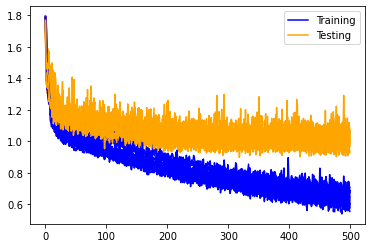

In [41]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

In [42]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.0101308166980743
mean accuracy:  0.6013257920742034


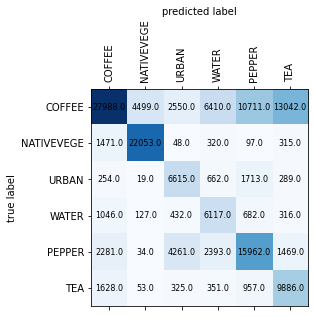

In [43]:
plot_confusion_matrix(conf_matrix, labels)

In [45]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Recalls: ", recall)
print("F-Score: ", fscore)

Precisions:  [0.8073151  0.82333396 0.4648303  0.37636129 0.52991169 0.3904886 ]
Recalls:  [0.4292638  0.9073815  0.69252513 0.70149083 0.60462121 0.74893939]
F-Score:  [0.56049986 0.86331696 0.5562797  0.48988908 0.56480662 0.51333178]


### 11x11px

In [13]:
NB_PIXEL_AROUND=5

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

In [14]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    Conv2D(filters=8, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=8, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_2 (Rescaling)      (None, 11, 11, 3)         0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 11, 11, 8)         224       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 11, 11, 8)         584       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 5, 5, 8)           0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 5, 5, 16)          528       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 5, 5, 16)          1040      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 2, 2, 16)         

Epoch 46/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0271 - accuracy: 0.5043 - val_loss: 1.1961 - val_accuracy: 0.4694
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9882 - accuracy: 0.5227 - val_loss: 1.0990 - val_accuracy: 0.5404
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0189 - accuracy: 0.5178 - val_loss: 1.0718 - val_accuracy: 0.5423
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0202 - accuracy: 0.5206 - val_loss: 1.0904 - val_accuracy: 0.5359
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9759 - accuracy: 0.5080 - val_loss: 1.1486 - val_accuracy: 0.4857
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9894 - accuracy: 0.5214 - val_loss: 1.1385 - val_accuracy: 0.5111
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9423 - accuracy: 0.4888 - val_loss: 1.1356 - val_accuracy: 0.5330
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9117 - accuracy: 0.5744 - val_loss: 0.9769 - val_accuracy: 0.5900
Epoch 161/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8384 - accuracy: 0.5861 - val_loss: 1.0198 - val_accuracy: 0.5610
Epoch 162/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8011 - accuracy: 0.5857 - val_loss: 1.0118 - val_accuracy: 0.5710
Epoch 163/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8626 - accuracy: 0.5793 - val_loss: 1.0066 - val_accuracy: 0.5719
Epoch 164/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8553 - accuracy: 0.5818 - val_loss: 0.9839 - val_accuracy: 0.5827
Epoch 165/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8868 - accuracy: 0.5722 - val_loss: 0.9987 - val_accuracy: 0.5700
Epoch 166/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8568 - accuracy: 0.5743 - val_loss: 1.0540 - val_accuracy: 0.5419
Epoch 167/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8155 - accuracy: 0.5615 - val_loss: 0.9633 - val_accuracy: 0.5886
Epoch 275/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7452 - accuracy: 0.6049 - val_loss: 0.9798 - val_accuracy: 0.5827
Epoch 276/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8372 - accuracy: 0.5671 - val_loss: 1.0498 - val_accuracy: 0.5428
Epoch 277/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8579 - accuracy: 0.5877 - val_loss: 0.9684 - val_accuracy: 0.5900
Epoch 278/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7867 - accuracy: 0.6222 - val_loss: 1.0336 - val_accuracy: 0.5658
Epoch 279/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7796 - accuracy: 0.5870 - val_loss: 0.9779 - val_accuracy: 0.5948
Epoch 280/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8468 - accuracy: 0.5744 - val_loss: 1.0482 - val_accuracy: 0.5428
Epoch 281/500

57/57 [==============================] - 1s 9ms/step - loss: 0.7883 - accuracy: 0.5833 - val_loss: 0.9327 - val_accuracy: 0.6043
Epoch 389/500
57/57 [==============================] - 1s 9ms/step - loss: 0.7231 - accuracy: 0.6074 - val_loss: 0.9636 - val_accuracy: 0.5941
Epoch 390/500
57/57 [==============================] - 1s 9ms/step - loss: 0.7731 - accuracy: 0.6163 - val_loss: 0.9792 - val_accuracy: 0.5824
Epoch 391/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7923 - accuracy: 0.6143 - val_loss: 0.9825 - val_accuracy: 0.5695
Epoch 392/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7186 - accuracy: 0.6219 - val_loss: 0.9784 - val_accuracy: 0.5696
Epoch 393/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7607 - accuracy: 0.5859 - val_loss: 0.9691 - val_accuracy: 0.5745
Epoch 394/500
57/57 [==============================] - 1s 9ms/step - loss: 0.7297 - accuracy: 0.6237 - val_loss: 0.9830 - val_accuracy: 0.5827
Epoch 395/500


Fold  2 :
--------

Epoch 1/500
57/57 [==============================] - 1s 10ms/step - loss: 1.8119 - accuracy: 0.1516 - val_loss: 1.7830 - val_accuracy: 0.1082
Epoch 2/500
57/57 [==============================] - 1s 9ms/step - loss: 1.7243 - accuracy: 0.2325 - val_loss: 1.5967 - val_accuracy: 0.2496
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4972 - accuracy: 0.2764 - val_loss: 1.6058 - val_accuracy: 0.3308
Epoch 4/500
57/57 [==============================] - 0s 9ms/step - loss: 1.3906 - accuracy: 0.3235 - val_loss: 1.4607 - val_accuracy: 0.2975
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3656 - accuracy: 0.3507 - val_loss: 1.4136 - val_accuracy: 0.3934
Epoch 6/500
57/57 [==============================] - 0s 9ms/step - loss: 1.4260 - accuracy: 0.3021 - val_loss: 1.3708 - val_accuracy: 0.4537
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2934 - accuracy: 0.4366 - val_loss: 1.3170 - val_accuracy

Epoch 116/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9080 - accuracy: 0.5579 - val_loss: 1.0972 - val_accuracy: 0.5422
Epoch 117/500
57/57 [==============================] - 0s 9ms/step - loss: 1.0307 - accuracy: 0.5084 - val_loss: 1.1262 - val_accuracy: 0.5089
Epoch 118/500
57/57 [==============================] - 1s 9ms/step - loss: 0.9922 - accuracy: 0.5310 - val_loss: 1.0407 - val_accuracy: 0.5661
Epoch 119/500
57/57 [==============================] - 1s 9ms/step - loss: 0.9749 - accuracy: 0.5214 - val_loss: 1.0692 - val_accuracy: 0.5467
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9912 - accuracy: 0.5251 - val_loss: 1.1063 - val_accuracy: 0.5047
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9904 - accuracy: 0.5105 - val_loss: 1.1121 - val_accuracy: 0.5380
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9125 - accuracy: 0.5465 - val_loss: 1.0627 - val_accuracy: 0.5475

57/57 [==============================] - 0s 8ms/step - loss: 0.8871 - accuracy: 0.5587 - val_loss: 0.9854 - val_accuracy: 0.5758
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8638 - accuracy: 0.5515 - val_loss: 0.9824 - val_accuracy: 0.5808
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8409 - accuracy: 0.5760 - val_loss: 1.0048 - val_accuracy: 0.5914
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8812 - accuracy: 0.5526 - val_loss: 1.1015 - val_accuracy: 0.5090
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9668 - accuracy: 0.5389 - val_loss: 1.0339 - val_accuracy: 0.5663
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8870 - accuracy: 0.5421 - val_loss: 0.9936 - val_accuracy: 0.5763
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8794 - accuracy: 0.5452 - val_loss: 1.1087 - val_accuracy: 0.5286
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8588 - accuracy: 0.5455 - val_loss: 1.0344 - val_accuracy: 0.5740
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9283 - accuracy: 0.5347 - val_loss: 1.0703 - val_accuracy: 0.5589
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8392 - accuracy: 0.5607 - val_loss: 0.9881 - val_accuracy: 0.5924
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8273 - accuracy: 0.5576 - val_loss: 0.9990 - val_accuracy: 0.5814
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7805 - accuracy: 0.5683 - val_loss: 1.0156 - val_accuracy: 0.5739
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7964 - accuracy: 0.5725 - val_loss: 1.0023 - val_accuracy: 0.5854
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8105 - accuracy: 0.5810 - val_loss: 1.0642 - val_accuracy: 0.5338
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7284 - accuracy: 0.5817 - val_loss: 0.9984 - val_accuracy: 0.5775
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7464 - accuracy: 0.5679 - val_loss: 1.0091 - val_accuracy: 0.5780
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8496 - accuracy: 0.5305 - val_loss: 1.0634 - val_accuracy: 0.5410
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7765 - accuracy: 0.5623 - val_loss: 1.0954 - val_accuracy: 0.5422
Epoch 462/500
57/57 [==============================] - 1s 9ms/step - loss: 0.8040 - accuracy: 0.5617 - val_loss: 0.9723 - val_accuracy: 0.6001
Epoch 463/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7802 - accuracy: 0.5898 - val_loss: 1.0035 - val_accuracy: 0.5838
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8190 - accuracy: 0.5538 - val_loss: 1.0058 - val_accuracy: 0.6017
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0151 - accuracy: 0.5264 - val_loss: 1.1458 - val_accuracy: 0.4915
Epoch 69/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0035 - accuracy: 0.5096 - val_loss: 1.0832 - val_accuracy: 0.5603
Epoch 70/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0055 - accuracy: 0.5221 - val_loss: 1.0779 - val_accuracy: 0.5626
Epoch 71/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0255 - accuracy: 0.5225 - val_loss: 1.1152 - val_accuracy: 0.5298
Epoch 72/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0080 - accuracy: 0.5030 - val_loss: 1.1774 - val_accuracy: 0.4691
Epoch 73/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0130 - accuracy: 0.4987 - val_loss: 1.1956 - val_accuracy: 0.5145
Epoch 74/500
57/57 [==============================] - 1s 9ms/step - loss: 1.0247 - accuracy: 0.5003 - val_loss: 1.0789 - val_accuracy: 0.5448
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9336 - accuracy: 0.5794 - val_loss: 1.0400 - val_accuracy: 0.5754
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9172 - accuracy: 0.5595 - val_loss: 0.9931 - val_accuracy: 0.6094
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9399 - accuracy: 0.5638 - val_loss: 1.0956 - val_accuracy: 0.5565
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8812 - accuracy: 0.5803 - val_loss: 1.0291 - val_accuracy: 0.5794
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9262 - accuracy: 0.5685 - val_loss: 0.9981 - val_accuracy: 0.6020
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9190 - accuracy: 0.6177 - val_loss: 1.0761 - val_accuracy: 0.5765
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9230 - accuracy: 0.5683 - val_loss: 1.0292 - val_accuracy: 0.5819
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8164 - accuracy: 0.6118 - val_loss: 0.9648 - val_accuracy: 0.6083
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7887 - accuracy: 0.6038 - val_loss: 0.9592 - val_accuracy: 0.6206
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7577 - accuracy: 0.6100 - val_loss: 1.0534 - val_accuracy: 0.5580
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8735 - accuracy: 0.5672 - val_loss: 1.0045 - val_accuracy: 0.6017
Epoch 300/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7915 - accuracy: 0.6051 - val_loss: 1.0135 - val_accuracy: 0.5925
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8301 - accuracy: 0.6135 - val_loss: 0.9774 - val_accuracy: 0.5955
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8330 - accuracy: 0.5964 - val_loss: 0.9963 - val_accuracy: 0.5960
Epoch 303/500

57/57 [==============================] - 1s 9ms/step - loss: 0.7655 - accuracy: 0.5949 - val_loss: 0.9990 - val_accuracy: 0.6138
Epoch 411/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7566 - accuracy: 0.6060 - val_loss: 1.0073 - val_accuracy: 0.5977
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7537 - accuracy: 0.6209 - val_loss: 0.9226 - val_accuracy: 0.6316
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7775 - accuracy: 0.6231 - val_loss: 0.9732 - val_accuracy: 0.6127
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7649 - accuracy: 0.5968 - val_loss: 0.9386 - val_accuracy: 0.6280
Epoch 415/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7320 - accuracy: 0.6619 - val_loss: 0.9654 - val_accuracy: 0.6198
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7530 - accuracy: 0.6156 - val_loss: 0.9599 - val_accuracy: 0.6168
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.3283 - accuracy: 0.4064 - val_loss: 1.2715 - val_accuracy: 0.4374
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3113 - accuracy: 0.4129 - val_loss: 1.2352 - val_accuracy: 0.4022
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2600 - accuracy: 0.4273 - val_loss: 1.2295 - val_accuracy: 0.3855
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2000 - accuracy: 0.4203 - val_loss: 1.1966 - val_accuracy: 0.4241
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1749 - accuracy: 0.4938 - val_loss: 1.2245 - val_accuracy: 0.4301
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1008 - accuracy: 0.4246 - val_loss: 1.3325 - val_accuracy: 0.3932
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1759 - accuracy: 0.3966 - val_loss: 1.2271 - val_accuracy: 0.4114
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0397 - accuracy: 0.5312 - val_loss: 1.0923 - val_accuracy: 0.5824
Epoch 78/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1153 - accuracy: 0.5212 - val_loss: 1.1076 - val_accuracy: 0.5221
Epoch 79/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0459 - accuracy: 0.5279 - val_loss: 1.1166 - val_accuracy: 0.5669
Epoch 80/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0669 - accuracy: 0.4991 - val_loss: 1.0622 - val_accuracy: 0.5570
Epoch 81/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0003 - accuracy: 0.5656 - val_loss: 1.1027 - val_accuracy: 0.5713
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0051 - accuracy: 0.5345 - val_loss: 1.1155 - val_accuracy: 0.5437
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0339 - accuracy: 0.5282 - val_loss: 1.0732 - val_accuracy: 0.5811
Epoch 

57/57 [==============================] - 1s 9ms/step - loss: 0.9312 - accuracy: 0.5685 - val_loss: 1.0439 - val_accuracy: 0.5905
Epoch 192/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9257 - accuracy: 0.5724 - val_loss: 1.0203 - val_accuracy: 0.6046
Epoch 193/500
57/57 [==============================] - 1s 9ms/step - loss: 0.9392 - accuracy: 0.5874 - val_loss: 1.0162 - val_accuracy: 0.6050
Epoch 194/500
57/57 [==============================] - 1s 9ms/step - loss: 0.9366 - accuracy: 0.5712 - val_loss: 1.0951 - val_accuracy: 0.5759
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9161 - accuracy: 0.5857 - val_loss: 0.9905 - val_accuracy: 0.6100
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9261 - accuracy: 0.5694 - val_loss: 1.0170 - val_accuracy: 0.6035
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9265 - accuracy: 0.5738 - val_loss: 0.9869 - val_accuracy: 0.6297
Epoch 198/500

57/57 [==============================] - 0s 9ms/step - loss: 0.8428 - accuracy: 0.5936 - val_loss: 1.0603 - val_accuracy: 0.5593
Epoch 306/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8214 - accuracy: 0.6007 - val_loss: 1.0045 - val_accuracy: 0.6009
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8647 - accuracy: 0.6153 - val_loss: 0.9887 - val_accuracy: 0.6217
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8574 - accuracy: 0.6122 - val_loss: 0.9951 - val_accuracy: 0.6166
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8479 - accuracy: 0.5789 - val_loss: 1.0115 - val_accuracy: 0.5975
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8693 - accuracy: 0.6197 - val_loss: 0.9971 - val_accuracy: 0.6250
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8379 - accuracy: 0.6037 - val_loss: 1.0524 - val_accuracy: 0.5948
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8365 - accuracy: 0.6105 - val_loss: 1.0319 - val_accuracy: 0.5971
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8237 - accuracy: 0.6077 - val_loss: 0.9468 - val_accuracy: 0.6363
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8147 - accuracy: 0.6258 - val_loss: 0.9697 - val_accuracy: 0.6257
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8197 - accuracy: 0.6127 - val_loss: 0.9386 - val_accuracy: 0.6431
Epoch 423/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7861 - accuracy: 0.6314 - val_loss: 0.9973 - val_accuracy: 0.6130
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8016 - accuracy: 0.6253 - val_loss: 0.9574 - val_accuracy: 0.6352
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7900 - accuracy: 0.6318 - val_loss: 0.9644 - val_accuracy: 0.6311
Epoch 426/500

57/57 [==============================] - 0s 8ms/step - loss: 1.2408 - accuracy: 0.3916 - val_loss: 1.2320 - val_accuracy: 0.4188
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2080 - accuracy: 0.3894 - val_loss: 1.2875 - val_accuracy: 0.3639
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1955 - accuracy: 0.3775 - val_loss: 1.2471 - val_accuracy: 0.3851
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1832 - accuracy: 0.3805 - val_loss: 1.3354 - val_accuracy: 0.3556
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1798 - accuracy: 0.3873 - val_loss: 1.2422 - val_accuracy: 0.3893
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1741 - accuracy: 0.4032 - val_loss: 1.2914 - val_accuracy: 0.3530
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1678 - accuracy: 0.3692 - val_loss: 1.3615 - val_accuracy: 0.3249
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9761 - accuracy: 0.5530 - val_loss: 1.1134 - val_accuracy: 0.5233
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0189 - accuracy: 0.5312 - val_loss: 1.2279 - val_accuracy: 0.4853
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9906 - accuracy: 0.5475 - val_loss: 1.0721 - val_accuracy: 0.5612
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9617 - accuracy: 0.5369 - val_loss: 1.0810 - val_accuracy: 0.5502
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0536 - accuracy: 0.5419 - val_loss: 1.1666 - val_accuracy: 0.5017
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0003 - accuracy: 0.5168 - val_loss: 1.1217 - val_accuracy: 0.5296
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9953 - accuracy: 0.5521 - val_loss: 1.1002 - val_accuracy: 0.5392
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8515 - accuracy: 0.6004 - val_loss: 1.0335 - val_accuracy: 0.5589
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8191 - accuracy: 0.5827 - val_loss: 1.0339 - val_accuracy: 0.5630
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7964 - accuracy: 0.5686 - val_loss: 1.0942 - val_accuracy: 0.5213
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8643 - accuracy: 0.5865 - val_loss: 0.9986 - val_accuracy: 0.5886
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8254 - accuracy: 0.6082 - val_loss: 1.0027 - val_accuracy: 0.5917
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8141 - accuracy: 0.6005 - val_loss: 1.0164 - val_accuracy: 0.5752
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8451 - accuracy: 0.5944 - val_loss: 1.0432 - val_accuracy: 0.5645
Epoch 207/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7655 - accuracy: 0.6272 - val_loss: 1.0674 - val_accuracy: 0.5490
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7605 - accuracy: 0.5960 - val_loss: 1.0113 - val_accuracy: 0.5907
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7864 - accuracy: 0.6094 - val_loss: 0.9942 - val_accuracy: 0.6021
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7468 - accuracy: 0.6087 - val_loss: 0.9553 - val_accuracy: 0.6103
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7845 - accuracy: 0.5998 - val_loss: 0.9402 - val_accuracy: 0.6201
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7837 - accuracy: 0.6507 - val_loss: 1.0071 - val_accuracy: 0.5925
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7414 - accuracy: 0.6267 - val_loss: 1.0116 - val_accuracy: 0.5867
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7102 - accuracy: 0.6461 - val_loss: 0.9915 - val_accuracy: 0.6080
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7138 - accuracy: 0.6284 - val_loss: 0.9678 - val_accuracy: 0.6175
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7313 - accuracy: 0.6241 - val_loss: 0.9478 - val_accuracy: 0.6265
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7188 - accuracy: 0.6432 - val_loss: 0.9433 - val_accuracy: 0.6253
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7026 - accuracy: 0.6372 - val_loss: 0.9910 - val_accuracy: 0.6168
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7273 - accuracy: 0.6204 - val_loss: 0.9573 - val_accuracy: 0.6246
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6901 - accuracy: 0.6460 - val_loss: 1.0330 - val_accuracy: 0.5847
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 1.2137 - accuracy: 0.4069 - val_loss: 1.2591 - val_accuracy: 0.4051
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2782 - accuracy: 0.3648 - val_loss: 1.2732 - val_accuracy: 0.3786
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1673 - accuracy: 0.4189 - val_loss: 1.2588 - val_accuracy: 0.4218
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2023 - accuracy: 0.4425 - val_loss: 1.2713 - val_accuracy: 0.4048
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1910 - accuracy: 0.3997 - val_loss: 1.2842 - val_accuracy: 0.3897
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1762 - accuracy: 0.4309 - val_loss: 1.2552 - val_accuracy: 0.4380
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1917 - accuracy: 0.4656 - val_loss: 1.3633 - val_accuracy: 0.3492
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0217 - accuracy: 0.5017 - val_loss: 1.2452 - val_accuracy: 0.4517
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0159 - accuracy: 0.5241 - val_loss: 1.0729 - val_accuracy: 0.5765
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0308 - accuracy: 0.5417 - val_loss: 1.1236 - val_accuracy: 0.5538
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0212 - accuracy: 0.5386 - val_loss: 1.1368 - val_accuracy: 0.5442
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0493 - accuracy: 0.5426 - val_loss: 1.0965 - val_accuracy: 0.5540
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9826 - accuracy: 0.5425 - val_loss: 1.0802 - val_accuracy: 0.5658
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9833 - accuracy: 0.5567 - val_loss: 1.0385 - val_accuracy: 0.5965
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.9002 - accuracy: 0.5876 - val_loss: 1.0082 - val_accuracy: 0.5965
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8254 - accuracy: 0.5986 - val_loss: 1.0611 - val_accuracy: 0.5825
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8361 - accuracy: 0.5950 - val_loss: 1.0785 - val_accuracy: 0.5818
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8909 - accuracy: 0.6030 - val_loss: 1.1137 - val_accuracy: 0.5500
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8119 - accuracy: 0.5905 - val_loss: 1.0433 - val_accuracy: 0.5856
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8480 - accuracy: 0.6035 - val_loss: 1.0483 - val_accuracy: 0.5822
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9363 - accuracy: 0.5675 - val_loss: 1.0376 - val_accuracy: 0.5813
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7397 - accuracy: 0.6143 - val_loss: 0.9907 - val_accuracy: 0.6043
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7074 - accuracy: 0.6422 - val_loss: 1.0470 - val_accuracy: 0.5793
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7337 - accuracy: 0.5942 - val_loss: 0.9716 - val_accuracy: 0.6312
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8323 - accuracy: 0.6251 - val_loss: 1.0489 - val_accuracy: 0.5793
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7549 - accuracy: 0.5934 - val_loss: 0.9961 - val_accuracy: 0.6132
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8302 - accuracy: 0.5771 - val_loss: 1.0138 - val_accuracy: 0.5911
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7702 - accuracy: 0.6040 - val_loss: 1.0591 - val_accuracy: 0.5854
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7072 - accuracy: 0.6176 - val_loss: 0.9801 - val_accuracy: 0.6187
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7441 - accuracy: 0.6005 - val_loss: 1.0124 - val_accuracy: 0.6020
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7362 - accuracy: 0.6251 - val_loss: 0.9695 - val_accuracy: 0.6104
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7494 - accuracy: 0.6219 - val_loss: 1.0175 - val_accuracy: 0.5873
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7840 - accuracy: 0.6201 - val_loss: 0.9893 - val_accuracy: 0.6126
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6927 - accuracy: 0.6143 - val_loss: 0.9859 - val_accuracy: 0.6115
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6718 - accuracy: 0.6369 - val_loss: 1.0240 - val_accuracy: 0.5962
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0687 - accuracy: 0.4631 - val_loss: 1.4406 - val_accuracy: 0.3060
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1653 - accuracy: 0.4111 - val_loss: 1.1774 - val_accuracy: 0.4623
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9942 - accuracy: 0.4900 - val_loss: 1.1120 - val_accuracy: 0.5018
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0352 - accuracy: 0.4706 - val_loss: 1.0798 - val_accuracy: 0.5316
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0167 - accuracy: 0.4730 - val_loss: 1.0875 - val_accuracy: 0.5332
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0609 - accuracy: 0.4989 - val_loss: 1.1001 - val_accuracy: 0.4942
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9820 - accuracy: 0.4852 - val_loss: 1.1154 - val_accuracy: 0.4919
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9300 - accuracy: 0.5054 - val_loss: 1.1021 - val_accuracy: 0.5255
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9394 - accuracy: 0.5029 - val_loss: 1.0233 - val_accuracy: 0.5645
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9580 - accuracy: 0.5340 - val_loss: 1.0959 - val_accuracy: 0.5062
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9624 - accuracy: 0.5140 - val_loss: 1.0812 - val_accuracy: 0.5328
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9924 - accuracy: 0.4966 - val_loss: 1.0396 - val_accuracy: 0.5532
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9041 - accuracy: 0.5058 - val_loss: 1.0779 - val_accuracy: 0.5296
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9957 - accuracy: 0.4878 - val_loss: 1.0743 - val_accuracy: 0.5243

57/57 [==============================] - 0s 8ms/step - loss: 0.8627 - accuracy: 0.5657 - val_loss: 1.0256 - val_accuracy: 0.5644
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8627 - accuracy: 0.5978 - val_loss: 1.0015 - val_accuracy: 0.5918
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8379 - accuracy: 0.5796 - val_loss: 1.0303 - val_accuracy: 0.5585
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8912 - accuracy: 0.5295 - val_loss: 1.0203 - val_accuracy: 0.5543
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8595 - accuracy: 0.5550 - val_loss: 1.0080 - val_accuracy: 0.5614
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8217 - accuracy: 0.5757 - val_loss: 1.0391 - val_accuracy: 0.5580
Epoch 224/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8717 - accuracy: 0.5738 - val_loss: 1.0042 - val_accuracy: 0.5790
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7859 - accuracy: 0.5859 - val_loss: 1.1381 - val_accuracy: 0.5472
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8108 - accuracy: 0.5926 - val_loss: 1.0140 - val_accuracy: 0.5809
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7605 - accuracy: 0.5907 - val_loss: 1.0328 - val_accuracy: 0.5797
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8561 - accuracy: 0.5678 - val_loss: 0.9603 - val_accuracy: 0.6228
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7847 - accuracy: 0.6121 - val_loss: 1.0677 - val_accuracy: 0.5599
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7674 - accuracy: 0.6027 - val_loss: 1.0037 - val_accuracy: 0.5990
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7840 - accuracy: 0.5977 - val_loss: 1.0598 - val_accuracy: 0.5650
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7418 - accuracy: 0.5836 - val_loss: 1.0372 - val_accuracy: 0.5782
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7516 - accuracy: 0.6132 - val_loss: 0.9880 - val_accuracy: 0.6009
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7098 - accuracy: 0.6317 - val_loss: 0.9866 - val_accuracy: 0.5974
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.6428 - val_loss: 1.0215 - val_accuracy: 0.5926
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7214 - accuracy: 0.6066 - val_loss: 1.0117 - val_accuracy: 0.5910
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7010 - accuracy: 0.6173 - val_loss: 1.0413 - val_accuracy: 0.5684
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6802 - accuracy: 0.6120 - val_loss: 0.9703 - val_accuracy: 0.6209
Epoch 453/500


Fold  3 :
--------

Epoch 1/500
57/57 [==============================] - 1s 10ms/step - loss: 1.7621 - accuracy: 0.1006 - val_loss: 1.7939 - val_accuracy: 0.0652
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.7789 - accuracy: 0.1095 - val_loss: 1.7743 - val_accuracy: 0.1811
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5279 - accuracy: 0.2894 - val_loss: 1.4273 - val_accuracy: 0.3376
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3691 - accuracy: 0.3586 - val_loss: 1.3722 - val_accuracy: 0.4061
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2893 - accuracy: 0.4158 - val_loss: 1.3887 - val_accuracy: 0.3745
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3493 - accuracy: 0.3786 - val_loss: 1.2707 - val_accuracy: 0.4238
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2417 - accuracy: 0.3946 - val_loss: 1.3805 - val_accuracy

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9323 - accuracy: 0.5628 - val_loss: 1.0650 - val_accuracy: 0.5646
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9888 - accuracy: 0.5399 - val_loss: 1.0869 - val_accuracy: 0.5254
Epoch 118/500
57/57 [==============================] - 0s 9ms/step - loss: 1.0040 - accuracy: 0.5381 - val_loss: 1.1123 - val_accuracy: 0.5427
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9662 - accuracy: 0.5549 - val_loss: 1.0519 - val_accuracy: 0.5773
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9421 - accuracy: 0.5772 - val_loss: 1.0215 - val_accuracy: 0.5925
Epoch 121/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8853 - accuracy: 0.5908 - val_loss: 1.0910 - val_accuracy: 0.5620
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9838 - accuracy: 0.5776 - val_loss: 1.1769 - val_accuracy: 0.5146

57/57 [==============================] - 0s 8ms/step - loss: 0.9311 - accuracy: 0.5913 - val_loss: 1.0805 - val_accuracy: 0.5604
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8173 - accuracy: 0.6244 - val_loss: 1.0367 - val_accuracy: 0.5865
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9164 - accuracy: 0.5710 - val_loss: 0.9968 - val_accuracy: 0.6087
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8928 - accuracy: 0.5869 - val_loss: 1.0494 - val_accuracy: 0.5820
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8777 - accuracy: 0.5995 - val_loss: 1.0050 - val_accuracy: 0.5907
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8282 - accuracy: 0.6066 - val_loss: 1.0649 - val_accuracy: 0.5712
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8287 - accuracy: 0.5978 - val_loss: 1.0811 - val_accuracy: 0.5527
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7603 - accuracy: 0.6181 - val_loss: 1.0340 - val_accuracy: 0.6007
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7881 - accuracy: 0.6078 - val_loss: 0.9642 - val_accuracy: 0.6231
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7109 - accuracy: 0.6587 - val_loss: 0.9744 - val_accuracy: 0.6198
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8033 - accuracy: 0.6368 - val_loss: 0.9893 - val_accuracy: 0.6119
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7592 - accuracy: 0.6478 - val_loss: 0.9990 - val_accuracy: 0.6134
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7438 - accuracy: 0.6453 - val_loss: 1.0450 - val_accuracy: 0.5883
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8032 - accuracy: 0.6215 - val_loss: 0.9632 - val_accuracy: 0.6224
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7363 - accuracy: 0.6481 - val_loss: 1.0187 - val_accuracy: 0.6202
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6909 - accuracy: 0.6507 - val_loss: 0.9884 - val_accuracy: 0.6304
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7868 - accuracy: 0.6421 - val_loss: 1.0014 - val_accuracy: 0.6219
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7372 - accuracy: 0.6338 - val_loss: 0.9565 - val_accuracy: 0.6289
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7156 - accuracy: 0.6380 - val_loss: 0.9616 - val_accuracy: 0.6243
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7081 - accuracy: 0.6563 - val_loss: 1.0202 - val_accuracy: 0.6069
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7200 - accuracy: 0.6388 - val_loss: 0.9518 - val_accuracy: 0.6198
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0474 - accuracy: 0.5322 - val_loss: 1.0833 - val_accuracy: 0.5614
Epoch 69/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0241 - accuracy: 0.5793 - val_loss: 1.0710 - val_accuracy: 0.5682
Epoch 70/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9992 - accuracy: 0.5334 - val_loss: 1.0972 - val_accuracy: 0.5495
Epoch 71/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9805 - accuracy: 0.5547 - val_loss: 1.2226 - val_accuracy: 0.4774
Epoch 72/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0173 - accuracy: 0.5209 - val_loss: 1.1030 - val_accuracy: 0.5510
Epoch 73/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0586 - accuracy: 0.5527 - val_loss: 1.1247 - val_accuracy: 0.5413
Epoch 74/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9722 - accuracy: 0.5482 - val_loss: 1.0954 - val_accuracy: 0.5546
Epoch 

57/57 [==============================] - 1s 9ms/step - loss: 0.9907 - accuracy: 0.5229 - val_loss: 1.0833 - val_accuracy: 0.5489
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9128 - accuracy: 0.5529 - val_loss: 1.0476 - val_accuracy: 0.5616
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9408 - accuracy: 0.5316 - val_loss: 1.0605 - val_accuracy: 0.5528
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0165 - accuracy: 0.5448 - val_loss: 1.0474 - val_accuracy: 0.5701
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9704 - accuracy: 0.5641 - val_loss: 1.0846 - val_accuracy: 0.5392
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9443 - accuracy: 0.5217 - val_loss: 1.0577 - val_accuracy: 0.5547
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8989 - accuracy: 0.5522 - val_loss: 1.0569 - val_accuracy: 0.5566
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8730 - accuracy: 0.5654 - val_loss: 1.0212 - val_accuracy: 0.5687
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8901 - accuracy: 0.5781 - val_loss: 1.0018 - val_accuracy: 0.5751
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8850 - accuracy: 0.5609 - val_loss: 1.0150 - val_accuracy: 0.5750
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8728 - accuracy: 0.5654 - val_loss: 1.0552 - val_accuracy: 0.5483
Epoch 300/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8421 - accuracy: 0.5622 - val_loss: 0.9911 - val_accuracy: 0.6032
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8386 - accuracy: 0.5687 - val_loss: 1.0638 - val_accuracy: 0.5640
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9035 - accuracy: 0.5531 - val_loss: 1.0138 - val_accuracy: 0.5800
Epoch 303/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8259 - accuracy: 0.5765 - val_loss: 1.0117 - val_accuracy: 0.5968
Epoch 411/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7908 - accuracy: 0.6145 - val_loss: 1.0093 - val_accuracy: 0.5869
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8195 - accuracy: 0.5894 - val_loss: 0.9921 - val_accuracy: 0.5852
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8116 - accuracy: 0.5860 - val_loss: 1.0058 - val_accuracy: 0.5778
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8209 - accuracy: 0.5870 - val_loss: 0.9669 - val_accuracy: 0.6020
Epoch 415/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7788 - accuracy: 0.5984 - val_loss: 0.9974 - val_accuracy: 0.5725
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7417 - accuracy: 0.6002 - val_loss: 1.0225 - val_accuracy: 0.5671
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.2606 - accuracy: 0.3244 - val_loss: 1.2231 - val_accuracy: 0.3659
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1564 - accuracy: 0.3913 - val_loss: 1.2239 - val_accuracy: 0.3860
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1382 - accuracy: 0.3852 - val_loss: 1.3202 - val_accuracy: 0.3134
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1634 - accuracy: 0.3772 - val_loss: 1.2099 - val_accuracy: 0.4343
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1114 - accuracy: 0.4018 - val_loss: 1.2576 - val_accuracy: 0.3828
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1338 - accuracy: 0.3983 - val_loss: 1.1885 - val_accuracy: 0.4333
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1050 - accuracy: 0.4027 - val_loss: 1.3690 - val_accuracy: 0.3998
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9666 - accuracy: 0.5173 - val_loss: 1.1669 - val_accuracy: 0.5037
Epoch 78/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0015 - accuracy: 0.5106 - val_loss: 1.1331 - val_accuracy: 0.5103
Epoch 79/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0333 - accuracy: 0.5203 - val_loss: 1.0933 - val_accuracy: 0.5404
Epoch 80/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9885 - accuracy: 0.5303 - val_loss: 1.1010 - val_accuracy: 0.5264
Epoch 81/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0382 - accuracy: 0.4989 - val_loss: 1.2225 - val_accuracy: 0.4476
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0379 - accuracy: 0.4985 - val_loss: 1.1242 - val_accuracy: 0.5278
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9580 - accuracy: 0.5570 - val_loss: 1.2250 - val_accuracy: 0.4677
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9068 - accuracy: 0.5533 - val_loss: 1.1059 - val_accuracy: 0.5293
Epoch 192/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9110 - accuracy: 0.5316 - val_loss: 1.0548 - val_accuracy: 0.5582
Epoch 193/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9116 - accuracy: 0.5532 - val_loss: 1.1995 - val_accuracy: 0.4920
Epoch 194/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9692 - accuracy: 0.5429 - val_loss: 1.0206 - val_accuracy: 0.6002
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9481 - accuracy: 0.5759 - val_loss: 1.0724 - val_accuracy: 0.5369
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9312 - accuracy: 0.5605 - val_loss: 1.1359 - val_accuracy: 0.4959
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9556 - accuracy: 0.5534 - val_loss: 1.0167 - val_accuracy: 0.5891
Epoch 198/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8978 - accuracy: 0.5908 - val_loss: 1.1093 - val_accuracy: 0.5248
Epoch 306/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8023 - accuracy: 0.6132 - val_loss: 1.0368 - val_accuracy: 0.5596
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8844 - accuracy: 0.5730 - val_loss: 1.0402 - val_accuracy: 0.5678
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8785 - accuracy: 0.5835 - val_loss: 1.0605 - val_accuracy: 0.5508
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8961 - accuracy: 0.5424 - val_loss: 1.0476 - val_accuracy: 0.5557
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9095 - accuracy: 0.5594 - val_loss: 1.0067 - val_accuracy: 0.5766
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8540 - accuracy: 0.5904 - val_loss: 0.9710 - val_accuracy: 0.6031
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7996 - accuracy: 0.5860 - val_loss: 1.0422 - val_accuracy: 0.5845
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8752 - accuracy: 0.5970 - val_loss: 0.9897 - val_accuracy: 0.6070
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7964 - accuracy: 0.6002 - val_loss: 1.0081 - val_accuracy: 0.5945
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8101 - accuracy: 0.5815 - val_loss: 0.9513 - val_accuracy: 0.6270
Epoch 423/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8583 - accuracy: 0.6031 - val_loss: 1.0291 - val_accuracy: 0.5735
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8327 - accuracy: 0.6171 - val_loss: 1.0488 - val_accuracy: 0.5521
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7800 - accuracy: 0.6156 - val_loss: 0.9843 - val_accuracy: 0.5956
Epoch 426/500

57/57 [==============================] - 0s 9ms/step - loss: 0.9907 - accuracy: 0.4937 - val_loss: 1.1646 - val_accuracy: 0.5072
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9554 - accuracy: 0.4980 - val_loss: 1.1244 - val_accuracy: 0.5337
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0536 - accuracy: 0.5134 - val_loss: 1.1762 - val_accuracy: 0.5035
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0062 - accuracy: 0.5077 - val_loss: 1.0889 - val_accuracy: 0.5665
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0064 - accuracy: 0.5167 - val_loss: 1.1251 - val_accuracy: 0.5530
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9562 - accuracy: 0.5395 - val_loss: 1.1001 - val_accuracy: 0.5465
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9361 - accuracy: 0.5391 - val_loss: 1.1058 - val_accuracy: 0.5523
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9383 - accuracy: 0.5568 - val_loss: 1.0580 - val_accuracy: 0.5856
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9306 - accuracy: 0.5441 - val_loss: 1.1221 - val_accuracy: 0.5424
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9200 - accuracy: 0.5502 - val_loss: 1.0686 - val_accuracy: 0.5778
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9316 - accuracy: 0.5747 - val_loss: 1.0888 - val_accuracy: 0.5700
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9076 - accuracy: 0.5741 - val_loss: 1.1301 - val_accuracy: 0.5561
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9079 - accuracy: 0.5580 - val_loss: 1.1062 - val_accuracy: 0.5787
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9552 - accuracy: 0.5642 - val_loss: 1.1517 - val_accuracy: 0.5423
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8281 - accuracy: 0.6004 - val_loss: 1.0745 - val_accuracy: 0.5817
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8145 - accuracy: 0.6062 - val_loss: 1.0331 - val_accuracy: 0.5926
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8836 - accuracy: 0.6054 - val_loss: 1.0364 - val_accuracy: 0.5939
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8129 - accuracy: 0.5809 - val_loss: 1.0460 - val_accuracy: 0.6001
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8474 - accuracy: 0.6103 - val_loss: 1.1750 - val_accuracy: 0.5257
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8355 - accuracy: 0.5816 - val_loss: 1.0674 - val_accuracy: 0.5779
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8419 - accuracy: 0.5709 - val_loss: 1.0544 - val_accuracy: 0.5905
Epoch 207/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7952 - accuracy: 0.6093 - val_loss: 0.9904 - val_accuracy: 0.6048
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8925 - accuracy: 0.6170 - val_loss: 1.0088 - val_accuracy: 0.6142
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8047 - accuracy: 0.6084 - val_loss: 1.0959 - val_accuracy: 0.5480
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8191 - accuracy: 0.5858 - val_loss: 1.0300 - val_accuracy: 0.5969
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8389 - accuracy: 0.6155 - val_loss: 1.0670 - val_accuracy: 0.5625
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8012 - accuracy: 0.6109 - val_loss: 1.0208 - val_accuracy: 0.5954
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8290 - accuracy: 0.6042 - val_loss: 1.0066 - val_accuracy: 0.5930
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7614 - accuracy: 0.6001 - val_loss: 1.0094 - val_accuracy: 0.6064
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7550 - accuracy: 0.6320 - val_loss: 1.0297 - val_accuracy: 0.5965
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7326 - accuracy: 0.6198 - val_loss: 1.0183 - val_accuracy: 0.5869
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7252 - accuracy: 0.6222 - val_loss: 1.0351 - val_accuracy: 0.5831
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7002 - accuracy: 0.6127 - val_loss: 1.0171 - val_accuracy: 0.6225
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8423 - accuracy: 0.5793 - val_loss: 0.9706 - val_accuracy: 0.6228
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7483 - accuracy: 0.5933 - val_loss: 1.0191 - val_accuracy: 0.5833
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0251 - accuracy: 0.4838 - val_loss: 1.1642 - val_accuracy: 0.4684
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0045 - accuracy: 0.4557 - val_loss: 1.1755 - val_accuracy: 0.4843
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0586 - accuracy: 0.4566 - val_loss: 1.1740 - val_accuracy: 0.5164
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1019 - accuracy: 0.4875 - val_loss: 1.1392 - val_accuracy: 0.5012
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0309 - accuracy: 0.4922 - val_loss: 1.1179 - val_accuracy: 0.4930
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0891 - accuracy: 0.4641 - val_loss: 1.1239 - val_accuracy: 0.5205
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1202 - accuracy: 0.4840 - val_loss: 1.2517 - val_accuracy: 0.3655
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9937 - accuracy: 0.5369 - val_loss: 1.0563 - val_accuracy: 0.5735
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9449 - accuracy: 0.5481 - val_loss: 1.0851 - val_accuracy: 0.5748
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9736 - accuracy: 0.5673 - val_loss: 1.0985 - val_accuracy: 0.5387
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9972 - accuracy: 0.5341 - val_loss: 1.1423 - val_accuracy: 0.5474
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0248 - accuracy: 0.5359 - val_loss: 1.0630 - val_accuracy: 0.5546
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9450 - accuracy: 0.5406 - val_loss: 1.0804 - val_accuracy: 0.5637
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9786 - accuracy: 0.5291 - val_loss: 1.0343 - val_accuracy: 0.5876
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.8888 - accuracy: 0.5540 - val_loss: 1.0028 - val_accuracy: 0.5804
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9010 - accuracy: 0.5435 - val_loss: 1.0067 - val_accuracy: 0.5959
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8404 - accuracy: 0.6062 - val_loss: 0.9693 - val_accuracy: 0.5864
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8502 - accuracy: 0.5873 - val_loss: 1.0606 - val_accuracy: 0.5727
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8173 - accuracy: 0.5786 - val_loss: 1.0023 - val_accuracy: 0.5767
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8618 - accuracy: 0.5600 - val_loss: 0.9601 - val_accuracy: 0.6066
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8362 - accuracy: 0.5790 - val_loss: 1.0237 - val_accuracy: 0.5811
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7844 - accuracy: 0.6226 - val_loss: 0.9728 - val_accuracy: 0.5966
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7828 - accuracy: 0.5985 - val_loss: 1.0115 - val_accuracy: 0.5452
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8174 - accuracy: 0.5902 - val_loss: 0.9572 - val_accuracy: 0.6012
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8048 - accuracy: 0.5999 - val_loss: 0.9799 - val_accuracy: 0.6074
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7495 - accuracy: 0.6174 - val_loss: 1.0090 - val_accuracy: 0.5744
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7960 - accuracy: 0.5901 - val_loss: 0.9911 - val_accuracy: 0.5827
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7550 - accuracy: 0.6029 - val_loss: 0.9492 - val_accuracy: 0.6061
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6818 - accuracy: 0.6191 - val_loss: 0.9239 - val_accuracy: 0.6055
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7145 - accuracy: 0.6300 - val_loss: 0.9196 - val_accuracy: 0.6297
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7458 - accuracy: 0.6203 - val_loss: 0.9906 - val_accuracy: 0.5665
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7335 - accuracy: 0.6094 - val_loss: 0.9297 - val_accuracy: 0.6208
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7005 - accuracy: 0.6186 - val_loss: 0.9460 - val_accuracy: 0.5983
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7037 - accuracy: 0.6260 - val_loss: 1.0069 - val_accuracy: 0.5699
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6656 - accuracy: 0.6213 - val_loss: 0.9262 - val_accuracy: 0.6103
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 1.2386 - accuracy: 0.3879 - val_loss: 1.2774 - val_accuracy: 0.4465
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1924 - accuracy: 0.4307 - val_loss: 1.2472 - val_accuracy: 0.3955
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2123 - accuracy: 0.3679 - val_loss: 1.2539 - val_accuracy: 0.4238
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2245 - accuracy: 0.3975 - val_loss: 1.2699 - val_accuracy: 0.3807
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2544 - accuracy: 0.3666 - val_loss: 1.2648 - val_accuracy: 0.4095
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1960 - accuracy: 0.4053 - val_loss: 1.2651 - val_accuracy: 0.4355
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2711 - accuracy: 0.4280 - val_loss: 1.2691 - val_accuracy: 0.4078
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0173 - accuracy: 0.5380 - val_loss: 1.1045 - val_accuracy: 0.5509
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0268 - accuracy: 0.5333 - val_loss: 1.1436 - val_accuracy: 0.5354
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1065 - accuracy: 0.4716 - val_loss: 1.1372 - val_accuracy: 0.5233
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9936 - accuracy: 0.5349 - val_loss: 1.0978 - val_accuracy: 0.5466
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0138 - accuracy: 0.5336 - val_loss: 1.1436 - val_accuracy: 0.5202
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0080 - accuracy: 0.5254 - val_loss: 1.1380 - val_accuracy: 0.5360
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0380 - accuracy: 0.5295 - val_loss: 1.2383 - val_accuracy: 0.4795

57/57 [==============================] - 0s 8ms/step - loss: 0.9400 - accuracy: 0.6004 - val_loss: 1.0269 - val_accuracy: 0.5907
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9139 - accuracy: 0.6083 - val_loss: 1.0559 - val_accuracy: 0.5834
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8997 - accuracy: 0.6043 - val_loss: 1.0618 - val_accuracy: 0.5852
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9047 - accuracy: 0.5717 - val_loss: 1.0864 - val_accuracy: 0.5680
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8693 - accuracy: 0.5975 - val_loss: 0.9906 - val_accuracy: 0.6148
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9166 - accuracy: 0.6183 - val_loss: 1.0619 - val_accuracy: 0.5850
Epoch 224/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9157 - accuracy: 0.5886 - val_loss: 1.0395 - val_accuracy: 0.5852
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8150 - accuracy: 0.6045 - val_loss: 1.1406 - val_accuracy: 0.5460
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8254 - accuracy: 0.5943 - val_loss: 0.9767 - val_accuracy: 0.6130
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8526 - accuracy: 0.6173 - val_loss: 0.9667 - val_accuracy: 0.6212
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7675 - accuracy: 0.6459 - val_loss: 1.0030 - val_accuracy: 0.6054
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8422 - accuracy: 0.6241 - val_loss: 1.0026 - val_accuracy: 0.6020
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8595 - accuracy: 0.6175 - val_loss: 1.0002 - val_accuracy: 0.6046
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8798 - accuracy: 0.6116 - val_loss: 1.0697 - val_accuracy: 0.5903
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7903 - accuracy: 0.6134 - val_loss: 0.9757 - val_accuracy: 0.6247
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7449 - accuracy: 0.6478 - val_loss: 1.0304 - val_accuracy: 0.5883
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7648 - accuracy: 0.5961 - val_loss: 1.0344 - val_accuracy: 0.5883
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7678 - accuracy: 0.6520 - val_loss: 1.0126 - val_accuracy: 0.6098
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7528 - accuracy: 0.6538 - val_loss: 1.0030 - val_accuracy: 0.6123
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7912 - accuracy: 0.6256 - val_loss: 1.0471 - val_accuracy: 0.5920
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7880 - accuracy: 0.6375 - val_loss: 0.9658 - val_accuracy: 0.6221
Epoch 453/500


Fold  4 :
--------

Epoch 1/500
57/57 [==============================] - 1s 10ms/step - loss: 1.8135 - accuracy: 0.1305 - val_loss: 1.7874 - val_accuracy: 0.1654
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.7597 - accuracy: 0.2229 - val_loss: 1.5444 - val_accuracy: 0.2353
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4337 - accuracy: 0.3158 - val_loss: 1.4143 - val_accuracy: 0.2807
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3638 - accuracy: 0.3187 - val_loss: 1.3645 - val_accuracy: 0.3234
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.2399 - accuracy: 0.3925 - val_loss: 1.3471 - val_accuracy: 0.2996
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4331 - accuracy: 0.3089 - val_loss: 1.2768 - val_accuracy: 0.4006
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3058 - accuracy: 0.3712 - val_loss: 1.4105 - val_accuracy

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9755 - accuracy: 0.5468 - val_loss: 1.0572 - val_accuracy: 0.5629
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9926 - accuracy: 0.5401 - val_loss: 1.0444 - val_accuracy: 0.5664
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0416 - accuracy: 0.5215 - val_loss: 1.0618 - val_accuracy: 0.5712
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9892 - accuracy: 0.5593 - val_loss: 1.0322 - val_accuracy: 0.5952
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9922 - accuracy: 0.5281 - val_loss: 1.0489 - val_accuracy: 0.5690
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9693 - accuracy: 0.5709 - val_loss: 1.1093 - val_accuracy: 0.5290
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9517 - accuracy: 0.5522 - val_loss: 1.0211 - val_accuracy: 0.5994

57/57 [==============================] - 0s 8ms/step - loss: 0.8905 - accuracy: 0.5642 - val_loss: 1.0018 - val_accuracy: 0.5544
Epoch 231/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8741 - accuracy: 0.5800 - val_loss: 0.9869 - val_accuracy: 0.5869
Epoch 232/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8459 - accuracy: 0.5721 - val_loss: 0.9848 - val_accuracy: 0.6011
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8865 - accuracy: 0.5852 - val_loss: 1.0917 - val_accuracy: 0.5206
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8839 - accuracy: 0.5645 - val_loss: 1.0196 - val_accuracy: 0.5641
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8859 - accuracy: 0.5644 - val_loss: 1.0356 - val_accuracy: 0.5735
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8401 - accuracy: 0.5946 - val_loss: 1.0119 - val_accuracy: 0.5714
Epoch 237/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7925 - accuracy: 0.5963 - val_loss: 0.9771 - val_accuracy: 0.5947
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7852 - accuracy: 0.6125 - val_loss: 0.9777 - val_accuracy: 0.6066
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7553 - accuracy: 0.5834 - val_loss: 0.9772 - val_accuracy: 0.5951
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8266 - accuracy: 0.5946 - val_loss: 1.0023 - val_accuracy: 0.5693
Epoch 348/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7811 - accuracy: 0.5905 - val_loss: 1.0004 - val_accuracy: 0.5587
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7767 - accuracy: 0.5997 - val_loss: 0.9967 - val_accuracy: 0.5690
Epoch 350/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8204 - accuracy: 0.6048 - val_loss: 0.9778 - val_accuracy: 0.5881
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7452 - accuracy: 0.5817 - val_loss: 0.9792 - val_accuracy: 0.5877
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7203 - accuracy: 0.6311 - val_loss: 1.0091 - val_accuracy: 0.5873
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6986 - accuracy: 0.6327 - val_loss: 0.9539 - val_accuracy: 0.6164
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7117 - accuracy: 0.6347 - val_loss: 0.9306 - val_accuracy: 0.6268
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7347 - accuracy: 0.6211 - val_loss: 1.0034 - val_accuracy: 0.5803
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7526 - accuracy: 0.6000 - val_loss: 1.0678 - val_accuracy: 0.5347
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7184 - accuracy: 0.5816 - val_loss: 0.9937 - val_accuracy: 0.5846
Epoch 465/500

Epoch 68/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0233 - accuracy: 0.4994 - val_loss: 1.1088 - val_accuracy: 0.5195
Epoch 69/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0146 - accuracy: 0.5110 - val_loss: 1.1216 - val_accuracy: 0.5043
Epoch 70/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0120 - accuracy: 0.5134 - val_loss: 1.1125 - val_accuracy: 0.5165
Epoch 71/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0005 - accuracy: 0.5097 - val_loss: 1.1247 - val_accuracy: 0.5073
Epoch 72/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0214 - accuracy: 0.5131 - val_loss: 1.1549 - val_accuracy: 0.4843
Epoch 73/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9976 - accuracy: 0.4931 - val_loss: 1.0782 - val_accuracy: 0.5402
Epoch 74/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0224 - accuracy: 0.5239 - val_loss: 1.3367 - val_accuracy: 0.3959
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.9606 - accuracy: 0.5593 - val_loss: 1.0476 - val_accuracy: 0.5860
Epoch 183/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9878 - accuracy: 0.5524 - val_loss: 1.0319 - val_accuracy: 0.5803
Epoch 184/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8883 - accuracy: 0.5630 - val_loss: 1.1065 - val_accuracy: 0.5433
Epoch 185/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9633 - accuracy: 0.5466 - val_loss: 1.1265 - val_accuracy: 0.5315
Epoch 186/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9108 - accuracy: 0.5287 - val_loss: 1.0474 - val_accuracy: 0.5737
Epoch 187/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9195 - accuracy: 0.5819 - val_loss: 1.0497 - val_accuracy: 0.5703
Epoch 188/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9390 - accuracy: 0.5835 - val_loss: 1.0278 - val_accuracy: 0.5747
Epoch 189/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8443 - accuracy: 0.5784 - val_loss: 1.0322 - val_accuracy: 0.5796
Epoch 297/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9040 - accuracy: 0.5720 - val_loss: 1.0270 - val_accuracy: 0.5843
Epoch 298/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8458 - accuracy: 0.5915 - val_loss: 1.0592 - val_accuracy: 0.5716
Epoch 299/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8790 - accuracy: 0.5928 - val_loss: 1.0334 - val_accuracy: 0.5854
Epoch 300/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9107 - accuracy: 0.5983 - val_loss: 1.0470 - val_accuracy: 0.5812
Epoch 301/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9162 - accuracy: 0.5988 - val_loss: 1.0449 - val_accuracy: 0.5741
Epoch 302/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8723 - accuracy: 0.5695 - val_loss: 1.1309 - val_accuracy: 0.5293
Epoch 303/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8912 - accuracy: 0.5909 - val_loss: 1.0821 - val_accuracy: 0.5808
Epoch 411/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8625 - accuracy: 0.5830 - val_loss: 0.9995 - val_accuracy: 0.6051
Epoch 412/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8616 - accuracy: 0.5929 - val_loss: 1.0260 - val_accuracy: 0.5735
Epoch 413/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8131 - accuracy: 0.5915 - val_loss: 0.9942 - val_accuracy: 0.5967
Epoch 414/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7920 - accuracy: 0.6099 - val_loss: 1.0528 - val_accuracy: 0.5637
Epoch 415/500
57/57 [==============================] - 0s 9ms/step - loss: 0.7859 - accuracy: 0.5966 - val_loss: 1.0355 - val_accuracy: 0.5773
Epoch 416/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8584 - accuracy: 0.5965 - val_loss: 1.0473 - val_accuracy: 0.5735
Epoch 417/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0895 - accuracy: 0.4140 - val_loss: 1.1755 - val_accuracy: 0.5005
Epoch 20/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1579 - accuracy: 0.4133 - val_loss: 1.1824 - val_accuracy: 0.4659
Epoch 21/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0947 - accuracy: 0.4472 - val_loss: 1.1875 - val_accuracy: 0.4381
Epoch 22/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1237 - accuracy: 0.4239 - val_loss: 1.1684 - val_accuracy: 0.4483
Epoch 23/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0894 - accuracy: 0.4502 - val_loss: 1.2154 - val_accuracy: 0.4187
Epoch 24/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0635 - accuracy: 0.4614 - val_loss: 1.2542 - val_accuracy: 0.4299
Epoch 25/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1069 - accuracy: 0.4347 - val_loss: 1.2565 - val_accuracy: 0.4293
Epoch 26/500
57/57 

Epoch 77/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9090 - accuracy: 0.5507 - val_loss: 1.1057 - val_accuracy: 0.5306
Epoch 78/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8968 - accuracy: 0.5316 - val_loss: 1.1430 - val_accuracy: 0.5124
Epoch 79/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9999 - accuracy: 0.5161 - val_loss: 1.1233 - val_accuracy: 0.5247
Epoch 80/500
57/57 [==============================] - 0s 9ms/step - loss: 0.9504 - accuracy: 0.5144 - val_loss: 1.0517 - val_accuracy: 0.5413
Epoch 81/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8925 - accuracy: 0.5627 - val_loss: 1.0738 - val_accuracy: 0.5527
Epoch 82/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9585 - accuracy: 0.5386 - val_loss: 1.0520 - val_accuracy: 0.5601
Epoch 83/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9554 - accuracy: 0.5311 - val_loss: 1.0683 - val_accuracy: 0.5610
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.8130 - accuracy: 0.5712 - val_loss: 1.0413 - val_accuracy: 0.5700
Epoch 192/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8061 - accuracy: 0.5639 - val_loss: 1.0704 - val_accuracy: 0.5597
Epoch 193/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8779 - accuracy: 0.5637 - val_loss: 1.0644 - val_accuracy: 0.5464
Epoch 194/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8159 - accuracy: 0.5766 - val_loss: 1.0601 - val_accuracy: 0.5571
Epoch 195/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8640 - accuracy: 0.5606 - val_loss: 1.0139 - val_accuracy: 0.5805
Epoch 196/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8213 - accuracy: 0.6273 - val_loss: 1.0693 - val_accuracy: 0.5473
Epoch 197/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8629 - accuracy: 0.5995 - val_loss: 1.0495 - val_accuracy: 0.5723
Epoch 198/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7487 - accuracy: 0.6184 - val_loss: 1.0171 - val_accuracy: 0.5934
Epoch 306/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7457 - accuracy: 0.6078 - val_loss: 0.9316 - val_accuracy: 0.6291
Epoch 307/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7316 - accuracy: 0.6345 - val_loss: 1.1038 - val_accuracy: 0.5674
Epoch 308/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7506 - accuracy: 0.6012 - val_loss: 0.9426 - val_accuracy: 0.6200
Epoch 309/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7761 - accuracy: 0.6196 - val_loss: 1.0386 - val_accuracy: 0.5782
Epoch 310/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7236 - accuracy: 0.5981 - val_loss: 1.0576 - val_accuracy: 0.5674
Epoch 311/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8246 - accuracy: 0.5972 - val_loss: 1.0073 - val_accuracy: 0.5980
Epoch 312/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6913 - accuracy: 0.6478 - val_loss: 1.0018 - val_accuracy: 0.6081
Epoch 420/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7233 - accuracy: 0.6184 - val_loss: 1.0058 - val_accuracy: 0.6064
Epoch 421/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7453 - accuracy: 0.6197 - val_loss: 1.0312 - val_accuracy: 0.5880
Epoch 422/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6994 - accuracy: 0.6123 - val_loss: 0.9913 - val_accuracy: 0.5986
Epoch 423/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7180 - accuracy: 0.6300 - val_loss: 0.9656 - val_accuracy: 0.6223
Epoch 424/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7294 - accuracy: 0.6349 - val_loss: 1.0130 - val_accuracy: 0.5977
Epoch 425/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7252 - accuracy: 0.6349 - val_loss: 1.0532 - val_accuracy: 0.5832
Epoch 426/500

57/57 [==============================] - 0s 8ms/step - loss: 1.1228 - accuracy: 0.4184 - val_loss: 1.1379 - val_accuracy: 0.4447
Epoch 29/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0391 - accuracy: 0.4781 - val_loss: 1.1534 - val_accuracy: 0.4776
Epoch 30/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0282 - accuracy: 0.5051 - val_loss: 1.1576 - val_accuracy: 0.4791
Epoch 31/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0613 - accuracy: 0.4693 - val_loss: 1.1829 - val_accuracy: 0.5048
Epoch 32/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0718 - accuracy: 0.4664 - val_loss: 1.1445 - val_accuracy: 0.5331
Epoch 33/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1501 - accuracy: 0.4997 - val_loss: 1.1879 - val_accuracy: 0.4876
Epoch 34/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0552 - accuracy: 0.4954 - val_loss: 1.1577 - val_accuracy: 0.4827
Epoch 35/500
57/57 

Epoch 86/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8759 - accuracy: 0.5977 - val_loss: 1.0953 - val_accuracy: 0.5686
Epoch 87/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9294 - accuracy: 0.5873 - val_loss: 1.0855 - val_accuracy: 0.5558
Epoch 88/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9634 - accuracy: 0.5561 - val_loss: 1.0598 - val_accuracy: 0.5888
Epoch 89/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9696 - accuracy: 0.5492 - val_loss: 1.0353 - val_accuracy: 0.5875
Epoch 90/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9132 - accuracy: 0.5676 - val_loss: 1.0881 - val_accuracy: 0.5497
Epoch 91/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9367 - accuracy: 0.5638 - val_loss: 1.0433 - val_accuracy: 0.5828
Epoch 92/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9416 - accuracy: 0.5781 - val_loss: 1.0177 - val_accuracy: 0.6042
Epoch 

57/57 [==============================] - 0s 8ms/step - loss: 0.7796 - accuracy: 0.6193 - val_loss: 0.9886 - val_accuracy: 0.6074
Epoch 201/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8041 - accuracy: 0.6129 - val_loss: 1.0601 - val_accuracy: 0.5867
Epoch 202/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8653 - accuracy: 0.6216 - val_loss: 1.0039 - val_accuracy: 0.5985
Epoch 203/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7774 - accuracy: 0.6181 - val_loss: 0.9803 - val_accuracy: 0.6001
Epoch 204/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8124 - accuracy: 0.6321 - val_loss: 0.9790 - val_accuracy: 0.6138
Epoch 205/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8344 - accuracy: 0.6316 - val_loss: 1.0054 - val_accuracy: 0.5921
Epoch 206/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8572 - accuracy: 0.6049 - val_loss: 0.9700 - val_accuracy: 0.6175
Epoch 207/500

57/57 [==============================] - 0s 9ms/step - loss: 0.7543 - accuracy: 0.6396 - val_loss: 0.9420 - val_accuracy: 0.6047
Epoch 315/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7645 - accuracy: 0.6185 - val_loss: 1.0594 - val_accuracy: 0.5440
Epoch 316/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8125 - accuracy: 0.6183 - val_loss: 1.0164 - val_accuracy: 0.5830
Epoch 317/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7737 - accuracy: 0.6014 - val_loss: 0.9777 - val_accuracy: 0.6050
Epoch 318/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7462 - accuracy: 0.6382 - val_loss: 0.9617 - val_accuracy: 0.6174
Epoch 319/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7914 - accuracy: 0.6219 - val_loss: 1.0343 - val_accuracy: 0.5688
Epoch 320/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8104 - accuracy: 0.5864 - val_loss: 0.9934 - val_accuracy: 0.5977
Epoch 321/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7241 - accuracy: 0.6010 - val_loss: 0.9460 - val_accuracy: 0.6092
Epoch 429/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7033 - accuracy: 0.6364 - val_loss: 1.0884 - val_accuracy: 0.5427
Epoch 430/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7597 - accuracy: 0.6028 - val_loss: 0.9910 - val_accuracy: 0.6008
Epoch 431/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7406 - accuracy: 0.6152 - val_loss: 1.0228 - val_accuracy: 0.5901
Epoch 432/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6882 - accuracy: 0.6310 - val_loss: 1.0284 - val_accuracy: 0.5797
Epoch 433/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7241 - accuracy: 0.6104 - val_loss: 0.9721 - val_accuracy: 0.5955
Epoch 434/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7067 - accuracy: 0.6465 - val_loss: 0.9547 - val_accuracy: 0.6242
Epoch 435/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0161 - accuracy: 0.5219 - val_loss: 1.1625 - val_accuracy: 0.5293
Epoch 38/500
57/57 [==============================] - 0s 8ms/step - loss: 1.1574 - accuracy: 0.4876 - val_loss: 1.1135 - val_accuracy: 0.5567
Epoch 39/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0046 - accuracy: 0.5170 - val_loss: 1.1509 - val_accuracy: 0.5226
Epoch 40/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0120 - accuracy: 0.5433 - val_loss: 1.1974 - val_accuracy: 0.5111
Epoch 41/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0688 - accuracy: 0.5216 - val_loss: 1.0973 - val_accuracy: 0.5550
Epoch 42/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0837 - accuracy: 0.5423 - val_loss: 1.1589 - val_accuracy: 0.5317
Epoch 43/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0414 - accuracy: 0.5547 - val_loss: 1.1090 - val_accuracy: 0.5380
Epoch 44/500
57/57 

Epoch 95/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9302 - accuracy: 0.5604 - val_loss: 1.1123 - val_accuracy: 0.5373
Epoch 96/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9992 - accuracy: 0.5299 - val_loss: 1.0604 - val_accuracy: 0.5554
Epoch 97/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9431 - accuracy: 0.5624 - val_loss: 1.0706 - val_accuracy: 0.5611
Epoch 98/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9735 - accuracy: 0.5589 - val_loss: 1.0739 - val_accuracy: 0.5565
Epoch 99/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9869 - accuracy: 0.5349 - val_loss: 1.1680 - val_accuracy: 0.5104
Epoch 100/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0072 - accuracy: 0.5335 - val_loss: 1.0590 - val_accuracy: 0.5721
Epoch 101/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9123 - accuracy: 0.5738 - val_loss: 1.0089 - val_accuracy: 0.6083
Epoc

57/57 [==============================] - 0s 8ms/step - loss: 0.8568 - accuracy: 0.5911 - val_loss: 1.0007 - val_accuracy: 0.5525
Epoch 210/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8554 - accuracy: 0.5681 - val_loss: 1.0134 - val_accuracy: 0.5777
Epoch 211/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8483 - accuracy: 0.5962 - val_loss: 1.0957 - val_accuracy: 0.5135
Epoch 212/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8308 - accuracy: 0.6007 - val_loss: 1.0638 - val_accuracy: 0.5519
Epoch 213/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8023 - accuracy: 0.5931 - val_loss: 1.0673 - val_accuracy: 0.5335
Epoch 214/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8858 - accuracy: 0.5639 - val_loss: 0.9949 - val_accuracy: 0.5793
Epoch 215/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7763 - accuracy: 0.6055 - val_loss: 1.0043 - val_accuracy: 0.5640
Epoch 216/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7667 - accuracy: 0.6140 - val_loss: 1.0298 - val_accuracy: 0.5452
Epoch 324/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7786 - accuracy: 0.6165 - val_loss: 1.0066 - val_accuracy: 0.5694
Epoch 325/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7011 - accuracy: 0.6461 - val_loss: 0.9438 - val_accuracy: 0.6149
Epoch 326/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7375 - accuracy: 0.6160 - val_loss: 0.9494 - val_accuracy: 0.5975
Epoch 327/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7061 - accuracy: 0.6284 - val_loss: 1.0053 - val_accuracy: 0.5697
Epoch 328/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7586 - accuracy: 0.6193 - val_loss: 0.9677 - val_accuracy: 0.5959
Epoch 329/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7933 - accuracy: 0.6137 - val_loss: 0.9568 - val_accuracy: 0.6026
Epoch 330/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7425 - accuracy: 0.6162 - val_loss: 0.9860 - val_accuracy: 0.6049
Epoch 438/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7371 - accuracy: 0.6204 - val_loss: 1.0321 - val_accuracy: 0.5698
Epoch 439/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6761 - accuracy: 0.6367 - val_loss: 1.0471 - val_accuracy: 0.5615
Epoch 440/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6828 - accuracy: 0.6065 - val_loss: 0.9922 - val_accuracy: 0.5981
Epoch 441/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7138 - accuracy: 0.6427 - val_loss: 0.9013 - val_accuracy: 0.6399
Epoch 442/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6902 - accuracy: 0.6586 - val_loss: 0.9294 - val_accuracy: 0.6205
Epoch 443/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6370 - accuracy: 0.6570 - val_loss: 0.9743 - val_accuracy: 0.6039
Epoch 444/500

57/57 [==============================] - 0s 8ms/step - loss: 1.0799 - accuracy: 0.4660 - val_loss: 1.1691 - val_accuracy: 0.4483
Epoch 47/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0840 - accuracy: 0.4606 - val_loss: 1.1307 - val_accuracy: 0.4963
Epoch 48/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0210 - accuracy: 0.4851 - val_loss: 1.1532 - val_accuracy: 0.4674
Epoch 49/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0459 - accuracy: 0.4749 - val_loss: 1.1010 - val_accuracy: 0.5198
Epoch 50/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0512 - accuracy: 0.4489 - val_loss: 1.1721 - val_accuracy: 0.4442
Epoch 51/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0293 - accuracy: 0.4465 - val_loss: 1.1390 - val_accuracy: 0.4617
Epoch 52/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9875 - accuracy: 0.4766 - val_loss: 1.0821 - val_accuracy: 0.5320
Epoch 53/500
57/57 

Epoch 104/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9361 - accuracy: 0.4730 - val_loss: 1.1196 - val_accuracy: 0.4957
Epoch 105/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9557 - accuracy: 0.5017 - val_loss: 1.2099 - val_accuracy: 0.4484
Epoch 106/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9452 - accuracy: 0.5093 - val_loss: 1.0432 - val_accuracy: 0.5542
Epoch 107/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9710 - accuracy: 0.5002 - val_loss: 1.0813 - val_accuracy: 0.5191
Epoch 108/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0237 - accuracy: 0.4789 - val_loss: 1.1076 - val_accuracy: 0.5050
Epoch 109/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9424 - accuracy: 0.5060 - val_loss: 1.0542 - val_accuracy: 0.5426
Epoch 110/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9183 - accuracy: 0.5096 - val_loss: 1.0703 - val_accuracy: 0.5217

57/57 [==============================] - 0s 8ms/step - loss: 0.8234 - accuracy: 0.5498 - val_loss: 1.0925 - val_accuracy: 0.5346
Epoch 219/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8816 - accuracy: 0.5389 - val_loss: 1.0244 - val_accuracy: 0.5648
Epoch 220/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7996 - accuracy: 0.5522 - val_loss: 1.0127 - val_accuracy: 0.5591
Epoch 221/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8539 - accuracy: 0.5466 - val_loss: 1.0414 - val_accuracy: 0.5383
Epoch 222/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9041 - accuracy: 0.5538 - val_loss: 1.0063 - val_accuracy: 0.5702
Epoch 223/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8290 - accuracy: 0.5515 - val_loss: 1.0007 - val_accuracy: 0.5763
Epoch 224/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8448 - accuracy: 0.5548 - val_loss: 1.0196 - val_accuracy: 0.5676
Epoch 225/500

57/57 [==============================] - 0s 8ms/step - loss: 0.7173 - accuracy: 0.6037 - val_loss: 0.9874 - val_accuracy: 0.6038
Epoch 333/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7680 - accuracy: 0.5949 - val_loss: 1.0467 - val_accuracy: 0.5440
Epoch 334/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7352 - accuracy: 0.5783 - val_loss: 1.0133 - val_accuracy: 0.5801
Epoch 335/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7380 - accuracy: 0.5870 - val_loss: 0.9625 - val_accuracy: 0.5989
Epoch 336/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7429 - accuracy: 0.5947 - val_loss: 0.9812 - val_accuracy: 0.5958
Epoch 337/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7743 - accuracy: 0.6043 - val_loss: 0.9780 - val_accuracy: 0.5903
Epoch 338/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7858 - accuracy: 0.5923 - val_loss: 0.9833 - val_accuracy: 0.5887
Epoch 339/500

57/57 [==============================] - 0s 8ms/step - loss: 0.6702 - accuracy: 0.6292 - val_loss: 1.0526 - val_accuracy: 0.5593
Epoch 447/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7318 - accuracy: 0.5919 - val_loss: 1.0251 - val_accuracy: 0.5789
Epoch 448/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6751 - accuracy: 0.5929 - val_loss: 1.0284 - val_accuracy: 0.5812
Epoch 449/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6702 - accuracy: 0.5998 - val_loss: 1.0524 - val_accuracy: 0.5538
Epoch 450/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7089 - accuracy: 0.5884 - val_loss: 1.0096 - val_accuracy: 0.5880
Epoch 451/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7461 - accuracy: 0.5885 - val_loss: 1.0013 - val_accuracy: 0.5986
Epoch 452/500
57/57 [==============================] - 0s 8ms/step - loss: 0.6974 - accuracy: 0.6203 - val_loss: 0.9873 - val_accuracy: 0.6080
Epoch 453/500


Fold  5 :
--------

Epoch 1/500
57/57 [==============================] - 1s 10ms/step - loss: 1.7475 - accuracy: 0.1697 - val_loss: 1.7818 - val_accuracy: 0.1646
Epoch 2/500
57/57 [==============================] - 0s 8ms/step - loss: 1.7908 - accuracy: 0.2047 - val_loss: 1.5925 - val_accuracy: 0.1915
Epoch 3/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5589 - accuracy: 0.2397 - val_loss: 1.5276 - val_accuracy: 0.2410
Epoch 4/500
57/57 [==============================] - 0s 8ms/step - loss: 1.5317 - accuracy: 0.2598 - val_loss: 1.5381 - val_accuracy: 0.2929
Epoch 5/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4235 - accuracy: 0.2832 - val_loss: 1.3869 - val_accuracy: 0.4056
Epoch 6/500
57/57 [==============================] - 0s 8ms/step - loss: 1.4811 - accuracy: 0.3451 - val_loss: 1.3373 - val_accuracy: 0.3640
Epoch 7/500
57/57 [==============================] - 0s 8ms/step - loss: 1.3517 - accuracy: 0.4130 - val_loss: 1.3779 - val_accuracy

Epoch 116/500
57/57 [==============================] - 0s 8ms/step - loss: 1.0054 - accuracy: 0.5459 - val_loss: 1.0915 - val_accuracy: 0.5714
Epoch 117/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9455 - accuracy: 0.5783 - val_loss: 1.0738 - val_accuracy: 0.5775
Epoch 118/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8945 - accuracy: 0.5868 - val_loss: 1.0957 - val_accuracy: 0.5697
Epoch 119/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9017 - accuracy: 0.5761 - val_loss: 1.0844 - val_accuracy: 0.5706
Epoch 120/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8992 - accuracy: 0.5788 - val_loss: 1.0666 - val_accuracy: 0.5785
Epoch 121/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9601 - accuracy: 0.5623 - val_loss: 1.0629 - val_accuracy: 0.5936
Epoch 122/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8949 - accuracy: 0.6132 - val_loss: 1.0914 - val_accuracy: 0.5752

57/57 [==============================] - 0s 8ms/step - loss: 0.8793 - accuracy: 0.5768 - val_loss: 1.0518 - val_accuracy: 0.5915
Epoch 231/500
57/57 [==============================] - 1s 9ms/step - loss: 0.9469 - accuracy: 0.5878 - val_loss: 1.0442 - val_accuracy: 0.5785
Epoch 232/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8999 - accuracy: 0.5656 - val_loss: 1.0405 - val_accuracy: 0.6121
Epoch 233/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8752 - accuracy: 0.5934 - val_loss: 1.0489 - val_accuracy: 0.5933
Epoch 234/500
57/57 [==============================] - 0s 8ms/step - loss: 0.9740 - accuracy: 0.5567 - val_loss: 1.0108 - val_accuracy: 0.6009
Epoch 235/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8546 - accuracy: 0.5991 - val_loss: 1.0763 - val_accuracy: 0.5630
Epoch 236/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8795 - accuracy: 0.5518 - val_loss: 1.0418 - val_accuracy: 0.5886
Epoch 237/500

57/57 [==============================] - 0s 9ms/step - loss: 0.8691 - accuracy: 0.5803 - val_loss: 1.0197 - val_accuracy: 0.6002
Epoch 345/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7955 - accuracy: 0.6022 - val_loss: 1.1099 - val_accuracy: 0.5436
Epoch 346/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8459 - accuracy: 0.5759 - val_loss: 1.0197 - val_accuracy: 0.6054
Epoch 347/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8474 - accuracy: 0.5878 - val_loss: 1.0516 - val_accuracy: 0.5974
Epoch 348/500
57/57 [==============================] - 0s 9ms/step - loss: 0.8162 - accuracy: 0.6021 - val_loss: 0.9913 - val_accuracy: 0.6114
Epoch 349/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7858 - accuracy: 0.6199 - val_loss: 0.9968 - val_accuracy: 0.5928
Epoch 350/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7884 - accuracy: 0.5987 - val_loss: 1.0218 - val_accuracy: 0.5936
Epoch 351/500

57/57 [==============================] - 0s 8ms/step - loss: 0.8023 - accuracy: 0.6048 - val_loss: 0.9887 - val_accuracy: 0.6225
Epoch 459/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7617 - accuracy: 0.6301 - val_loss: 0.9740 - val_accuracy: 0.6186
Epoch 460/500
57/57 [==============================] - 0s 8ms/step - loss: 0.8257 - accuracy: 0.6244 - val_loss: 1.0143 - val_accuracy: 0.5987
Epoch 461/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7718 - accuracy: 0.5971 - val_loss: 0.9940 - val_accuracy: 0.6011
Epoch 462/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7914 - accuracy: 0.6196 - val_loss: 0.9791 - val_accuracy: 0.6231
Epoch 463/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7312 - accuracy: 0.6104 - val_loss: 1.0054 - val_accuracy: 0.6072
Epoch 464/500
57/57 [==============================] - 0s 8ms/step - loss: 0.7544 - accuracy: 0.5948 - val_loss: 0.9958 - val_accuracy: 0.6119
Epoch 465/500

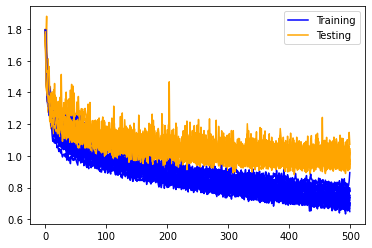

In [15]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

In [16]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  0.9831765592098235
mean accuracy:  0.6111556500196458


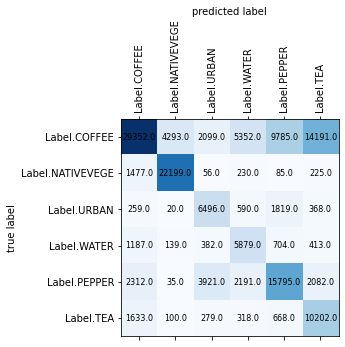

In [17]:
plot_confusion_matrix(conf_matrix, labels)

In [18]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Recalls: ", recall)
print("F-Score: ", fscore)

Precisions:  [0.810381   0.82875383 0.49089398 0.40377747 0.54737316 0.37123831]
Recalls:  [0.45106958 0.91459295 0.680067   0.67543658 0.59974939 0.77287879]
F-Score:  [0.57955219 0.86956011 0.57019969 0.50541609 0.57236556 0.50156093]


# 9x9px, NIR, RED, SWIR1 (5000 epochs)

In [7]:
NB_PIXEL_AROUND=4

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

In [8]:
BANDS = [
    Band.NIR.value,
    Band.RED.value,
    Band.SWIR1.value
]

NB_TESTS = 1
EPOCHS = 5000

In [9]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 9, 9, 3)           0         
_________________________________________________________________
conv2d (Conv2D)              (None, 9, 9, 16)          448       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 9, 16)          2320      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 3, 3, 16)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 3, 16)          1040      
_________________________________________________________________
flat (Flatten)               (None, 144)               0

57/57 [==============================] - 0s 8ms/step - loss: 0.9188 - accuracy: 0.5338 - val_loss: 1.1260 - val_accuracy: 0.5262
Epoch 104/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9242 - accuracy: 0.5469 - val_loss: 1.1012 - val_accuracy: 0.5394
Epoch 105/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8837 - accuracy: 0.5754 - val_loss: 1.0991 - val_accuracy: 0.5094
Epoch 106/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9652 - accuracy: 0.5539 - val_loss: 1.0203 - val_accuracy: 0.5801
Epoch 107/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9238 - accuracy: 0.5542 - val_loss: 1.0726 - val_accuracy: 0.5531
Epoch 108/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9218 - accuracy: 0.5448 - val_loss: 1.0302 - val_accuracy: 0.5666
Epoch 109/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9374 - accuracy: 0.5646 - val_loss: 1.1091 - val_accuracy: 0.4822
Epoch 1

Epoch 160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9043 - accuracy: 0.5478 - val_loss: 1.0411 - val_accuracy: 0.5654
Epoch 161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8360 - accuracy: 0.5807 - val_loss: 1.0023 - val_accuracy: 0.5974
Epoch 162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8246 - accuracy: 0.6307 - val_loss: 1.0144 - val_accuracy: 0.5765
Epoch 163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8903 - accuracy: 0.5427 - val_loss: 0.9703 - val_accuracy: 0.5984
Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8438 - accuracy: 0.5674 - val_loss: 1.0362 - val_accuracy: 0.5438
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8909 - accuracy: 0.5850 - val_loss: 1.1065 - val_accuracy: 0.4886
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8775 - accuracy: 0.5398 - val_loss: 1.0400 - val_accuracy:

Epoch 217/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8081 - accuracy: 0.5889 - val_loss: 0.9785 - val_accuracy: 0.6021
Epoch 218/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7768 - accuracy: 0.5869 - val_loss: 0.9928 - val_accuracy: 0.5778
Epoch 219/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8103 - accuracy: 0.5886 - val_loss: 1.0975 - val_accuracy: 0.5504
Epoch 220/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8522 - accuracy: 0.5883 - val_loss: 0.9838 - val_accuracy: 0.5916
Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8675 - accuracy: 0.5684 - val_loss: 0.9841 - val_accuracy: 0.6074
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8237 - accuracy: 0.5926 - val_loss: 0.9607 - val_accuracy: 0.6003
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7718 - accuracy: 0.6220 - val_loss: 1.0206 - val_accuracy:

Epoch 274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8268 - accuracy: 0.6080 - val_loss: 0.9418 - val_accuracy: 0.6140
Epoch 275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7723 - accuracy: 0.6143 - val_loss: 0.9710 - val_accuracy: 0.6116
Epoch 276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7950 - accuracy: 0.6152 - val_loss: 1.0073 - val_accuracy: 0.5855
Epoch 277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7846 - accuracy: 0.6031 - val_loss: 0.9467 - val_accuracy: 0.5945
Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8365 - accuracy: 0.5974 - val_loss: 0.9490 - val_accuracy: 0.6145
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7510 - accuracy: 0.6032 - val_loss: 0.9679 - val_accuracy: 0.5822
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7811 - accuracy: 0.6219 - val_loss: 0.9548 - val_accuracy:

Epoch 331/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7112 - accuracy: 0.6348 - val_loss: 0.9575 - val_accuracy: 0.6150
Epoch 332/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7255 - accuracy: 0.6615 - val_loss: 0.9597 - val_accuracy: 0.6057
Epoch 333/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6817 - accuracy: 0.6449 - val_loss: 0.9778 - val_accuracy: 0.5865
Epoch 334/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7694 - accuracy: 0.5913 - val_loss: 1.0721 - val_accuracy: 0.5561
Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7111 - accuracy: 0.6515 - val_loss: 0.9982 - val_accuracy: 0.5882
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7062 - accuracy: 0.6566 - val_loss: 0.9493 - val_accuracy: 0.6152
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7100 - accuracy: 0.6277 - val_loss: 0.9111 - val_accuracy:

Epoch 388/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6198 - accuracy: 0.6881 - val_loss: 0.9732 - val_accuracy: 0.5920
Epoch 389/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6690 - accuracy: 0.6418 - val_loss: 1.0016 - val_accuracy: 0.5795
Epoch 390/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7407 - accuracy: 0.6335 - val_loss: 0.9359 - val_accuracy: 0.6120
Epoch 391/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6466 - accuracy: 0.6751 - val_loss: 0.8840 - val_accuracy: 0.6299
Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6633 - accuracy: 0.6634 - val_loss: 0.9275 - val_accuracy: 0.6405
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7295 - accuracy: 0.6427 - val_loss: 0.8928 - val_accuracy: 0.6331
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6798 - accuracy: 0.6723 - val_loss: 0.9967 - val_accuracy:

Epoch 445/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6368 - accuracy: 0.6728 - val_loss: 0.8692 - val_accuracy: 0.6531
Epoch 446/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6371 - accuracy: 0.6779 - val_loss: 0.9064 - val_accuracy: 0.6402
Epoch 447/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6699 - accuracy: 0.6720 - val_loss: 0.8403 - val_accuracy: 0.6701
Epoch 448/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6332 - accuracy: 0.6887 - val_loss: 0.8861 - val_accuracy: 0.6336
Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6755 - accuracy: 0.6585 - val_loss: 0.8848 - val_accuracy: 0.6399
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6010 - accuracy: 0.6765 - val_loss: 0.9864 - val_accuracy: 0.5829
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6449 - accuracy: 0.6470 - val_loss: 0.9450 - val_accuracy:

Epoch 502/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5800 - accuracy: 0.7166 - val_loss: 0.9362 - val_accuracy: 0.6243
Epoch 503/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5590 - accuracy: 0.6799 - val_loss: 0.9139 - val_accuracy: 0.6394
Epoch 504/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6167 - accuracy: 0.6844 - val_loss: 0.9385 - val_accuracy: 0.6344
Epoch 505/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6033 - accuracy: 0.6990 - val_loss: 0.8664 - val_accuracy: 0.6608
Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5990 - accuracy: 0.7028 - val_loss: 0.9062 - val_accuracy: 0.6409
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5871 - accuracy: 0.6965 - val_loss: 0.9167 - val_accuracy: 0.6361
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5822 - accuracy: 0.6716 - val_loss: 0.9388 - val_accuracy:

Epoch 559/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5847 - accuracy: 0.6629 - val_loss: 0.8843 - val_accuracy: 0.6416
Epoch 560/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5539 - accuracy: 0.7118 - val_loss: 0.9760 - val_accuracy: 0.6048
Epoch 561/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6570 - accuracy: 0.6356 - val_loss: 0.9083 - val_accuracy: 0.6329
Epoch 562/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5716 - accuracy: 0.6924 - val_loss: 0.9384 - val_accuracy: 0.6329
Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5780 - accuracy: 0.6872 - val_loss: 1.0365 - val_accuracy: 0.5900
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6218 - accuracy: 0.6767 - val_loss: 0.8767 - val_accuracy: 0.6549
Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6006 - accuracy: 0.7020 - val_loss: 0.9201 - val_accuracy:

Epoch 616/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5368 - accuracy: 0.7011 - val_loss: 0.9447 - val_accuracy: 0.6406
Epoch 617/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6516 - accuracy: 0.6576 - val_loss: 0.9270 - val_accuracy: 0.6260
Epoch 618/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5817 - accuracy: 0.7055 - val_loss: 0.9637 - val_accuracy: 0.6164
Epoch 619/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6048 - accuracy: 0.6781 - val_loss: 0.9578 - val_accuracy: 0.6106
Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6225 - accuracy: 0.6658 - val_loss: 1.0049 - val_accuracy: 0.5987
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5871 - accuracy: 0.6867 - val_loss: 0.9291 - val_accuracy: 0.6325
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5269 - accuracy: 0.6976 - val_loss: 0.9145 - val_accuracy:

Epoch 673/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5202 - accuracy: 0.7107 - val_loss: 0.9637 - val_accuracy: 0.6284
Epoch 674/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4921 - accuracy: 0.7248 - val_loss: 0.8932 - val_accuracy: 0.6597
Epoch 675/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5182 - accuracy: 0.6884 - val_loss: 0.9235 - val_accuracy: 0.6508
Epoch 676/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4939 - accuracy: 0.7252 - val_loss: 0.9552 - val_accuracy: 0.6261
Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5626 - accuracy: 0.7002 - val_loss: 0.8941 - val_accuracy: 0.6550
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5599 - accuracy: 0.6801 - val_loss: 0.8694 - val_accuracy: 0.6663
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5527 - accuracy: 0.6951 - val_loss: 0.9158 - val_accuracy:

Epoch 730/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5498 - accuracy: 0.7150 - val_loss: 0.9340 - val_accuracy: 0.6393
Epoch 731/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5089 - accuracy: 0.7296 - val_loss: 0.9671 - val_accuracy: 0.6207
Epoch 732/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4789 - accuracy: 0.7253 - val_loss: 0.9476 - val_accuracy: 0.6424
Epoch 733/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5155 - accuracy: 0.6913 - val_loss: 0.9387 - val_accuracy: 0.6515
Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5359 - accuracy: 0.6799 - val_loss: 0.9166 - val_accuracy: 0.6631
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4968 - accuracy: 0.7369 - val_loss: 0.8745 - val_accuracy: 0.6778
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4949 - accuracy: 0.7195 - val_loss: 0.8970 - val_accuracy:

Epoch 787/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5093 - accuracy: 0.7147 - val_loss: 0.9626 - val_accuracy: 0.6337
Epoch 788/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5007 - accuracy: 0.7016 - val_loss: 0.8827 - val_accuracy: 0.6762
Epoch 789/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5422 - accuracy: 0.7347 - val_loss: 0.9130 - val_accuracy: 0.6536
Epoch 790/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4631 - accuracy: 0.7362 - val_loss: 0.8891 - val_accuracy: 0.6830
Epoch 791/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4461 - accuracy: 0.7366 - val_loss: 0.9275 - val_accuracy: 0.6659
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4953 - accuracy: 0.7134 - val_loss: 0.9508 - val_accuracy: 0.6631
Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4324 - accuracy: 0.7444 - val_loss: 0.8865 - val_accuracy:

Epoch 844/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4687 - accuracy: 0.7185 - val_loss: 0.8980 - val_accuracy: 0.6908
Epoch 845/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4351 - accuracy: 0.7547 - val_loss: 0.9681 - val_accuracy: 0.6604
Epoch 846/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4656 - accuracy: 0.7251 - val_loss: 0.9412 - val_accuracy: 0.6697
Epoch 847/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4713 - accuracy: 0.7278 - val_loss: 0.9302 - val_accuracy: 0.6680
Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4391 - accuracy: 0.7555 - val_loss: 1.0412 - val_accuracy: 0.6274
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5049 - accuracy: 0.7199 - val_loss: 0.9821 - val_accuracy: 0.6464
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4810 - accuracy: 0.7338 - val_loss: 0.9806 - val_accuracy:

Epoch 901/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4402 - accuracy: 0.7393 - val_loss: 0.9400 - val_accuracy: 0.6846
Epoch 902/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4945 - accuracy: 0.7289 - val_loss: 1.0253 - val_accuracy: 0.6390
Epoch 903/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4452 - accuracy: 0.7192 - val_loss: 0.9419 - val_accuracy: 0.6627
Epoch 904/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4657 - accuracy: 0.7478 - val_loss: 0.8940 - val_accuracy: 0.6836
Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4333 - accuracy: 0.7511 - val_loss: 0.9923 - val_accuracy: 0.6376
Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5131 - accuracy: 0.7220 - val_loss: 0.8982 - val_accuracy: 0.6794
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4693 - accuracy: 0.7319 - val_loss: 0.9446 - val_accuracy:

Epoch 958/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4504 - accuracy: 0.7507 - val_loss: 0.9060 - val_accuracy: 0.6743
Epoch 959/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4247 - accuracy: 0.7555 - val_loss: 0.9140 - val_accuracy: 0.6931
Epoch 960/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4687 - accuracy: 0.7438 - val_loss: 0.9350 - val_accuracy: 0.6775
Epoch 961/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4059 - accuracy: 0.7655 - val_loss: 0.9836 - val_accuracy: 0.6490
Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4946 - accuracy: 0.7123 - val_loss: 0.9670 - val_accuracy: 0.6622
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4681 - accuracy: 0.7475 - val_loss: 0.9652 - val_accuracy: 0.6675
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4760 - accuracy: 0.7242 - val_loss: 0.9714 - val_accuracy:

Epoch 1015/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4369 - accuracy: 0.7608 - val_loss: 0.9558 - val_accuracy: 0.6763
Epoch 1016/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4499 - accuracy: 0.7124 - val_loss: 0.9512 - val_accuracy: 0.6690
Epoch 1017/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4435 - accuracy: 0.7329 - val_loss: 1.0013 - val_accuracy: 0.6570
Epoch 1018/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4421 - accuracy: 0.7413 - val_loss: 0.9557 - val_accuracy: 0.6673
Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4175 - accuracy: 0.7585 - val_loss: 0.9590 - val_accuracy: 0.6933
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4593 - accuracy: 0.7373 - val_loss: 0.9695 - val_accuracy: 0.6574
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4243 - accuracy: 0.7630 - val_loss: 0.9816 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.4664 - accuracy: 0.7521 - val_loss: 1.0180 - val_accuracy: 0.6498
Epoch 1128/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4365 - accuracy: 0.7430 - val_loss: 0.9364 - val_accuracy: 0.6881
Epoch 1129/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3937 - accuracy: 0.7472 - val_loss: 0.9750 - val_accuracy: 0.6771
Epoch 1130/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4086 - accuracy: 0.7455 - val_loss: 1.0052 - val_accuracy: 0.6688
Epoch 1131/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4260 - accuracy: 0.7454 - val_loss: 1.0057 - val_accuracy: 0.6545
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4969 - accuracy: 0.7084 - val_loss: 0.9772 - val_accuracy: 0.6524
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4140 - accuracy: 0.7574 - val_loss: 0.9316 - val_accuracy: 0.6825
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4381 - accuracy: 0.7663 - val_loss: 1.2079 - val_accuracy: 0.6084
Epoch 1240/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4569 - accuracy: 0.7231 - val_loss: 1.0589 - val_accuracy: 0.6566
Epoch 1241/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4307 - accuracy: 0.7435 - val_loss: 0.9682 - val_accuracy: 0.6781
Epoch 1242/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4186 - accuracy: 0.7671 - val_loss: 1.0331 - val_accuracy: 0.6854
Epoch 1243/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4341 - accuracy: 0.7722 - val_loss: 0.9949 - val_accuracy: 0.6762
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4217 - accuracy: 0.7438 - val_loss: 0.9754 - val_accuracy: 0.6827
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3805 - accuracy: 0.7779 - val_loss: 1.0205 - val_accuracy: 0.6792
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3908 - accuracy: 0.7533 - val_loss: 1.0487 - val_accuracy: 0.6782
Epoch 1352/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4135 - accuracy: 0.7538 - val_loss: 0.9741 - val_accuracy: 0.6938
Epoch 1353/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3857 - accuracy: 0.7810 - val_loss: 1.0344 - val_accuracy: 0.6659
Epoch 1354/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4444 - accuracy: 0.7464 - val_loss: 0.9666 - val_accuracy: 0.6828
Epoch 1355/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3833 - accuracy: 0.7680 - val_loss: 1.0465 - val_accuracy: 0.6585
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3849 - accuracy: 0.7651 - val_loss: 1.0149 - val_accuracy: 0.6828
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4578 - accuracy: 0.7359 - val_loss: 0.9827 - val_accuracy: 0.6760
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4076 - accuracy: 0.7763 - val_loss: 1.0242 - val_accuracy: 0.6646
Epoch 1464/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4117 - accuracy: 0.7466 - val_loss: 0.9750 - val_accuracy: 0.6937
Epoch 1465/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3954 - accuracy: 0.7599 - val_loss: 1.0161 - val_accuracy: 0.6744
Epoch 1466/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3786 - accuracy: 0.7727 - val_loss: 0.9925 - val_accuracy: 0.6948
Epoch 1467/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4299 - accuracy: 0.7679 - val_loss: 1.0672 - val_accuracy: 0.6466
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3790 - accuracy: 0.7605 - val_loss: 1.0257 - val_accuracy: 0.6834
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3711 - accuracy: 0.7706 - val_loss: 1.0052 - val_accuracy: 0.6798
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3875 - accuracy: 0.7873 - val_loss: 0.9983 - val_accuracy: 0.6984
Epoch 1576/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3788 - accuracy: 0.7863 - val_loss: 1.0181 - val_accuracy: 0.6930
Epoch 1577/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3383 - accuracy: 0.7921 - val_loss: 1.0414 - val_accuracy: 0.6973
Epoch 1578/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3571 - accuracy: 0.8079 - val_loss: 1.0948 - val_accuracy: 0.6622
Epoch 1579/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3951 - accuracy: 0.7539 - val_loss: 1.0396 - val_accuracy: 0.6866
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3947 - accuracy: 0.7630 - val_loss: 1.0428 - val_accuracy: 0.6812
Epoch 1581/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3645 - accuracy: 0.7555 - val_loss: 1.0826 - val_accuracy: 0.6793
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3555 - accuracy: 0.7859 - val_loss: 1.0469 - val_accuracy: 0.6910
Epoch 1688/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3893 - accuracy: 0.7820 - val_loss: 1.0587 - val_accuracy: 0.6906
Epoch 1689/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3784 - accuracy: 0.7909 - val_loss: 1.0868 - val_accuracy: 0.6743
Epoch 1690/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3607 - accuracy: 0.7881 - val_loss: 1.0390 - val_accuracy: 0.6900
Epoch 1691/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4360 - accuracy: 0.7555 - val_loss: 1.0131 - val_accuracy: 0.6942
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3392 - accuracy: 0.8059 - val_loss: 1.0336 - val_accuracy: 0.6964
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3409 - accuracy: 0.7943 - val_loss: 1.0864 - val_accuracy: 0.6722
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3356 - accuracy: 0.7823 - val_loss: 1.1603 - val_accuracy: 0.6637
Epoch 1800/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3662 - accuracy: 0.7866 - val_loss: 1.1326 - val_accuracy: 0.6726
Epoch 1801/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3944 - accuracy: 0.7600 - val_loss: 1.0741 - val_accuracy: 0.6847
Epoch 1802/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3114 - accuracy: 0.8043 - val_loss: 1.0795 - val_accuracy: 0.6842
Epoch 1803/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3183 - accuracy: 0.8103 - val_loss: 1.0702 - val_accuracy: 0.6797
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3432 - accuracy: 0.7821 - val_loss: 1.0839 - val_accuracy: 0.6945
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3402 - accuracy: 0.7975 - val_loss: 1.0945 - val_accuracy: 0.6900
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3992 - accuracy: 0.7564 - val_loss: 1.0819 - val_accuracy: 0.6862
Epoch 1912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3694 - accuracy: 0.7793 - val_loss: 1.0867 - val_accuracy: 0.6854
Epoch 1913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3819 - accuracy: 0.7688 - val_loss: 1.0869 - val_accuracy: 0.6744
Epoch 1914/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3792 - accuracy: 0.7649 - val_loss: 1.0656 - val_accuracy: 0.7007
Epoch 1915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3525 - accuracy: 0.7668 - val_loss: 1.1429 - val_accuracy: 0.6988
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3995 - accuracy: 0.7579 - val_loss: 1.0746 - val_accuracy: 0.7017
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3159 - accuracy: 0.8220 - val_loss: 1.1231 - val_accuracy: 0.6979
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3718 - accuracy: 0.7990 - val_loss: 1.0662 - val_accuracy: 0.7009
Epoch 2024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3517 - accuracy: 0.7920 - val_loss: 1.1066 - val_accuracy: 0.6813
Epoch 2025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4057 - accuracy: 0.7694 - val_loss: 1.0749 - val_accuracy: 0.6969
Epoch 2026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3234 - accuracy: 0.7973 - val_loss: 1.0865 - val_accuracy: 0.7030
Epoch 2027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4271 - accuracy: 0.7926 - val_loss: 1.1155 - val_accuracy: 0.6602
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3530 - accuracy: 0.7743 - val_loss: 1.1104 - val_accuracy: 0.6939
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.7931 - val_loss: 1.1053 - val_accuracy: 0.6983
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3180 - accuracy: 0.8041 - val_loss: 1.0911 - val_accuracy: 0.7077
Epoch 2136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3224 - accuracy: 0.8016 - val_loss: 1.0745 - val_accuracy: 0.6956
Epoch 2137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3226 - accuracy: 0.7944 - val_loss: 1.1169 - val_accuracy: 0.6999
Epoch 2138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3293 - accuracy: 0.7965 - val_loss: 1.0903 - val_accuracy: 0.6896
Epoch 2139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3421 - accuracy: 0.7663 - val_loss: 1.1018 - val_accuracy: 0.6843
Epoch 2140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3316 - accuracy: 0.7919 - val_loss: 1.0721 - val_accuracy: 0.7128
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3405 - accuracy: 0.8048 - val_loss: 1.0805 - val_accuracy: 0.6876
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3273 - accuracy: 0.7993 - val_loss: 1.0997 - val_accuracy: 0.7086
Epoch 2248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3023 - accuracy: 0.8073 - val_loss: 1.1034 - val_accuracy: 0.7167
Epoch 2249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3341 - accuracy: 0.7965 - val_loss: 1.1028 - val_accuracy: 0.6915
Epoch 2250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3025 - accuracy: 0.8153 - val_loss: 1.0938 - val_accuracy: 0.6982
Epoch 2251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3257 - accuracy: 0.7885 - val_loss: 1.1212 - val_accuracy: 0.6811
Epoch 2252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3574 - accuracy: 0.7836 - val_loss: 1.1289 - val_accuracy: 0.6881
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4248 - accuracy: 0.7894 - val_loss: 1.0484 - val_accuracy: 0.7127
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3898 - accuracy: 0.7737 - val_loss: 1.0957 - val_accuracy: 0.6884
Epoch 2360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3191 - accuracy: 0.8081 - val_loss: 1.0992 - val_accuracy: 0.6889
Epoch 2361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4011 - accuracy: 0.7921 - val_loss: 1.1101 - val_accuracy: 0.6968
Epoch 2362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3612 - accuracy: 0.8102 - val_loss: 1.1142 - val_accuracy: 0.6892
Epoch 2363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3738 - accuracy: 0.7846 - val_loss: 1.1934 - val_accuracy: 0.6644
Epoch 2364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3719 - accuracy: 0.7793 - val_loss: 1.0947 - val_accuracy: 0.7157
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2779 - accuracy: 0.8263 - val_loss: 1.0983 - val_accuracy: 0.7067
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3549 - accuracy: 0.7976 - val_loss: 1.1357 - val_accuracy: 0.7013
Epoch 2472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3305 - accuracy: 0.8059 - val_loss: 1.1707 - val_accuracy: 0.6961
Epoch 2473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3653 - accuracy: 0.7903 - val_loss: 1.1355 - val_accuracy: 0.6754
Epoch 2474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3530 - accuracy: 0.7774 - val_loss: 1.1196 - val_accuracy: 0.7015
Epoch 2475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3421 - accuracy: 0.8080 - val_loss: 1.1284 - val_accuracy: 0.7182
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3457 - accuracy: 0.8145 - val_loss: 1.1477 - val_accuracy: 0.6668
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3023 - accuracy: 0.8019 - val_loss: 1.1007 - val_accuracy: 0.7177
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3024 - accuracy: 0.8241 - val_loss: 1.1525 - val_accuracy: 0.6915
Epoch 2584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2860 - accuracy: 0.8003 - val_loss: 1.1079 - val_accuracy: 0.6958
Epoch 2585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3158 - accuracy: 0.8219 - val_loss: 1.1201 - val_accuracy: 0.7113
Epoch 2586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3190 - accuracy: 0.7848 - val_loss: 1.2072 - val_accuracy: 0.6843
Epoch 2587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2899 - accuracy: 0.8225 - val_loss: 1.1444 - val_accuracy: 0.7123
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2946 - accuracy: 0.8205 - val_loss: 1.2447 - val_accuracy: 0.6796
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3242 - accuracy: 0.7983 - val_loss: 1.1774 - val_accuracy: 0.6751
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3383 - accuracy: 0.7840 - val_loss: 1.1527 - val_accuracy: 0.6900
Epoch 2696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3120 - accuracy: 0.7884 - val_loss: 1.1796 - val_accuracy: 0.7011
Epoch 2697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3355 - accuracy: 0.8177 - val_loss: 1.1650 - val_accuracy: 0.6963
Epoch 2698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2903 - accuracy: 0.8141 - val_loss: 1.1591 - val_accuracy: 0.7214
Epoch 2699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3021 - accuracy: 0.8130 - val_loss: 1.1695 - val_accuracy: 0.6882
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3255 - accuracy: 0.7982 - val_loss: 1.1734 - val_accuracy: 0.7121
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3134 - accuracy: 0.8153 - val_loss: 1.1661 - val_accuracy: 0.7033
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3659 - accuracy: 0.7753 - val_loss: 1.1636 - val_accuracy: 0.6967
Epoch 2808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3099 - accuracy: 0.8072 - val_loss: 1.1649 - val_accuracy: 0.7199
Epoch 2809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3040 - accuracy: 0.8285 - val_loss: 1.1793 - val_accuracy: 0.7113
Epoch 2810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2947 - accuracy: 0.8067 - val_loss: 1.1720 - val_accuracy: 0.7096
Epoch 2811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3109 - accuracy: 0.8229 - val_loss: 1.2214 - val_accuracy: 0.6906
Epoch 2812/5000
57/57 [==============================] - 1s 10ms/step - loss: 0.3601 - accuracy: 0.7881 - val_loss: 1.1966 - val_accuracy: 0.6982
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3036 - accuracy: 0.8096 - val_loss: 1.1663 - val_accuracy: 0.7020


57/57 [==============================] - 0s 8ms/step - loss: 0.3943 - accuracy: 0.7822 - val_loss: 1.1230 - val_accuracy: 0.7002
Epoch 2920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3110 - accuracy: 0.7995 - val_loss: 1.1678 - val_accuracy: 0.6942
Epoch 2921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3215 - accuracy: 0.8034 - val_loss: 1.1416 - val_accuracy: 0.7148
Epoch 2922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3076 - accuracy: 0.8247 - val_loss: 1.2042 - val_accuracy: 0.7003
Epoch 2923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3600 - accuracy: 0.7996 - val_loss: 1.1744 - val_accuracy: 0.6877
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3396 - accuracy: 0.8114 - val_loss: 1.1275 - val_accuracy: 0.6958
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3123 - accuracy: 0.8035 - val_loss: 1.1650 - val_accuracy: 0.6881
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2902 - accuracy: 0.8180 - val_loss: 1.1878 - val_accuracy: 0.7060
Epoch 3032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3530 - accuracy: 0.8094 - val_loss: 1.1859 - val_accuracy: 0.7034
Epoch 3033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3733 - accuracy: 0.7827 - val_loss: 1.1130 - val_accuracy: 0.6983
Epoch 3034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2925 - accuracy: 0.8185 - val_loss: 1.2004 - val_accuracy: 0.6849
Epoch 3035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2762 - accuracy: 0.8258 - val_loss: 1.2449 - val_accuracy: 0.6865
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3183 - accuracy: 0.8033 - val_loss: 1.2266 - val_accuracy: 0.7163
Epoch 3037/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.3070 - accuracy: 0.7998 - val_loss: 1.2086 - val_accuracy: 0.7120
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2908 - accuracy: 0.8231 - val_loss: 1.1542 - val_accuracy: 0.7072
Epoch 3144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3298 - accuracy: 0.7957 - val_loss: 1.1547 - val_accuracy: 0.7072
Epoch 3145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3121 - accuracy: 0.7998 - val_loss: 1.1654 - val_accuracy: 0.7237
Epoch 3146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3191 - accuracy: 0.8170 - val_loss: 1.2121 - val_accuracy: 0.7109
Epoch 3147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3195 - accuracy: 0.8078 - val_loss: 1.2375 - val_accuracy: 0.7030
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3052 - accuracy: 0.7964 - val_loss: 1.1623 - val_accuracy: 0.7040
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2774 - accuracy: 0.8196 - val_loss: 1.1633 - val_accuracy: 0.7132
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3883 - accuracy: 0.7693 - val_loss: 1.1698 - val_accuracy: 0.7113
Epoch 3256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2737 - accuracy: 0.8311 - val_loss: 1.1858 - val_accuracy: 0.7113
Epoch 3257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2980 - accuracy: 0.8282 - val_loss: 1.2206 - val_accuracy: 0.6907
Epoch 3258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2717 - accuracy: 0.8338 - val_loss: 1.2057 - val_accuracy: 0.7066
Epoch 3259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2798 - accuracy: 0.8473 - val_loss: 1.2253 - val_accuracy: 0.7052
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3197 - accuracy: 0.8072 - val_loss: 1.2849 - val_accuracy: 0.6900
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2749 - accuracy: 0.8278 - val_loss: 1.1797 - val_accuracy: 0.7158
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2830 - accuracy: 0.8100 - val_loss: 1.2644 - val_accuracy: 0.6858
Epoch 3368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2894 - accuracy: 0.8187 - val_loss: 1.2034 - val_accuracy: 0.7176
Epoch 3369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3308 - accuracy: 0.8045 - val_loss: 1.2080 - val_accuracy: 0.7151
Epoch 3370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2753 - accuracy: 0.8167 - val_loss: 1.2309 - val_accuracy: 0.7166
Epoch 3371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3170 - accuracy: 0.8250 - val_loss: 1.2480 - val_accuracy: 0.6760
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3192 - accuracy: 0.7979 - val_loss: 1.2054 - val_accuracy: 0.6907
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2996 - accuracy: 0.7981 - val_loss: 1.1835 - val_accuracy: 0.7147
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3565 - accuracy: 0.7809 - val_loss: 1.2357 - val_accuracy: 0.7053
Epoch 3480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3043 - accuracy: 0.8207 - val_loss: 1.2041 - val_accuracy: 0.6888
Epoch 3481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2988 - accuracy: 0.8091 - val_loss: 1.1978 - val_accuracy: 0.7231
Epoch 3482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2733 - accuracy: 0.8322 - val_loss: 1.1823 - val_accuracy: 0.7314
Epoch 3483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2672 - accuracy: 0.8524 - val_loss: 1.2039 - val_accuracy: 0.7129
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3070 - accuracy: 0.8059 - val_loss: 1.2218 - val_accuracy: 0.7037
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3559 - accuracy: 0.8073 - val_loss: 1.2441 - val_accuracy: 0.6973
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2632 - accuracy: 0.8393 - val_loss: 1.2954 - val_accuracy: 0.6967
Epoch 3592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3243 - accuracy: 0.8044 - val_loss: 1.2916 - val_accuracy: 0.7051
Epoch 3593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3372 - accuracy: 0.8193 - val_loss: 1.3696 - val_accuracy: 0.6564
Epoch 3594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2882 - accuracy: 0.8151 - val_loss: 1.1913 - val_accuracy: 0.7142
Epoch 3595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2987 - accuracy: 0.8133 - val_loss: 1.2372 - val_accuracy: 0.7157
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2348 - accuracy: 0.8476 - val_loss: 1.2838 - val_accuracy: 0.7091
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2601 - accuracy: 0.8332 - val_loss: 1.3211 - val_accuracy: 0.7096
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2928 - accuracy: 0.8327 - val_loss: 1.2489 - val_accuracy: 0.7222
Epoch 3704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2863 - accuracy: 0.8172 - val_loss: 1.2461 - val_accuracy: 0.7215
Epoch 3705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2529 - accuracy: 0.8479 - val_loss: 1.3210 - val_accuracy: 0.7117
Epoch 3706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3263 - accuracy: 0.8043 - val_loss: 1.2648 - val_accuracy: 0.6975
Epoch 3707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3584 - accuracy: 0.8002 - val_loss: 1.3475 - val_accuracy: 0.6938
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3281 - accuracy: 0.7993 - val_loss: 1.1871 - val_accuracy: 0.6967
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2621 - accuracy: 0.8386 - val_loss: 1.2027 - val_accuracy: 0.6996
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3250 - accuracy: 0.7935 - val_loss: 1.2194 - val_accuracy: 0.7120
Epoch 3816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2540 - accuracy: 0.8618 - val_loss: 1.1654 - val_accuracy: 0.7233
Epoch 3817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2776 - accuracy: 0.8446 - val_loss: 1.2608 - val_accuracy: 0.7112
Epoch 3818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2645 - accuracy: 0.8121 - val_loss: 1.2848 - val_accuracy: 0.6813
Epoch 3819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3179 - accuracy: 0.7958 - val_loss: 1.2312 - val_accuracy: 0.7083
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2994 - accuracy: 0.8324 - val_loss: 1.2753 - val_accuracy: 0.7154
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2876 - accuracy: 0.8277 - val_loss: 1.2461 - val_accuracy: 0.7129
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2625 - accuracy: 0.8196 - val_loss: 1.2064 - val_accuracy: 0.7119
Epoch 3928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2506 - accuracy: 0.8305 - val_loss: 1.2916 - val_accuracy: 0.7138
Epoch 3929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3152 - accuracy: 0.8264 - val_loss: 1.1833 - val_accuracy: 0.7305
Epoch 3930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2560 - accuracy: 0.8378 - val_loss: 1.2323 - val_accuracy: 0.7292
Epoch 3931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2639 - accuracy: 0.8254 - val_loss: 1.2847 - val_accuracy: 0.6949
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3300 - accuracy: 0.7972 - val_loss: 1.2687 - val_accuracy: 0.7277
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2275 - accuracy: 0.8456 - val_loss: 1.2996 - val_accuracy: 0.7203
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3351 - accuracy: 0.7941 - val_loss: 1.2063 - val_accuracy: 0.7186
Epoch 4040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2739 - accuracy: 0.8305 - val_loss: 1.2194 - val_accuracy: 0.7025
Epoch 4041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3071 - accuracy: 0.8009 - val_loss: 1.2789 - val_accuracy: 0.7207
Epoch 4042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3281 - accuracy: 0.8190 - val_loss: 1.2934 - val_accuracy: 0.7170
Epoch 4043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2909 - accuracy: 0.8437 - val_loss: 1.2097 - val_accuracy: 0.7049
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2934 - accuracy: 0.8384 - val_loss: 1.2420 - val_accuracy: 0.7079
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2710 - accuracy: 0.8454 - val_loss: 1.2069 - val_accuracy: 0.6918
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2820 - accuracy: 0.8109 - val_loss: 1.2534 - val_accuracy: 0.7199
Epoch 4152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2227 - accuracy: 0.8560 - val_loss: 1.2225 - val_accuracy: 0.7242
Epoch 4153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3150 - accuracy: 0.8448 - val_loss: 1.2651 - val_accuracy: 0.7231
Epoch 4154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2429 - accuracy: 0.8381 - val_loss: 1.3443 - val_accuracy: 0.6813
Epoch 4155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3508 - accuracy: 0.8110 - val_loss: 1.2115 - val_accuracy: 0.7248
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2727 - accuracy: 0.8242 - val_loss: 1.2290 - val_accuracy: 0.7302
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2564 - accuracy: 0.8371 - val_loss: 1.3712 - val_accuracy: 0.6844
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3446 - accuracy: 0.8153 - val_loss: 1.2015 - val_accuracy: 0.7214
Epoch 4264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2851 - accuracy: 0.8262 - val_loss: 1.2638 - val_accuracy: 0.7074
Epoch 4265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2857 - accuracy: 0.8124 - val_loss: 1.2960 - val_accuracy: 0.7265
Epoch 4266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2863 - accuracy: 0.8355 - val_loss: 1.2323 - val_accuracy: 0.7242
Epoch 4267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2915 - accuracy: 0.8236 - val_loss: 1.2528 - val_accuracy: 0.7064
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2919 - accuracy: 0.8266 - val_loss: 1.2243 - val_accuracy: 0.7235
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2204 - accuracy: 0.8620 - val_loss: 1.3287 - val_accuracy: 0.6992
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2679 - accuracy: 0.8475 - val_loss: 1.2221 - val_accuracy: 0.7303
Epoch 4376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2867 - accuracy: 0.8330 - val_loss: 1.2768 - val_accuracy: 0.7258
Epoch 4377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2899 - accuracy: 0.8325 - val_loss: 1.3320 - val_accuracy: 0.7007
Epoch 4378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2842 - accuracy: 0.8382 - val_loss: 1.2289 - val_accuracy: 0.7186
Epoch 4379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2320 - accuracy: 0.8377 - val_loss: 1.2893 - val_accuracy: 0.7112
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2879 - accuracy: 0.8187 - val_loss: 1.3261 - val_accuracy: 0.7089
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2946 - accuracy: 0.8170 - val_loss: 1.2994 - val_accuracy: 0.7210
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2764 - accuracy: 0.8285 - val_loss: 1.2606 - val_accuracy: 0.7288
Epoch 4488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2746 - accuracy: 0.8455 - val_loss: 1.2873 - val_accuracy: 0.7089
Epoch 4489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3121 - accuracy: 0.8239 - val_loss: 1.2348 - val_accuracy: 0.7184
Epoch 4490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2477 - accuracy: 0.8304 - val_loss: 1.2921 - val_accuracy: 0.7315
Epoch 4491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2927 - accuracy: 0.8316 - val_loss: 1.2360 - val_accuracy: 0.7286
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3073 - accuracy: 0.8289 - val_loss: 1.3111 - val_accuracy: 0.7077
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2983 - accuracy: 0.8227 - val_loss: 1.2242 - val_accuracy: 0.6990
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3240 - accuracy: 0.8174 - val_loss: 1.2649 - val_accuracy: 0.7279
Epoch 4600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3520 - accuracy: 0.8172 - val_loss: 1.1917 - val_accuracy: 0.7318
Epoch 4601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3035 - accuracy: 0.8202 - val_loss: 1.2391 - val_accuracy: 0.7066
Epoch 4602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4361 - accuracy: 0.7877 - val_loss: 1.2340 - val_accuracy: 0.6644
Epoch 4603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3311 - accuracy: 0.7973 - val_loss: 1.2056 - val_accuracy: 0.7275
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2666 - accuracy: 0.8361 - val_loss: 1.2897 - val_accuracy: 0.7166
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3546 - accuracy: 0.8121 - val_loss: 1.2273 - val_accuracy: 0.7215
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3600 - accuracy: 0.8199 - val_loss: 1.3477 - val_accuracy: 0.6906
Epoch 4712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4294 - accuracy: 0.7441 - val_loss: 1.2634 - val_accuracy: 0.7041
Epoch 4713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4603 - accuracy: 0.8257 - val_loss: 1.1326 - val_accuracy: 0.7033
Epoch 4714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3252 - accuracy: 0.8182 - val_loss: 1.2528 - val_accuracy: 0.7121
Epoch 4715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3005 - accuracy: 0.8285 - val_loss: 1.3939 - val_accuracy: 0.7129
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3460 - accuracy: 0.8027 - val_loss: 1.2752 - val_accuracy: 0.7068
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3046 - accuracy: 0.8388 - val_loss: 1.2780 - val_accuracy: 0.7325
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2727 - accuracy: 0.8240 - val_loss: 1.4218 - val_accuracy: 0.7116
Epoch 4824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3522 - accuracy: 0.7889 - val_loss: 1.3127 - val_accuracy: 0.6882
Epoch 4825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3018 - accuracy: 0.8167 - val_loss: 1.3166 - val_accuracy: 0.6973
Epoch 4826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3146 - accuracy: 0.8131 - val_loss: 1.3991 - val_accuracy: 0.7001
Epoch 4827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2668 - accuracy: 0.8237 - val_loss: 1.3219 - val_accuracy: 0.7110
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2678 - accuracy: 0.8270 - val_loss: 1.2778 - val_accuracy: 0.7189
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2646 - accuracy: 0.8434 - val_loss: 1.2682 - val_accuracy: 0.7264
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2954 - accuracy: 0.8315 - val_loss: 1.2927 - val_accuracy: 0.7193
Epoch 4936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3295 - accuracy: 0.8418 - val_loss: 1.2996 - val_accuracy: 0.7235
Epoch 4937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2296 - accuracy: 0.8683 - val_loss: 1.2522 - val_accuracy: 0.7173
Epoch 4938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2655 - accuracy: 0.8400 - val_loss: 1.2789 - val_accuracy: 0.7115
Epoch 4939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2932 - accuracy: 0.8357 - val_loss: 1.3879 - val_accuracy: 0.6855
Epoch 4940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3352 - accuracy: 0.8254 - val_loss: 1.2454 - val_accuracy: 0.7174
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2573 - accuracy: 0.8367 - val_loss: 1.3837 - val_accuracy: 0.6953
E

57/57 [==============================] - 0s 8ms/step - loss: 1.0124 - accuracy: 0.5129 - val_loss: 1.0712 - val_accuracy: 0.5557
Epoch 49/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9915 - accuracy: 0.5083 - val_loss: 1.0654 - val_accuracy: 0.5888
Epoch 50/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9873 - accuracy: 0.5649 - val_loss: 1.0701 - val_accuracy: 0.5624
Epoch 51/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9737 - accuracy: 0.5163 - val_loss: 1.1133 - val_accuracy: 0.5477
Epoch 52/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9460 - accuracy: 0.5274 - val_loss: 1.0970 - val_accuracy: 0.5367
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0026 - accuracy: 0.5095 - val_loss: 1.0862 - val_accuracy: 0.5565
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0113 - accuracy: 0.5074 - val_loss: 1.0743 - val_accuracy: 0.5797
Epoch 55/5000

Epoch 162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8682 - accuracy: 0.5722 - val_loss: 0.9544 - val_accuracy: 0.5904
Epoch 163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8288 - accuracy: 0.5728 - val_loss: 1.0523 - val_accuracy: 0.5290
Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8506 - accuracy: 0.5557 - val_loss: 0.9155 - val_accuracy: 0.6301
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8606 - accuracy: 0.5626 - val_loss: 0.9509 - val_accuracy: 0.6001
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8083 - accuracy: 0.5781 - val_loss: 0.9345 - val_accuracy: 0.6208
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8141 - accuracy: 0.6014 - val_loss: 0.9588 - val_accuracy: 0.6149
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8722 - accuracy: 0.5718 - val_loss: 0.9862 - val_accuracy:

Epoch 219/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7243 - accuracy: 0.5948 - val_loss: 0.9478 - val_accuracy: 0.6061
Epoch 220/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6935 - accuracy: 0.6207 - val_loss: 0.9367 - val_accuracy: 0.6089
Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7260 - accuracy: 0.6055 - val_loss: 0.9586 - val_accuracy: 0.5887
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7027 - accuracy: 0.6017 - val_loss: 0.9834 - val_accuracy: 0.5833
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8001 - accuracy: 0.5707 - val_loss: 0.9785 - val_accuracy: 0.5846
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7894 - accuracy: 0.5826 - val_loss: 1.0023 - val_accuracy: 0.5701
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7876 - accuracy: 0.5977 - val_loss: 0.9368 - val_accuracy:

Epoch 276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6823 - accuracy: 0.6440 - val_loss: 1.0207 - val_accuracy: 0.5591
Epoch 277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7592 - accuracy: 0.5743 - val_loss: 0.9587 - val_accuracy: 0.6124
Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6880 - accuracy: 0.6250 - val_loss: 0.9492 - val_accuracy: 0.6213
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6666 - accuracy: 0.6227 - val_loss: 0.9022 - val_accuracy: 0.6392
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7303 - accuracy: 0.6125 - val_loss: 0.9667 - val_accuracy: 0.6014
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6981 - accuracy: 0.6332 - val_loss: 0.9255 - val_accuracy: 0.6120
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6756 - accuracy: 0.6581 - val_loss: 0.9546 - val_accuracy:

Epoch 333/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6504 - accuracy: 0.6514 - val_loss: 0.9894 - val_accuracy: 0.5989
Epoch 334/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7109 - accuracy: 0.6363 - val_loss: 0.8906 - val_accuracy: 0.6559
Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5875 - accuracy: 0.6499 - val_loss: 0.9931 - val_accuracy: 0.5941
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6397 - accuracy: 0.6262 - val_loss: 0.9900 - val_accuracy: 0.6081
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6187 - accuracy: 0.6478 - val_loss: 0.9086 - val_accuracy: 0.6320
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6211 - accuracy: 0.6352 - val_loss: 1.0244 - val_accuracy: 0.5925
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6224 - accuracy: 0.6610 - val_loss: 0.9464 - val_accuracy:

Epoch 390/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6217 - accuracy: 0.6691 - val_loss: 0.9237 - val_accuracy: 0.6464
Epoch 391/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6063 - accuracy: 0.6616 - val_loss: 0.9269 - val_accuracy: 0.6485
Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6009 - accuracy: 0.6654 - val_loss: 1.0858 - val_accuracy: 0.5571
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6269 - accuracy: 0.6252 - val_loss: 0.9191 - val_accuracy: 0.6527
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5921 - accuracy: 0.6539 - val_loss: 0.9496 - val_accuracy: 0.6267
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6111 - accuracy: 0.6989 - val_loss: 0.8831 - val_accuracy: 0.6643
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5492 - accuracy: 0.6886 - val_loss: 1.0078 - val_accuracy:

Epoch 447/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5423 - accuracy: 0.6798 - val_loss: 0.9102 - val_accuracy: 0.6529
Epoch 448/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5719 - accuracy: 0.6690 - val_loss: 0.9431 - val_accuracy: 0.6351
Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5250 - accuracy: 0.7075 - val_loss: 0.9047 - val_accuracy: 0.6472
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5516 - accuracy: 0.6908 - val_loss: 0.9311 - val_accuracy: 0.6402
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4994 - accuracy: 0.6975 - val_loss: 1.1121 - val_accuracy: 0.5663
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5997 - accuracy: 0.6731 - val_loss: 0.9537 - val_accuracy: 0.6401
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5547 - accuracy: 0.6847 - val_loss: 0.9818 - val_accuracy:

Epoch 504/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5497 - accuracy: 0.7040 - val_loss: 0.9322 - val_accuracy: 0.6599
Epoch 505/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5586 - accuracy: 0.6880 - val_loss: 0.9298 - val_accuracy: 0.6366
Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5259 - accuracy: 0.6999 - val_loss: 1.0707 - val_accuracy: 0.5921
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5453 - accuracy: 0.6854 - val_loss: 0.9704 - val_accuracy: 0.6400
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5995 - accuracy: 0.6420 - val_loss: 0.9875 - val_accuracy: 0.6308
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4914 - accuracy: 0.7093 - val_loss: 0.9123 - val_accuracy: 0.6540
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4965 - accuracy: 0.7099 - val_loss: 0.9624 - val_accuracy:

Epoch 561/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5411 - accuracy: 0.6932 - val_loss: 0.8990 - val_accuracy: 0.6810
Epoch 562/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5308 - accuracy: 0.7198 - val_loss: 0.9999 - val_accuracy: 0.6398
Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5619 - accuracy: 0.6664 - val_loss: 0.9606 - val_accuracy: 0.6379
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5505 - accuracy: 0.6733 - val_loss: 0.9696 - val_accuracy: 0.6449
Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5317 - accuracy: 0.7064 - val_loss: 0.8949 - val_accuracy: 0.6739
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5102 - accuracy: 0.7143 - val_loss: 0.8903 - val_accuracy: 0.6801
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5086 - accuracy: 0.7150 - val_loss: 0.9210 - val_accuracy:

Epoch 618/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4943 - accuracy: 0.7033 - val_loss: 0.9287 - val_accuracy: 0.6773
Epoch 619/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5063 - accuracy: 0.7059 - val_loss: 0.9464 - val_accuracy: 0.6717
Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5035 - accuracy: 0.7091 - val_loss: 0.9155 - val_accuracy: 0.6701
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5818 - accuracy: 0.6654 - val_loss: 0.9424 - val_accuracy: 0.6465
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4799 - accuracy: 0.7070 - val_loss: 0.9298 - val_accuracy: 0.6738
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4923 - accuracy: 0.7238 - val_loss: 0.9231 - val_accuracy: 0.6837
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4929 - accuracy: 0.7180 - val_loss: 0.9668 - val_accuracy:

Epoch 675/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4236 - accuracy: 0.7354 - val_loss: 0.9830 - val_accuracy: 0.6837
Epoch 676/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4971 - accuracy: 0.7119 - val_loss: 0.9873 - val_accuracy: 0.6586
Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4548 - accuracy: 0.7154 - val_loss: 0.9495 - val_accuracy: 0.6777
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4239 - accuracy: 0.7564 - val_loss: 1.0036 - val_accuracy: 0.6553
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4870 - accuracy: 0.7328 - val_loss: 0.9734 - val_accuracy: 0.6620
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4051 - accuracy: 0.7407 - val_loss: 0.9554 - val_accuracy: 0.6701
Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4249 - accuracy: 0.7416 - val_loss: 0.9586 - val_accuracy:

Epoch 732/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4790 - accuracy: 0.7231 - val_loss: 0.9419 - val_accuracy: 0.6696
Epoch 733/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4194 - accuracy: 0.7253 - val_loss: 0.9611 - val_accuracy: 0.6804
Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4182 - accuracy: 0.7603 - val_loss: 0.9709 - val_accuracy: 0.6853
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4636 - accuracy: 0.7254 - val_loss: 1.0430 - val_accuracy: 0.6206
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4606 - accuracy: 0.7238 - val_loss: 0.9825 - val_accuracy: 0.6807
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5195 - accuracy: 0.6863 - val_loss: 0.9391 - val_accuracy: 0.6846
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3827 - accuracy: 0.7741 - val_loss: 1.0103 - val_accuracy:

Epoch 789/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4511 - accuracy: 0.7214 - val_loss: 0.9882 - val_accuracy: 0.6810
Epoch 790/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4158 - accuracy: 0.7447 - val_loss: 0.9870 - val_accuracy: 0.6706
Epoch 791/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4900 - accuracy: 0.7132 - val_loss: 1.0094 - val_accuracy: 0.6770
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4951 - accuracy: 0.7107 - val_loss: 0.9825 - val_accuracy: 0.6667
Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4866 - accuracy: 0.7087 - val_loss: 0.9323 - val_accuracy: 0.6876
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4660 - accuracy: 0.7212 - val_loss: 1.0786 - val_accuracy: 0.6260
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5212 - accuracy: 0.6850 - val_loss: 0.9840 - val_accuracy:

Epoch 846/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4038 - accuracy: 0.7489 - val_loss: 1.0007 - val_accuracy: 0.6844
Epoch 847/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4219 - accuracy: 0.7395 - val_loss: 1.0427 - val_accuracy: 0.6495
Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3944 - accuracy: 0.7608 - val_loss: 0.9993 - val_accuracy: 0.6924
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3990 - accuracy: 0.7468 - val_loss: 1.0789 - val_accuracy: 0.6609
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4328 - accuracy: 0.7229 - val_loss: 0.9979 - val_accuracy: 0.6964
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4524 - accuracy: 0.7440 - val_loss: 0.9662 - val_accuracy: 0.6799
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3741 - accuracy: 0.7638 - val_loss: 1.0199 - val_accuracy:

Epoch 903/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3633 - accuracy: 0.7609 - val_loss: 1.0023 - val_accuracy: 0.6883
Epoch 904/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4048 - accuracy: 0.7757 - val_loss: 1.0157 - val_accuracy: 0.6955
Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3864 - accuracy: 0.7640 - val_loss: 1.0095 - val_accuracy: 0.6886
Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3837 - accuracy: 0.7608 - val_loss: 1.0862 - val_accuracy: 0.6784
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3916 - accuracy: 0.7581 - val_loss: 1.1101 - val_accuracy: 0.6777
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3914 - accuracy: 0.7648 - val_loss: 1.0888 - val_accuracy: 0.6670
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4279 - accuracy: 0.7537 - val_loss: 1.0780 - val_accuracy:

Epoch 960/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3938 - accuracy: 0.7358 - val_loss: 1.0392 - val_accuracy: 0.6819
Epoch 961/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4171 - accuracy: 0.7696 - val_loss: 1.0488 - val_accuracy: 0.6746
Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3935 - accuracy: 0.7599 - val_loss: 1.0308 - val_accuracy: 0.6749
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4354 - accuracy: 0.7702 - val_loss: 1.0499 - val_accuracy: 0.6820
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3845 - accuracy: 0.7674 - val_loss: 1.0196 - val_accuracy: 0.6998
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3984 - accuracy: 0.7677 - val_loss: 1.0726 - val_accuracy: 0.6858
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3604 - accuracy: 0.7787 - val_loss: 1.0962 - val_accuracy:

Epoch 1017/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3872 - accuracy: 0.7581 - val_loss: 1.0618 - val_accuracy: 0.6926
Epoch 1018/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3714 - accuracy: 0.7705 - val_loss: 1.0710 - val_accuracy: 0.6869
Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4372 - accuracy: 0.7700 - val_loss: 1.1090 - val_accuracy: 0.6776
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4102 - accuracy: 0.7564 - val_loss: 1.0792 - val_accuracy: 0.6704
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4373 - accuracy: 0.7449 - val_loss: 1.0729 - val_accuracy: 0.6858
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3861 - accuracy: 0.7534 - val_loss: 1.1093 - val_accuracy: 0.6674
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4085 - accuracy: 0.7456 - val_loss: 1.0421 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.3769 - accuracy: 0.7712 - val_loss: 1.0696 - val_accuracy: 0.6846
Epoch 1130/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3738 - accuracy: 0.7686 - val_loss: 1.0718 - val_accuracy: 0.6579
Epoch 1131/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4097 - accuracy: 0.7472 - val_loss: 1.0813 - val_accuracy: 0.6835
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4104 - accuracy: 0.7583 - val_loss: 1.0129 - val_accuracy: 0.7053
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3542 - accuracy: 0.7679 - val_loss: 1.1146 - val_accuracy: 0.6750
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4476 - accuracy: 0.7347 - val_loss: 1.1081 - val_accuracy: 0.6554
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3790 - accuracy: 0.7386 - val_loss: 1.0415 - val_accuracy: 0.7034
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3730 - accuracy: 0.7628 - val_loss: 1.1146 - val_accuracy: 0.6766
Epoch 1242/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3926 - accuracy: 0.7454 - val_loss: 1.0859 - val_accuracy: 0.6906
Epoch 1243/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3762 - accuracy: 0.7597 - val_loss: 1.1073 - val_accuracy: 0.7054
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3973 - accuracy: 0.7572 - val_loss: 1.0657 - val_accuracy: 0.7081
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3652 - accuracy: 0.7896 - val_loss: 1.0854 - val_accuracy: 0.7055
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3990 - accuracy: 0.7828 - val_loss: 1.0898 - val_accuracy: 0.7044
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3716 - accuracy: 0.7844 - val_loss: 1.0784 - val_accuracy: 0.6940
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3824 - accuracy: 0.7606 - val_loss: 1.0889 - val_accuracy: 0.6822
Epoch 1354/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3477 - accuracy: 0.7842 - val_loss: 1.1116 - val_accuracy: 0.7005
Epoch 1355/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3464 - accuracy: 0.7721 - val_loss: 1.1408 - val_accuracy: 0.6826
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3734 - accuracy: 0.7873 - val_loss: 1.0784 - val_accuracy: 0.7123
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3540 - accuracy: 0.7754 - val_loss: 1.1107 - val_accuracy: 0.6903
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3561 - accuracy: 0.7444 - val_loss: 1.1198 - val_accuracy: 0.6811
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3772 - accuracy: 0.7597 - val_loss: 1.1049 - val_accuracy: 0.6903
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3954 - accuracy: 0.7883 - val_loss: 1.1194 - val_accuracy: 0.6827
Epoch 1466/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3229 - accuracy: 0.7614 - val_loss: 1.0918 - val_accuracy: 0.7000
Epoch 1467/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3089 - accuracy: 0.8019 - val_loss: 1.1601 - val_accuracy: 0.6947
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3771 - accuracy: 0.7961 - val_loss: 1.1167 - val_accuracy: 0.6993
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3536 - accuracy: 0.7578 - val_loss: 1.1348 - val_accuracy: 0.6964
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3115 - accuracy: 0.7883 - val_loss: 1.2316 - val_accuracy: 0.7089
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3404 - accuracy: 0.7852 - val_loss: 1.2568 - val_accuracy: 0.7023
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3284 - accuracy: 0.8007 - val_loss: 1.1697 - val_accuracy: 0.6864
Epoch 1578/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3428 - accuracy: 0.7831 - val_loss: 1.1346 - val_accuracy: 0.6892
Epoch 1579/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3131 - accuracy: 0.7888 - val_loss: 1.2132 - val_accuracy: 0.6835
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3120 - accuracy: 0.7955 - val_loss: 1.1729 - val_accuracy: 0.7127
Epoch 1581/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3273 - accuracy: 0.8131 - val_loss: 1.1349 - val_accuracy: 0.7118
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3514 - accuracy: 0.7928 - val_loss: 1.1798 - val_accuracy: 0.7055
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3117 - accuracy: 0.8036 - val_loss: 1.2451 - val_accuracy: 0.6879
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3074 - accuracy: 0.7918 - val_loss: 1.1569 - val_accuracy: 0.6990
Epoch 1690/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3575 - accuracy: 0.7651 - val_loss: 1.1988 - val_accuracy: 0.6932
Epoch 1691/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3572 - accuracy: 0.8081 - val_loss: 1.2617 - val_accuracy: 0.6791
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3843 - accuracy: 0.7606 - val_loss: 1.4322 - val_accuracy: 0.6343
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5261 - accuracy: 0.7247 - val_loss: 1.2164 - val_accuracy: 0.6683
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3677 - accuracy: 0.7794 - val_loss: 1.1365 - val_accuracy: 0.6971
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3367 - accuracy: 0.7817 - val_loss: 1.1321 - val_accuracy: 0.6618
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3414 - accuracy: 0.8015 - val_loss: 1.1948 - val_accuracy: 0.7059
Epoch 1802/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3080 - accuracy: 0.8037 - val_loss: 1.1990 - val_accuracy: 0.7089
Epoch 1803/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3092 - accuracy: 0.8239 - val_loss: 1.2310 - val_accuracy: 0.6903
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3317 - accuracy: 0.7925 - val_loss: 1.1900 - val_accuracy: 0.7134
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2921 - accuracy: 0.7966 - val_loss: 1.3463 - val_accuracy: 0.6829
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4368 - accuracy: 0.7765 - val_loss: 1.1768 - val_accuracy: 0.6998
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3512 - accuracy: 0.8004 - val_loss: 1.1414 - val_accuracy: 0.7091
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3128 - accuracy: 0.8098 - val_loss: 1.2311 - val_accuracy: 0.7055
Epoch 1914/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3249 - accuracy: 0.7945 - val_loss: 1.2400 - val_accuracy: 0.7023
Epoch 1915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3509 - accuracy: 0.7941 - val_loss: 1.1867 - val_accuracy: 0.7139
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3898 - accuracy: 0.7965 - val_loss: 1.2060 - val_accuracy: 0.6978
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.7869 - val_loss: 1.2153 - val_accuracy: 0.7177
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3019 - accuracy: 0.7976 - val_loss: 1.1857 - val_accuracy: 0.7076
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3183 - accuracy: 0.7949 - val_loss: 1.2307 - val_accuracy: 0.7027
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3196 - accuracy: 0.8155 - val_loss: 1.2552 - val_accuracy: 0.6750
Epoch 2026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3474 - accuracy: 0.7878 - val_loss: 1.2382 - val_accuracy: 0.7004
Epoch 2027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3271 - accuracy: 0.8087 - val_loss: 1.1877 - val_accuracy: 0.7013
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3449 - accuracy: 0.8043 - val_loss: 1.2275 - val_accuracy: 0.6777
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3297 - accuracy: 0.7823 - val_loss: 1.2406 - val_accuracy: 0.6959
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2963 - accuracy: 0.8013 - val_loss: 1.2275 - val_accuracy: 0.7108
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2616 - accuracy: 0.8248 - val_loss: 1.2130 - val_accuracy: 0.7103
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2820 - accuracy: 0.8245 - val_loss: 1.2972 - val_accuracy: 0.6896
Epoch 2138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2756 - accuracy: 0.8121 - val_loss: 1.2677 - val_accuracy: 0.7062
Epoch 2139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2936 - accuracy: 0.8289 - val_loss: 1.2470 - val_accuracy: 0.7173
Epoch 2140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2713 - accuracy: 0.8188 - val_loss: 1.2842 - val_accuracy: 0.7000
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3138 - accuracy: 0.8000 - val_loss: 1.2322 - val_accuracy: 0.7002
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3137 - accuracy: 0.7988 - val_loss: 1.2574 - val_accuracy: 0.7092
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2843 - accuracy: 0.8277 - val_loss: 1.2529 - val_accuracy: 0.7039
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2721 - accuracy: 0.8170 - val_loss: 1.2488 - val_accuracy: 0.7154
Epoch 2250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3134 - accuracy: 0.8187 - val_loss: 1.2671 - val_accuracy: 0.7019
Epoch 2251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3219 - accuracy: 0.7945 - val_loss: 1.3297 - val_accuracy: 0.6939
Epoch 2252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2805 - accuracy: 0.8107 - val_loss: 1.2540 - val_accuracy: 0.7002
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3332 - accuracy: 0.8033 - val_loss: 1.2079 - val_accuracy: 0.7135
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3344 - accuracy: 0.8178 - val_loss: 1.2080 - val_accuracy: 0.6994
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3284 - accuracy: 0.7862 - val_loss: 1.3361 - val_accuracy: 0.7088
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3612 - accuracy: 0.7840 - val_loss: 1.2147 - val_accuracy: 0.6910
Epoch 2362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3003 - accuracy: 0.8018 - val_loss: 1.2456 - val_accuracy: 0.6991
Epoch 2363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3086 - accuracy: 0.8164 - val_loss: 1.1956 - val_accuracy: 0.6971
Epoch 2364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3736 - accuracy: 0.7657 - val_loss: 1.2363 - val_accuracy: 0.6873
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2843 - accuracy: 0.8146 - val_loss: 1.2669 - val_accuracy: 0.7199
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2999 - accuracy: 0.8149 - val_loss: 1.2442 - val_accuracy: 0.7065
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3151 - accuracy: 0.8048 - val_loss: 1.2611 - val_accuracy: 0.7065
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2641 - accuracy: 0.8337 - val_loss: 1.2792 - val_accuracy: 0.6997
Epoch 2474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3073 - accuracy: 0.8149 - val_loss: 1.2957 - val_accuracy: 0.7035
Epoch 2475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2665 - accuracy: 0.8247 - val_loss: 1.2601 - val_accuracy: 0.7069
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2382 - accuracy: 0.8399 - val_loss: 1.3048 - val_accuracy: 0.7139
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2763 - accuracy: 0.8144 - val_loss: 1.2783 - val_accuracy: 0.7302
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2949 - accuracy: 0.8360 - val_loss: 1.3204 - val_accuracy: 0.7067
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2694 - accuracy: 0.8348 - val_loss: 1.2958 - val_accuracy: 0.6902
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2385 - accuracy: 0.8556 - val_loss: 1.3030 - val_accuracy: 0.7095
Epoch 2586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2749 - accuracy: 0.8298 - val_loss: 1.3071 - val_accuracy: 0.7021
Epoch 2587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2653 - accuracy: 0.8134 - val_loss: 1.2645 - val_accuracy: 0.7289
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2914 - accuracy: 0.8300 - val_loss: 1.2531 - val_accuracy: 0.7100
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2469 - accuracy: 0.8305 - val_loss: 1.3370 - val_accuracy: 0.7013
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3190 - accuracy: 0.8107 - val_loss: 1.3610 - val_accuracy: 0.7210
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3492 - accuracy: 0.8088 - val_loss: 1.3057 - val_accuracy: 0.6968
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2603 - accuracy: 0.8223 - val_loss: 1.2837 - val_accuracy: 0.7118
Epoch 2698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3079 - accuracy: 0.8141 - val_loss: 1.2317 - val_accuracy: 0.7249
Epoch 2699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2662 - accuracy: 0.8429 - val_loss: 1.2912 - val_accuracy: 0.6974
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2582 - accuracy: 0.8297 - val_loss: 1.3211 - val_accuracy: 0.6952
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3211 - accuracy: 0.8046 - val_loss: 1.3619 - val_accuracy: 0.6711
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3091 - accuracy: 0.7872 - val_loss: 1.1861 - val_accuracy: 0.7183
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2451 - accuracy: 0.8373 - val_loss: 1.2697 - val_accuracy: 0.7271
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3339 - accuracy: 0.8207 - val_loss: 1.3212 - val_accuracy: 0.7031
Epoch 2810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2773 - accuracy: 0.8133 - val_loss: 1.3103 - val_accuracy: 0.7004
Epoch 2811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3252 - accuracy: 0.8134 - val_loss: 1.2202 - val_accuracy: 0.7116
Epoch 2812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2893 - accuracy: 0.8111 - val_loss: 1.3073 - val_accuracy: 0.6734
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3129 - accuracy: 0.8152 - val_loss: 1.2399 - val_accuracy: 0.7108
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3019 - accuracy: 0.8127 - val_loss: 1.2907 - val_accuracy: 0.6914
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2653 - accuracy: 0.8488 - val_loss: 1.2906 - val_accuracy: 0.6773
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2624 - accuracy: 0.8212 - val_loss: 1.3111 - val_accuracy: 0.7244
Epoch 2922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2449 - accuracy: 0.8298 - val_loss: 1.3137 - val_accuracy: 0.7176
Epoch 2923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2979 - accuracy: 0.8389 - val_loss: 1.2950 - val_accuracy: 0.7108
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2697 - accuracy: 0.8297 - val_loss: 1.3575 - val_accuracy: 0.7243
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2644 - accuracy: 0.8363 - val_loss: 1.3193 - val_accuracy: 0.7122
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2577 - accuracy: 0.8156 - val_loss: 1.3249 - val_accuracy: 0.7290
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3254 - accuracy: 0.8020 - val_loss: 1.2803 - val_accuracy: 0.6924
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2968 - accuracy: 0.8214 - val_loss: 1.2801 - val_accuracy: 0.7162
Epoch 3034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2679 - accuracy: 0.8300 - val_loss: 1.2890 - val_accuracy: 0.7199
Epoch 3035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2483 - accuracy: 0.8446 - val_loss: 1.3390 - val_accuracy: 0.7093
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2815 - accuracy: 0.8243 - val_loss: 1.3024 - val_accuracy: 0.7205
Epoch 3037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2898 - accuracy: 0.8160 - val_loss: 1.3418 - val_accuracy: 0.6934
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3286 - accuracy: 0.8059 - val_loss: 1.3365 - val_accuracy: 0.7051
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2709 - accuracy: 0.8177 - val_loss: 1.3703 - val_accuracy: 0.7229
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2830 - accuracy: 0.8080 - val_loss: 1.2890 - val_accuracy: 0.7205
Epoch 3146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2762 - accuracy: 0.8462 - val_loss: 1.2622 - val_accuracy: 0.7067
Epoch 3147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2810 - accuracy: 0.8120 - val_loss: 1.2950 - val_accuracy: 0.7067
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2827 - accuracy: 0.8210 - val_loss: 1.3155 - val_accuracy: 0.7222
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2896 - accuracy: 0.8277 - val_loss: 1.2878 - val_accuracy: 0.7070
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2720 - accuracy: 0.8353 - val_loss: 1.3306 - val_accuracy: 0.7171
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2526 - accuracy: 0.8430 - val_loss: 1.3157 - val_accuracy: 0.7259
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2867 - accuracy: 0.8265 - val_loss: 1.3227 - val_accuracy: 0.7077
Epoch 3258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3081 - accuracy: 0.8133 - val_loss: 1.3291 - val_accuracy: 0.7222
Epoch 3259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3268 - accuracy: 0.8195 - val_loss: 1.3410 - val_accuracy: 0.7186
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2567 - accuracy: 0.8434 - val_loss: 1.3278 - val_accuracy: 0.7207
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2482 - accuracy: 0.8386 - val_loss: 1.2733 - val_accuracy: 0.7127
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2971 - accuracy: 0.8207 - val_loss: 1.2535 - val_accuracy: 0.7184
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2816 - accuracy: 0.8191 - val_loss: 1.3386 - val_accuracy: 0.7072
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3143 - accuracy: 0.8176 - val_loss: 1.2791 - val_accuracy: 0.7012
Epoch 3370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2684 - accuracy: 0.8330 - val_loss: 1.3061 - val_accuracy: 0.7105
Epoch 3371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2813 - accuracy: 0.8236 - val_loss: 1.3101 - val_accuracy: 0.7115
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2357 - accuracy: 0.8492 - val_loss: 1.3721 - val_accuracy: 0.7232
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2235 - accuracy: 0.8403 - val_loss: 1.4141 - val_accuracy: 0.7211
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2805 - accuracy: 0.8394 - val_loss: 1.3626 - val_accuracy: 0.7196
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2378 - accuracy: 0.8331 - val_loss: 1.4294 - val_accuracy: 0.7048
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2360 - accuracy: 0.8335 - val_loss: 1.2930 - val_accuracy: 0.6981
Epoch 3482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2086 - accuracy: 0.8560 - val_loss: 1.3907 - val_accuracy: 0.6989
Epoch 3483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2614 - accuracy: 0.8256 - val_loss: 1.3095 - val_accuracy: 0.7012
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2392 - accuracy: 0.8358 - val_loss: 1.2460 - val_accuracy: 0.7039
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2755 - accuracy: 0.8458 - val_loss: 1.3067 - val_accuracy: 0.7103
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3291 - accuracy: 0.8132 - val_loss: 1.3039 - val_accuracy: 0.7004
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2776 - accuracy: 0.8210 - val_loss: 1.3898 - val_accuracy: 0.7237
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3190 - accuracy: 0.8295 - val_loss: 1.3756 - val_accuracy: 0.7072
Epoch 3594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3013 - accuracy: 0.8149 - val_loss: 1.3588 - val_accuracy: 0.7169
Epoch 3595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2649 - accuracy: 0.8242 - val_loss: 1.3679 - val_accuracy: 0.7010
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2999 - accuracy: 0.8122 - val_loss: 1.3695 - val_accuracy: 0.7248
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2590 - accuracy: 0.8339 - val_loss: 1.3293 - val_accuracy: 0.7153
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2678 - accuracy: 0.8464 - val_loss: 1.3692 - val_accuracy: 0.7247
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3281 - accuracy: 0.8297 - val_loss: 1.3741 - val_accuracy: 0.7099
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2528 - accuracy: 0.8386 - val_loss: 1.2823 - val_accuracy: 0.7134
Epoch 3706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2326 - accuracy: 0.8427 - val_loss: 1.3418 - val_accuracy: 0.7146
Epoch 3707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2367 - accuracy: 0.8351 - val_loss: 1.3339 - val_accuracy: 0.7146
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2864 - accuracy: 0.8278 - val_loss: 1.3003 - val_accuracy: 0.7260
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2493 - accuracy: 0.8533 - val_loss: 1.3428 - val_accuracy: 0.7165
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2313 - accuracy: 0.8408 - val_loss: 1.3917 - val_accuracy: 0.7282
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2119 - accuracy: 0.8561 - val_loss: 1.3682 - val_accuracy: 0.7139
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2762 - accuracy: 0.8379 - val_loss: 1.4619 - val_accuracy: 0.6910
Epoch 3818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3141 - accuracy: 0.8052 - val_loss: 1.3098 - val_accuracy: 0.7210
Epoch 3819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2988 - accuracy: 0.8303 - val_loss: 1.2620 - val_accuracy: 0.7149
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2704 - accuracy: 0.8194 - val_loss: 1.2953 - val_accuracy: 0.7286
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3007 - accuracy: 0.8178 - val_loss: 1.3210 - val_accuracy: 0.7187
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3832 - accuracy: 0.8019 - val_loss: 1.4353 - val_accuracy: 0.7001
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2672 - accuracy: 0.8320 - val_loss: 1.3631 - val_accuracy: 0.7209
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2253 - accuracy: 0.8665 - val_loss: 1.4101 - val_accuracy: 0.7222
Epoch 3930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3038 - accuracy: 0.8291 - val_loss: 1.3499 - val_accuracy: 0.6962
Epoch 3931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3174 - accuracy: 0.8184 - val_loss: 1.4213 - val_accuracy: 0.7247
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2507 - accuracy: 0.8246 - val_loss: 1.4286 - val_accuracy: 0.7244
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2833 - accuracy: 0.8387 - val_loss: 1.3843 - val_accuracy: 0.7259
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2843 - accuracy: 0.8289 - val_loss: 1.3986 - val_accuracy: 0.7100
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2483 - accuracy: 0.8362 - val_loss: 1.3394 - val_accuracy: 0.6903
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2729 - accuracy: 0.8342 - val_loss: 1.4047 - val_accuracy: 0.6659
Epoch 4042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3344 - accuracy: 0.7914 - val_loss: 1.3604 - val_accuracy: 0.7219
Epoch 4043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2260 - accuracy: 0.8505 - val_loss: 1.4020 - val_accuracy: 0.7177
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2645 - accuracy: 0.8577 - val_loss: 1.4090 - val_accuracy: 0.6975
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2962 - accuracy: 0.8076 - val_loss: 1.3095 - val_accuracy: 0.7072
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2514 - accuracy: 0.8427 - val_loss: 1.3657 - val_accuracy: 0.7188
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2273 - accuracy: 0.8452 - val_loss: 1.4731 - val_accuracy: 0.7253
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2556 - accuracy: 0.8320 - val_loss: 1.2974 - val_accuracy: 0.7191
Epoch 4154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2421 - accuracy: 0.8588 - val_loss: 1.4737 - val_accuracy: 0.7316
Epoch 4155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2704 - accuracy: 0.8421 - val_loss: 1.3302 - val_accuracy: 0.7237
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2852 - accuracy: 0.8314 - val_loss: 1.4028 - val_accuracy: 0.6993
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2305 - accuracy: 0.8423 - val_loss: 1.4680 - val_accuracy: 0.7158
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2387 - accuracy: 0.8508 - val_loss: 1.3572 - val_accuracy: 0.7143
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2697 - accuracy: 0.8527 - val_loss: 1.3735 - val_accuracy: 0.6884
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3188 - accuracy: 0.8195 - val_loss: 1.3386 - val_accuracy: 0.7158
Epoch 4266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2372 - accuracy: 0.8541 - val_loss: 1.4323 - val_accuracy: 0.7324
Epoch 4267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2458 - accuracy: 0.8399 - val_loss: 1.3863 - val_accuracy: 0.7114
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2527 - accuracy: 0.8357 - val_loss: 1.4154 - val_accuracy: 0.7256
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2648 - accuracy: 0.8446 - val_loss: 1.4652 - val_accuracy: 0.7318
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2273 - accuracy: 0.8483 - val_loss: 1.3646 - val_accuracy: 0.7262
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2449 - accuracy: 0.8486 - val_loss: 1.4657 - val_accuracy: 0.7313
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3287 - accuracy: 0.8295 - val_loss: 1.4421 - val_accuracy: 0.7205
Epoch 4378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2884 - accuracy: 0.8111 - val_loss: 1.4022 - val_accuracy: 0.7268
Epoch 4379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2777 - accuracy: 0.8309 - val_loss: 1.3746 - val_accuracy: 0.7203
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2146 - accuracy: 0.8414 - val_loss: 1.5397 - val_accuracy: 0.7067
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2393 - accuracy: 0.8339 - val_loss: 1.4636 - val_accuracy: 0.7299
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2267 - accuracy: 0.8565 - val_loss: 1.4090 - val_accuracy: 0.6818
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2956 - accuracy: 0.8227 - val_loss: 1.3583 - val_accuracy: 0.7000
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2832 - accuracy: 0.8385 - val_loss: 1.3529 - val_accuracy: 0.7139
Epoch 4490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2997 - accuracy: 0.8221 - val_loss: 1.3362 - val_accuracy: 0.7035
Epoch 4491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2642 - accuracy: 0.8331 - val_loss: 1.3748 - val_accuracy: 0.7073
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2831 - accuracy: 0.8418 - val_loss: 1.3840 - val_accuracy: 0.6994
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3812 - accuracy: 0.8034 - val_loss: 1.2725 - val_accuracy: 0.7116
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2878 - accuracy: 0.8138 - val_loss: 1.3340 - val_accuracy: 0.7173
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2589 - accuracy: 0.8472 - val_loss: 1.3409 - val_accuracy: 0.7171
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2100 - accuracy: 0.8699 - val_loss: 1.4774 - val_accuracy: 0.7230
Epoch 4602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2445 - accuracy: 0.8648 - val_loss: 1.4876 - val_accuracy: 0.7139
Epoch 4603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2622 - accuracy: 0.8426 - val_loss: 1.4393 - val_accuracy: 0.7268
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2831 - accuracy: 0.8518 - val_loss: 1.4461 - val_accuracy: 0.7207
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3172 - accuracy: 0.8229 - val_loss: 1.2872 - val_accuracy: 0.7203
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2860 - accuracy: 0.8378 - val_loss: 1.4203 - val_accuracy: 0.7298
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1934 - accuracy: 0.8761 - val_loss: 1.3771 - val_accuracy: 0.7268
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2259 - accuracy: 0.8571 - val_loss: 1.4112 - val_accuracy: 0.7146
Epoch 4714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2883 - accuracy: 0.8259 - val_loss: 1.4049 - val_accuracy: 0.7195
Epoch 4715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2455 - accuracy: 0.8514 - val_loss: 1.4455 - val_accuracy: 0.7126
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2702 - accuracy: 0.8275 - val_loss: 1.3708 - val_accuracy: 0.7323
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2584 - accuracy: 0.8506 - val_loss: 1.3686 - val_accuracy: 0.7268
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2982 - accuracy: 0.8458 - val_loss: 1.3689 - val_accuracy: 0.7133
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2970 - accuracy: 0.8303 - val_loss: 1.4768 - val_accuracy: 0.7217
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2675 - accuracy: 0.8518 - val_loss: 1.3265 - val_accuracy: 0.6990
Epoch 4826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2651 - accuracy: 0.8441 - val_loss: 1.4533 - val_accuracy: 0.7124
Epoch 4827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2278 - accuracy: 0.8551 - val_loss: 1.3828 - val_accuracy: 0.7145
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2453 - accuracy: 0.8404 - val_loss: 1.3526 - val_accuracy: 0.7302
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2329 - accuracy: 0.8569 - val_loss: 1.4067 - val_accuracy: 0.7305
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3173 - accuracy: 0.8423 - val_loss: 1.2819 - val_accuracy: 0.7240
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2656 - accuracy: 0.8270 - val_loss: 1.3723 - val_accuracy: 0.7333
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2381 - accuracy: 0.8374 - val_loss: 1.3975 - val_accuracy: 0.7122
Epoch 4938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2887 - accuracy: 0.8236 - val_loss: 1.4009 - val_accuracy: 0.7224
Epoch 4939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2240 - accuracy: 0.8564 - val_loss: 1.3654 - val_accuracy: 0.7142
Epoch 4940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2500 - accuracy: 0.8454 - val_loss: 1.4108 - val_accuracy: 0.7065
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2643 - accuracy: 0.8299 - val_loss: 1.3375 - val_accuracy: 0.7176
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2871 - accuracy: 0.8297 - val_loss: 1.4506 - val_accuracy: 0.7150
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2487 - accuracy: 0.8347 - val_loss: 1.3672 - val_accuracy: 0.7249
E

57/57 [==============================] - 0s 8ms/step - loss: 1.0261 - accuracy: 0.4988 - val_loss: 1.1245 - val_accuracy: 0.5325
Epoch 51/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0494 - accuracy: 0.5037 - val_loss: 1.0867 - val_accuracy: 0.5514
Epoch 52/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0952 - accuracy: 0.4779 - val_loss: 1.1312 - val_accuracy: 0.5473
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0176 - accuracy: 0.5120 - val_loss: 1.1044 - val_accuracy: 0.5128
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0443 - accuracy: 0.5260 - val_loss: 1.0726 - val_accuracy: 0.5792
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0116 - accuracy: 0.5156 - val_loss: 1.0927 - val_accuracy: 0.5341
Epoch 56/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0779 - accuracy: 0.5209 - val_loss: 1.2014 - val_accuracy: 0.5083
Epoch 57/5000

Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8097 - accuracy: 0.5846 - val_loss: 1.0386 - val_accuracy: 0.5550
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8598 - accuracy: 0.5923 - val_loss: 0.9739 - val_accuracy: 0.5850
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8413 - accuracy: 0.5907 - val_loss: 0.9759 - val_accuracy: 0.5856
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8266 - accuracy: 0.6073 - val_loss: 0.9828 - val_accuracy: 0.5879
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8774 - accuracy: 0.5586 - val_loss: 0.9457 - val_accuracy: 0.5963
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8322 - accuracy: 0.6060 - val_loss: 0.9862 - val_accuracy: 0.5626
Epoch 170/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8015 - accuracy: 0.6102 - val_loss: 1.0015 - val_accuracy:

Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6974 - accuracy: 0.6340 - val_loss: 1.0590 - val_accuracy: 0.5723
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7990 - accuracy: 0.5929 - val_loss: 0.9821 - val_accuracy: 0.5799
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7598 - accuracy: 0.6092 - val_loss: 0.9727 - val_accuracy: 0.5880
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8132 - accuracy: 0.6350 - val_loss: 0.9834 - val_accuracy: 0.5883
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7797 - accuracy: 0.6058 - val_loss: 0.9638 - val_accuracy: 0.5990
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7531 - accuracy: 0.6230 - val_loss: 0.9610 - val_accuracy: 0.5861
Epoch 227/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7468 - accuracy: 0.6093 - val_loss: 0.9959 - val_accuracy:

Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6673 - accuracy: 0.6482 - val_loss: 0.9930 - val_accuracy: 0.5881
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7312 - accuracy: 0.6256 - val_loss: 0.9853 - val_accuracy: 0.5834
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6843 - accuracy: 0.6383 - val_loss: 0.9447 - val_accuracy: 0.6329
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7792 - accuracy: 0.6118 - val_loss: 0.9701 - val_accuracy: 0.6225
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7473 - accuracy: 0.6320 - val_loss: 0.9279 - val_accuracy: 0.6215
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6992 - accuracy: 0.6313 - val_loss: 0.9017 - val_accuracy: 0.6351
Epoch 284/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7052 - accuracy: 0.6468 - val_loss: 0.9484 - val_accuracy:

Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6218 - accuracy: 0.6498 - val_loss: 0.9250 - val_accuracy: 0.6194
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6658 - accuracy: 0.6584 - val_loss: 0.9314 - val_accuracy: 0.6165
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6746 - accuracy: 0.6219 - val_loss: 0.9767 - val_accuracy: 0.5911
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6651 - accuracy: 0.6325 - val_loss: 0.9439 - val_accuracy: 0.6219
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.6278 - val_loss: 1.0059 - val_accuracy: 0.6029
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6645 - accuracy: 0.6428 - val_loss: 0.9527 - val_accuracy: 0.6109
Epoch 341/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6417 - accuracy: 0.6613 - val_loss: 1.0215 - val_accuracy:

Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6350 - accuracy: 0.6477 - val_loss: 0.9062 - val_accuracy: 0.6411
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6208 - accuracy: 0.6772 - val_loss: 0.9102 - val_accuracy: 0.6320
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6438 - accuracy: 0.6519 - val_loss: 0.9045 - val_accuracy: 0.6518
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5993 - accuracy: 0.6808 - val_loss: 0.9005 - val_accuracy: 0.6522
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5866 - accuracy: 0.6891 - val_loss: 1.0522 - val_accuracy: 0.5752
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6754 - accuracy: 0.6474 - val_loss: 0.9364 - val_accuracy: 0.6317
Epoch 398/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6435 - accuracy: 0.6573 - val_loss: 0.8749 - val_accuracy:

Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5793 - accuracy: 0.6702 - val_loss: 0.9277 - val_accuracy: 0.6362
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5665 - accuracy: 0.6831 - val_loss: 0.9696 - val_accuracy: 0.5986
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6111 - accuracy: 0.6355 - val_loss: 0.9439 - val_accuracy: 0.6244
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5599 - accuracy: 0.6960 - val_loss: 0.8935 - val_accuracy: 0.6598
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5729 - accuracy: 0.6966 - val_loss: 0.8830 - val_accuracy: 0.6576
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5605 - accuracy: 0.6971 - val_loss: 0.9414 - val_accuracy: 0.6141
Epoch 455/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6505 - accuracy: 0.6558 - val_loss: 0.8932 - val_accuracy:

Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5625 - accuracy: 0.6832 - val_loss: 0.8996 - val_accuracy: 0.6431
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5897 - accuracy: 0.6793 - val_loss: 0.8590 - val_accuracy: 0.6663
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5805 - accuracy: 0.6621 - val_loss: 0.9607 - val_accuracy: 0.6170
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6087 - accuracy: 0.6507 - val_loss: 0.8969 - val_accuracy: 0.6537
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5387 - accuracy: 0.7034 - val_loss: 1.0419 - val_accuracy: 0.6055
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5347 - accuracy: 0.7024 - val_loss: 1.0147 - val_accuracy: 0.6088
Epoch 512/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5908 - accuracy: 0.6909 - val_loss: 1.0116 - val_accuracy:

Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5096 - accuracy: 0.6881 - val_loss: 0.8786 - val_accuracy: 0.6761
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5070 - accuracy: 0.6781 - val_loss: 0.9126 - val_accuracy: 0.6578
Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5514 - accuracy: 0.6872 - val_loss: 0.9619 - val_accuracy: 0.6298
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5117 - accuracy: 0.6928 - val_loss: 0.9108 - val_accuracy: 0.6568
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5755 - accuracy: 0.6977 - val_loss: 0.9362 - val_accuracy: 0.6502
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5833 - accuracy: 0.6905 - val_loss: 0.9438 - val_accuracy: 0.6343
Epoch 569/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5482 - accuracy: 0.6677 - val_loss: 0.9071 - val_accuracy:

Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4886 - accuracy: 0.7091 - val_loss: 0.9314 - val_accuracy: 0.6499
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4909 - accuracy: 0.7266 - val_loss: 0.9194 - val_accuracy: 0.6641
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5052 - accuracy: 0.7171 - val_loss: 0.9167 - val_accuracy: 0.6575
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4773 - accuracy: 0.7100 - val_loss: 0.9199 - val_accuracy: 0.6529
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5451 - accuracy: 0.6807 - val_loss: 0.8910 - val_accuracy: 0.6736
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5481 - accuracy: 0.7122 - val_loss: 0.9451 - val_accuracy: 0.6415
Epoch 626/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4893 - accuracy: 0.7182 - val_loss: 0.9354 - val_accuracy:

Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4487 - accuracy: 0.7368 - val_loss: 0.9104 - val_accuracy: 0.6761
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4734 - accuracy: 0.7100 - val_loss: 0.8890 - val_accuracy: 0.6755
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4761 - accuracy: 0.7150 - val_loss: 0.9105 - val_accuracy: 0.6702
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5296 - accuracy: 0.7005 - val_loss: 0.9216 - val_accuracy: 0.6697
Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4841 - accuracy: 0.7320 - val_loss: 0.9259 - val_accuracy: 0.6635
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5343 - accuracy: 0.6876 - val_loss: 0.9514 - val_accuracy: 0.6544
Epoch 683/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5055 - accuracy: 0.6923 - val_loss: 0.9653 - val_accuracy:

Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4945 - accuracy: 0.7226 - val_loss: 0.9233 - val_accuracy: 0.6681
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4551 - accuracy: 0.7290 - val_loss: 0.9592 - val_accuracy: 0.6535
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5022 - accuracy: 0.7099 - val_loss: 0.9147 - val_accuracy: 0.6597
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4884 - accuracy: 0.7325 - val_loss: 0.9261 - val_accuracy: 0.6839
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4487 - accuracy: 0.7378 - val_loss: 0.9174 - val_accuracy: 0.6738
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4455 - accuracy: 0.7502 - val_loss: 1.0087 - val_accuracy: 0.6336
Epoch 740/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4795 - accuracy: 0.6993 - val_loss: 0.9306 - val_accuracy:

Epoch 791/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4473 - accuracy: 0.7461 - val_loss: 0.9323 - val_accuracy: 0.6819
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4396 - accuracy: 0.7392 - val_loss: 0.9272 - val_accuracy: 0.6628
Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4449 - accuracy: 0.7269 - val_loss: 0.9181 - val_accuracy: 0.6754
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4394 - accuracy: 0.7336 - val_loss: 0.9469 - val_accuracy: 0.6838
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4475 - accuracy: 0.7271 - val_loss: 0.9338 - val_accuracy: 0.6808
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4698 - accuracy: 0.7121 - val_loss: 0.9679 - val_accuracy: 0.6606
Epoch 797/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4168 - accuracy: 0.7508 - val_loss: 0.9326 - val_accuracy:

Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4269 - accuracy: 0.7587 - val_loss: 0.9353 - val_accuracy: 0.6787
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4212 - accuracy: 0.7709 - val_loss: 0.9377 - val_accuracy: 0.6808
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4210 - accuracy: 0.7205 - val_loss: 0.9504 - val_accuracy: 0.6787
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4443 - accuracy: 0.7231 - val_loss: 0.9571 - val_accuracy: 0.6797
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4462 - accuracy: 0.7582 - val_loss: 0.9690 - val_accuracy: 0.6708
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4176 - accuracy: 0.7220 - val_loss: 0.9656 - val_accuracy: 0.6746
Epoch 854/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5191 - accuracy: 0.7293 - val_loss: 0.9514 - val_accuracy:

Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3984 - accuracy: 0.7612 - val_loss: 0.9404 - val_accuracy: 0.6873
Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4437 - accuracy: 0.7679 - val_loss: 0.9350 - val_accuracy: 0.6658
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4036 - accuracy: 0.7697 - val_loss: 0.9300 - val_accuracy: 0.6947
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3909 - accuracy: 0.7457 - val_loss: 0.9490 - val_accuracy: 0.6902
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4141 - accuracy: 0.7478 - val_loss: 0.9039 - val_accuracy: 0.6940
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3802 - accuracy: 0.7553 - val_loss: 0.9648 - val_accuracy: 0.6762
Epoch 911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4059 - accuracy: 0.7559 - val_loss: 0.9453 - val_accuracy:

Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4415 - accuracy: 0.7680 - val_loss: 0.9767 - val_accuracy: 0.6880
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4589 - accuracy: 0.7504 - val_loss: 0.9361 - val_accuracy: 0.6911
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4073 - accuracy: 0.7482 - val_loss: 1.0194 - val_accuracy: 0.6945
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5016 - accuracy: 0.7165 - val_loss: 0.9677 - val_accuracy: 0.6826
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4245 - accuracy: 0.7543 - val_loss: 0.9704 - val_accuracy: 0.6769
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4381 - accuracy: 0.7591 - val_loss: 0.9883 - val_accuracy: 0.6814
Epoch 968/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4489 - accuracy: 0.7289 - val_loss: 0.9759 - val_accuracy:

Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4449 - accuracy: 0.7499 - val_loss: 0.9800 - val_accuracy: 0.6757
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4200 - accuracy: 0.7475 - val_loss: 0.9838 - val_accuracy: 0.6823
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3897 - accuracy: 0.7674 - val_loss: 1.0172 - val_accuracy: 0.6929
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4017 - accuracy: 0.7404 - val_loss: 0.9802 - val_accuracy: 0.6850
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4229 - accuracy: 0.7465 - val_loss: 0.9805 - val_accuracy: 0.6886
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3683 - accuracy: 0.7670 - val_loss: 1.0003 - val_accuracy: 0.6924
Epoch 1025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4711 - accuracy: 0.7435 - val_loss: 1.0412 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.4002 - accuracy: 0.7571 - val_loss: 0.9240 - val_accuracy: 0.7001
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3654 - accuracy: 0.7639 - val_loss: 0.9931 - val_accuracy: 0.7050
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4011 - accuracy: 0.7684 - val_loss: 0.9582 - val_accuracy: 0.6888
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3836 - accuracy: 0.7434 - val_loss: 1.0203 - val_accuracy: 0.6844
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4232 - accuracy: 0.7698 - val_loss: 0.9503 - val_accuracy: 0.6963
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3621 - accuracy: 0.7612 - val_loss: 0.9900 - val_accuracy: 0.6873
Epoch 1137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4191 - accuracy: 0.7700 - val_loss: 0.9731 - val_accuracy: 0.7029
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3580 - accuracy: 0.7673 - val_loss: 1.0345 - val_accuracy: 0.6728
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3907 - accuracy: 0.7650 - val_loss: 0.9935 - val_accuracy: 0.6909
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3362 - accuracy: 0.7808 - val_loss: 1.0270 - val_accuracy: 0.6773
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3613 - accuracy: 0.7563 - val_loss: 1.0250 - val_accuracy: 0.7008
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3877 - accuracy: 0.7672 - val_loss: 0.9916 - val_accuracy: 0.6674
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4054 - accuracy: 0.7537 - val_loss: 1.0111 - val_accuracy: 0.6914
Epoch 1249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4104 - accuracy: 0.7497 - val_loss: 0.9899 - val_accuracy: 0.6998
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3555 - accuracy: 0.7542 - val_loss: 1.0855 - val_accuracy: 0.6898
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3930 - accuracy: 0.7600 - val_loss: 1.0321 - val_accuracy: 0.6715
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3804 - accuracy: 0.7646 - val_loss: 1.0585 - val_accuracy: 0.6795
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3746 - accuracy: 0.7740 - val_loss: 1.0098 - val_accuracy: 0.6947
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3166 - accuracy: 0.7974 - val_loss: 1.0594 - val_accuracy: 0.6933
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3441 - accuracy: 0.7702 - val_loss: 1.0914 - val_accuracy: 0.7099
Epoch 1361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3476 - accuracy: 0.7907 - val_loss: 1.0195 - val_accuracy: 0.7131
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2847 - accuracy: 0.8119 - val_loss: 1.0402 - val_accuracy: 0.6799
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3189 - accuracy: 0.7871 - val_loss: 1.0586 - val_accuracy: 0.7053
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3282 - accuracy: 0.7890 - val_loss: 1.1190 - val_accuracy: 0.6834
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3608 - accuracy: 0.7821 - val_loss: 1.0230 - val_accuracy: 0.7021
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3286 - accuracy: 0.7934 - val_loss: 1.0477 - val_accuracy: 0.6903
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3435 - accuracy: 0.7718 - val_loss: 0.9985 - val_accuracy: 0.7240
Epoch 1473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3097 - accuracy: 0.8274 - val_loss: 1.0463 - val_accuracy: 0.6952
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2908 - accuracy: 0.8091 - val_loss: 1.0432 - val_accuracy: 0.7103
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3163 - accuracy: 0.7806 - val_loss: 1.0809 - val_accuracy: 0.7036
Epoch 1581/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3236 - accuracy: 0.7971 - val_loss: 1.0863 - val_accuracy: 0.7165
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3155 - accuracy: 0.8054 - val_loss: 1.0569 - val_accuracy: 0.7042
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3488 - accuracy: 0.7755 - val_loss: 1.0301 - val_accuracy: 0.7059
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3281 - accuracy: 0.7970 - val_loss: 1.0992 - val_accuracy: 0.6922
Epoch 1585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3609 - accuracy: 0.7810 - val_loss: 1.0995 - val_accuracy: 0.6891
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3056 - accuracy: 0.7945 - val_loss: 1.0432 - val_accuracy: 0.7183
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2946 - accuracy: 0.8175 - val_loss: 1.0539 - val_accuracy: 0.7275
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3217 - accuracy: 0.8098 - val_loss: 1.1262 - val_accuracy: 0.7023
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3096 - accuracy: 0.8228 - val_loss: 1.1032 - val_accuracy: 0.6964
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3849 - accuracy: 0.7801 - val_loss: 1.0948 - val_accuracy: 0.7143
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3599 - accuracy: 0.7654 - val_loss: 1.0816 - val_accuracy: 0.7005
Epoch 1697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3053 - accuracy: 0.8063 - val_loss: 1.0654 - val_accuracy: 0.7162
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3196 - accuracy: 0.8237 - val_loss: 1.0919 - val_accuracy: 0.7135
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3377 - accuracy: 0.7736 - val_loss: 1.0516 - val_accuracy: 0.6835
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3917 - accuracy: 0.7607 - val_loss: 1.0851 - val_accuracy: 0.7029
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2946 - accuracy: 0.7917 - val_loss: 1.0623 - val_accuracy: 0.7073
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2807 - accuracy: 0.8222 - val_loss: 1.0569 - val_accuracy: 0.7187
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3373 - accuracy: 0.8092 - val_loss: 1.0509 - val_accuracy: 0.7081
Epoch 1809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3233 - accuracy: 0.7872 - val_loss: 1.1004 - val_accuracy: 0.7237
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3033 - accuracy: 0.8041 - val_loss: 1.0864 - val_accuracy: 0.7233
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2778 - accuracy: 0.8056 - val_loss: 1.0732 - val_accuracy: 0.7111
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3366 - accuracy: 0.8084 - val_loss: 1.0621 - val_accuracy: 0.7099
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3114 - accuracy: 0.7878 - val_loss: 1.0964 - val_accuracy: 0.7089
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3595 - accuracy: 0.8197 - val_loss: 1.0878 - val_accuracy: 0.7222
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2601 - accuracy: 0.8308 - val_loss: 1.1341 - val_accuracy: 0.6996
Epoch 1921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2984 - accuracy: 0.8137 - val_loss: 1.0713 - val_accuracy: 0.7202
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3739 - accuracy: 0.7551 - val_loss: 1.0426 - val_accuracy: 0.6970
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3304 - accuracy: 0.7881 - val_loss: 1.0664 - val_accuracy: 0.7176
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2819 - accuracy: 0.8259 - val_loss: 1.0658 - val_accuracy: 0.7195
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2748 - accuracy: 0.8268 - val_loss: 1.1508 - val_accuracy: 0.7268
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3064 - accuracy: 0.8245 - val_loss: 1.1631 - val_accuracy: 0.6899
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3254 - accuracy: 0.8042 - val_loss: 1.0838 - val_accuracy: 0.7103
Epoch 2033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2693 - accuracy: 0.8174 - val_loss: 1.1213 - val_accuracy: 0.7110
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2584 - accuracy: 0.8356 - val_loss: 1.1150 - val_accuracy: 0.7222
Epoch 2140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3509 - accuracy: 0.7850 - val_loss: 1.2154 - val_accuracy: 0.6618
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3209 - accuracy: 0.7840 - val_loss: 1.1066 - val_accuracy: 0.7321
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2772 - accuracy: 0.8247 - val_loss: 1.1160 - val_accuracy: 0.7196
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3146 - accuracy: 0.8051 - val_loss: 1.0946 - val_accuracy: 0.7214
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2560 - accuracy: 0.8347 - val_loss: 1.1791 - val_accuracy: 0.7009
Epoch 2145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2757 - accuracy: 0.8171 - val_loss: 1.1421 - val_accuracy: 0.7318
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2993 - accuracy: 0.8113 - val_loss: 1.1481 - val_accuracy: 0.7241
Epoch 2252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3381 - accuracy: 0.8108 - val_loss: 1.1295 - val_accuracy: 0.7327
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2412 - accuracy: 0.8514 - val_loss: 1.1421 - val_accuracy: 0.7172
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3200 - accuracy: 0.8027 - val_loss: 1.1554 - val_accuracy: 0.6952
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4009 - accuracy: 0.7454 - val_loss: 1.1685 - val_accuracy: 0.6685
Epoch 2256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3100 - accuracy: 0.7832 - val_loss: 1.1107 - val_accuracy: 0.7237
Epoch 2257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3442 - accuracy: 0.8071 - val_loss: 1.1407 - val_accuracy: 0.7116
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2761 - accuracy: 0.8161 - val_loss: 1.2270 - val_accuracy: 0.7251
Epoch 2364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2671 - accuracy: 0.8282 - val_loss: 1.2213 - val_accuracy: 0.7059
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2775 - accuracy: 0.8199 - val_loss: 1.1528 - val_accuracy: 0.7210
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3015 - accuracy: 0.8198 - val_loss: 1.1768 - val_accuracy: 0.7186
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2676 - accuracy: 0.8285 - val_loss: 1.1949 - val_accuracy: 0.7091
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3193 - accuracy: 0.7961 - val_loss: 1.1455 - val_accuracy: 0.7245
Epoch 2369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2324 - accuracy: 0.8396 - val_loss: 1.1925 - val_accuracy: 0.7295
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2934 - accuracy: 0.8289 - val_loss: 1.1903 - val_accuracy: 0.7222
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2577 - accuracy: 0.8315 - val_loss: 1.1781 - val_accuracy: 0.7297
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2488 - accuracy: 0.8326 - val_loss: 1.2009 - val_accuracy: 0.7237
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2440 - accuracy: 0.8412 - val_loss: 1.2679 - val_accuracy: 0.7065
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3340 - accuracy: 0.8113 - val_loss: 1.1983 - val_accuracy: 0.7205
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2375 - accuracy: 0.8393 - val_loss: 1.1806 - val_accuracy: 0.7337
Epoch 2481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2382 - accuracy: 0.8332 - val_loss: 1.2655 - val_accuracy: 0.7213
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2803 - accuracy: 0.8161 - val_loss: 1.1187 - val_accuracy: 0.7331
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2595 - accuracy: 0.8451 - val_loss: 1.1856 - val_accuracy: 0.7232
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2925 - accuracy: 0.8206 - val_loss: 1.1392 - val_accuracy: 0.7154
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2725 - accuracy: 0.8246 - val_loss: 1.1560 - val_accuracy: 0.7177
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2608 - accuracy: 0.8089 - val_loss: 1.2400 - val_accuracy: 0.7135
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2887 - accuracy: 0.8145 - val_loss: 1.1243 - val_accuracy: 0.7290
Epoch 2593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2599 - accuracy: 0.8209 - val_loss: 1.2068 - val_accuracy: 0.6920
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3167 - accuracy: 0.8083 - val_loss: 1.2090 - val_accuracy: 0.7262
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2699 - accuracy: 0.8145 - val_loss: 1.2233 - val_accuracy: 0.7321
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3035 - accuracy: 0.8298 - val_loss: 1.1578 - val_accuracy: 0.7135
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2364 - accuracy: 0.8527 - val_loss: 1.1915 - val_accuracy: 0.7221
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2629 - accuracy: 0.8256 - val_loss: 1.2540 - val_accuracy: 0.7309
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2934 - accuracy: 0.8225 - val_loss: 1.1564 - val_accuracy: 0.7218
Epoch 2705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2903 - accuracy: 0.8308 - val_loss: 1.2024 - val_accuracy: 0.7111
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2929 - accuracy: 0.8111 - val_loss: 1.2250 - val_accuracy: 0.7245
Epoch 2812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3746 - accuracy: 0.7750 - val_loss: 1.2108 - val_accuracy: 0.6978
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2675 - accuracy: 0.8286 - val_loss: 1.1482 - val_accuracy: 0.7019
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2559 - accuracy: 0.8211 - val_loss: 1.3204 - val_accuracy: 0.7196
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2826 - accuracy: 0.8202 - val_loss: 1.2985 - val_accuracy: 0.6869
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3118 - accuracy: 0.8016 - val_loss: 1.2293 - val_accuracy: 0.7173
Epoch 2817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2981 - accuracy: 0.8196 - val_loss: 1.1788 - val_accuracy: 0.7139
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2984 - accuracy: 0.8288 - val_loss: 1.1653 - val_accuracy: 0.7236
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2373 - accuracy: 0.8449 - val_loss: 1.1990 - val_accuracy: 0.7280
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2599 - accuracy: 0.8504 - val_loss: 1.1644 - val_accuracy: 0.7348
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2198 - accuracy: 0.8555 - val_loss: 1.1779 - val_accuracy: 0.7226
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2543 - accuracy: 0.8411 - val_loss: 1.1797 - val_accuracy: 0.7199
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2289 - accuracy: 0.8428 - val_loss: 1.1511 - val_accuracy: 0.7266
Epoch 2929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2625 - accuracy: 0.8331 - val_loss: 1.1543 - val_accuracy: 0.7217
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2375 - accuracy: 0.8427 - val_loss: 1.2104 - val_accuracy: 0.7354
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2161 - accuracy: 0.8591 - val_loss: 1.2144 - val_accuracy: 0.7289
Epoch 3037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2545 - accuracy: 0.8427 - val_loss: 1.2490 - val_accuracy: 0.7374
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2717 - accuracy: 0.8154 - val_loss: 1.2908 - val_accuracy: 0.7370
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3155 - accuracy: 0.8226 - val_loss: 1.2919 - val_accuracy: 0.7104
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2843 - accuracy: 0.8315 - val_loss: 1.3310 - val_accuracy: 0.6967
Epoch 3041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2745 - accuracy: 0.8372 - val_loss: 1.2348 - val_accuracy: 0.7120
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2656 - accuracy: 0.8434 - val_loss: 1.2807 - val_accuracy: 0.7173
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2406 - accuracy: 0.8588 - val_loss: 1.2406 - val_accuracy: 0.7234
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2352 - accuracy: 0.8542 - val_loss: 1.2598 - val_accuracy: 0.7331
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2487 - accuracy: 0.8424 - val_loss: 1.3674 - val_accuracy: 0.7221
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2402 - accuracy: 0.8387 - val_loss: 1.2701 - val_accuracy: 0.7314
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2064 - accuracy: 0.8718 - val_loss: 1.4075 - val_accuracy: 0.7188
Epoch 3153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3506 - accuracy: 0.8160 - val_loss: 1.2753 - val_accuracy: 0.7006
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2168 - accuracy: 0.8461 - val_loss: 1.2341 - val_accuracy: 0.7366
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2617 - accuracy: 0.8610 - val_loss: 1.2163 - val_accuracy: 0.7191
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2521 - accuracy: 0.8304 - val_loss: 1.2308 - val_accuracy: 0.7150
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2943 - accuracy: 0.8237 - val_loss: 1.2007 - val_accuracy: 0.7316
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2431 - accuracy: 0.8451 - val_loss: 1.2332 - val_accuracy: 0.7203
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2452 - accuracy: 0.8350 - val_loss: 1.2333 - val_accuracy: 0.7373
Epoch 3265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2222 - accuracy: 0.8709 - val_loss: 1.2454 - val_accuracy: 0.7251
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2156 - accuracy: 0.8492 - val_loss: 1.2848 - val_accuracy: 0.7206
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2960 - accuracy: 0.8227 - val_loss: 1.2180 - val_accuracy: 0.7279
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2193 - accuracy: 0.8497 - val_loss: 1.2644 - val_accuracy: 0.7347
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2468 - accuracy: 0.8478 - val_loss: 1.3169 - val_accuracy: 0.7154
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3112 - accuracy: 0.8208 - val_loss: 1.3958 - val_accuracy: 0.6759
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2748 - accuracy: 0.8234 - val_loss: 1.2671 - val_accuracy: 0.7188
Epoch 3377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2054 - accuracy: 0.8698 - val_loss: 1.2680 - val_accuracy: 0.7130
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2564 - accuracy: 0.8595 - val_loss: 1.2014 - val_accuracy: 0.7088
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2192 - accuracy: 0.8393 - val_loss: 1.3172 - val_accuracy: 0.7213
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2734 - accuracy: 0.8380 - val_loss: 1.2625 - val_accuracy: 0.7229
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2037 - accuracy: 0.8487 - val_loss: 1.2771 - val_accuracy: 0.7249
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2970 - accuracy: 0.8382 - val_loss: 1.3205 - val_accuracy: 0.6872
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3438 - accuracy: 0.7977 - val_loss: 1.2770 - val_accuracy: 0.7202
Epoch 3489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2629 - accuracy: 0.8326 - val_loss: 1.2927 - val_accuracy: 0.6930
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2074 - accuracy: 0.8656 - val_loss: 1.2861 - val_accuracy: 0.7405
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2391 - accuracy: 0.8537 - val_loss: 1.2651 - val_accuracy: 0.7057
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3122 - accuracy: 0.7971 - val_loss: 1.1724 - val_accuracy: 0.7272
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2232 - accuracy: 0.8362 - val_loss: 1.3197 - val_accuracy: 0.7124
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2529 - accuracy: 0.8272 - val_loss: 1.3134 - val_accuracy: 0.7415
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2562 - accuracy: 0.8515 - val_loss: 1.3322 - val_accuracy: 0.7260
Epoch 3601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2942 - accuracy: 0.8511 - val_loss: 1.2644 - val_accuracy: 0.7224
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2212 - accuracy: 0.8550 - val_loss: 1.3212 - val_accuracy: 0.7172
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2511 - accuracy: 0.8555 - val_loss: 1.2726 - val_accuracy: 0.7219
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2216 - accuracy: 0.8459 - val_loss: 1.3550 - val_accuracy: 0.7381
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2626 - accuracy: 0.8422 - val_loss: 1.2580 - val_accuracy: 0.7293
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2496 - accuracy: 0.8411 - val_loss: 1.2296 - val_accuracy: 0.7268
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2200 - accuracy: 0.8690 - val_loss: 1.3159 - val_accuracy: 0.7371
Epoch 3713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2346 - accuracy: 0.8633 - val_loss: 1.3605 - val_accuracy: 0.7371
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2204 - accuracy: 0.8528 - val_loss: 1.3358 - val_accuracy: 0.7366
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2394 - accuracy: 0.8493 - val_loss: 1.3082 - val_accuracy: 0.7310
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2480 - accuracy: 0.8557 - val_loss: 1.3008 - val_accuracy: 0.7293
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2660 - accuracy: 0.8402 - val_loss: 1.2943 - val_accuracy: 0.7084
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2525 - accuracy: 0.8535 - val_loss: 1.2408 - val_accuracy: 0.6998
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2394 - accuracy: 0.8373 - val_loss: 1.2954 - val_accuracy: 0.7241
Epoch 3825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2207 - accuracy: 0.8604 - val_loss: 1.3912 - val_accuracy: 0.7304
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2726 - accuracy: 0.8466 - val_loss: 1.3617 - val_accuracy: 0.7210
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2721 - accuracy: 0.8433 - val_loss: 1.3112 - val_accuracy: 0.7335
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1864 - accuracy: 0.8836 - val_loss: 1.3693 - val_accuracy: 0.7172
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2418 - accuracy: 0.8503 - val_loss: 1.3037 - val_accuracy: 0.7046
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2599 - accuracy: 0.8161 - val_loss: 1.3110 - val_accuracy: 0.7252
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2666 - accuracy: 0.8456 - val_loss: 1.2325 - val_accuracy: 0.7141
Epoch 3937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2757 - accuracy: 0.8534 - val_loss: 1.3295 - val_accuracy: 0.7061
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2900 - accuracy: 0.8117 - val_loss: 1.2663 - val_accuracy: 0.7266
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2150 - accuracy: 0.8584 - val_loss: 1.3158 - val_accuracy: 0.7255
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2021 - accuracy: 0.8633 - val_loss: 1.3863 - val_accuracy: 0.6997
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2898 - accuracy: 0.8176 - val_loss: 1.2982 - val_accuracy: 0.7285
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2055 - accuracy: 0.8518 - val_loss: 1.3728 - val_accuracy: 0.6971
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2199 - accuracy: 0.8502 - val_loss: 1.3566 - val_accuracy: 0.7313
Epoch 4049/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2689 - accuracy: 0.8746 - val_loss: 1.3154 - val_accuracy: 0.7181
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2149 - accuracy: 0.8545 - val_loss: 1.3306 - val_accuracy: 0.7199
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2036 - accuracy: 0.8677 - val_loss: 1.3013 - val_accuracy: 0.7263
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2157 - accuracy: 0.8576 - val_loss: 1.2943 - val_accuracy: 0.7214
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2289 - accuracy: 0.8601 - val_loss: 1.3128 - val_accuracy: 0.7380
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2213 - accuracy: 0.8701 - val_loss: 1.4354 - val_accuracy: 0.7323
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2412 - accuracy: 0.8610 - val_loss: 1.3992 - val_accuracy: 0.7283
Epoch 4161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2228 - accuracy: 0.8608 - val_loss: 1.2724 - val_accuracy: 0.7370
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2224 - accuracy: 0.8588 - val_loss: 1.3829 - val_accuracy: 0.7199
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2459 - accuracy: 0.8464 - val_loss: 1.2832 - val_accuracy: 0.7196
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2106 - accuracy: 0.8644 - val_loss: 1.3069 - val_accuracy: 0.7446
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1942 - accuracy: 0.8716 - val_loss: 1.4262 - val_accuracy: 0.7247
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2820 - accuracy: 0.8506 - val_loss: 1.2641 - val_accuracy: 0.7164
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2374 - accuracy: 0.8517 - val_loss: 1.3559 - val_accuracy: 0.7194
Epoch 4273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2652 - accuracy: 0.8555 - val_loss: 1.2556 - val_accuracy: 0.7317
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2232 - accuracy: 0.8636 - val_loss: 1.3535 - val_accuracy: 0.7058
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2664 - accuracy: 0.8493 - val_loss: 1.2721 - val_accuracy: 0.7252
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2059 - accuracy: 0.8814 - val_loss: 1.3750 - val_accuracy: 0.7407
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2585 - accuracy: 0.8504 - val_loss: 1.3456 - val_accuracy: 0.7230
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2501 - accuracy: 0.8612 - val_loss: 1.3323 - val_accuracy: 0.7188
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2343 - accuracy: 0.8526 - val_loss: 1.3015 - val_accuracy: 0.7416
Epoch 4385/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2127 - accuracy: 0.8749 - val_loss: 1.3110 - val_accuracy: 0.7313
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2185 - accuracy: 0.8635 - val_loss: 1.3237 - val_accuracy: 0.7441
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2911 - accuracy: 0.8448 - val_loss: 1.3323 - val_accuracy: 0.7207
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2731 - accuracy: 0.8394 - val_loss: 1.2389 - val_accuracy: 0.7264
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1914 - accuracy: 0.8596 - val_loss: 1.3217 - val_accuracy: 0.7416
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1889 - accuracy: 0.8755 - val_loss: 1.3355 - val_accuracy: 0.7533
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2092 - accuracy: 0.8774 - val_loss: 1.3205 - val_accuracy: 0.7272
Epoch 4497/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2364 - accuracy: 0.8428 - val_loss: 1.3833 - val_accuracy: 0.7142
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2016 - accuracy: 0.8680 - val_loss: 1.3804 - val_accuracy: 0.7393
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2277 - accuracy: 0.8529 - val_loss: 1.3507 - val_accuracy: 0.7260
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2649 - accuracy: 0.8376 - val_loss: 1.3183 - val_accuracy: 0.7095
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2801 - accuracy: 0.8206 - val_loss: 1.3580 - val_accuracy: 0.7195
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2537 - accuracy: 0.8385 - val_loss: 1.4883 - val_accuracy: 0.6811
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2700 - accuracy: 0.8318 - val_loss: 1.3345 - val_accuracy: 0.7172
Epoch 4609/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2068 - accuracy: 0.8553 - val_loss: 1.3248 - val_accuracy: 0.7355
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2477 - accuracy: 0.8385 - val_loss: 1.3477 - val_accuracy: 0.7418
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2745 - accuracy: 0.8452 - val_loss: 1.3161 - val_accuracy: 0.7291
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2128 - accuracy: 0.8480 - val_loss: 1.3454 - val_accuracy: 0.7282
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3479 - accuracy: 0.8220 - val_loss: 1.3191 - val_accuracy: 0.7110
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2191 - accuracy: 0.8546 - val_loss: 1.3452 - val_accuracy: 0.7226
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2301 - accuracy: 0.8571 - val_loss: 1.3084 - val_accuracy: 0.7210
Epoch 4721/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2641 - accuracy: 0.8553 - val_loss: 1.2417 - val_accuracy: 0.7115
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2576 - accuracy: 0.8535 - val_loss: 1.2961 - val_accuracy: 0.7351
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2047 - accuracy: 0.8718 - val_loss: 1.4244 - val_accuracy: 0.7340
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2729 - accuracy: 0.8341 - val_loss: 1.2785 - val_accuracy: 0.7176
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2332 - accuracy: 0.8612 - val_loss: 1.3220 - val_accuracy: 0.7184
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2351 - accuracy: 0.8556 - val_loss: 1.3659 - val_accuracy: 0.7369
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2039 - accuracy: 0.8731 - val_loss: 1.3633 - val_accuracy: 0.7282
Epoch 4833/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2457 - accuracy: 0.8568 - val_loss: 1.3187 - val_accuracy: 0.7272
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2210 - accuracy: 0.8545 - val_loss: 1.4333 - val_accuracy: 0.7366
Epoch 4940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2097 - accuracy: 0.8700 - val_loss: 1.3227 - val_accuracy: 0.7412
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1992 - accuracy: 0.8690 - val_loss: 1.3175 - val_accuracy: 0.7409
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2814 - accuracy: 0.8555 - val_loss: 1.3606 - val_accuracy: 0.6936
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2432 - accuracy: 0.8425 - val_loss: 1.2601 - val_accuracy: 0.7352
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2299 - accuracy: 0.8660 - val_loss: 1.3387 - val_accuracy: 0.7161
Epoch 4945/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2453 - accuracy: 0.8354 - val_loss: 1.3437 - val_accuracy: 0.7351
E

57/57 [==============================] - 0s 8ms/step - loss: 0.9869 - accuracy: 0.5395 - val_loss: 1.1288 - val_accuracy: 0.5104
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9449 - accuracy: 0.5270 - val_loss: 1.1123 - val_accuracy: 0.5546
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0420 - accuracy: 0.5111 - val_loss: 1.1312 - val_accuracy: 0.5169
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0383 - accuracy: 0.5144 - val_loss: 1.0770 - val_accuracy: 0.5484
Epoch 56/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9522 - accuracy: 0.5553 - val_loss: 1.1362 - val_accuracy: 0.5211
Epoch 57/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9963 - accuracy: 0.5214 - val_loss: 1.0970 - val_accuracy: 0.5446
Epoch 58/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9896 - accuracy: 0.5577 - val_loss: 1.0569 - val_accuracy: 0.5678
Epoch 59/5000

Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7920 - accuracy: 0.6143 - val_loss: 1.0509 - val_accuracy: 0.5541
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8091 - accuracy: 0.5646 - val_loss: 1.0536 - val_accuracy: 0.5590
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8295 - accuracy: 0.5727 - val_loss: 1.0505 - val_accuracy: 0.5524
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8608 - accuracy: 0.5756 - val_loss: 1.0414 - val_accuracy: 0.5628
Epoch 170/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8617 - accuracy: 0.5846 - val_loss: 1.0538 - val_accuracy: 0.5446
Epoch 171/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8657 - accuracy: 0.5963 - val_loss: 1.0393 - val_accuracy: 0.5660
Epoch 172/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8163 - accuracy: 0.5910 - val_loss: 1.0241 - val_accuracy:

Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8158 - accuracy: 0.5943 - val_loss: 0.9560 - val_accuracy: 0.6047
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7647 - accuracy: 0.6225 - val_loss: 0.9454 - val_accuracy: 0.6055
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7316 - accuracy: 0.6551 - val_loss: 0.9867 - val_accuracy: 0.5852
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7912 - accuracy: 0.6172 - val_loss: 1.0059 - val_accuracy: 0.5899
Epoch 227/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7871 - accuracy: 0.6157 - val_loss: 1.0633 - val_accuracy: 0.5606
Epoch 228/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8224 - accuracy: 0.5998 - val_loss: 0.9676 - val_accuracy: 0.6043
Epoch 229/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7271 - accuracy: 0.6445 - val_loss: 1.0958 - val_accuracy:

Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7449 - accuracy: 0.6045 - val_loss: 0.9112 - val_accuracy: 0.6233
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7673 - accuracy: 0.6138 - val_loss: 0.9504 - val_accuracy: 0.6101
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6991 - accuracy: 0.6409 - val_loss: 0.9221 - val_accuracy: 0.6107
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7309 - accuracy: 0.6449 - val_loss: 0.9709 - val_accuracy: 0.6151
Epoch 284/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7265 - accuracy: 0.6364 - val_loss: 0.9343 - val_accuracy: 0.6101
Epoch 285/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7400 - accuracy: 0.6279 - val_loss: 0.9913 - val_accuracy: 0.5991
Epoch 286/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7296 - accuracy: 0.6350 - val_loss: 1.0426 - val_accuracy:

Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6694 - accuracy: 0.6481 - val_loss: 0.9168 - val_accuracy: 0.6464
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7511 - accuracy: 0.6397 - val_loss: 0.9248 - val_accuracy: 0.6419
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6603 - accuracy: 0.6769 - val_loss: 1.0223 - val_accuracy: 0.5891
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6464 - accuracy: 0.6743 - val_loss: 0.9660 - val_accuracy: 0.6123
Epoch 341/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7250 - accuracy: 0.6379 - val_loss: 0.9714 - val_accuracy: 0.6071
Epoch 342/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6373 - accuracy: 0.6775 - val_loss: 0.9967 - val_accuracy: 0.6010
Epoch 343/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6421 - accuracy: 0.6749 - val_loss: 0.9540 - val_accuracy:

Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6558 - accuracy: 0.6878 - val_loss: 0.9638 - val_accuracy: 0.6320
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6291 - accuracy: 0.6799 - val_loss: 0.9000 - val_accuracy: 0.6497
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6313 - accuracy: 0.6810 - val_loss: 0.9085 - val_accuracy: 0.6465
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6447 - accuracy: 0.6725 - val_loss: 0.8981 - val_accuracy: 0.6561
Epoch 398/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6134 - accuracy: 0.7106 - val_loss: 0.8915 - val_accuracy: 0.6499
Epoch 399/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6523 - accuracy: 0.6958 - val_loss: 1.0118 - val_accuracy: 0.5976
Epoch 400/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6630 - accuracy: 0.6552 - val_loss: 0.9611 - val_accuracy:

Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5662 - accuracy: 0.7251 - val_loss: 0.8493 - val_accuracy: 0.6746
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5845 - accuracy: 0.7086 - val_loss: 0.8890 - val_accuracy: 0.6552
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6220 - accuracy: 0.7329 - val_loss: 0.9474 - val_accuracy: 0.6351
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5920 - accuracy: 0.7020 - val_loss: 0.9141 - val_accuracy: 0.6449
Epoch 455/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5631 - accuracy: 0.6924 - val_loss: 0.9781 - val_accuracy: 0.6259
Epoch 456/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5806 - accuracy: 0.7030 - val_loss: 0.8591 - val_accuracy: 0.6717
Epoch 457/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6309 - accuracy: 0.7019 - val_loss: 0.9049 - val_accuracy:

Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6058 - accuracy: 0.7076 - val_loss: 0.9615 - val_accuracy: 0.6295
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6020 - accuracy: 0.6924 - val_loss: 0.8711 - val_accuracy: 0.6670
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5760 - accuracy: 0.7137 - val_loss: 0.9164 - val_accuracy: 0.6706
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5882 - accuracy: 0.6995 - val_loss: 0.9304 - val_accuracy: 0.6526
Epoch 512/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5802 - accuracy: 0.7062 - val_loss: 0.9065 - val_accuracy: 0.6618
Epoch 513/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5846 - accuracy: 0.7179 - val_loss: 0.8988 - val_accuracy: 0.6599
Epoch 514/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6266 - accuracy: 0.7251 - val_loss: 0.9173 - val_accuracy:

Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5280 - accuracy: 0.7323 - val_loss: 0.9496 - val_accuracy: 0.6321
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5652 - accuracy: 0.7215 - val_loss: 0.9150 - val_accuracy: 0.6553
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5745 - accuracy: 0.7099 - val_loss: 0.9085 - val_accuracy: 0.6602
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5444 - accuracy: 0.7268 - val_loss: 0.9152 - val_accuracy: 0.6571
Epoch 569/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5074 - accuracy: 0.7454 - val_loss: 1.0304 - val_accuracy: 0.6052
Epoch 570/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5518 - accuracy: 0.7169 - val_loss: 0.9761 - val_accuracy: 0.6321
Epoch 571/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5418 - accuracy: 0.7091 - val_loss: 0.8776 - val_accuracy:

Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5324 - accuracy: 0.7176 - val_loss: 0.9073 - val_accuracy: 0.6616
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5185 - accuracy: 0.7279 - val_loss: 0.8848 - val_accuracy: 0.6899
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5017 - accuracy: 0.7499 - val_loss: 0.9688 - val_accuracy: 0.6546
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5331 - accuracy: 0.7134 - val_loss: 1.0143 - val_accuracy: 0.6118
Epoch 626/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5266 - accuracy: 0.7307 - val_loss: 0.9070 - val_accuracy: 0.6735
Epoch 627/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5352 - accuracy: 0.7351 - val_loss: 0.9083 - val_accuracy: 0.6704
Epoch 628/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4842 - accuracy: 0.7463 - val_loss: 0.9043 - val_accuracy:

Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5655 - accuracy: 0.7541 - val_loss: 0.9203 - val_accuracy: 0.6679
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5075 - accuracy: 0.7228 - val_loss: 0.9320 - val_accuracy: 0.6499
Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5365 - accuracy: 0.7201 - val_loss: 0.9237 - val_accuracy: 0.6687
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4950 - accuracy: 0.7389 - val_loss: 0.9651 - val_accuracy: 0.6428
Epoch 683/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5211 - accuracy: 0.7104 - val_loss: 0.9815 - val_accuracy: 0.6407
Epoch 684/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5080 - accuracy: 0.7380 - val_loss: 0.9719 - val_accuracy: 0.6510
Epoch 685/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5338 - accuracy: 0.7023 - val_loss: 1.0430 - val_accuracy:

Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5112 - accuracy: 0.7230 - val_loss: 0.9863 - val_accuracy: 0.6507
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4916 - accuracy: 0.7264 - val_loss: 0.9489 - val_accuracy: 0.6582
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5170 - accuracy: 0.7303 - val_loss: 0.9007 - val_accuracy: 0.6814
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5200 - accuracy: 0.7191 - val_loss: 0.8967 - val_accuracy: 0.6903
Epoch 740/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4555 - accuracy: 0.7641 - val_loss: 0.9632 - val_accuracy: 0.6614
Epoch 741/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4562 - accuracy: 0.7265 - val_loss: 0.9863 - val_accuracy: 0.6711
Epoch 742/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4683 - accuracy: 0.7434 - val_loss: 0.9837 - val_accuracy:

Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4560 - accuracy: 0.7649 - val_loss: 0.9665 - val_accuracy: 0.6599
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4785 - accuracy: 0.7370 - val_loss: 0.9077 - val_accuracy: 0.6884
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7693 - val_loss: 0.9523 - val_accuracy: 0.6736
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4462 - accuracy: 0.7506 - val_loss: 1.0988 - val_accuracy: 0.6036
Epoch 797/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5043 - accuracy: 0.7269 - val_loss: 0.9112 - val_accuracy: 0.6808
Epoch 798/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5002 - accuracy: 0.7329 - val_loss: 0.9116 - val_accuracy: 0.6731
Epoch 799/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4777 - accuracy: 0.7257 - val_loss: 0.9399 - val_accuracy:

Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4929 - accuracy: 0.7524 - val_loss: 1.0031 - val_accuracy: 0.6728
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4676 - accuracy: 0.7435 - val_loss: 1.0023 - val_accuracy: 0.6616
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4623 - accuracy: 0.7405 - val_loss: 0.9219 - val_accuracy: 0.6753
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4768 - accuracy: 0.7136 - val_loss: 0.9985 - val_accuracy: 0.6544
Epoch 854/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4973 - accuracy: 0.7239 - val_loss: 0.9545 - val_accuracy: 0.6686
Epoch 855/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4694 - accuracy: 0.7361 - val_loss: 0.9377 - val_accuracy: 0.6818
Epoch 856/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3888 - accuracy: 0.7803 - val_loss: 0.9616 - val_accuracy:

Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4560 - accuracy: 0.7374 - val_loss: 0.9472 - val_accuracy: 0.6808
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4549 - accuracy: 0.7673 - val_loss: 0.9723 - val_accuracy: 0.6743
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4207 - accuracy: 0.7732 - val_loss: 0.9845 - val_accuracy: 0.6754
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4183 - accuracy: 0.7718 - val_loss: 0.9629 - val_accuracy: 0.6842
Epoch 911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4298 - accuracy: 0.7623 - val_loss: 1.0086 - val_accuracy: 0.6611
Epoch 912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4074 - accuracy: 0.7578 - val_loss: 1.0547 - val_accuracy: 0.6393
Epoch 913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4276 - accuracy: 0.7712 - val_loss: 0.9392 - val_accuracy:

Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3914 - accuracy: 0.7788 - val_loss: 0.9317 - val_accuracy: 0.6886
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4145 - accuracy: 0.7847 - val_loss: 0.9598 - val_accuracy: 0.6971
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4594 - accuracy: 0.7594 - val_loss: 0.9595 - val_accuracy: 0.6934
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4328 - accuracy: 0.7491 - val_loss: 0.9493 - val_accuracy: 0.7099
Epoch 968/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4097 - accuracy: 0.7888 - val_loss: 1.0370 - val_accuracy: 0.6550
Epoch 969/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3689 - accuracy: 0.7735 - val_loss: 0.9630 - val_accuracy: 0.6738
Epoch 970/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3583 - accuracy: 0.8039 - val_loss: 0.9658 - val_accuracy:

Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4353 - accuracy: 0.7695 - val_loss: 0.9599 - val_accuracy: 0.6731
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4790 - accuracy: 0.7450 - val_loss: 0.9641 - val_accuracy: 0.6804
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4741 - accuracy: 0.7478 - val_loss: 0.9827 - val_accuracy: 0.6839
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4026 - accuracy: 0.7802 - val_loss: 1.0186 - val_accuracy: 0.6609
Epoch 1025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4214 - accuracy: 0.7564 - val_loss: 0.9539 - val_accuracy: 0.6882
Epoch 1026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4102 - accuracy: 0.7744 - val_loss: 1.0692 - val_accuracy: 0.6621
Epoch 1027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4175 - accuracy: 0.7748 - val_loss: 0.9820 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.3788 - accuracy: 0.8063 - val_loss: 1.0783 - val_accuracy: 0.6603
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4812 - accuracy: 0.7556 - val_loss: 0.9895 - val_accuracy: 0.6926
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3868 - accuracy: 0.7653 - val_loss: 1.0184 - val_accuracy: 0.6879
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3594 - accuracy: 0.7940 - val_loss: 1.0114 - val_accuracy: 0.6943
Epoch 1137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3990 - accuracy: 0.7832 - val_loss: 0.9888 - val_accuracy: 0.6951
Epoch 1138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3740 - accuracy: 0.8105 - val_loss: 1.0593 - val_accuracy: 0.6815
Epoch 1139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4282 - accuracy: 0.7900 - val_loss: 1.0549 - val_accuracy: 0.6772
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3774 - accuracy: 0.7770 - val_loss: 1.0404 - val_accuracy: 0.6902
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3691 - accuracy: 0.7910 - val_loss: 1.0914 - val_accuracy: 0.6704
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3621 - accuracy: 0.7819 - val_loss: 1.0743 - val_accuracy: 0.6663
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3996 - accuracy: 0.7609 - val_loss: 1.0670 - val_accuracy: 0.6746
Epoch 1249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4278 - accuracy: 0.7585 - val_loss: 1.0265 - val_accuracy: 0.6966
Epoch 1250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4460 - accuracy: 0.7508 - val_loss: 1.1105 - val_accuracy: 0.6504
Epoch 1251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3666 - accuracy: 0.7660 - val_loss: 1.0447 - val_accuracy: 0.6804
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3732 - accuracy: 0.7738 - val_loss: 1.0119 - val_accuracy: 0.6996
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3860 - accuracy: 0.7866 - val_loss: 1.0848 - val_accuracy: 0.6782
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3405 - accuracy: 0.7994 - val_loss: 1.0527 - val_accuracy: 0.7005
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3399 - accuracy: 0.8055 - val_loss: 1.0592 - val_accuracy: 0.6856
Epoch 1361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3680 - accuracy: 0.7916 - val_loss: 1.0208 - val_accuracy: 0.7021
Epoch 1362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3782 - accuracy: 0.7820 - val_loss: 1.0435 - val_accuracy: 0.6776
Epoch 1363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3579 - accuracy: 0.7953 - val_loss: 1.0529 - val_accuracy: 0.6952
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3222 - accuracy: 0.8130 - val_loss: 1.0263 - val_accuracy: 0.7043
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3546 - accuracy: 0.8018 - val_loss: 1.0395 - val_accuracy: 0.6998
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3597 - accuracy: 0.7991 - val_loss: 1.0192 - val_accuracy: 0.7080
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3694 - accuracy: 0.7930 - val_loss: 1.0923 - val_accuracy: 0.6692
Epoch 1473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3137 - accuracy: 0.8099 - val_loss: 1.0422 - val_accuracy: 0.7046
Epoch 1474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3101 - accuracy: 0.8123 - val_loss: 1.0337 - val_accuracy: 0.7081
Epoch 1475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3215 - accuracy: 0.8124 - val_loss: 1.0618 - val_accuracy: 0.6887
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3729 - accuracy: 0.7848 - val_loss: 1.0237 - val_accuracy: 0.6989
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3055 - accuracy: 0.8067 - val_loss: 1.0504 - val_accuracy: 0.7165
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3677 - accuracy: 0.8019 - val_loss: 1.1107 - val_accuracy: 0.6844
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2962 - accuracy: 0.8244 - val_loss: 1.0534 - val_accuracy: 0.6993
Epoch 1585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3244 - accuracy: 0.8185 - val_loss: 1.0822 - val_accuracy: 0.6958
Epoch 1586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3549 - accuracy: 0.7942 - val_loss: 1.0769 - val_accuracy: 0.6792
Epoch 1587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3484 - accuracy: 0.7925 - val_loss: 1.0653 - val_accuracy: 0.7133
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3219 - accuracy: 0.8161 - val_loss: 1.0434 - val_accuracy: 0.7123
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3149 - accuracy: 0.8364 - val_loss: 1.0643 - val_accuracy: 0.6842
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3674 - accuracy: 0.7898 - val_loss: 1.1034 - val_accuracy: 0.6822
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3308 - accuracy: 0.8098 - val_loss: 1.0718 - val_accuracy: 0.7126
Epoch 1697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3068 - accuracy: 0.8198 - val_loss: 1.0599 - val_accuracy: 0.7217
Epoch 1698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3031 - accuracy: 0.8170 - val_loss: 1.1230 - val_accuracy: 0.7057
Epoch 1699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2968 - accuracy: 0.8253 - val_loss: 1.1747 - val_accuracy: 0.6639
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3299 - accuracy: 0.8254 - val_loss: 1.1134 - val_accuracy: 0.7031
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3690 - accuracy: 0.8015 - val_loss: 1.0902 - val_accuracy: 0.7116
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3157 - accuracy: 0.8079 - val_loss: 1.1186 - val_accuracy: 0.7095
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3141 - accuracy: 0.8121 - val_loss: 1.0948 - val_accuracy: 0.7017
Epoch 1809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3154 - accuracy: 0.8146 - val_loss: 1.0638 - val_accuracy: 0.7046
Epoch 1810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3686 - accuracy: 0.7887 - val_loss: 1.1835 - val_accuracy: 0.6839
Epoch 1811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3295 - accuracy: 0.8090 - val_loss: 1.0552 - val_accuracy: 0.6994
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2858 - accuracy: 0.8276 - val_loss: 1.1834 - val_accuracy: 0.7122
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2958 - accuracy: 0.8427 - val_loss: 1.1859 - val_accuracy: 0.7200
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2917 - accuracy: 0.8404 - val_loss: 1.2427 - val_accuracy: 0.7051
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3236 - accuracy: 0.7967 - val_loss: 1.1839 - val_accuracy: 0.7127
Epoch 1921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3072 - accuracy: 0.8355 - val_loss: 1.1603 - val_accuracy: 0.7074
Epoch 1922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.8107 - val_loss: 1.0922 - val_accuracy: 0.7156
Epoch 1923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3052 - accuracy: 0.8307 - val_loss: 1.1946 - val_accuracy: 0.6994
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2955 - accuracy: 0.8341 - val_loss: 1.1646 - val_accuracy: 0.7020
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3069 - accuracy: 0.8362 - val_loss: 1.1216 - val_accuracy: 0.7120
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3082 - accuracy: 0.8194 - val_loss: 1.1843 - val_accuracy: 0.7111
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3543 - accuracy: 0.8209 - val_loss: 1.1002 - val_accuracy: 0.7057
Epoch 2033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2981 - accuracy: 0.8103 - val_loss: 1.1971 - val_accuracy: 0.6814
Epoch 2034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3496 - accuracy: 0.7971 - val_loss: 1.1184 - val_accuracy: 0.7091
Epoch 2035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2960 - accuracy: 0.8272 - val_loss: 1.1575 - val_accuracy: 0.7177
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3278 - accuracy: 0.8301 - val_loss: 1.1372 - val_accuracy: 0.7126
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3089 - accuracy: 0.8224 - val_loss: 1.1650 - val_accuracy: 0.7047
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3140 - accuracy: 0.8290 - val_loss: 1.1562 - val_accuracy: 0.7123
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2937 - accuracy: 0.8329 - val_loss: 1.0920 - val_accuracy: 0.7077
Epoch 2145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2893 - accuracy: 0.8276 - val_loss: 1.1800 - val_accuracy: 0.7010
Epoch 2146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2756 - accuracy: 0.8324 - val_loss: 1.2172 - val_accuracy: 0.7191
Epoch 2147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3176 - accuracy: 0.8138 - val_loss: 1.1646 - val_accuracy: 0.7111
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3275 - accuracy: 0.8143 - val_loss: 1.1135 - val_accuracy: 0.7134
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3731 - accuracy: 0.8024 - val_loss: 1.0976 - val_accuracy: 0.7153
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2907 - accuracy: 0.8341 - val_loss: 1.1438 - val_accuracy: 0.7076
Epoch 2256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2795 - accuracy: 0.8214 - val_loss: 1.1942 - val_accuracy: 0.7025
Epoch 2257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3054 - accuracy: 0.8206 - val_loss: 1.1874 - val_accuracy: 0.6989
Epoch 2258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3083 - accuracy: 0.8149 - val_loss: 1.2262 - val_accuracy: 0.6925
Epoch 2259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2958 - accuracy: 0.8319 - val_loss: 1.1483 - val_accuracy: 0.7129
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3114 - accuracy: 0.8065 - val_loss: 1.1804 - val_accuracy: 0.7218
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3005 - accuracy: 0.8156 - val_loss: 1.1732 - val_accuracy: 0.7091
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2698 - accuracy: 0.8422 - val_loss: 1.2329 - val_accuracy: 0.7035
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2870 - accuracy: 0.8400 - val_loss: 1.1600 - val_accuracy: 0.7061
Epoch 2369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2841 - accuracy: 0.8363 - val_loss: 1.1501 - val_accuracy: 0.7027
Epoch 2370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3199 - accuracy: 0.8303 - val_loss: 1.1637 - val_accuracy: 0.7104
Epoch 2371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2856 - accuracy: 0.8338 - val_loss: 1.2484 - val_accuracy: 0.7122
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2814 - accuracy: 0.8456 - val_loss: 1.2416 - val_accuracy: 0.6484
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3588 - accuracy: 0.7927 - val_loss: 1.2034 - val_accuracy: 0.6755
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2739 - accuracy: 0.8398 - val_loss: 1.1950 - val_accuracy: 0.7194
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3047 - accuracy: 0.8478 - val_loss: 1.1761 - val_accuracy: 0.6941
Epoch 2481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2984 - accuracy: 0.8258 - val_loss: 1.1464 - val_accuracy: 0.7027
Epoch 2482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2766 - accuracy: 0.8485 - val_loss: 1.2235 - val_accuracy: 0.7162
Epoch 2483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3017 - accuracy: 0.8249 - val_loss: 1.1818 - val_accuracy: 0.7110
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2597 - accuracy: 0.8621 - val_loss: 1.2035 - val_accuracy: 0.7238
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2669 - accuracy: 0.8351 - val_loss: 1.2597 - val_accuracy: 0.7218
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2595 - accuracy: 0.8439 - val_loss: 1.2978 - val_accuracy: 0.7135
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2938 - accuracy: 0.8191 - val_loss: 1.1876 - val_accuracy: 0.7134
Epoch 2593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2560 - accuracy: 0.8434 - val_loss: 1.2317 - val_accuracy: 0.7186
Epoch 2594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3010 - accuracy: 0.8256 - val_loss: 1.2257 - val_accuracy: 0.7230
Epoch 2595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2884 - accuracy: 0.8495 - val_loss: 1.1786 - val_accuracy: 0.7344
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2802 - accuracy: 0.8323 - val_loss: 1.2993 - val_accuracy: 0.7051
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3653 - accuracy: 0.7990 - val_loss: 1.1921 - val_accuracy: 0.7080
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3298 - accuracy: 0.8103 - val_loss: 1.1284 - val_accuracy: 0.7112
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2885 - accuracy: 0.8283 - val_loss: 1.2036 - val_accuracy: 0.7267
Epoch 2705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2830 - accuracy: 0.8373 - val_loss: 1.1972 - val_accuracy: 0.7305
Epoch 2706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2543 - accuracy: 0.8604 - val_loss: 1.1694 - val_accuracy: 0.7226
Epoch 2707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3072 - accuracy: 0.8527 - val_loss: 1.1463 - val_accuracy: 0.7103
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3146 - accuracy: 0.8187 - val_loss: 1.2971 - val_accuracy: 0.6975
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3132 - accuracy: 0.8149 - val_loss: 1.2271 - val_accuracy: 0.7160
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2778 - accuracy: 0.8480 - val_loss: 1.2022 - val_accuracy: 0.7152
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3210 - accuracy: 0.8273 - val_loss: 1.1116 - val_accuracy: 0.7111
Epoch 2817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2993 - accuracy: 0.8298 - val_loss: 1.1819 - val_accuracy: 0.7209
Epoch 2818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2582 - accuracy: 0.8469 - val_loss: 1.2789 - val_accuracy: 0.7206
Epoch 2819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2890 - accuracy: 0.8381 - val_loss: 1.1677 - val_accuracy: 0.7272
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2953 - accuracy: 0.8326 - val_loss: 1.1446 - val_accuracy: 0.6857
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3089 - accuracy: 0.8280 - val_loss: 1.1474 - val_accuracy: 0.7142
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2676 - accuracy: 0.8491 - val_loss: 1.2005 - val_accuracy: 0.7245
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2933 - accuracy: 0.8409 - val_loss: 1.2415 - val_accuracy: 0.6825
Epoch 2929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3300 - accuracy: 0.8222 - val_loss: 1.1909 - val_accuracy: 0.6926
Epoch 2930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2934 - accuracy: 0.8340 - val_loss: 1.2331 - val_accuracy: 0.7114
Epoch 2931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2399 - accuracy: 0.8545 - val_loss: 1.4404 - val_accuracy: 0.6936
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2402 - accuracy: 0.8472 - val_loss: 1.2220 - val_accuracy: 0.7228
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2800 - accuracy: 0.8444 - val_loss: 1.2726 - val_accuracy: 0.7119
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3024 - accuracy: 0.8374 - val_loss: 1.1916 - val_accuracy: 0.7206
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2525 - accuracy: 0.8552 - val_loss: 1.2011 - val_accuracy: 0.7010
Epoch 3041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2735 - accuracy: 0.8336 - val_loss: 1.2797 - val_accuracy: 0.7054
Epoch 3042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2644 - accuracy: 0.8467 - val_loss: 1.1994 - val_accuracy: 0.7222
Epoch 3043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2409 - accuracy: 0.8643 - val_loss: 1.2692 - val_accuracy: 0.7257
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2435 - accuracy: 0.8539 - val_loss: 1.2534 - val_accuracy: 0.7290
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2549 - accuracy: 0.8459 - val_loss: 1.2471 - val_accuracy: 0.7129
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2580 - accuracy: 0.8422 - val_loss: 1.2902 - val_accuracy: 0.7134
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3276 - accuracy: 0.8395 - val_loss: 1.2089 - val_accuracy: 0.7055
Epoch 3153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2619 - accuracy: 0.8408 - val_loss: 1.2721 - val_accuracy: 0.7057
Epoch 3154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3094 - accuracy: 0.8329 - val_loss: 1.2529 - val_accuracy: 0.7199
Epoch 3155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2663 - accuracy: 0.8348 - val_loss: 1.2056 - val_accuracy: 0.7348
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2794 - accuracy: 0.8460 - val_loss: 1.2109 - val_accuracy: 0.7237
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2581 - accuracy: 0.8535 - val_loss: 1.3105 - val_accuracy: 0.7168
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2767 - accuracy: 0.8431 - val_loss: 1.2538 - val_accuracy: 0.7248
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2554 - accuracy: 0.8631 - val_loss: 1.2314 - val_accuracy: 0.7108
Epoch 3265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2324 - accuracy: 0.8408 - val_loss: 1.2438 - val_accuracy: 0.7172
Epoch 3266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3131 - accuracy: 0.8304 - val_loss: 1.2002 - val_accuracy: 0.6896
Epoch 3267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2935 - accuracy: 0.8034 - val_loss: 1.3059 - val_accuracy: 0.6947
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2804 - accuracy: 0.8513 - val_loss: 1.2394 - val_accuracy: 0.7176
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2003 - accuracy: 0.8737 - val_loss: 1.2995 - val_accuracy: 0.7358
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3012 - accuracy: 0.8380 - val_loss: 1.4571 - val_accuracy: 0.6943
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3303 - accuracy: 0.8350 - val_loss: 1.2819 - val_accuracy: 0.7027
Epoch 3377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2933 - accuracy: 0.8346 - val_loss: 1.2733 - val_accuracy: 0.7263
Epoch 3378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2545 - accuracy: 0.8577 - val_loss: 1.2725 - val_accuracy: 0.7162
Epoch 3379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2767 - accuracy: 0.8410 - val_loss: 1.2303 - val_accuracy: 0.7172
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2738 - accuracy: 0.8575 - val_loss: 1.3059 - val_accuracy: 0.7179
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2562 - accuracy: 0.8399 - val_loss: 1.2733 - val_accuracy: 0.7233
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2635 - accuracy: 0.8442 - val_loss: 1.2761 - val_accuracy: 0.7002
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2805 - accuracy: 0.8114 - val_loss: 1.2536 - val_accuracy: 0.7114
Epoch 3489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2581 - accuracy: 0.8518 - val_loss: 1.1930 - val_accuracy: 0.7247
Epoch 3490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2441 - accuracy: 0.8506 - val_loss: 1.2062 - val_accuracy: 0.7243
Epoch 3491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2827 - accuracy: 0.8359 - val_loss: 1.1638 - val_accuracy: 0.7313
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2693 - accuracy: 0.8524 - val_loss: 1.2630 - val_accuracy: 0.6914
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3305 - accuracy: 0.8204 - val_loss: 1.2445 - val_accuracy: 0.7116
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2427 - accuracy: 0.8570 - val_loss: 1.2690 - val_accuracy: 0.7280
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2234 - accuracy: 0.8525 - val_loss: 1.2671 - val_accuracy: 0.7202
Epoch 3601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2658 - accuracy: 0.8483 - val_loss: 1.2811 - val_accuracy: 0.7093
Epoch 3602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2651 - accuracy: 0.8567 - val_loss: 1.2991 - val_accuracy: 0.6951
Epoch 3603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2631 - accuracy: 0.8257 - val_loss: 1.4047 - val_accuracy: 0.6845
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2517 - accuracy: 0.8456 - val_loss: 1.2571 - val_accuracy: 0.7241
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2238 - accuracy: 0.8640 - val_loss: 1.2574 - val_accuracy: 0.7167
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1983 - accuracy: 0.8818 - val_loss: 1.3479 - val_accuracy: 0.7210
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2726 - accuracy: 0.8580 - val_loss: 1.2846 - val_accuracy: 0.7221
Epoch 3713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3013 - accuracy: 0.8388 - val_loss: 1.2092 - val_accuracy: 0.7260
Epoch 3714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2810 - accuracy: 0.8411 - val_loss: 1.2814 - val_accuracy: 0.7280
Epoch 3715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3032 - accuracy: 0.8302 - val_loss: 1.2974 - val_accuracy: 0.7299
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2677 - accuracy: 0.8503 - val_loss: 1.2750 - val_accuracy: 0.7153
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2470 - accuracy: 0.8492 - val_loss: 1.2392 - val_accuracy: 0.7291
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2371 - accuracy: 0.8554 - val_loss: 1.2464 - val_accuracy: 0.7321
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2669 - accuracy: 0.8511 - val_loss: 1.2724 - val_accuracy: 0.7272
Epoch 3825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2277 - accuracy: 0.8484 - val_loss: 1.2724 - val_accuracy: 0.7283
Epoch 3826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2369 - accuracy: 0.8544 - val_loss: 1.3034 - val_accuracy: 0.7262
Epoch 3827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2541 - accuracy: 0.8621 - val_loss: 1.3129 - val_accuracy: 0.7169
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3021 - accuracy: 0.8181 - val_loss: 1.3062 - val_accuracy: 0.7017
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3391 - accuracy: 0.8293 - val_loss: 1.2469 - val_accuracy: 0.7020
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2472 - accuracy: 0.8503 - val_loss: 1.2241 - val_accuracy: 0.7316
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2430 - accuracy: 0.8491 - val_loss: 1.3950 - val_accuracy: 0.7219
Epoch 3937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3376 - accuracy: 0.8480 - val_loss: 1.1693 - val_accuracy: 0.7114
Epoch 3938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2752 - accuracy: 0.8542 - val_loss: 1.2841 - val_accuracy: 0.7097
Epoch 3939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1935 - accuracy: 0.8803 - val_loss: 1.2918 - val_accuracy: 0.7321
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2445 - accuracy: 0.8490 - val_loss: 1.2374 - val_accuracy: 0.7202
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2280 - accuracy: 0.8748 - val_loss: 1.2582 - val_accuracy: 0.7249
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2320 - accuracy: 0.8659 - val_loss: 1.2611 - val_accuracy: 0.7229
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2809 - accuracy: 0.8650 - val_loss: 1.3310 - val_accuracy: 0.7175
Epoch 4049/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2787 - accuracy: 0.8523 - val_loss: 1.2263 - val_accuracy: 0.7181
Epoch 4050/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2234 - accuracy: 0.8486 - val_loss: 1.2936 - val_accuracy: 0.6849
Epoch 4051/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3027 - accuracy: 0.8112 - val_loss: 1.2290 - val_accuracy: 0.7299
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2761 - accuracy: 0.8547 - val_loss: 1.2576 - val_accuracy: 0.7309
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2374 - accuracy: 0.8617 - val_loss: 1.3358 - val_accuracy: 0.7260
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2459 - accuracy: 0.8607 - val_loss: 1.3633 - val_accuracy: 0.7289
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4128 - accuracy: 0.8100 - val_loss: 1.3456 - val_accuracy: 0.6918
Epoch 4161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2735 - accuracy: 0.8483 - val_loss: 1.2787 - val_accuracy: 0.7150
Epoch 4162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2463 - accuracy: 0.8637 - val_loss: 1.2589 - val_accuracy: 0.7333
Epoch 4163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2357 - accuracy: 0.8590 - val_loss: 1.3498 - val_accuracy: 0.7313
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2138 - accuracy: 0.8655 - val_loss: 1.3688 - val_accuracy: 0.7183
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2447 - accuracy: 0.8512 - val_loss: 1.3489 - val_accuracy: 0.7294
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3160 - accuracy: 0.8490 - val_loss: 1.2903 - val_accuracy: 0.7259
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2410 - accuracy: 0.8666 - val_loss: 1.2722 - val_accuracy: 0.7327
Epoch 4273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2473 - accuracy: 0.8650 - val_loss: 1.3576 - val_accuracy: 0.7309
Epoch 4274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2618 - accuracy: 0.8562 - val_loss: 1.3351 - val_accuracy: 0.7153
Epoch 4275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2693 - accuracy: 0.8746 - val_loss: 1.3299 - val_accuracy: 0.7251
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3085 - accuracy: 0.8168 - val_loss: 1.2775 - val_accuracy: 0.7255
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2346 - accuracy: 0.8637 - val_loss: 1.3648 - val_accuracy: 0.7175
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2366 - accuracy: 0.8612 - val_loss: 1.3180 - val_accuracy: 0.7218
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2790 - accuracy: 0.8547 - val_loss: 1.3012 - val_accuracy: 0.7272
Epoch 4385/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2362 - accuracy: 0.8485 - val_loss: 1.3555 - val_accuracy: 0.7055
Epoch 4386/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2966 - accuracy: 0.8299 - val_loss: 1.3213 - val_accuracy: 0.7167
Epoch 4387/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2963 - accuracy: 0.8498 - val_loss: 1.2830 - val_accuracy: 0.7112
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2478 - accuracy: 0.8585 - val_loss: 1.3804 - val_accuracy: 0.7195
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2570 - accuracy: 0.8491 - val_loss: 1.2537 - val_accuracy: 0.7073
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2577 - accuracy: 0.8499 - val_loss: 1.3307 - val_accuracy: 0.7248
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2185 - accuracy: 0.8649 - val_loss: 1.3124 - val_accuracy: 0.7167
Epoch 4497/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2533 - accuracy: 0.8460 - val_loss: 1.3262 - val_accuracy: 0.6985
Epoch 4498/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2635 - accuracy: 0.8508 - val_loss: 1.2713 - val_accuracy: 0.7209
Epoch 4499/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2273 - accuracy: 0.8585 - val_loss: 1.4102 - val_accuracy: 0.7369
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2518 - accuracy: 0.8650 - val_loss: 1.4711 - val_accuracy: 0.7085
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3538 - accuracy: 0.8194 - val_loss: 1.2333 - val_accuracy: 0.7157
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2666 - accuracy: 0.8559 - val_loss: 1.3303 - val_accuracy: 0.7318
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2294 - accuracy: 0.8690 - val_loss: 1.3830 - val_accuracy: 0.7366
Epoch 4609/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2377 - accuracy: 0.8647 - val_loss: 1.3075 - val_accuracy: 0.7362
Epoch 4610/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2641 - accuracy: 0.8537 - val_loss: 1.2992 - val_accuracy: 0.7259
Epoch 4611/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2382 - accuracy: 0.8700 - val_loss: 1.3438 - val_accuracy: 0.7299
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3043 - accuracy: 0.8400 - val_loss: 1.3067 - val_accuracy: 0.7100
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2314 - accuracy: 0.8606 - val_loss: 1.3932 - val_accuracy: 0.7263
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2040 - accuracy: 0.8712 - val_loss: 1.3847 - val_accuracy: 0.7183
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2666 - accuracy: 0.8649 - val_loss: 1.2972 - val_accuracy: 0.7308
Epoch 4721/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2440 - accuracy: 0.8705 - val_loss: 1.3743 - val_accuracy: 0.7215
Epoch 4722/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2759 - accuracy: 0.8487 - val_loss: 1.3426 - val_accuracy: 0.7287
Epoch 4723/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2665 - accuracy: 0.8585 - val_loss: 1.3871 - val_accuracy: 0.7293
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2232 - accuracy: 0.8810 - val_loss: 1.4383 - val_accuracy: 0.7222
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2108 - accuracy: 0.8761 - val_loss: 1.4141 - val_accuracy: 0.7213
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2694 - accuracy: 0.8494 - val_loss: 1.2842 - val_accuracy: 0.7243
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2382 - accuracy: 0.8662 - val_loss: 1.3383 - val_accuracy: 0.7267
Epoch 4833/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2112 - accuracy: 0.8686 - val_loss: 1.4178 - val_accuracy: 0.7316
Epoch 4834/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2037 - accuracy: 0.8820 - val_loss: 1.4010 - val_accuracy: 0.7255
Epoch 4835/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2939 - accuracy: 0.8336 - val_loss: 1.2903 - val_accuracy: 0.7226
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2822 - accuracy: 0.8598 - val_loss: 1.2943 - val_accuracy: 0.7278
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3400 - accuracy: 0.8244 - val_loss: 1.3225 - val_accuracy: 0.7260
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2433 - accuracy: 0.8438 - val_loss: 1.3237 - val_accuracy: 0.7226
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2527 - accuracy: 0.8477 - val_loss: 1.2229 - val_accuracy: 0.7286
Epoch 4945/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2281 - accuracy: 0.8659 - val_loss: 1.3924 - val_accuracy: 0.6651
Epoch 4946/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2772 - accuracy: 0.8521 - val_loss: 1.3020 - val_accuracy: 0.7176
Epoch 4947/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.1987 - accuracy: 0.8809 - val_loss: 1.3577 - val_accuracy: 0.7336
E

57/57 [==============================] - 0s 8ms/step - loss: 0.9033 - accuracy: 0.5686 - val_loss: 1.1299 - val_accuracy: 0.5307
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9453 - accuracy: 0.5397 - val_loss: 1.1122 - val_accuracy: 0.5406
Epoch 56/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9108 - accuracy: 0.5547 - val_loss: 1.1113 - val_accuracy: 0.5303
Epoch 57/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9616 - accuracy: 0.5326 - val_loss: 1.1527 - val_accuracy: 0.4988
Epoch 58/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9229 - accuracy: 0.5062 - val_loss: 1.1206 - val_accuracy: 0.5265
Epoch 59/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9992 - accuracy: 0.5346 - val_loss: 1.0746 - val_accuracy: 0.5609
Epoch 60/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9860 - accuracy: 0.5421 - val_loss: 1.1555 - val_accuracy: 0.4779
Epoch 61/5000

Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8276 - accuracy: 0.5691 - val_loss: 1.0652 - val_accuracy: 0.5567
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8536 - accuracy: 0.5993 - val_loss: 1.0052 - val_accuracy: 0.6093
Epoch 170/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8377 - accuracy: 0.5973 - val_loss: 1.0884 - val_accuracy: 0.5394
Epoch 171/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8439 - accuracy: 0.5863 - val_loss: 1.0876 - val_accuracy: 0.5491
Epoch 172/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7990 - accuracy: 0.5966 - val_loss: 1.0230 - val_accuracy: 0.5632
Epoch 173/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8439 - accuracy: 0.5870 - val_loss: 1.0482 - val_accuracy: 0.5698
Epoch 174/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7643 - accuracy: 0.6164 - val_loss: 1.0652 - val_accuracy:

Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7904 - accuracy: 0.6010 - val_loss: 1.0291 - val_accuracy: 0.5719
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7423 - accuracy: 0.6038 - val_loss: 1.0896 - val_accuracy: 0.5415
Epoch 227/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7529 - accuracy: 0.5818 - val_loss: 1.0427 - val_accuracy: 0.5717
Epoch 228/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7812 - accuracy: 0.5796 - val_loss: 0.9860 - val_accuracy: 0.5990
Epoch 229/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7606 - accuracy: 0.6198 - val_loss: 1.0316 - val_accuracy: 0.5618
Epoch 230/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8012 - accuracy: 0.5843 - val_loss: 0.9954 - val_accuracy: 0.5948
Epoch 231/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8056 - accuracy: 0.5853 - val_loss: 1.0334 - val_accuracy:

Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7742 - accuracy: 0.6064 - val_loss: 0.9888 - val_accuracy: 0.5915
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7302 - accuracy: 0.6315 - val_loss: 1.1068 - val_accuracy: 0.5427
Epoch 284/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7632 - accuracy: 0.5666 - val_loss: 0.9800 - val_accuracy: 0.6010
Epoch 285/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7349 - accuracy: 0.6168 - val_loss: 1.0255 - val_accuracy: 0.5728
Epoch 286/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7654 - accuracy: 0.6264 - val_loss: 0.9675 - val_accuracy: 0.6075
Epoch 287/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7207 - accuracy: 0.6278 - val_loss: 1.0202 - val_accuracy: 0.5847
Epoch 288/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7421 - accuracy: 0.5987 - val_loss: 0.9729 - val_accuracy:

Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7045 - accuracy: 0.6056 - val_loss: 0.9911 - val_accuracy: 0.5925
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6672 - accuracy: 0.6181 - val_loss: 0.9908 - val_accuracy: 0.5898
Epoch 341/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7007 - accuracy: 0.6091 - val_loss: 1.0015 - val_accuracy: 0.5914
Epoch 342/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6825 - accuracy: 0.6393 - val_loss: 1.1041 - val_accuracy: 0.5406
Epoch 343/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6979 - accuracy: 0.6364 - val_loss: 1.0199 - val_accuracy: 0.5656
Epoch 344/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7608 - accuracy: 0.5848 - val_loss: 0.9073 - val_accuracy: 0.6305
Epoch 345/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6592 - accuracy: 0.6362 - val_loss: 0.9894 - val_accuracy:

Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6708 - accuracy: 0.6377 - val_loss: 0.9495 - val_accuracy: 0.6172
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6848 - accuracy: 0.6337 - val_loss: 0.9656 - val_accuracy: 0.6086
Epoch 398/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6524 - accuracy: 0.6424 - val_loss: 0.9445 - val_accuracy: 0.6267
Epoch 399/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6553 - accuracy: 0.6541 - val_loss: 1.0011 - val_accuracy: 0.6018
Epoch 400/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6299 - accuracy: 0.6461 - val_loss: 0.9536 - val_accuracy: 0.6251
Epoch 401/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6076 - accuracy: 0.6616 - val_loss: 0.9594 - val_accuracy: 0.6214
Epoch 402/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6208 - accuracy: 0.6757 - val_loss: 1.0378 - val_accuracy:

Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6109 - accuracy: 0.6644 - val_loss: 0.9066 - val_accuracy: 0.6469
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5859 - accuracy: 0.6805 - val_loss: 0.9733 - val_accuracy: 0.6160
Epoch 455/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6092 - accuracy: 0.6719 - val_loss: 0.9709 - val_accuracy: 0.6141
Epoch 456/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6246 - accuracy: 0.6593 - val_loss: 1.1090 - val_accuracy: 0.5565
Epoch 457/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6698 - accuracy: 0.6344 - val_loss: 0.9496 - val_accuracy: 0.6199
Epoch 458/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6657 - accuracy: 0.6556 - val_loss: 0.9856 - val_accuracy: 0.6059
Epoch 459/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5821 - accuracy: 0.6573 - val_loss: 0.9558 - val_accuracy:

Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6183 - accuracy: 0.6683 - val_loss: 0.9882 - val_accuracy: 0.6253
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5746 - accuracy: 0.6641 - val_loss: 0.9949 - val_accuracy: 0.6071
Epoch 512/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5962 - accuracy: 0.6740 - val_loss: 0.9707 - val_accuracy: 0.6176
Epoch 513/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6251 - accuracy: 0.6651 - val_loss: 0.9579 - val_accuracy: 0.6176
Epoch 514/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5627 - accuracy: 0.6935 - val_loss: 1.2625 - val_accuracy: 0.5149
Epoch 515/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6168 - accuracy: 0.6459 - val_loss: 0.9410 - val_accuracy: 0.6275
Epoch 516/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6364 - accuracy: 0.6702 - val_loss: 0.9546 - val_accuracy:

Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6069 - accuracy: 0.6829 - val_loss: 0.9547 - val_accuracy: 0.6360
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5528 - accuracy: 0.6758 - val_loss: 1.0199 - val_accuracy: 0.5945
Epoch 569/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6027 - accuracy: 0.6539 - val_loss: 0.9241 - val_accuracy: 0.6408
Epoch 570/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5895 - accuracy: 0.6627 - val_loss: 0.9913 - val_accuracy: 0.6109
Epoch 571/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5816 - accuracy: 0.6890 - val_loss: 0.9581 - val_accuracy: 0.6286
Epoch 572/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5364 - accuracy: 0.6856 - val_loss: 0.9485 - val_accuracy: 0.6135
Epoch 573/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5563 - accuracy: 0.6831 - val_loss: 0.9816 - val_accuracy:

Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6125 - accuracy: 0.6779 - val_loss: 0.9527 - val_accuracy: 0.6389
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5667 - accuracy: 0.7019 - val_loss: 1.0619 - val_accuracy: 0.5955
Epoch 626/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5606 - accuracy: 0.6575 - val_loss: 0.9693 - val_accuracy: 0.6241
Epoch 627/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5536 - accuracy: 0.6970 - val_loss: 1.0236 - val_accuracy: 0.6196
Epoch 628/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5371 - accuracy: 0.6571 - val_loss: 0.9726 - val_accuracy: 0.6287
Epoch 629/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5233 - accuracy: 0.7046 - val_loss: 0.9233 - val_accuracy: 0.6506
Epoch 630/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5716 - accuracy: 0.6658 - val_loss: 1.0130 - val_accuracy:

Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5272 - accuracy: 0.7567 - val_loss: 0.9635 - val_accuracy: 0.6423
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4874 - accuracy: 0.7080 - val_loss: 0.9140 - val_accuracy: 0.6719
Epoch 683/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5225 - accuracy: 0.7072 - val_loss: 1.1134 - val_accuracy: 0.5940
Epoch 684/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4937 - accuracy: 0.7138 - val_loss: 0.9358 - val_accuracy: 0.6571
Epoch 685/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5180 - accuracy: 0.6977 - val_loss: 0.9754 - val_accuracy: 0.6318
Epoch 686/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5288 - accuracy: 0.6932 - val_loss: 0.9594 - val_accuracy: 0.6306
Epoch 687/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5910 - accuracy: 0.6959 - val_loss: 0.9156 - val_accuracy:

Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4884 - accuracy: 0.6948 - val_loss: 1.1179 - val_accuracy: 0.5953
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5046 - accuracy: 0.6826 - val_loss: 0.9666 - val_accuracy: 0.6464
Epoch 740/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5278 - accuracy: 0.7060 - val_loss: 1.0126 - val_accuracy: 0.6328
Epoch 741/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5066 - accuracy: 0.7377 - val_loss: 0.9359 - val_accuracy: 0.6590
Epoch 742/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5029 - accuracy: 0.7070 - val_loss: 0.9699 - val_accuracy: 0.6397
Epoch 743/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5205 - accuracy: 0.7111 - val_loss: 1.0680 - val_accuracy: 0.6141
Epoch 744/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5493 - accuracy: 0.6854 - val_loss: 0.9646 - val_accuracy:

Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5352 - accuracy: 0.6799 - val_loss: 0.9801 - val_accuracy: 0.6413
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4984 - accuracy: 0.7158 - val_loss: 1.0093 - val_accuracy: 0.6306
Epoch 797/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5108 - accuracy: 0.6915 - val_loss: 0.9856 - val_accuracy: 0.6549
Epoch 798/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4621 - accuracy: 0.7056 - val_loss: 0.9723 - val_accuracy: 0.6502
Epoch 799/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4904 - accuracy: 0.7215 - val_loss: 0.9636 - val_accuracy: 0.6457
Epoch 800/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4604 - accuracy: 0.7393 - val_loss: 0.9685 - val_accuracy: 0.6496
Epoch 801/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4751 - accuracy: 0.7128 - val_loss: 0.9078 - val_accuracy:

Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4942 - accuracy: 0.7239 - val_loss: 0.9682 - val_accuracy: 0.6521
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5007 - accuracy: 0.7060 - val_loss: 0.9354 - val_accuracy: 0.6641
Epoch 854/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4877 - accuracy: 0.7126 - val_loss: 0.9947 - val_accuracy: 0.6563
Epoch 855/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5000 - accuracy: 0.7254 - val_loss: 0.9373 - val_accuracy: 0.6743
Epoch 856/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4843 - accuracy: 0.7418 - val_loss: 0.9679 - val_accuracy: 0.6678
Epoch 857/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5171 - accuracy: 0.7224 - val_loss: 0.9820 - val_accuracy: 0.6507
Epoch 858/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4202 - accuracy: 0.7570 - val_loss: 1.0422 - val_accuracy:

Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5170 - accuracy: 0.6914 - val_loss: 0.9677 - val_accuracy: 0.6541
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4505 - accuracy: 0.7485 - val_loss: 1.0364 - val_accuracy: 0.6346
Epoch 911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5242 - accuracy: 0.7042 - val_loss: 0.9766 - val_accuracy: 0.6735
Epoch 912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4740 - accuracy: 0.7360 - val_loss: 0.9532 - val_accuracy: 0.6713
Epoch 913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4186 - accuracy: 0.7292 - val_loss: 1.0399 - val_accuracy: 0.6445
Epoch 914/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4809 - accuracy: 0.7141 - val_loss: 0.9773 - val_accuracy: 0.6541
Epoch 915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4921 - accuracy: 0.7301 - val_loss: 0.9490 - val_accuracy:

Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4913 - accuracy: 0.7043 - val_loss: 1.0565 - val_accuracy: 0.6379
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4690 - accuracy: 0.7197 - val_loss: 0.9747 - val_accuracy: 0.6698
Epoch 968/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4665 - accuracy: 0.7313 - val_loss: 1.0032 - val_accuracy: 0.6350
Epoch 969/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4723 - accuracy: 0.7201 - val_loss: 1.0859 - val_accuracy: 0.6329
Epoch 970/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4151 - accuracy: 0.7389 - val_loss: 0.9349 - val_accuracy: 0.6868
Epoch 971/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4530 - accuracy: 0.7502 - val_loss: 1.0164 - val_accuracy: 0.6500
Epoch 972/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4856 - accuracy: 0.7205 - val_loss: 0.9755 - val_accuracy:

Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4683 - accuracy: 0.7151 - val_loss: 1.0017 - val_accuracy: 0.6614
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4271 - accuracy: 0.7370 - val_loss: 0.9624 - val_accuracy: 0.6700
Epoch 1025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4215 - accuracy: 0.7542 - val_loss: 0.9623 - val_accuracy: 0.6815
Epoch 1026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4680 - accuracy: 0.7389 - val_loss: 1.0869 - val_accuracy: 0.6397
Epoch 1027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4201 - accuracy: 0.7312 - val_loss: 0.9614 - val_accuracy: 0.6742
Epoch 1028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4174 - accuracy: 0.7547 - val_loss: 1.0079 - val_accuracy: 0.6701
Epoch 1029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4402 - accuracy: 0.7351 - val_loss: 0.9598 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.4229 - accuracy: 0.7458 - val_loss: 1.2157 - val_accuracy: 0.6005
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4951 - accuracy: 0.7152 - val_loss: 1.0144 - val_accuracy: 0.6755
Epoch 1137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3903 - accuracy: 0.7582 - val_loss: 1.0372 - val_accuracy: 0.6694
Epoch 1138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3938 - accuracy: 0.7541 - val_loss: 1.0400 - val_accuracy: 0.6595
Epoch 1139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4896 - accuracy: 0.7101 - val_loss: 0.9683 - val_accuracy: 0.6839
Epoch 1140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4330 - accuracy: 0.7385 - val_loss: 1.0210 - val_accuracy: 0.6719
Epoch 1141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4352 - accuracy: 0.7419 - val_loss: 1.0150 - val_accuracy: 0.6641
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3692 - accuracy: 0.7801 - val_loss: 1.0588 - val_accuracy: 0.6898
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3562 - accuracy: 0.7770 - val_loss: 1.0929 - val_accuracy: 0.6734
Epoch 1249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4306 - accuracy: 0.7562 - val_loss: 1.0851 - val_accuracy: 0.6731
Epoch 1250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3536 - accuracy: 0.7608 - val_loss: 1.0286 - val_accuracy: 0.6898
Epoch 1251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7667 - val_loss: 1.0642 - val_accuracy: 0.6667
Epoch 1252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4528 - accuracy: 0.7419 - val_loss: 1.0752 - val_accuracy: 0.6583
Epoch 1253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3759 - accuracy: 0.7624 - val_loss: 1.0187 - val_accuracy: 0.6749
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3950 - accuracy: 0.7662 - val_loss: 1.1229 - val_accuracy: 0.6464
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3861 - accuracy: 0.7487 - val_loss: 1.0393 - val_accuracy: 0.6854
Epoch 1361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4222 - accuracy: 0.7591 - val_loss: 1.0577 - val_accuracy: 0.6629
Epoch 1362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4299 - accuracy: 0.7456 - val_loss: 1.0098 - val_accuracy: 0.6818
Epoch 1363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4011 - accuracy: 0.7583 - val_loss: 1.1314 - val_accuracy: 0.6606
Epoch 1364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4158 - accuracy: 0.7580 - val_loss: 1.1138 - val_accuracy: 0.6390
Epoch 1365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3697 - accuracy: 0.7498 - val_loss: 1.0932 - val_accuracy: 0.6497
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3783 - accuracy: 0.7776 - val_loss: 1.1054 - val_accuracy: 0.6526
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3817 - accuracy: 0.7495 - val_loss: 1.1057 - val_accuracy: 0.6717
Epoch 1473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3638 - accuracy: 0.7751 - val_loss: 1.1023 - val_accuracy: 0.6945
Epoch 1474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3589 - accuracy: 0.7836 - val_loss: 1.1068 - val_accuracy: 0.6857
Epoch 1475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3823 - accuracy: 0.7641 - val_loss: 1.0107 - val_accuracy: 0.6977
Epoch 1476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3017 - accuracy: 0.7971 - val_loss: 1.0795 - val_accuracy: 0.6898
Epoch 1477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3736 - accuracy: 0.7653 - val_loss: 1.0455 - val_accuracy: 0.6903
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3321 - accuracy: 0.7798 - val_loss: 1.1325 - val_accuracy: 0.6868
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3736 - accuracy: 0.7651 - val_loss: 1.0999 - val_accuracy: 0.6758
Epoch 1585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3478 - accuracy: 0.7567 - val_loss: 1.0939 - val_accuracy: 0.6758
Epoch 1586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3930 - accuracy: 0.7584 - val_loss: 1.0718 - val_accuracy: 0.6896
Epoch 1587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3599 - accuracy: 0.7904 - val_loss: 1.0384 - val_accuracy: 0.7105
Epoch 1588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4083 - accuracy: 0.7705 - val_loss: 1.0004 - val_accuracy: 0.7160
Epoch 1589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3884 - accuracy: 0.7741 - val_loss: 1.0912 - val_accuracy: 0.6926
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3307 - accuracy: 0.7867 - val_loss: 1.1124 - val_accuracy: 0.7048
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4113 - accuracy: 0.7473 - val_loss: 1.0630 - val_accuracy: 0.7069
Epoch 1697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3590 - accuracy: 0.7940 - val_loss: 1.1046 - val_accuracy: 0.7008
Epoch 1698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3824 - accuracy: 0.7578 - val_loss: 1.0994 - val_accuracy: 0.6997
Epoch 1699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3838 - accuracy: 0.7659 - val_loss: 1.0724 - val_accuracy: 0.6822
Epoch 1700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3737 - accuracy: 0.7793 - val_loss: 1.1072 - val_accuracy: 0.6869
Epoch 1701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3195 - accuracy: 0.7964 - val_loss: 1.1786 - val_accuracy: 0.6618
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2948 - accuracy: 0.7982 - val_loss: 1.1239 - val_accuracy: 0.6835
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3498 - accuracy: 0.7661 - val_loss: 1.0693 - val_accuracy: 0.6830
Epoch 1809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3431 - accuracy: 0.7975 - val_loss: 1.2563 - val_accuracy: 0.6780
Epoch 1810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4012 - accuracy: 0.7560 - val_loss: 1.0869 - val_accuracy: 0.6981
Epoch 1811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3626 - accuracy: 0.7880 - val_loss: 1.0850 - val_accuracy: 0.7008
Epoch 1812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3558 - accuracy: 0.7845 - val_loss: 1.0582 - val_accuracy: 0.6991
Epoch 1813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3351 - accuracy: 0.7834 - val_loss: 1.0666 - val_accuracy: 0.6921
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3206 - accuracy: 0.8270 - val_loss: 1.1581 - val_accuracy: 0.7036
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2963 - accuracy: 0.8170 - val_loss: 1.1997 - val_accuracy: 0.6867
Epoch 1921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3495 - accuracy: 0.7957 - val_loss: 1.0931 - val_accuracy: 0.7156
Epoch 1922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3301 - accuracy: 0.7905 - val_loss: 1.1243 - val_accuracy: 0.7085
Epoch 1923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3027 - accuracy: 0.8094 - val_loss: 1.1033 - val_accuracy: 0.7031
Epoch 1924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3311 - accuracy: 0.7929 - val_loss: 1.0912 - val_accuracy: 0.7162
Epoch 1925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3213 - accuracy: 0.7949 - val_loss: 1.1046 - val_accuracy: 0.6978
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3646 - accuracy: 0.7803 - val_loss: 1.0966 - val_accuracy: 0.7035
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2905 - accuracy: 0.8013 - val_loss: 1.1527 - val_accuracy: 0.7143
Epoch 2033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3021 - accuracy: 0.8046 - val_loss: 1.2040 - val_accuracy: 0.6981
Epoch 2034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4426 - accuracy: 0.7624 - val_loss: 1.2811 - val_accuracy: 0.6318
Epoch 2035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3394 - accuracy: 0.7716 - val_loss: 1.1632 - val_accuracy: 0.6970
Epoch 2036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3668 - accuracy: 0.7683 - val_loss: 1.0802 - val_accuracy: 0.7165
Epoch 2037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3432 - accuracy: 0.7953 - val_loss: 1.0967 - val_accuracy: 0.7199
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3318 - accuracy: 0.7965 - val_loss: 1.1851 - val_accuracy: 0.6909
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3257 - accuracy: 0.7972 - val_loss: 1.1518 - val_accuracy: 0.6929
Epoch 2145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3245 - accuracy: 0.8067 - val_loss: 1.1248 - val_accuracy: 0.6818
Epoch 2146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3102 - accuracy: 0.7953 - val_loss: 1.0854 - val_accuracy: 0.7214
Epoch 2147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3076 - accuracy: 0.8177 - val_loss: 1.1092 - val_accuracy: 0.7059
Epoch 2148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3424 - accuracy: 0.7773 - val_loss: 1.1894 - val_accuracy: 0.6907
Epoch 2149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3643 - accuracy: 0.7971 - val_loss: 1.2270 - val_accuracy: 0.6578
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3514 - accuracy: 0.7903 - val_loss: 1.1660 - val_accuracy: 0.7043
Epoch 2256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3394 - accuracy: 0.7986 - val_loss: 1.1353 - val_accuracy: 0.7206
Epoch 2257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3324 - accuracy: 0.8083 - val_loss: 1.1288 - val_accuracy: 0.7008
Epoch 2258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3305 - accuracy: 0.8054 - val_loss: 1.1749 - val_accuracy: 0.7017
Epoch 2259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3398 - accuracy: 0.7934 - val_loss: 1.1290 - val_accuracy: 0.7191
Epoch 2260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3069 - accuracy: 0.8168 - val_loss: 1.1724 - val_accuracy: 0.6941
Epoch 2261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3356 - accuracy: 0.8014 - val_loss: 1.1214 - val_accuracy: 0.7225
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3252 - accuracy: 0.7935 - val_loss: 1.1734 - val_accuracy: 0.6979
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3098 - accuracy: 0.8024 - val_loss: 1.3347 - val_accuracy: 0.6742
Epoch 2369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2823 - accuracy: 0.8305 - val_loss: 1.1474 - val_accuracy: 0.7184
Epoch 2370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2915 - accuracy: 0.8161 - val_loss: 1.1898 - val_accuracy: 0.7107
Epoch 2371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.7870 - val_loss: 1.1742 - val_accuracy: 0.7173
Epoch 2372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3562 - accuracy: 0.7868 - val_loss: 1.2855 - val_accuracy: 0.6679
Epoch 2373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3593 - accuracy: 0.7841 - val_loss: 1.1718 - val_accuracy: 0.7133
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3399 - accuracy: 0.7806 - val_loss: 1.1957 - val_accuracy: 0.6940
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3166 - accuracy: 0.8049 - val_loss: 1.2071 - val_accuracy: 0.7092
Epoch 2481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2905 - accuracy: 0.8080 - val_loss: 1.1658 - val_accuracy: 0.7016
Epoch 2482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2857 - accuracy: 0.8151 - val_loss: 1.2059 - val_accuracy: 0.6932
Epoch 2483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3066 - accuracy: 0.8077 - val_loss: 1.2514 - val_accuracy: 0.7050
Epoch 2484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2782 - accuracy: 0.8194 - val_loss: 1.2543 - val_accuracy: 0.6873
Epoch 2485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3391 - accuracy: 0.7919 - val_loss: 1.1903 - val_accuracy: 0.7237
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3422 - accuracy: 0.7768 - val_loss: 1.1686 - val_accuracy: 0.7198
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3529 - accuracy: 0.8015 - val_loss: 1.2316 - val_accuracy: 0.6819
Epoch 2593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3247 - accuracy: 0.7904 - val_loss: 1.1577 - val_accuracy: 0.7172
Epoch 2594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2765 - accuracy: 0.8241 - val_loss: 1.2338 - val_accuracy: 0.7275
Epoch 2595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3103 - accuracy: 0.8242 - val_loss: 1.1710 - val_accuracy: 0.7088
Epoch 2596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3224 - accuracy: 0.8068 - val_loss: 1.2546 - val_accuracy: 0.6939
Epoch 2597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2907 - accuracy: 0.8123 - val_loss: 1.1819 - val_accuracy: 0.7146
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3080 - accuracy: 0.8015 - val_loss: 1.2279 - val_accuracy: 0.7055
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3205 - accuracy: 0.7938 - val_loss: 1.2712 - val_accuracy: 0.6972
Epoch 2705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2872 - accuracy: 0.8138 - val_loss: 1.2271 - val_accuracy: 0.7142
Epoch 2706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2814 - accuracy: 0.8040 - val_loss: 1.1950 - val_accuracy: 0.7230
Epoch 2707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3260 - accuracy: 0.8121 - val_loss: 1.1961 - val_accuracy: 0.7248
Epoch 2708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2935 - accuracy: 0.8194 - val_loss: 1.1591 - val_accuracy: 0.7233
Epoch 2709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2702 - accuracy: 0.8336 - val_loss: 1.2495 - val_accuracy: 0.7061
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3052 - accuracy: 0.8276 - val_loss: 1.2401 - val_accuracy: 0.7000
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3441 - accuracy: 0.7867 - val_loss: 1.1762 - val_accuracy: 0.7085
Epoch 2817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2758 - accuracy: 0.8076 - val_loss: 1.1945 - val_accuracy: 0.7232
Epoch 2818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3358 - accuracy: 0.7982 - val_loss: 1.2372 - val_accuracy: 0.7054
Epoch 2819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4080 - accuracy: 0.7848 - val_loss: 1.2225 - val_accuracy: 0.6966
Epoch 2820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3161 - accuracy: 0.7841 - val_loss: 1.1840 - val_accuracy: 0.7152
Epoch 2821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3014 - accuracy: 0.8092 - val_loss: 1.2078 - val_accuracy: 0.6903
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3514 - accuracy: 0.7852 - val_loss: 1.2459 - val_accuracy: 0.7221
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3164 - accuracy: 0.8194 - val_loss: 1.2011 - val_accuracy: 0.7146
Epoch 2929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3069 - accuracy: 0.8008 - val_loss: 1.1607 - val_accuracy: 0.6951
Epoch 2930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3411 - accuracy: 0.7728 - val_loss: 1.1911 - val_accuracy: 0.7180
Epoch 2931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3621 - accuracy: 0.7989 - val_loss: 1.1591 - val_accuracy: 0.6982
Epoch 2932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3495 - accuracy: 0.8006 - val_loss: 1.2817 - val_accuracy: 0.7176
Epoch 2933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2956 - accuracy: 0.8109 - val_loss: 1.2478 - val_accuracy: 0.7167
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3010 - accuracy: 0.8115 - val_loss: 1.1916 - val_accuracy: 0.7230
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2625 - accuracy: 0.8333 - val_loss: 1.2157 - val_accuracy: 0.7245
Epoch 3041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3078 - accuracy: 0.8159 - val_loss: 1.2108 - val_accuracy: 0.7115
Epoch 3042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2856 - accuracy: 0.8319 - val_loss: 1.2174 - val_accuracy: 0.7072
Epoch 3043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2833 - accuracy: 0.8128 - val_loss: 1.2449 - val_accuracy: 0.7271
Epoch 3044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2538 - accuracy: 0.8388 - val_loss: 1.2371 - val_accuracy: 0.7236
Epoch 3045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2450 - accuracy: 0.8339 - val_loss: 1.2943 - val_accuracy: 0.6903
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2893 - accuracy: 0.8149 - val_loss: 1.2686 - val_accuracy: 0.7238
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2685 - accuracy: 0.8297 - val_loss: 1.3042 - val_accuracy: 0.7149
Epoch 3153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3239 - accuracy: 0.8175 - val_loss: 1.2142 - val_accuracy: 0.7259
Epoch 3154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3070 - accuracy: 0.8254 - val_loss: 1.2843 - val_accuracy: 0.7186
Epoch 3155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3239 - accuracy: 0.8252 - val_loss: 1.2716 - val_accuracy: 0.7260
Epoch 3156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2576 - accuracy: 0.8446 - val_loss: 1.2805 - val_accuracy: 0.7192
Epoch 3157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2376 - accuracy: 0.8397 - val_loss: 1.4543 - val_accuracy: 0.7154
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2864 - accuracy: 0.8232 - val_loss: 1.2284 - val_accuracy: 0.7085
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4058 - accuracy: 0.7934 - val_loss: 1.2743 - val_accuracy: 0.6776
Epoch 3265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3377 - accuracy: 0.7768 - val_loss: 1.2182 - val_accuracy: 0.7023
Epoch 3266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2583 - accuracy: 0.8445 - val_loss: 1.2176 - val_accuracy: 0.7124
Epoch 3267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2853 - accuracy: 0.8137 - val_loss: 1.2150 - val_accuracy: 0.7218
Epoch 3268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3004 - accuracy: 0.8305 - val_loss: 1.2544 - val_accuracy: 0.7271
Epoch 3269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2896 - accuracy: 0.8186 - val_loss: 1.2514 - val_accuracy: 0.7226
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2721 - accuracy: 0.8400 - val_loss: 1.2625 - val_accuracy: 0.7233
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2237 - accuracy: 0.8540 - val_loss: 1.3181 - val_accuracy: 0.7299
Epoch 3377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3072 - accuracy: 0.8288 - val_loss: 1.5251 - val_accuracy: 0.6549
Epoch 3378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3521 - accuracy: 0.8032 - val_loss: 1.3880 - val_accuracy: 0.7105
Epoch 3379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2644 - accuracy: 0.8335 - val_loss: 1.2095 - val_accuracy: 0.7101
Epoch 3380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3362 - accuracy: 0.8097 - val_loss: 1.2646 - val_accuracy: 0.7221
Epoch 3381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3748 - accuracy: 0.8019 - val_loss: 1.2182 - val_accuracy: 0.7248
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3193 - accuracy: 0.8171 - val_loss: 1.2315 - val_accuracy: 0.7050
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3109 - accuracy: 0.8000 - val_loss: 1.1912 - val_accuracy: 0.7195
Epoch 3489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2528 - accuracy: 0.8252 - val_loss: 1.2527 - val_accuracy: 0.7035
Epoch 3490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2813 - accuracy: 0.8322 - val_loss: 1.3137 - val_accuracy: 0.6844
Epoch 3491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3870 - accuracy: 0.7776 - val_loss: 1.2202 - val_accuracy: 0.7093
Epoch 3492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2758 - accuracy: 0.8396 - val_loss: 1.2207 - val_accuracy: 0.7236
Epoch 3493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2639 - accuracy: 0.8459 - val_loss: 1.2130 - val_accuracy: 0.7308
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3741 - accuracy: 0.8001 - val_loss: 1.2361 - val_accuracy: 0.6926
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3064 - accuracy: 0.8151 - val_loss: 1.1963 - val_accuracy: 0.7310
Epoch 3601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2504 - accuracy: 0.8460 - val_loss: 1.1939 - val_accuracy: 0.7346
Epoch 3602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2491 - accuracy: 0.8474 - val_loss: 1.2154 - val_accuracy: 0.7124
Epoch 3603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2497 - accuracy: 0.8314 - val_loss: 1.2424 - val_accuracy: 0.7217
Epoch 3604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2371 - accuracy: 0.8544 - val_loss: 1.2518 - val_accuracy: 0.7240
Epoch 3605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2287 - accuracy: 0.8537 - val_loss: 1.2728 - val_accuracy: 0.7237
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3674 - accuracy: 0.7929 - val_loss: 1.2673 - val_accuracy: 0.7081
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3013 - accuracy: 0.8331 - val_loss: 1.2585 - val_accuracy: 0.7134
Epoch 3713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2894 - accuracy: 0.8167 - val_loss: 1.2958 - val_accuracy: 0.7217
Epoch 3714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3266 - accuracy: 0.8324 - val_loss: 1.3311 - val_accuracy: 0.7070
Epoch 3715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2863 - accuracy: 0.8252 - val_loss: 1.2163 - val_accuracy: 0.7251
Epoch 3716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2496 - accuracy: 0.8309 - val_loss: 1.2736 - val_accuracy: 0.7362
Epoch 3717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2590 - accuracy: 0.8433 - val_loss: 1.2189 - val_accuracy: 0.7123
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2504 - accuracy: 0.8421 - val_loss: 1.3349 - val_accuracy: 0.6955
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2851 - accuracy: 0.8227 - val_loss: 1.3497 - val_accuracy: 0.7053
Epoch 3825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2850 - accuracy: 0.8433 - val_loss: 1.2529 - val_accuracy: 0.7081
Epoch 3826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2610 - accuracy: 0.8398 - val_loss: 1.3107 - val_accuracy: 0.7016
Epoch 3827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2742 - accuracy: 0.8236 - val_loss: 1.2947 - val_accuracy: 0.7361
Epoch 3828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2996 - accuracy: 0.8285 - val_loss: 1.2992 - val_accuracy: 0.7180
Epoch 3829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2878 - accuracy: 0.8181 - val_loss: 1.3534 - val_accuracy: 0.7275
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2860 - accuracy: 0.8369 - val_loss: 1.2825 - val_accuracy: 0.7294
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2875 - accuracy: 0.8225 - val_loss: 1.2155 - val_accuracy: 0.7077
Epoch 3937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2845 - accuracy: 0.8338 - val_loss: 1.2600 - val_accuracy: 0.7287
Epoch 3938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2803 - accuracy: 0.8301 - val_loss: 1.2462 - val_accuracy: 0.7207
Epoch 3939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2275 - accuracy: 0.8420 - val_loss: 1.3229 - val_accuracy: 0.7337
Epoch 3940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3095 - accuracy: 0.8234 - val_loss: 1.2494 - val_accuracy: 0.7268
Epoch 3941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2584 - accuracy: 0.8343 - val_loss: 1.2790 - val_accuracy: 0.7181
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2515 - accuracy: 0.8475 - val_loss: 1.3713 - val_accuracy: 0.7287
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2550 - accuracy: 0.8386 - val_loss: 1.3301 - val_accuracy: 0.7229
Epoch 4049/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2764 - accuracy: 0.8432 - val_loss: 1.2206 - val_accuracy: 0.7232
Epoch 4050/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2697 - accuracy: 0.8214 - val_loss: 1.3268 - val_accuracy: 0.7225
Epoch 4051/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2460 - accuracy: 0.8404 - val_loss: 1.4043 - val_accuracy: 0.7271
Epoch 4052/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2783 - accuracy: 0.8498 - val_loss: 1.3885 - val_accuracy: 0.7085
Epoch 4053/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2154 - accuracy: 0.8559 - val_loss: 1.5101 - val_accuracy: 0.7069
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2775 - accuracy: 0.8302 - val_loss: 1.3510 - val_accuracy: 0.7200
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2418 - accuracy: 0.8328 - val_loss: 1.3655 - val_accuracy: 0.7226
Epoch 4161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2412 - accuracy: 0.8408 - val_loss: 1.2539 - val_accuracy: 0.7036
Epoch 4162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3082 - accuracy: 0.8179 - val_loss: 1.3665 - val_accuracy: 0.7274
Epoch 4163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2679 - accuracy: 0.8413 - val_loss: 1.3924 - val_accuracy: 0.7230
Epoch 4164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3146 - accuracy: 0.8174 - val_loss: 1.3137 - val_accuracy: 0.7252
Epoch 4165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2706 - accuracy: 0.8476 - val_loss: 1.2777 - val_accuracy: 0.7205
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2426 - accuracy: 0.8617 - val_loss: 1.3396 - val_accuracy: 0.6996
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2954 - accuracy: 0.8368 - val_loss: 1.2597 - val_accuracy: 0.7104
Epoch 4273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2796 - accuracy: 0.8276 - val_loss: 1.2616 - val_accuracy: 0.7203
Epoch 4274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2822 - accuracy: 0.8417 - val_loss: 1.2828 - val_accuracy: 0.7172
Epoch 4275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2876 - accuracy: 0.8417 - val_loss: 1.2162 - val_accuracy: 0.7207
Epoch 4276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2812 - accuracy: 0.8280 - val_loss: 1.2847 - val_accuracy: 0.7217
Epoch 4277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2871 - accuracy: 0.8344 - val_loss: 1.2900 - val_accuracy: 0.7192
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2309 - accuracy: 0.8519 - val_loss: 1.2692 - val_accuracy: 0.7310
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2867 - accuracy: 0.8049 - val_loss: 1.2812 - val_accuracy: 0.7195
Epoch 4385/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2561 - accuracy: 0.8515 - val_loss: 1.3433 - val_accuracy: 0.7180
Epoch 4386/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2702 - accuracy: 0.8351 - val_loss: 1.3340 - val_accuracy: 0.7000
Epoch 4387/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2895 - accuracy: 0.8189 - val_loss: 1.2954 - val_accuracy: 0.7282
Epoch 4388/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2735 - accuracy: 0.8345 - val_loss: 1.3229 - val_accuracy: 0.7255
Epoch 4389/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2614 - accuracy: 0.8434 - val_loss: 1.3556 - val_accuracy: 0.7279
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4138 - accuracy: 0.7432 - val_loss: 1.3512 - val_accuracy: 0.7053
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2498 - accuracy: 0.8414 - val_loss: 1.3848 - val_accuracy: 0.7188
Epoch 4497/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2336 - accuracy: 0.8510 - val_loss: 1.3819 - val_accuracy: 0.7077
Epoch 4498/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2784 - accuracy: 0.8303 - val_loss: 1.3108 - val_accuracy: 0.6982
Epoch 4499/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2814 - accuracy: 0.8249 - val_loss: 1.3269 - val_accuracy: 0.7187
Epoch 4500/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2257 - accuracy: 0.8465 - val_loss: 1.4088 - val_accuracy: 0.7329
Epoch 4501/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2651 - accuracy: 0.8428 - val_loss: 1.2941 - val_accuracy: 0.7130
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2536 - accuracy: 0.8378 - val_loss: 1.3383 - val_accuracy: 0.7267
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3124 - accuracy: 0.8144 - val_loss: 1.3135 - val_accuracy: 0.7053
Epoch 4609/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2833 - accuracy: 0.8312 - val_loss: 1.3476 - val_accuracy: 0.6616
Epoch 4610/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3531 - accuracy: 0.7854 - val_loss: 1.2642 - val_accuracy: 0.7150
Epoch 4611/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2858 - accuracy: 0.8256 - val_loss: 1.3161 - val_accuracy: 0.7191
Epoch 4612/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2634 - accuracy: 0.8240 - val_loss: 1.3795 - val_accuracy: 0.7283
Epoch 4613/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2576 - accuracy: 0.8407 - val_loss: 1.3467 - val_accuracy: 0.7044
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3050 - accuracy: 0.8011 - val_loss: 1.3005 - val_accuracy: 0.7207
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2716 - accuracy: 0.8651 - val_loss: 1.3652 - val_accuracy: 0.7214
Epoch 4721/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2478 - accuracy: 0.8316 - val_loss: 1.3468 - val_accuracy: 0.7137
Epoch 4722/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2395 - accuracy: 0.8420 - val_loss: 1.3062 - val_accuracy: 0.7110
Epoch 4723/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2424 - accuracy: 0.8569 - val_loss: 1.3905 - val_accuracy: 0.6971
Epoch 4724/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2350 - accuracy: 0.8429 - val_loss: 1.3240 - val_accuracy: 0.7373
Epoch 4725/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2460 - accuracy: 0.8497 - val_loss: 1.3141 - val_accuracy: 0.7207
E

57/57 [==============================] - 0s 8ms/step - loss: 0.2640 - accuracy: 0.8257 - val_loss: 1.2961 - val_accuracy: 0.6990
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2606 - accuracy: 0.8338 - val_loss: 1.4218 - val_accuracy: 0.7219
Epoch 4833/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2865 - accuracy: 0.8439 - val_loss: 1.2962 - val_accuracy: 0.7195
Epoch 4834/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2352 - accuracy: 0.8498 - val_loss: 1.4252 - val_accuracy: 0.6565
Epoch 4835/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3156 - accuracy: 0.7924 - val_loss: 1.2988 - val_accuracy: 0.7316
Epoch 4836/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2608 - accuracy: 0.8454 - val_loss: 1.3206 - val_accuracy: 0.7000
Epoch 4837/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2518 - accuracy: 0.8267 - val_loss: 1.3484 - val_accuracy: 0.7126
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3049 - accuracy: 0.8434 - val_loss: 1.4094 - val_accuracy: 0.6841
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4160 - accuracy: 0.8128 - val_loss: 1.3204 - val_accuracy: 0.7161
Epoch 4945/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2661 - accuracy: 0.8653 - val_loss: 1.4748 - val_accuracy: 0.7123
Epoch 4946/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3068 - accuracy: 0.8303 - val_loss: 1.2750 - val_accuracy: 0.7209
Epoch 4947/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2803 - accuracy: 0.8413 - val_loss: 1.3448 - val_accuracy: 0.7236
Epoch 4948/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2305 - accuracy: 0.8566 - val_loss: 1.3413 - val_accuracy: 0.7249
Epoch 4949/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.2284 - accuracy: 0.8604 - val_loss: 1.3962 - val_accuracy: 0.7127
E

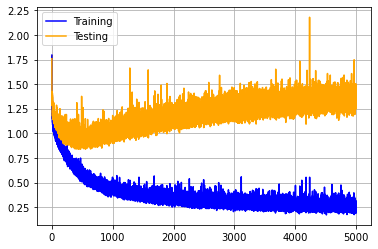

In [10]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

In [11]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.3529920339584351
mean accuracy:  0.7267668962478638


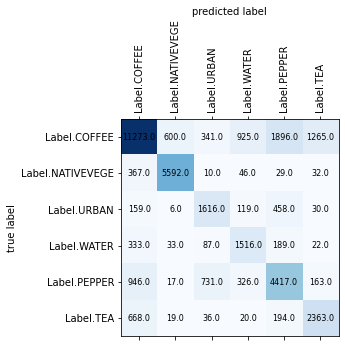

In [12]:
plot_confusion_matrix(conf_matrix, labels)

In [13]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Recalls: ", recall)
print("F-Score: ", fscore)

Precisions:  [0.82009312 0.89229296 0.57284651 0.51355014 0.61492413 0.60980645]
Recalls:  [0.69159509 0.92034233 0.67671692 0.69541284 0.66924242 0.71606061]
F-Score:  [0.75038275 0.90610062 0.62046458 0.59080281 0.64093448 0.65867596]


# 11x11px, NIR, RED, SWIR1 (5000 epochs)

In [17]:
NB_PIXEL_AROUND=5

dataset_args = dict(
    labels = labels,
    raster_paths = [DATA_ROOT_PATH + 'Vietnam_2017_january_march/merged.tif'],
    labels_coordinates_list = [LABELS_COORDINATES],
    nb_pixel_around = NB_PIXEL_AROUND
)

dataset = make_dataset_from_raster_files(**dataset_args)

In [18]:
BANDS = [
    Band.NIR.value,
    Band.RED.value,
    Band.SWIR1.value
]

NB_TESTS = 1
EPOCHS = 5000

In [19]:
# images have all the same shapes, take the shape of the first image
image_width = len(dataset[0][1][0][0])
image_height = len(dataset[0][1][0])
image_depth = len(BANDS)
nb_outputs = len(labels)

# Create model
model = Sequential([
    Rescaling(1./2**16, input_shape=(image_width, image_height, image_depth)),
    Conv2D(filters=8, kernel_size=(3, 3), padding="same", activation="relu"),
    Conv2D(filters=8, kernel_size=(3, 3), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    Conv2D(filters=16, kernel_size=(2, 2), padding="same", activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(name='flat'),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(nb_outputs, activation='softmax'),
])
    
mean_loss, mean_accuracy, histories, conf_matrix = cross_validation(model, dataset, BANDS, labels, EPOCHS, NB_TESTS)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 11, 11, 3)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 11, 11, 8)         224       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 11, 11, 8)         584       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 5, 5, 8)           0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 5, 5, 16)          528       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 5, 5, 16)          1040      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 2, 2, 16)         

57/57 [==============================] - 0s 8ms/step - loss: 0.9103 - accuracy: 0.5642 - val_loss: 1.0793 - val_accuracy: 0.5487
Epoch 103/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9740 - accuracy: 0.5290 - val_loss: 1.1696 - val_accuracy: 0.4751
Epoch 104/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9085 - accuracy: 0.5359 - val_loss: 1.0008 - val_accuracy: 0.5877
Epoch 105/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9443 - accuracy: 0.5761 - val_loss: 1.0183 - val_accuracy: 0.5767
Epoch 106/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9742 - accuracy: 0.5449 - val_loss: 1.0685 - val_accuracy: 0.5737
Epoch 107/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9216 - accuracy: 0.5848 - val_loss: 1.1147 - val_accuracy: 0.5045
Epoch 108/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9940 - accuracy: 0.5267 - val_loss: 1.0490 - val_accuracy: 0.5508
Epoch 1

Epoch 159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8935 - accuracy: 0.5809 - val_loss: 1.0633 - val_accuracy: 0.5319
Epoch 160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9335 - accuracy: 0.5427 - val_loss: 0.9762 - val_accuracy: 0.6115
Epoch 161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8874 - accuracy: 0.5684 - val_loss: 1.0023 - val_accuracy: 0.5810
Epoch 162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8643 - accuracy: 0.5784 - val_loss: 1.0766 - val_accuracy: 0.5383
Epoch 163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8816 - accuracy: 0.5616 - val_loss: 1.0454 - val_accuracy: 0.5595
Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9159 - accuracy: 0.5864 - val_loss: 1.0716 - val_accuracy: 0.5325
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8410 - accuracy: 0.5929 - val_loss: 1.0121 - val_accuracy:

Epoch 216/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7854 - accuracy: 0.5873 - val_loss: 1.0623 - val_accuracy: 0.5352
Epoch 217/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7834 - accuracy: 0.5673 - val_loss: 1.0918 - val_accuracy: 0.5370
Epoch 218/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9032 - accuracy: 0.5600 - val_loss: 1.0691 - val_accuracy: 0.5281
Epoch 219/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8616 - accuracy: 0.5551 - val_loss: 0.9556 - val_accuracy: 0.5994
Epoch 220/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8076 - accuracy: 0.5988 - val_loss: 1.0247 - val_accuracy: 0.5629
Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7827 - accuracy: 0.6105 - val_loss: 1.0274 - val_accuracy: 0.5839
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7976 - accuracy: 0.6061 - val_loss: 1.0412 - val_accuracy:

Epoch 273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7977 - accuracy: 0.6053 - val_loss: 0.9251 - val_accuracy: 0.6248
Epoch 274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7716 - accuracy: 0.5860 - val_loss: 0.9788 - val_accuracy: 0.5924
Epoch 275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7554 - accuracy: 0.6280 - val_loss: 0.9372 - val_accuracy: 0.6199
Epoch 276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8706 - accuracy: 0.5926 - val_loss: 1.0208 - val_accuracy: 0.5625
Epoch 277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8106 - accuracy: 0.5983 - val_loss: 1.0005 - val_accuracy: 0.5793
Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8116 - accuracy: 0.6052 - val_loss: 0.9388 - val_accuracy: 0.6214
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8247 - accuracy: 0.6067 - val_loss: 1.0385 - val_accuracy:

Epoch 330/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7599 - accuracy: 0.5947 - val_loss: 0.9960 - val_accuracy: 0.5784
Epoch 331/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7888 - accuracy: 0.6237 - val_loss: 1.0496 - val_accuracy: 0.5612
Epoch 332/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8038 - accuracy: 0.5953 - val_loss: 0.9296 - val_accuracy: 0.6266
Epoch 333/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7947 - accuracy: 0.6503 - val_loss: 0.9521 - val_accuracy: 0.6083
Epoch 334/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7251 - accuracy: 0.6233 - val_loss: 0.9706 - val_accuracy: 0.5976
Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7426 - accuracy: 0.6170 - val_loss: 0.9837 - val_accuracy: 0.5939
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7471 - accuracy: 0.6396 - val_loss: 0.9584 - val_accuracy:

Epoch 387/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7827 - accuracy: 0.5874 - val_loss: 0.9389 - val_accuracy: 0.6209
Epoch 388/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7305 - accuracy: 0.6253 - val_loss: 0.9188 - val_accuracy: 0.6287
Epoch 389/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6976 - accuracy: 0.6188 - val_loss: 0.9749 - val_accuracy: 0.6085
Epoch 390/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7465 - accuracy: 0.5973 - val_loss: 1.0173 - val_accuracy: 0.5684
Epoch 391/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7230 - accuracy: 0.5981 - val_loss: 1.0100 - val_accuracy: 0.5746
Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7260 - accuracy: 0.6532 - val_loss: 1.0261 - val_accuracy: 0.5837
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6996 - accuracy: 0.6383 - val_loss: 0.9368 - val_accuracy:

Epoch 444/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7187 - accuracy: 0.6173 - val_loss: 0.9915 - val_accuracy: 0.6086
Epoch 445/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7447 - accuracy: 0.6103 - val_loss: 0.9530 - val_accuracy: 0.6073
Epoch 446/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6961 - accuracy: 0.6288 - val_loss: 0.9349 - val_accuracy: 0.6160
Epoch 447/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7328 - accuracy: 0.6191 - val_loss: 1.0583 - val_accuracy: 0.5809
Epoch 448/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7835 - accuracy: 0.6039 - val_loss: 1.0120 - val_accuracy: 0.6035
Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7255 - accuracy: 0.6025 - val_loss: 1.0063 - val_accuracy: 0.5994
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7199 - accuracy: 0.6380 - val_loss: 0.9443 - val_accuracy:

Epoch 501/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7111 - accuracy: 0.6304 - val_loss: 0.9341 - val_accuracy: 0.6268
Epoch 502/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7083 - accuracy: 0.6516 - val_loss: 1.0273 - val_accuracy: 0.5903
Epoch 503/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7168 - accuracy: 0.6199 - val_loss: 0.9339 - val_accuracy: 0.6232
Epoch 504/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7202 - accuracy: 0.6226 - val_loss: 0.9812 - val_accuracy: 0.5965
Epoch 505/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7136 - accuracy: 0.6359 - val_loss: 0.9804 - val_accuracy: 0.6143
Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6962 - accuracy: 0.6542 - val_loss: 1.0658 - val_accuracy: 0.5745
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7367 - accuracy: 0.6050 - val_loss: 1.0349 - val_accuracy:

Epoch 558/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6898 - accuracy: 0.6229 - val_loss: 0.9243 - val_accuracy: 0.6411
Epoch 559/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7162 - accuracy: 0.6582 - val_loss: 0.9604 - val_accuracy: 0.6190
Epoch 560/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.6252 - val_loss: 0.9398 - val_accuracy: 0.6213
Epoch 561/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6970 - accuracy: 0.6366 - val_loss: 0.9156 - val_accuracy: 0.6378
Epoch 562/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6797 - accuracy: 0.6596 - val_loss: 0.9960 - val_accuracy: 0.5946
Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6839 - accuracy: 0.6492 - val_loss: 0.9888 - val_accuracy: 0.5957
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7191 - accuracy: 0.6179 - val_loss: 1.0210 - val_accuracy:

Epoch 615/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6587 - accuracy: 0.6402 - val_loss: 0.9809 - val_accuracy: 0.6082
Epoch 616/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6662 - accuracy: 0.6387 - val_loss: 0.9476 - val_accuracy: 0.6194
Epoch 617/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7059 - accuracy: 0.6048 - val_loss: 0.9410 - val_accuracy: 0.6267
Epoch 618/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6925 - accuracy: 0.6272 - val_loss: 0.9636 - val_accuracy: 0.6130
Epoch 619/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6653 - accuracy: 0.6469 - val_loss: 0.9749 - val_accuracy: 0.6187
Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6752 - accuracy: 0.6593 - val_loss: 0.9789 - val_accuracy: 0.6119
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6885 - accuracy: 0.6521 - val_loss: 0.9357 - val_accuracy:

Epoch 672/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6417 - accuracy: 0.6401 - val_loss: 0.9609 - val_accuracy: 0.6226
Epoch 673/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6701 - accuracy: 0.6574 - val_loss: 0.9212 - val_accuracy: 0.6407
Epoch 674/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6023 - accuracy: 0.6761 - val_loss: 0.9749 - val_accuracy: 0.6049
Epoch 675/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5977 - accuracy: 0.6499 - val_loss: 0.9512 - val_accuracy: 0.6283
Epoch 676/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6732 - accuracy: 0.6578 - val_loss: 1.0502 - val_accuracy: 0.5895
Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6143 - accuracy: 0.6550 - val_loss: 0.9542 - val_accuracy: 0.6172
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7349 - accuracy: 0.6273 - val_loss: 0.9503 - val_accuracy:

Epoch 729/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6568 - accuracy: 0.6688 - val_loss: 0.9174 - val_accuracy: 0.6417
Epoch 730/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6561 - accuracy: 0.6650 - val_loss: 0.9831 - val_accuracy: 0.6281
Epoch 731/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6734 - accuracy: 0.6564 - val_loss: 0.9553 - val_accuracy: 0.6342
Epoch 732/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6778 - accuracy: 0.6748 - val_loss: 1.0023 - val_accuracy: 0.6093
Epoch 733/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6365 - accuracy: 0.6467 - val_loss: 0.9365 - val_accuracy: 0.6400
Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6583 - accuracy: 0.6644 - val_loss: 0.9333 - val_accuracy: 0.6281
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7273 - accuracy: 0.6443 - val_loss: 0.9316 - val_accuracy:

Epoch 786/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6288 - accuracy: 0.6487 - val_loss: 0.9313 - val_accuracy: 0.6456
Epoch 787/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6655 - accuracy: 0.6579 - val_loss: 0.9799 - val_accuracy: 0.6236
Epoch 788/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6110 - accuracy: 0.6774 - val_loss: 1.0500 - val_accuracy: 0.5983
Epoch 789/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6515 - accuracy: 0.6393 - val_loss: 0.9414 - val_accuracy: 0.6285
Epoch 790/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6356 - accuracy: 0.6681 - val_loss: 0.9739 - val_accuracy: 0.6349
Epoch 791/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6202 - accuracy: 0.6525 - val_loss: 0.9449 - val_accuracy: 0.6304
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6371 - accuracy: 0.6581 - val_loss: 0.9368 - val_accuracy:

Epoch 843/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6171 - accuracy: 0.6804 - val_loss: 0.9707 - val_accuracy: 0.6143
Epoch 844/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6396 - accuracy: 0.6550 - val_loss: 0.9554 - val_accuracy: 0.6230
Epoch 845/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5780 - accuracy: 0.6912 - val_loss: 0.9394 - val_accuracy: 0.6434
Epoch 846/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5838 - accuracy: 0.6897 - val_loss: 0.9168 - val_accuracy: 0.6457
Epoch 847/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5681 - accuracy: 0.6896 - val_loss: 0.9774 - val_accuracy: 0.6229
Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5609 - accuracy: 0.6836 - val_loss: 0.9416 - val_accuracy: 0.6374
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6133 - accuracy: 0.6799 - val_loss: 0.9325 - val_accuracy:

Epoch 900/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6319 - accuracy: 0.6511 - val_loss: 0.9346 - val_accuracy: 0.6388
Epoch 901/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6410 - accuracy: 0.6564 - val_loss: 0.9551 - val_accuracy: 0.6324
Epoch 902/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6186 - accuracy: 0.6768 - val_loss: 0.9544 - val_accuracy: 0.6298
Epoch 903/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5974 - accuracy: 0.6590 - val_loss: 0.9409 - val_accuracy: 0.6426
Epoch 904/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6307 - accuracy: 0.6865 - val_loss: 0.9177 - val_accuracy: 0.6475
Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5461 - accuracy: 0.6729 - val_loss: 0.9041 - val_accuracy: 0.6558
Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6476 - accuracy: 0.6901 - val_loss: 0.9489 - val_accuracy:

Epoch 957/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5912 - accuracy: 0.6718 - val_loss: 0.9239 - val_accuracy: 0.6517
Epoch 958/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5482 - accuracy: 0.6842 - val_loss: 0.9239 - val_accuracy: 0.6557
Epoch 959/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5860 - accuracy: 0.6953 - val_loss: 1.0120 - val_accuracy: 0.6014
Epoch 960/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5805 - accuracy: 0.6944 - val_loss: 0.9297 - val_accuracy: 0.6487
Epoch 961/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6248 - accuracy: 0.6799 - val_loss: 0.9366 - val_accuracy: 0.6505
Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6741 - accuracy: 0.6525 - val_loss: 0.9428 - val_accuracy: 0.6392
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5911 - accuracy: 0.6896 - val_loss: 0.9521 - val_accuracy:

Epoch 1014/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6275 - accuracy: 0.6575 - val_loss: 0.9265 - val_accuracy: 0.6543
Epoch 1015/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5856 - accuracy: 0.6840 - val_loss: 0.9157 - val_accuracy: 0.6667
Epoch 1016/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6011 - accuracy: 0.6948 - val_loss: 0.9199 - val_accuracy: 0.6648
Epoch 1017/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5706 - accuracy: 0.6857 - val_loss: 0.9669 - val_accuracy: 0.6198
Epoch 1018/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5266 - accuracy: 0.6886 - val_loss: 0.9626 - val_accuracy: 0.6399
Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5649 - accuracy: 0.6805 - val_loss: 0.9146 - val_accuracy: 0.6673
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6006 - accuracy: 0.6873 - val_loss: 1.0617 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.5274 - accuracy: 0.6953 - val_loss: 0.9562 - val_accuracy: 0.6444
Epoch 1127/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5720 - accuracy: 0.6970 - val_loss: 0.9548 - val_accuracy: 0.6486
Epoch 1128/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5841 - accuracy: 0.6735 - val_loss: 0.9196 - val_accuracy: 0.6801
Epoch 1129/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5517 - accuracy: 0.7156 - val_loss: 0.9712 - val_accuracy: 0.6533
Epoch 1130/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5207 - accuracy: 0.7040 - val_loss: 1.1213 - val_accuracy: 0.6097
Epoch 1131/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6310 - accuracy: 0.6689 - val_loss: 0.8964 - val_accuracy: 0.6839
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5683 - accuracy: 0.7017 - val_loss: 0.9462 - val_accuracy: 0.6671
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5103 - accuracy: 0.6849 - val_loss: 0.9610 - val_accuracy: 0.6533
Epoch 1239/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5166 - accuracy: 0.7233 - val_loss: 0.9467 - val_accuracy: 0.6567
Epoch 1240/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5291 - accuracy: 0.6918 - val_loss: 0.9925 - val_accuracy: 0.6472
Epoch 1241/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5674 - accuracy: 0.6772 - val_loss: 0.9823 - val_accuracy: 0.6547
Epoch 1242/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5187 - accuracy: 0.7076 - val_loss: 0.9795 - val_accuracy: 0.6592
Epoch 1243/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5495 - accuracy: 0.6978 - val_loss: 0.9760 - val_accuracy: 0.6373
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6197 - accuracy: 0.6609 - val_loss: 0.9362 - val_accuracy: 0.6638
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5294 - accuracy: 0.7056 - val_loss: 0.9711 - val_accuracy: 0.6626
Epoch 1351/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4789 - accuracy: 0.7087 - val_loss: 0.9968 - val_accuracy: 0.6342
Epoch 1352/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4780 - accuracy: 0.7132 - val_loss: 0.8883 - val_accuracy: 0.6854
Epoch 1353/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5349 - accuracy: 0.7220 - val_loss: 1.0098 - val_accuracy: 0.6228
Epoch 1354/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5218 - accuracy: 0.7014 - val_loss: 0.9062 - val_accuracy: 0.6657
Epoch 1355/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5352 - accuracy: 0.6974 - val_loss: 0.9294 - val_accuracy: 0.6650
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5059 - accuracy: 0.7070 - val_loss: 1.0473 - val_accuracy: 0.6397
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5707 - accuracy: 0.6928 - val_loss: 1.0666 - val_accuracy: 0.6245
Epoch 1463/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5226 - accuracy: 0.6905 - val_loss: 0.9440 - val_accuracy: 0.6713
Epoch 1464/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5336 - accuracy: 0.7031 - val_loss: 0.9263 - val_accuracy: 0.6667
Epoch 1465/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5086 - accuracy: 0.7024 - val_loss: 0.9441 - val_accuracy: 0.6641
Epoch 1466/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4865 - accuracy: 0.7188 - val_loss: 0.9201 - val_accuracy: 0.6860
Epoch 1467/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5020 - accuracy: 0.7146 - val_loss: 0.9736 - val_accuracy: 0.6533
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4641 - accuracy: 0.7375 - val_loss: 0.9269 - val_accuracy: 0.6789
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5669 - accuracy: 0.6991 - val_loss: 0.9245 - val_accuracy: 0.6644
Epoch 1575/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5021 - accuracy: 0.7011 - val_loss: 0.9333 - val_accuracy: 0.6648
Epoch 1576/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4817 - accuracy: 0.7047 - val_loss: 0.9977 - val_accuracy: 0.6593
Epoch 1577/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5135 - accuracy: 0.7079 - val_loss: 0.8993 - val_accuracy: 0.6872
Epoch 1578/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4987 - accuracy: 0.7323 - val_loss: 0.9985 - val_accuracy: 0.6438
Epoch 1579/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4694 - accuracy: 0.7102 - val_loss: 1.0472 - val_accuracy: 0.6604
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4738 - accuracy: 0.7164 - val_loss: 0.9660 - val_accuracy: 0.6672
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4993 - accuracy: 0.7331 - val_loss: 0.8837 - val_accuracy: 0.6983
Epoch 1687/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4741 - accuracy: 0.7495 - val_loss: 0.9410 - val_accuracy: 0.6857
Epoch 1688/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5580 - accuracy: 0.7076 - val_loss: 0.8952 - val_accuracy: 0.6933
Epoch 1689/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4773 - accuracy: 0.7281 - val_loss: 0.9317 - val_accuracy: 0.6947
Epoch 1690/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4485 - accuracy: 0.7420 - val_loss: 1.0205 - val_accuracy: 0.6683
Epoch 1691/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5570 - accuracy: 0.6900 - val_loss: 1.0788 - val_accuracy: 0.6290
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5436 - accuracy: 0.7055 - val_loss: 0.9986 - val_accuracy: 0.6331
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5361 - accuracy: 0.7189 - val_loss: 0.9999 - val_accuracy: 0.6623
Epoch 1799/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5319 - accuracy: 0.7089 - val_loss: 0.9898 - val_accuracy: 0.6608
Epoch 1800/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4322 - accuracy: 0.7266 - val_loss: 0.9375 - val_accuracy: 0.6665
Epoch 1801/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4568 - accuracy: 0.7251 - val_loss: 0.9580 - val_accuracy: 0.6540
Epoch 1802/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4978 - accuracy: 0.6996 - val_loss: 1.0129 - val_accuracy: 0.6483
Epoch 1803/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4532 - accuracy: 0.7198 - val_loss: 1.0391 - val_accuracy: 0.6574
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4997 - accuracy: 0.7193 - val_loss: 0.9908 - val_accuracy: 0.6639
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4740 - accuracy: 0.7316 - val_loss: 0.9386 - val_accuracy: 0.6850
Epoch 1911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4631 - accuracy: 0.7382 - val_loss: 0.9783 - val_accuracy: 0.6809
Epoch 1912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4662 - accuracy: 0.7375 - val_loss: 1.0058 - val_accuracy: 0.6637
Epoch 1913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4925 - accuracy: 0.7105 - val_loss: 0.9628 - val_accuracy: 0.6678
Epoch 1914/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4717 - accuracy: 0.7277 - val_loss: 0.9691 - val_accuracy: 0.6794
Epoch 1915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4929 - accuracy: 0.7355 - val_loss: 0.8930 - val_accuracy: 0.7027
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5093 - accuracy: 0.7158 - val_loss: 0.9514 - val_accuracy: 0.6737
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4795 - accuracy: 0.7061 - val_loss: 1.0226 - val_accuracy: 0.6427
Epoch 2023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4780 - accuracy: 0.7265 - val_loss: 0.9672 - val_accuracy: 0.6680
Epoch 2024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4879 - accuracy: 0.7295 - val_loss: 0.9946 - val_accuracy: 0.6603
Epoch 2025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4595 - accuracy: 0.7207 - val_loss: 1.0087 - val_accuracy: 0.6449
Epoch 2026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4646 - accuracy: 0.7112 - val_loss: 0.9422 - val_accuracy: 0.6812
Epoch 2027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4658 - accuracy: 0.7205 - val_loss: 0.9422 - val_accuracy: 0.6982
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4385 - accuracy: 0.7368 - val_loss: 0.9579 - val_accuracy: 0.6709
E

57/57 [==============================] - 1s 9ms/step - loss: 0.4208 - accuracy: 0.7393 - val_loss: 1.0858 - val_accuracy: 0.6707
Epoch 2135/5000
57/57 [==============================] - 1s 9ms/step - loss: 0.5552 - accuracy: 0.7247 - val_loss: 0.9693 - val_accuracy: 0.6812
Epoch 2136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4439 - accuracy: 0.7565 - val_loss: 0.9741 - val_accuracy: 0.6804
Epoch 2137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4033 - accuracy: 0.7496 - val_loss: 1.0501 - val_accuracy: 0.6725
Epoch 2138/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.5014 - accuracy: 0.7108 - val_loss: 0.9605 - val_accuracy: 0.7036
Epoch 2139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4584 - accuracy: 0.7648 - val_loss: 0.9631 - val_accuracy: 0.6880
Epoch 2140/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4839 - accuracy: 0.7344 - val_loss: 0.9908 - val_accuracy: 0.6858
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4765 - accuracy: 0.7210 - val_loss: 0.9759 - val_accuracy: 0.6964
Epoch 2247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4323 - accuracy: 0.7470 - val_loss: 1.0057 - val_accuracy: 0.6673
Epoch 2248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4898 - accuracy: 0.7171 - val_loss: 0.9668 - val_accuracy: 0.6612
Epoch 2249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4488 - accuracy: 0.7226 - val_loss: 0.9461 - val_accuracy: 0.6926
Epoch 2250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4703 - accuracy: 0.7382 - val_loss: 0.9961 - val_accuracy: 0.6773
Epoch 2251/5000
57/57 [==============================] - 1s 9ms/step - loss: 0.4816 - accuracy: 0.7108 - val_loss: 0.9867 - val_accuracy: 0.6694
Epoch 2252/5000
57/57 [==============================] - 1s 9ms/step - loss: 0.4701 - accuracy: 0.7201 - val_loss: 1.0239 - val_accuracy: 0.6676
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4623 - accuracy: 0.6987 - val_loss: 1.0698 - val_accuracy: 0.6557
Epoch 2359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4444 - accuracy: 0.7305 - val_loss: 0.9533 - val_accuracy: 0.6858
Epoch 2360/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.5439 - accuracy: 0.6922 - val_loss: 0.9416 - val_accuracy: 0.6808
Epoch 2361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4836 - accuracy: 0.7258 - val_loss: 0.9435 - val_accuracy: 0.6809
Epoch 2362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4284 - accuracy: 0.7463 - val_loss: 1.0308 - val_accuracy: 0.6777
Epoch 2363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4791 - accuracy: 0.7251 - val_loss: 1.0311 - val_accuracy: 0.6499
Epoch 2364/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4542 - accuracy: 0.7361 - val_loss: 0.9911 - val_accuracy: 0.6816
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3800 - accuracy: 0.7527 - val_loss: 0.9750 - val_accuracy: 0.6917
Epoch 2471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4125 - accuracy: 0.7438 - val_loss: 1.0528 - val_accuracy: 0.6630
Epoch 2472/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4332 - accuracy: 0.7278 - val_loss: 1.0178 - val_accuracy: 0.6614
Epoch 2473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4207 - accuracy: 0.7330 - val_loss: 1.0188 - val_accuracy: 0.6828
Epoch 2474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4082 - accuracy: 0.7448 - val_loss: 1.0478 - val_accuracy: 0.6610
Epoch 2475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4542 - accuracy: 0.7177 - val_loss: 1.0438 - val_accuracy: 0.6692
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4792 - accuracy: 0.7276 - val_loss: 1.1138 - val_accuracy: 0.6815
E

57/57 [==============================] - 1s 9ms/step - loss: 0.4312 - accuracy: 0.7277 - val_loss: 0.9579 - val_accuracy: 0.7020
Epoch 2583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3961 - accuracy: 0.7577 - val_loss: 0.9779 - val_accuracy: 0.6941
Epoch 2584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4443 - accuracy: 0.7364 - val_loss: 1.0459 - val_accuracy: 0.6736
Epoch 2585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4270 - accuracy: 0.7316 - val_loss: 0.9523 - val_accuracy: 0.7024
Epoch 2586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4288 - accuracy: 0.7467 - val_loss: 0.9863 - val_accuracy: 0.6781
Epoch 2587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4189 - accuracy: 0.7323 - val_loss: 1.0131 - val_accuracy: 0.6862
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3911 - accuracy: 0.7508 - val_loss: 1.0470 - val_accuracy: 0.6803
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3902 - accuracy: 0.7582 - val_loss: 1.0291 - val_accuracy: 0.6887
Epoch 2695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4699 - accuracy: 0.7322 - val_loss: 0.9901 - val_accuracy: 0.6918
Epoch 2696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4239 - accuracy: 0.7598 - val_loss: 1.0951 - val_accuracy: 0.6630
Epoch 2697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4295 - accuracy: 0.7619 - val_loss: 1.0344 - val_accuracy: 0.6881
Epoch 2698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3983 - accuracy: 0.7677 - val_loss: 1.0628 - val_accuracy: 0.6688
Epoch 2699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4415 - accuracy: 0.7342 - val_loss: 1.0329 - val_accuracy: 0.6797
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4866 - accuracy: 0.7341 - val_loss: 0.9787 - val_accuracy: 0.6864
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3967 - accuracy: 0.7686 - val_loss: 0.9868 - val_accuracy: 0.6973
Epoch 2807/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4252 - accuracy: 0.7385 - val_loss: 1.0021 - val_accuracy: 0.7035
Epoch 2808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4111 - accuracy: 0.7527 - val_loss: 0.9666 - val_accuracy: 0.6933
Epoch 2809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3880 - accuracy: 0.7672 - val_loss: 1.0063 - val_accuracy: 0.6883
Epoch 2810/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.3725 - accuracy: 0.7612 - val_loss: 1.0258 - val_accuracy: 0.6967
Epoch 2811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7555 - val_loss: 0.9991 - val_accuracy: 0.7053
Epoch 2812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4123 - accuracy: 0.7612 - val_loss: 1.0290 - val_accuracy: 0.6843
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3976 - accuracy: 0.7574 - val_loss: 0.9923 - val_accuracy: 0.7058
Epoch 2919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4813 - accuracy: 0.7151 - val_loss: 1.0271 - val_accuracy: 0.6884
Epoch 2920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4203 - accuracy: 0.7448 - val_loss: 0.9869 - val_accuracy: 0.6899
Epoch 2921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4197 - accuracy: 0.7383 - val_loss: 1.1857 - val_accuracy: 0.6539
Epoch 2922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4541 - accuracy: 0.7167 - val_loss: 1.0523 - val_accuracy: 0.6945
Epoch 2923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4749 - accuracy: 0.7287 - val_loss: 1.1331 - val_accuracy: 0.6663
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4919 - accuracy: 0.7299 - val_loss: 1.0279 - val_accuracy: 0.6958
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4313 - accuracy: 0.7497 - val_loss: 1.0698 - val_accuracy: 0.6827
Epoch 3031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4148 - accuracy: 0.7567 - val_loss: 1.0212 - val_accuracy: 0.6892
Epoch 3032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3933 - accuracy: 0.7629 - val_loss: 1.0830 - val_accuracy: 0.6906
Epoch 3033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3830 - accuracy: 0.7754 - val_loss: 1.0495 - val_accuracy: 0.6782
Epoch 3034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4308 - accuracy: 0.7329 - val_loss: 1.0825 - val_accuracy: 0.6701
Epoch 3035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3691 - accuracy: 0.7453 - val_loss: 1.0280 - val_accuracy: 0.7080
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3785 - accuracy: 0.7545 - val_loss: 0.9919 - val_accuracy: 0.6968
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3538 - accuracy: 0.7644 - val_loss: 1.0391 - val_accuracy: 0.6966
Epoch 3143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3953 - accuracy: 0.7601 - val_loss: 1.0745 - val_accuracy: 0.6967
Epoch 3144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3609 - accuracy: 0.7704 - val_loss: 1.0864 - val_accuracy: 0.6875
Epoch 3145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4123 - accuracy: 0.7394 - val_loss: 1.0485 - val_accuracy: 0.6887
Epoch 3146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4212 - accuracy: 0.7424 - val_loss: 1.0658 - val_accuracy: 0.6967
Epoch 3147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4161 - accuracy: 0.7335 - val_loss: 0.9947 - val_accuracy: 0.7136
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4690 - accuracy: 0.7461 - val_loss: 1.0765 - val_accuracy: 0.7053
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3953 - accuracy: 0.7599 - val_loss: 1.0135 - val_accuracy: 0.7168
Epoch 3255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4396 - accuracy: 0.7522 - val_loss: 1.1010 - val_accuracy: 0.6943
Epoch 3256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4162 - accuracy: 0.7340 - val_loss: 1.0185 - val_accuracy: 0.7004
Epoch 3257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3746 - accuracy: 0.7737 - val_loss: 1.0153 - val_accuracy: 0.6975
Epoch 3258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4324 - accuracy: 0.7574 - val_loss: 1.1012 - val_accuracy: 0.6731
Epoch 3259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4493 - accuracy: 0.7707 - val_loss: 1.0622 - val_accuracy: 0.6898
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4282 - accuracy: 0.7696 - val_loss: 1.0948 - val_accuracy: 0.6668
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3726 - accuracy: 0.7522 - val_loss: 1.0418 - val_accuracy: 0.7140
Epoch 3367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4207 - accuracy: 0.7532 - val_loss: 1.1144 - val_accuracy: 0.6932
Epoch 3368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3714 - accuracy: 0.7893 - val_loss: 1.0604 - val_accuracy: 0.6947
Epoch 3369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3721 - accuracy: 0.7695 - val_loss: 1.1398 - val_accuracy: 0.6804
Epoch 3370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4121 - accuracy: 0.7481 - val_loss: 1.0597 - val_accuracy: 0.7012
Epoch 3371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4106 - accuracy: 0.7805 - val_loss: 1.0223 - val_accuracy: 0.6900
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4081 - accuracy: 0.7511 - val_loss: 1.1446 - val_accuracy: 0.6592
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3766 - accuracy: 0.7673 - val_loss: 1.0989 - val_accuracy: 0.7031
Epoch 3479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3890 - accuracy: 0.7535 - val_loss: 1.1274 - val_accuracy: 0.6736
Epoch 3480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3698 - accuracy: 0.7688 - val_loss: 1.0624 - val_accuracy: 0.6971
Epoch 3481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3606 - accuracy: 0.7600 - val_loss: 1.0782 - val_accuracy: 0.7128
Epoch 3482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4558 - accuracy: 0.7642 - val_loss: 1.1372 - val_accuracy: 0.6607
Epoch 3483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4272 - accuracy: 0.7112 - val_loss: 1.1775 - val_accuracy: 0.7047
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4676 - accuracy: 0.7239 - val_loss: 1.1600 - val_accuracy: 0.6842
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3891 - accuracy: 0.7427 - val_loss: 1.0959 - val_accuracy: 0.7077
Epoch 3591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4153 - accuracy: 0.7646 - val_loss: 1.1160 - val_accuracy: 0.7077
Epoch 3592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4155 - accuracy: 0.7576 - val_loss: 1.0812 - val_accuracy: 0.6948
Epoch 3593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3796 - accuracy: 0.7419 - val_loss: 1.0333 - val_accuracy: 0.7107
Epoch 3594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3321 - accuracy: 0.7955 - val_loss: 1.0792 - val_accuracy: 0.6967
Epoch 3595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4048 - accuracy: 0.7301 - val_loss: 1.0403 - val_accuracy: 0.7176
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3453 - accuracy: 0.7703 - val_loss: 1.0641 - val_accuracy: 0.7234
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3518 - accuracy: 0.7843 - val_loss: 1.0851 - val_accuracy: 0.6808
Epoch 3703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3763 - accuracy: 0.7410 - val_loss: 1.1075 - val_accuracy: 0.6996
Epoch 3704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4476 - accuracy: 0.7423 - val_loss: 0.9964 - val_accuracy: 0.7084
Epoch 3705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4417 - accuracy: 0.7380 - val_loss: 1.1033 - val_accuracy: 0.6767
Epoch 3706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3642 - accuracy: 0.7498 - val_loss: 1.1435 - val_accuracy: 0.6994
Epoch 3707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3963 - accuracy: 0.7631 - val_loss: 1.0920 - val_accuracy: 0.6920
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3610 - accuracy: 0.7696 - val_loss: 1.0741 - val_accuracy: 0.6930
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4114 - accuracy: 0.7208 - val_loss: 1.1620 - val_accuracy: 0.6818
Epoch 3815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4280 - accuracy: 0.7369 - val_loss: 1.0520 - val_accuracy: 0.6966
Epoch 3816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3849 - accuracy: 0.7665 - val_loss: 1.1434 - val_accuracy: 0.6869
Epoch 3817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3592 - accuracy: 0.7808 - val_loss: 1.1207 - val_accuracy: 0.7164
Epoch 3818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4039 - accuracy: 0.7410 - val_loss: 1.0966 - val_accuracy: 0.7009
Epoch 3819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3757 - accuracy: 0.7682 - val_loss: 1.1379 - val_accuracy: 0.6977
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5308 - accuracy: 0.7017 - val_loss: 1.1612 - val_accuracy: 0.6682
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3731 - accuracy: 0.7634 - val_loss: 1.1178 - val_accuracy: 0.6856
Epoch 3927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3420 - accuracy: 0.7715 - val_loss: 1.1368 - val_accuracy: 0.6694
Epoch 3928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3834 - accuracy: 0.7669 - val_loss: 1.1204 - val_accuracy: 0.6973
Epoch 3929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4265 - accuracy: 0.7652 - val_loss: 1.0804 - val_accuracy: 0.7060
Epoch 3930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3489 - accuracy: 0.7642 - val_loss: 1.0703 - val_accuracy: 0.7074
Epoch 3931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3498 - accuracy: 0.7944 - val_loss: 1.2242 - val_accuracy: 0.6619
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4144 - accuracy: 0.7468 - val_loss: 1.0498 - val_accuracy: 0.7102
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4453 - accuracy: 0.7693 - val_loss: 0.9902 - val_accuracy: 0.7046
Epoch 4039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4553 - accuracy: 0.7338 - val_loss: 1.0089 - val_accuracy: 0.7004
Epoch 4040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3646 - accuracy: 0.7598 - val_loss: 1.0499 - val_accuracy: 0.7126
Epoch 4041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3528 - accuracy: 0.7758 - val_loss: 1.0789 - val_accuracy: 0.7066
Epoch 4042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4047 - accuracy: 0.7734 - val_loss: 0.9964 - val_accuracy: 0.7170
Epoch 4043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4042 - accuracy: 0.7571 - val_loss: 1.0243 - val_accuracy: 0.7182
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3440 - accuracy: 0.7856 - val_loss: 1.0280 - val_accuracy: 0.6998
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3017 - accuracy: 0.7788 - val_loss: 1.0659 - val_accuracy: 0.7095
Epoch 4151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3856 - accuracy: 0.7545 - val_loss: 1.0346 - val_accuracy: 0.7049
Epoch 4152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3830 - accuracy: 0.7556 - val_loss: 1.0894 - val_accuracy: 0.7009
Epoch 4153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3684 - accuracy: 0.7572 - val_loss: 1.0693 - val_accuracy: 0.7024
Epoch 4154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3933 - accuracy: 0.7675 - val_loss: 1.1102 - val_accuracy: 0.6858
Epoch 4155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4165 - accuracy: 0.7357 - val_loss: 1.0165 - val_accuracy: 0.7133
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3880 - accuracy: 0.7360 - val_loss: 1.0196 - val_accuracy: 0.7036
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3467 - accuracy: 0.7874 - val_loss: 1.1272 - val_accuracy: 0.7023
Epoch 4263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4067 - accuracy: 0.7566 - val_loss: 1.0347 - val_accuracy: 0.6928
Epoch 4264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3654 - accuracy: 0.7509 - val_loss: 1.0268 - val_accuracy: 0.7084
Epoch 4265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3476 - accuracy: 0.7604 - val_loss: 1.0402 - val_accuracy: 0.6987
Epoch 4266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3649 - accuracy: 0.7529 - val_loss: 1.4458 - val_accuracy: 0.6330
Epoch 4267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4596 - accuracy: 0.7180 - val_loss: 1.0849 - val_accuracy: 0.6967
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3471 - accuracy: 0.7726 - val_loss: 1.0948 - val_accuracy: 0.7062
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3703 - accuracy: 0.7742 - val_loss: 1.0673 - val_accuracy: 0.7186
Epoch 4375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3692 - accuracy: 0.7700 - val_loss: 1.1569 - val_accuracy: 0.6824
Epoch 4376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3433 - accuracy: 0.7720 - val_loss: 1.0626 - val_accuracy: 0.6932
Epoch 4377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3479 - accuracy: 0.7611 - val_loss: 1.1001 - val_accuracy: 0.7104
Epoch 4378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3555 - accuracy: 0.7826 - val_loss: 1.0745 - val_accuracy: 0.6981
Epoch 4379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3630 - accuracy: 0.7713 - val_loss: 1.1032 - val_accuracy: 0.7081
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3707 - accuracy: 0.7543 - val_loss: 1.1375 - val_accuracy: 0.7136
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3909 - accuracy: 0.7888 - val_loss: 1.0659 - val_accuracy: 0.7115
Epoch 4487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3633 - accuracy: 0.7831 - val_loss: 1.1811 - val_accuracy: 0.6959
Epoch 4488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3450 - accuracy: 0.7617 - val_loss: 1.0879 - val_accuracy: 0.7107
Epoch 4489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3630 - accuracy: 0.7676 - val_loss: 1.0705 - val_accuracy: 0.7077
Epoch 4490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3622 - accuracy: 0.7926 - val_loss: 1.2111 - val_accuracy: 0.7079
Epoch 4491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4512 - accuracy: 0.7483 - val_loss: 1.0207 - val_accuracy: 0.7049
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3555 - accuracy: 0.7559 - val_loss: 1.0499 - val_accuracy: 0.7142
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3578 - accuracy: 0.7768 - val_loss: 1.2770 - val_accuracy: 0.6675
Epoch 4599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3846 - accuracy: 0.7541 - val_loss: 1.0766 - val_accuracy: 0.6975
Epoch 4600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3935 - accuracy: 0.7639 - val_loss: 1.0521 - val_accuracy: 0.6997
Epoch 4601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3316 - accuracy: 0.7784 - val_loss: 1.0479 - val_accuracy: 0.7157
Epoch 4602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3502 - accuracy: 0.7732 - val_loss: 1.0377 - val_accuracy: 0.7235
Epoch 4603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3752 - accuracy: 0.7687 - val_loss: 1.0544 - val_accuracy: 0.7137
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3878 - accuracy: 0.7925 - val_loss: 1.1279 - val_accuracy: 0.6962
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3484 - accuracy: 0.7856 - val_loss: 1.1167 - val_accuracy: 0.6890
Epoch 4711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3798 - accuracy: 0.7664 - val_loss: 1.1781 - val_accuracy: 0.6872
Epoch 4712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3587 - accuracy: 0.7671 - val_loss: 1.2140 - val_accuracy: 0.6815
Epoch 4713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3641 - accuracy: 0.7778 - val_loss: 1.0771 - val_accuracy: 0.6888
Epoch 4714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3302 - accuracy: 0.7825 - val_loss: 1.1355 - val_accuracy: 0.7007
Epoch 4715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4053 - accuracy: 0.7639 - val_loss: 1.0410 - val_accuracy: 0.7111
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3464 - accuracy: 0.7758 - val_loss: 1.0800 - val_accuracy: 0.7011
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3957 - accuracy: 0.7603 - val_loss: 1.0462 - val_accuracy: 0.7185
Epoch 4823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3633 - accuracy: 0.7876 - val_loss: 1.0360 - val_accuracy: 0.7047
Epoch 4824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3486 - accuracy: 0.7868 - val_loss: 1.1087 - val_accuracy: 0.7016
Epoch 4825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3515 - accuracy: 0.7959 - val_loss: 1.0622 - val_accuracy: 0.7042
Epoch 4826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3651 - accuracy: 0.7583 - val_loss: 1.0751 - val_accuracy: 0.7001
Epoch 4827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3996 - accuracy: 0.7750 - val_loss: 1.0932 - val_accuracy: 0.6856
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3447 - accuracy: 0.7606 - val_loss: 1.0685 - val_accuracy: 0.7217
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3795 - accuracy: 0.7385 - val_loss: 1.1223 - val_accuracy: 0.6909
Epoch 4935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3546 - accuracy: 0.7831 - val_loss: 1.0472 - val_accuracy: 0.7122
Epoch 4936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3228 - accuracy: 0.7827 - val_loss: 1.1159 - val_accuracy: 0.6913
Epoch 4937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3863 - accuracy: 0.7420 - val_loss: 1.0735 - val_accuracy: 0.7065
Epoch 4938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3745 - accuracy: 0.7460 - val_loss: 1.0982 - val_accuracy: 0.7064
Epoch 4939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4158 - accuracy: 0.7716 - val_loss: 1.0513 - val_accuracy: 0.6934
Epoch 4940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4336 - accuracy: 0.7600 - val_loss: 1.1515 - val_accuracy: 0.6852
E

57/57 [==============================] - 0s 8ms/step - loss: 1.0231 - accuracy: 0.5312 - val_loss: 1.0944 - val_accuracy: 0.5486
Epoch 48/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0481 - accuracy: 0.4959 - val_loss: 1.0933 - val_accuracy: 0.5353
Epoch 49/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0610 - accuracy: 0.5506 - val_loss: 1.1513 - val_accuracy: 0.4654
Epoch 50/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0512 - accuracy: 0.5332 - val_loss: 1.0995 - val_accuracy: 0.5570
Epoch 51/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0344 - accuracy: 0.5272 - val_loss: 1.1128 - val_accuracy: 0.5566
Epoch 52/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0201 - accuracy: 0.5376 - val_loss: 1.0535 - val_accuracy: 0.5792
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0706 - accuracy: 0.4996 - val_loss: 1.0582 - val_accuracy: 0.5781
Epoch 54/5000

Epoch 161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9132 - accuracy: 0.5476 - val_loss: 1.0275 - val_accuracy: 0.5732
Epoch 162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8406 - accuracy: 0.5781 - val_loss: 1.0083 - val_accuracy: 0.5941
Epoch 163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8964 - accuracy: 0.5727 - val_loss: 0.9770 - val_accuracy: 0.5784
Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8662 - accuracy: 0.5854 - val_loss: 0.9959 - val_accuracy: 0.5548
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8552 - accuracy: 0.5719 - val_loss: 0.9886 - val_accuracy: 0.5789
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8649 - accuracy: 0.5464 - val_loss: 1.0637 - val_accuracy: 0.5642
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8361 - accuracy: 0.5664 - val_loss: 1.0469 - val_accuracy:

Epoch 218/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8444 - accuracy: 0.5463 - val_loss: 0.9774 - val_accuracy: 0.5932
Epoch 219/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8775 - accuracy: 0.5625 - val_loss: 0.9671 - val_accuracy: 0.5833
Epoch 220/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8335 - accuracy: 0.5702 - val_loss: 1.0300 - val_accuracy: 0.5566
Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8636 - accuracy: 0.5608 - val_loss: 0.9490 - val_accuracy: 0.5922
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8357 - accuracy: 0.5877 - val_loss: 0.9865 - val_accuracy: 0.5909
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8179 - accuracy: 0.5982 - val_loss: 1.0251 - val_accuracy: 0.5790
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8379 - accuracy: 0.5939 - val_loss: 0.9856 - val_accuracy:

Epoch 275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8004 - accuracy: 0.5790 - val_loss: 0.9167 - val_accuracy: 0.6111
Epoch 276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7957 - accuracy: 0.5988 - val_loss: 0.9726 - val_accuracy: 0.5903
Epoch 277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7996 - accuracy: 0.6150 - val_loss: 0.9635 - val_accuracy: 0.6034
Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8041 - accuracy: 0.5732 - val_loss: 1.0129 - val_accuracy: 0.5676
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7761 - accuracy: 0.5924 - val_loss: 0.9289 - val_accuracy: 0.6170
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7826 - accuracy: 0.5995 - val_loss: 0.9413 - val_accuracy: 0.6092
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7832 - accuracy: 0.6019 - val_loss: 0.9343 - val_accuracy:

Epoch 332/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7500 - accuracy: 0.6136 - val_loss: 0.9847 - val_accuracy: 0.6102
Epoch 333/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8291 - accuracy: 0.5731 - val_loss: 0.9338 - val_accuracy: 0.6129
Epoch 334/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8314 - accuracy: 0.6020 - val_loss: 0.9248 - val_accuracy: 0.6111
Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7471 - accuracy: 0.6027 - val_loss: 0.9156 - val_accuracy: 0.6220
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7530 - accuracy: 0.6191 - val_loss: 0.9131 - val_accuracy: 0.6220
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7406 - accuracy: 0.6267 - val_loss: 0.9633 - val_accuracy: 0.6179
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8037 - accuracy: 0.6097 - val_loss: 0.9635 - val_accuracy:

Epoch 389/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6973 - accuracy: 0.6072 - val_loss: 0.9552 - val_accuracy: 0.5963
Epoch 390/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7334 - accuracy: 0.6212 - val_loss: 0.9795 - val_accuracy: 0.5827
Epoch 391/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7306 - accuracy: 0.5961 - val_loss: 0.9219 - val_accuracy: 0.6220
Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7453 - accuracy: 0.6111 - val_loss: 0.9628 - val_accuracy: 0.5888
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7306 - accuracy: 0.6172 - val_loss: 1.0186 - val_accuracy: 0.5714
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7780 - accuracy: 0.5960 - val_loss: 1.0507 - val_accuracy: 0.5448
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7417 - accuracy: 0.6036 - val_loss: 0.9137 - val_accuracy:

Epoch 446/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7471 - accuracy: 0.6288 - val_loss: 0.9503 - val_accuracy: 0.6155
Epoch 447/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8211 - accuracy: 0.5799 - val_loss: 0.9056 - val_accuracy: 0.6326
Epoch 448/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7256 - accuracy: 0.6214 - val_loss: 0.9524 - val_accuracy: 0.6019
Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7256 - accuracy: 0.5835 - val_loss: 0.9470 - val_accuracy: 0.6149
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7095 - accuracy: 0.6042 - val_loss: 0.8943 - val_accuracy: 0.6304
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6735 - accuracy: 0.6312 - val_loss: 0.9928 - val_accuracy: 0.6034
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7306 - accuracy: 0.6347 - val_loss: 0.9456 - val_accuracy:

Epoch 503/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7384 - accuracy: 0.6057 - val_loss: 0.9192 - val_accuracy: 0.6068
Epoch 504/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6675 - accuracy: 0.6492 - val_loss: 0.9378 - val_accuracy: 0.6161
Epoch 505/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7232 - accuracy: 0.6105 - val_loss: 0.9272 - val_accuracy: 0.6236
Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6771 - accuracy: 0.6384 - val_loss: 0.9133 - val_accuracy: 0.6284
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6748 - accuracy: 0.6393 - val_loss: 1.1424 - val_accuracy: 0.5225
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8547 - accuracy: 0.5782 - val_loss: 0.9501 - val_accuracy: 0.5997
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6323 - accuracy: 0.6537 - val_loss: 0.9183 - val_accuracy:

Epoch 560/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6480 - accuracy: 0.6576 - val_loss: 1.0021 - val_accuracy: 0.5656
Epoch 561/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7029 - accuracy: 0.6167 - val_loss: 0.8959 - val_accuracy: 0.6352
Epoch 562/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6843 - accuracy: 0.6329 - val_loss: 0.8893 - val_accuracy: 0.6427
Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6570 - accuracy: 0.6489 - val_loss: 0.9602 - val_accuracy: 0.5837
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6909 - accuracy: 0.6141 - val_loss: 0.9349 - val_accuracy: 0.6132
Epoch 565/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6340 - accuracy: 0.6502 - val_loss: 0.9446 - val_accuracy: 0.6219
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6797 - accuracy: 0.6093 - val_loss: 0.9526 - val_accuracy:

Epoch 617/5000
57/57 [==============================] - 1s 9ms/step - loss: 0.6580 - accuracy: 0.6475 - val_loss: 0.9304 - val_accuracy: 0.6374
Epoch 618/5000
57/57 [==============================] - 1s 9ms/step - loss: 0.6629 - accuracy: 0.6606 - val_loss: 0.8838 - val_accuracy: 0.6473
Epoch 619/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6459 - accuracy: 0.6690 - val_loss: 0.9179 - val_accuracy: 0.6380
Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6207 - accuracy: 0.6544 - val_loss: 0.9930 - val_accuracy: 0.5909
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6509 - accuracy: 0.6305 - val_loss: 0.9322 - val_accuracy: 0.6408
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6461 - accuracy: 0.6474 - val_loss: 0.9639 - val_accuracy: 0.6117
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6525 - accuracy: 0.6420 - val_loss: 0.9242 - val_accuracy:

Epoch 674/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6637 - accuracy: 0.6284 - val_loss: 0.9663 - val_accuracy: 0.6273
Epoch 675/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5726 - accuracy: 0.6738 - val_loss: 0.9130 - val_accuracy: 0.6413
Epoch 676/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6112 - accuracy: 0.6643 - val_loss: 1.0733 - val_accuracy: 0.5601
Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7308 - accuracy: 0.6379 - val_loss: 0.9065 - val_accuracy: 0.6374
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6348 - accuracy: 0.6490 - val_loss: 0.9792 - val_accuracy: 0.6064
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6935 - accuracy: 0.6349 - val_loss: 0.9317 - val_accuracy: 0.6133
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6408 - accuracy: 0.6458 - val_loss: 0.9892 - val_accuracy:

Epoch 731/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6431 - accuracy: 0.6465 - val_loss: 0.9352 - val_accuracy: 0.6363
Epoch 732/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6691 - accuracy: 0.6542 - val_loss: 0.9684 - val_accuracy: 0.5941
Epoch 733/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6072 - accuracy: 0.6668 - val_loss: 0.9140 - val_accuracy: 0.6348
Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6545 - accuracy: 0.6531 - val_loss: 0.9045 - val_accuracy: 0.6323
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.6322 - val_loss: 0.9342 - val_accuracy: 0.6350
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6234 - accuracy: 0.6449 - val_loss: 0.9151 - val_accuracy: 0.6433
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6276 - accuracy: 0.6455 - val_loss: 1.2961 - val_accuracy:

Epoch 788/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6413 - accuracy: 0.6411 - val_loss: 0.9370 - val_accuracy: 0.6318
Epoch 789/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6040 - accuracy: 0.6808 - val_loss: 0.9350 - val_accuracy: 0.6282
Epoch 790/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5975 - accuracy: 0.6590 - val_loss: 0.9639 - val_accuracy: 0.6176
Epoch 791/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6187 - accuracy: 0.6374 - val_loss: 0.9570 - val_accuracy: 0.6140
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6490 - accuracy: 0.6213 - val_loss: 0.9317 - val_accuracy: 0.6293
Epoch 793/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6307 - accuracy: 0.6622 - val_loss: 0.9653 - val_accuracy: 0.6193
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5916 - accuracy: 0.6615 - val_loss: 0.9908 - val_accuracy:

Epoch 845/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6324 - accuracy: 0.6357 - val_loss: 0.9187 - val_accuracy: 0.6334
Epoch 846/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5830 - accuracy: 0.6754 - val_loss: 0.9889 - val_accuracy: 0.6015
Epoch 847/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6703 - accuracy: 0.6238 - val_loss: 0.9587 - val_accuracy: 0.6182
Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6688 - accuracy: 0.6487 - val_loss: 0.9289 - val_accuracy: 0.6269
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5963 - accuracy: 0.6565 - val_loss: 1.0042 - val_accuracy: 0.6227
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6032 - accuracy: 0.6599 - val_loss: 0.9869 - val_accuracy: 0.6227
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7023 - accuracy: 0.6390 - val_loss: 0.9590 - val_accuracy:

Epoch 902/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6208 - accuracy: 0.6524 - val_loss: 0.9143 - val_accuracy: 0.6405
Epoch 903/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6065 - accuracy: 0.6799 - val_loss: 0.9433 - val_accuracy: 0.6439
Epoch 904/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6277 - accuracy: 0.6393 - val_loss: 0.9545 - val_accuracy: 0.6420
Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6407 - accuracy: 0.6404 - val_loss: 0.9446 - val_accuracy: 0.6371
Epoch 906/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6142 - accuracy: 0.6531 - val_loss: 0.9793 - val_accuracy: 0.6163
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6348 - accuracy: 0.6496 - val_loss: 0.9571 - val_accuracy: 0.6274
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6533 - accuracy: 0.6576 - val_loss: 0.9969 - val_accuracy:

Epoch 959/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5952 - accuracy: 0.6980 - val_loss: 1.0280 - val_accuracy: 0.6064
Epoch 960/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6113 - accuracy: 0.6417 - val_loss: 0.9594 - val_accuracy: 0.6368
Epoch 961/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5738 - accuracy: 0.6917 - val_loss: 0.9141 - val_accuracy: 0.6346
Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5302 - accuracy: 0.6990 - val_loss: 0.9365 - val_accuracy: 0.6359
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6248 - accuracy: 0.6542 - val_loss: 0.9747 - val_accuracy: 0.6280
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6203 - accuracy: 0.6523 - val_loss: 0.9346 - val_accuracy: 0.6225
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6120 - accuracy: 0.6611 - val_loss: 0.9624 - val_accuracy:

Epoch 1016/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5603 - accuracy: 0.6879 - val_loss: 0.9904 - val_accuracy: 0.6363
Epoch 1017/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6397 - accuracy: 0.6429 - val_loss: 0.9407 - val_accuracy: 0.6371
Epoch 1018/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5657 - accuracy: 0.6639 - val_loss: 0.9829 - val_accuracy: 0.6085
Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5956 - accuracy: 0.6685 - val_loss: 0.9277 - val_accuracy: 0.6363
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5314 - accuracy: 0.6924 - val_loss: 0.9453 - val_accuracy: 0.6369
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5630 - accuracy: 0.6770 - val_loss: 0.9333 - val_accuracy: 0.6443
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5545 - accuracy: 0.6803 - val_loss: 1.0238 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.5673 - accuracy: 0.6798 - val_loss: 1.0118 - val_accuracy: 0.6024
Epoch 1129/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5754 - accuracy: 0.6606 - val_loss: 1.0009 - val_accuracy: 0.6043
Epoch 1130/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5815 - accuracy: 0.6699 - val_loss: 0.9445 - val_accuracy: 0.6242
Epoch 1131/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5367 - accuracy: 0.6827 - val_loss: 0.9475 - val_accuracy: 0.6323
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5757 - accuracy: 0.6589 - val_loss: 0.9645 - val_accuracy: 0.6308
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5673 - accuracy: 0.6702 - val_loss: 0.9363 - val_accuracy: 0.6437
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5836 - accuracy: 0.6930 - val_loss: 0.9376 - val_accuracy: 0.6295
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5523 - accuracy: 0.7021 - val_loss: 0.9457 - val_accuracy: 0.6335
Epoch 1241/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5869 - accuracy: 0.6685 - val_loss: 0.9222 - val_accuracy: 0.6614
Epoch 1242/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5345 - accuracy: 0.6975 - val_loss: 0.9311 - val_accuracy: 0.6538
Epoch 1243/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5271 - accuracy: 0.6762 - val_loss: 0.9320 - val_accuracy: 0.6443
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5385 - accuracy: 0.7014 - val_loss: 0.9278 - val_accuracy: 0.6463
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5330 - accuracy: 0.6871 - val_loss: 1.0323 - val_accuracy: 0.6098
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5662 - accuracy: 0.6726 - val_loss: 0.9635 - val_accuracy: 0.6331
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5506 - accuracy: 0.6790 - val_loss: 0.9394 - val_accuracy: 0.6451
Epoch 1353/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5962 - accuracy: 0.6786 - val_loss: 0.9500 - val_accuracy: 0.6409
Epoch 1354/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5500 - accuracy: 0.6724 - val_loss: 0.9706 - val_accuracy: 0.6304
Epoch 1355/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5595 - accuracy: 0.6694 - val_loss: 0.9949 - val_accuracy: 0.6344
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5484 - accuracy: 0.6680 - val_loss: 0.9994 - val_accuracy: 0.6160
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5613 - accuracy: 0.6771 - val_loss: 0.9538 - val_accuracy: 0.6522
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5137 - accuracy: 0.6989 - val_loss: 0.9302 - val_accuracy: 0.6518
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5422 - accuracy: 0.6902 - val_loss: 0.9948 - val_accuracy: 0.6360
Epoch 1465/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5695 - accuracy: 0.6889 - val_loss: 0.9252 - val_accuracy: 0.6588
Epoch 1466/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5848 - accuracy: 0.7167 - val_loss: 0.9713 - val_accuracy: 0.6439
Epoch 1467/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5464 - accuracy: 0.6864 - val_loss: 0.9413 - val_accuracy: 0.6485
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5199 - accuracy: 0.7049 - val_loss: 0.9911 - val_accuracy: 0.6282
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6099 - accuracy: 0.6786 - val_loss: 0.9765 - val_accuracy: 0.6408
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5330 - accuracy: 0.6879 - val_loss: 0.9386 - val_accuracy: 0.6606
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4730 - accuracy: 0.6988 - val_loss: 0.9326 - val_accuracy: 0.6494
Epoch 1577/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5524 - accuracy: 0.7029 - val_loss: 0.9552 - val_accuracy: 0.6583
Epoch 1578/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5397 - accuracy: 0.7078 - val_loss: 0.9777 - val_accuracy: 0.6273
Epoch 1579/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4956 - accuracy: 0.6952 - val_loss: 0.9340 - val_accuracy: 0.6643
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5314 - accuracy: 0.7045 - val_loss: 0.9873 - val_accuracy: 0.6428
Epoch 1581/5000
57/57 [==============================] - 1s 16ms/step - loss: 0.4851 - accuracy: 0.7025 - val_loss: 0.9445 - val_accuracy: 0.6636
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5228 - accuracy: 0.7102 - val_loss: 0.9526 - val_accuracy: 0.6492


57/57 [==============================] - 0s 8ms/step - loss: 0.5365 - accuracy: 0.7054 - val_loss: 0.9420 - val_accuracy: 0.6795
Epoch 1689/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5342 - accuracy: 0.7039 - val_loss: 0.9206 - val_accuracy: 0.6807
Epoch 1690/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4949 - accuracy: 0.7401 - val_loss: 0.9491 - val_accuracy: 0.6561
Epoch 1691/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4718 - accuracy: 0.7173 - val_loss: 0.9537 - val_accuracy: 0.6605
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5138 - accuracy: 0.6980 - val_loss: 0.9525 - val_accuracy: 0.6601
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4725 - accuracy: 0.7083 - val_loss: 0.9681 - val_accuracy: 0.6427
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4946 - accuracy: 0.6880 - val_loss: 0.9317 - val_accuracy: 0.6504
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4895 - accuracy: 0.7173 - val_loss: 0.9800 - val_accuracy: 0.6477
Epoch 1801/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4731 - accuracy: 0.7120 - val_loss: 0.9792 - val_accuracy: 0.6433
Epoch 1802/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5003 - accuracy: 0.7024 - val_loss: 0.9699 - val_accuracy: 0.6523
Epoch 1803/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4871 - accuracy: 0.7104 - val_loss: 0.9594 - val_accuracy: 0.6333
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5521 - accuracy: 0.6952 - val_loss: 0.9180 - val_accuracy: 0.6708
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5418 - accuracy: 0.7037 - val_loss: 0.9230 - val_accuracy: 0.6641
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4795 - accuracy: 0.7023 - val_loss: 0.9715 - val_accuracy: 0.6372
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5001 - accuracy: 0.7075 - val_loss: 0.9237 - val_accuracy: 0.6808
Epoch 1913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4620 - accuracy: 0.7541 - val_loss: 0.9736 - val_accuracy: 0.6408
Epoch 1914/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4812 - accuracy: 0.6895 - val_loss: 0.9520 - val_accuracy: 0.6609
Epoch 1915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5064 - accuracy: 0.6977 - val_loss: 0.9634 - val_accuracy: 0.6520
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4595 - accuracy: 0.7222 - val_loss: 0.9320 - val_accuracy: 0.6808
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4387 - accuracy: 0.7604 - val_loss: 0.9816 - val_accuracy: 0.6780
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5239 - accuracy: 0.7289 - val_loss: 0.9550 - val_accuracy: 0.6702
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4633 - accuracy: 0.7425 - val_loss: 0.9674 - val_accuracy: 0.6637
Epoch 2025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4744 - accuracy: 0.7122 - val_loss: 0.9938 - val_accuracy: 0.6467
Epoch 2026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4896 - accuracy: 0.7128 - val_loss: 0.9645 - val_accuracy: 0.6605
Epoch 2027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4624 - accuracy: 0.7203 - val_loss: 0.9499 - val_accuracy: 0.6707
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4871 - accuracy: 0.7281 - val_loss: 0.9559 - val_accuracy: 0.6677
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5386 - accuracy: 0.7154 - val_loss: 1.0190 - val_accuracy: 0.6379
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5130 - accuracy: 0.7008 - val_loss: 0.9556 - val_accuracy: 0.6769
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4612 - accuracy: 0.7244 - val_loss: 1.0009 - val_accuracy: 0.6454
Epoch 2137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4737 - accuracy: 0.7235 - val_loss: 0.9372 - val_accuracy: 0.6701
Epoch 2138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4253 - accuracy: 0.7524 - val_loss: 0.9340 - val_accuracy: 0.6817
Epoch 2139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4548 - accuracy: 0.7372 - val_loss: 0.9161 - val_accuracy: 0.6965
Epoch 2140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4201 - accuracy: 0.7441 - val_loss: 0.9477 - val_accuracy: 0.6853
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4544 - accuracy: 0.7352 - val_loss: 0.9666 - val_accuracy: 0.6721
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4389 - accuracy: 0.7299 - val_loss: 0.9419 - val_accuracy: 0.6815
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4726 - accuracy: 0.7369 - val_loss: 0.9618 - val_accuracy: 0.6724
Epoch 2249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4762 - accuracy: 0.7145 - val_loss: 0.9375 - val_accuracy: 0.6754
Epoch 2250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4552 - accuracy: 0.7137 - val_loss: 0.9706 - val_accuracy: 0.6615
Epoch 2251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4215 - accuracy: 0.7505 - val_loss: 0.9403 - val_accuracy: 0.6734
Epoch 2252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4628 - accuracy: 0.7458 - val_loss: 0.9363 - val_accuracy: 0.6894
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4439 - accuracy: 0.7432 - val_loss: 0.9500 - val_accuracy: 0.6700
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4286 - accuracy: 0.7373 - val_loss: 0.9457 - val_accuracy: 0.6857
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3891 - accuracy: 0.7806 - val_loss: 0.9819 - val_accuracy: 0.6743
Epoch 2361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4406 - accuracy: 0.7251 - val_loss: 0.9404 - val_accuracy: 0.6787
Epoch 2362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4743 - accuracy: 0.7470 - val_loss: 0.9312 - val_accuracy: 0.6972
Epoch 2363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4514 - accuracy: 0.7481 - val_loss: 0.9598 - val_accuracy: 0.6709
Epoch 2364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4650 - accuracy: 0.7164 - val_loss: 0.9775 - val_accuracy: 0.6905
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4976 - accuracy: 0.7225 - val_loss: 0.9499 - val_accuracy: 0.6745
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4333 - accuracy: 0.7463 - val_loss: 0.9209 - val_accuracy: 0.6823
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4860 - accuracy: 0.7288 - val_loss: 0.9633 - val_accuracy: 0.6832
Epoch 2473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4882 - accuracy: 0.7623 - val_loss: 0.9839 - val_accuracy: 0.6791
Epoch 2474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4560 - accuracy: 0.7415 - val_loss: 0.9922 - val_accuracy: 0.6704
Epoch 2475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4995 - accuracy: 0.7084 - val_loss: 0.9668 - val_accuracy: 0.6905
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4130 - accuracy: 0.7610 - val_loss: 0.9543 - val_accuracy: 0.6866
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4244 - accuracy: 0.7328 - val_loss: 1.0095 - val_accuracy: 0.6757
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4148 - accuracy: 0.7568 - val_loss: 0.9635 - val_accuracy: 0.6821
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4344 - accuracy: 0.7455 - val_loss: 0.9365 - val_accuracy: 0.6989
Epoch 2585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4392 - accuracy: 0.7445 - val_loss: 0.9398 - val_accuracy: 0.6904
Epoch 2586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4243 - accuracy: 0.7477 - val_loss: 0.9564 - val_accuracy: 0.6908
Epoch 2587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4614 - accuracy: 0.7368 - val_loss: 0.9270 - val_accuracy: 0.6958
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4188 - accuracy: 0.7410 - val_loss: 0.9759 - val_accuracy: 0.6641
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4187 - accuracy: 0.7467 - val_loss: 0.9740 - val_accuracy: 0.6872
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4585 - accuracy: 0.7353 - val_loss: 0.9917 - val_accuracy: 0.6794
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4723 - accuracy: 0.7552 - val_loss: 0.9752 - val_accuracy: 0.6768
Epoch 2697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4405 - accuracy: 0.7394 - val_loss: 1.0140 - val_accuracy: 0.6633
Epoch 2698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5010 - accuracy: 0.7037 - val_loss: 0.9894 - val_accuracy: 0.6758
Epoch 2699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4152 - accuracy: 0.7463 - val_loss: 0.9295 - val_accuracy: 0.6929
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4073 - accuracy: 0.7660 - val_loss: 0.9533 - val_accuracy: 0.6972
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4077 - accuracy: 0.7474 - val_loss: 0.9767 - val_accuracy: 0.6878
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4475 - accuracy: 0.7336 - val_loss: 0.9660 - val_accuracy: 0.7018
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4041 - accuracy: 0.7431 - val_loss: 1.0353 - val_accuracy: 0.6683
Epoch 2809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4057 - accuracy: 0.7457 - val_loss: 0.9738 - val_accuracy: 0.6895
Epoch 2810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3925 - accuracy: 0.7471 - val_loss: 0.9607 - val_accuracy: 0.6934
Epoch 2811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4257 - accuracy: 0.7606 - val_loss: 0.9498 - val_accuracy: 0.6948
Epoch 2812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4053 - accuracy: 0.7590 - val_loss: 1.0326 - val_accuracy: 0.6773
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5944 - accuracy: 0.6858 - val_loss: 0.9498 - val_accuracy: 0.6788
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4830 - accuracy: 0.7208 - val_loss: 0.9672 - val_accuracy: 0.6701
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4201 - accuracy: 0.7417 - val_loss: 1.0210 - val_accuracy: 0.6739
Epoch 2921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4460 - accuracy: 0.7676 - val_loss: 0.9756 - val_accuracy: 0.6723
Epoch 2922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4544 - accuracy: 0.7305 - val_loss: 1.0174 - val_accuracy: 0.6731
Epoch 2923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3993 - accuracy: 0.7557 - val_loss: 0.9577 - val_accuracy: 0.6951
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4279 - accuracy: 0.7406 - val_loss: 0.9438 - val_accuracy: 0.6912
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4484 - accuracy: 0.7300 - val_loss: 0.9558 - val_accuracy: 0.7029
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4485 - accuracy: 0.7421 - val_loss: 0.9137 - val_accuracy: 0.7065
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4037 - accuracy: 0.7694 - val_loss: 1.0085 - val_accuracy: 0.7000
Epoch 3033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3967 - accuracy: 0.7689 - val_loss: 1.0077 - val_accuracy: 0.6698
Epoch 3034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4905 - accuracy: 0.7243 - val_loss: 1.0126 - val_accuracy: 0.6666
Epoch 3035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4689 - accuracy: 0.7281 - val_loss: 0.9630 - val_accuracy: 0.6936
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4313 - accuracy: 0.7356 - val_loss: 1.0289 - val_accuracy: 0.6462
Epoch 3037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4294 - accuracy: 0.7220 - val_loss: 0.9901 - val_accuracy: 0.6917
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3830 - accuracy: 0.7554 - val_loss: 0.9793 - val_accuracy: 0.7010
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3958 - accuracy: 0.7517 - val_loss: 1.0025 - val_accuracy: 0.6856
Epoch 3145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3976 - accuracy: 0.7608 - val_loss: 0.9705 - val_accuracy: 0.6959
Epoch 3146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3647 - accuracy: 0.7708 - val_loss: 0.9951 - val_accuracy: 0.6954
Epoch 3147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4336 - accuracy: 0.7579 - val_loss: 0.9832 - val_accuracy: 0.6902
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3939 - accuracy: 0.7665 - val_loss: 1.0776 - val_accuracy: 0.6579
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4535 - accuracy: 0.7196 - val_loss: 0.9890 - val_accuracy: 0.6913
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4198 - accuracy: 0.7606 - val_loss: 0.9887 - val_accuracy: 0.7095
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4080 - accuracy: 0.7586 - val_loss: 0.9764 - val_accuracy: 0.7165
Epoch 3257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3723 - accuracy: 0.7932 - val_loss: 1.0442 - val_accuracy: 0.6977
Epoch 3258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4105 - accuracy: 0.7383 - val_loss: 0.9812 - val_accuracy: 0.6972
Epoch 3259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3829 - accuracy: 0.7558 - val_loss: 0.9968 - val_accuracy: 0.7074
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4413 - accuracy: 0.7469 - val_loss: 1.0203 - val_accuracy: 0.6825
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4422 - accuracy: 0.7382 - val_loss: 0.9608 - val_accuracy: 0.7132
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3998 - accuracy: 0.7507 - val_loss: 0.9898 - val_accuracy: 0.7006
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4502 - accuracy: 0.7497 - val_loss: 0.9614 - val_accuracy: 0.6977
Epoch 3369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4211 - accuracy: 0.7439 - val_loss: 0.9805 - val_accuracy: 0.6977
Epoch 3370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3788 - accuracy: 0.7689 - val_loss: 0.9958 - val_accuracy: 0.7102
Epoch 3371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4582 - accuracy: 0.7573 - val_loss: 0.9955 - val_accuracy: 0.6822
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4586 - accuracy: 0.7296 - val_loss: 0.9489 - val_accuracy: 0.6934
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3780 - accuracy: 0.7670 - val_loss: 0.9839 - val_accuracy: 0.7103
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4120 - accuracy: 0.7418 - val_loss: 0.9838 - val_accuracy: 0.7170
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4620 - accuracy: 0.7627 - val_loss: 1.0349 - val_accuracy: 0.6770
Epoch 3481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4101 - accuracy: 0.7463 - val_loss: 1.0094 - val_accuracy: 0.7004
Epoch 3482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3870 - accuracy: 0.7497 - val_loss: 1.0262 - val_accuracy: 0.6891
Epoch 3483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3833 - accuracy: 0.7680 - val_loss: 1.0105 - val_accuracy: 0.7042
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4190 - accuracy: 0.7578 - val_loss: 0.9846 - val_accuracy: 0.7060
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4289 - accuracy: 0.7605 - val_loss: 0.9986 - val_accuracy: 0.7001
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4003 - accuracy: 0.7646 - val_loss: 1.0373 - val_accuracy: 0.6780
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3825 - accuracy: 0.7491 - val_loss: 0.9591 - val_accuracy: 0.7114
Epoch 3593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3859 - accuracy: 0.7640 - val_loss: 0.9927 - val_accuracy: 0.7088
Epoch 3594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4030 - accuracy: 0.7618 - val_loss: 1.0282 - val_accuracy: 0.7001
Epoch 3595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4013 - accuracy: 0.7711 - val_loss: 1.0113 - val_accuracy: 0.6947
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4851 - accuracy: 0.7550 - val_loss: 0.9907 - val_accuracy: 0.6987
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3498 - accuracy: 0.7854 - val_loss: 0.9941 - val_accuracy: 0.7184
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3972 - accuracy: 0.7700 - val_loss: 0.9915 - val_accuracy: 0.7041
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4222 - accuracy: 0.7664 - val_loss: 1.0576 - val_accuracy: 0.7037
Epoch 3705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4231 - accuracy: 0.7677 - val_loss: 0.9883 - val_accuracy: 0.7141
Epoch 3706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3444 - accuracy: 0.7927 - val_loss: 1.0404 - val_accuracy: 0.6664
Epoch 3707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4150 - accuracy: 0.7459 - val_loss: 1.0078 - val_accuracy: 0.6988
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4568 - accuracy: 0.7615 - val_loss: 0.9962 - val_accuracy: 0.7105
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4174 - accuracy: 0.7731 - val_loss: 1.0420 - val_accuracy: 0.6985
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3724 - accuracy: 0.7744 - val_loss: 1.0132 - val_accuracy: 0.7106
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3816 - accuracy: 0.7809 - val_loss: 1.0715 - val_accuracy: 0.7109
Epoch 3817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4450 - accuracy: 0.7627 - val_loss: 1.0069 - val_accuracy: 0.6989
Epoch 3818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3953 - accuracy: 0.7653 - val_loss: 0.9786 - val_accuracy: 0.7204
Epoch 3819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4168 - accuracy: 0.7566 - val_loss: 0.9999 - val_accuracy: 0.7287
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3961 - accuracy: 0.7883 - val_loss: 0.9719 - val_accuracy: 0.6857
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4121 - accuracy: 0.7595 - val_loss: 0.9708 - val_accuracy: 0.7136
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4302 - accuracy: 0.7665 - val_loss: 0.9650 - val_accuracy: 0.7029
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4107 - accuracy: 0.7654 - val_loss: 0.9997 - val_accuracy: 0.7004
Epoch 3929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3579 - accuracy: 0.7888 - val_loss: 0.9632 - val_accuracy: 0.7189
Epoch 3930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3841 - accuracy: 0.7897 - val_loss: 1.0124 - val_accuracy: 0.6948
Epoch 3931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4006 - accuracy: 0.7813 - val_loss: 1.0048 - val_accuracy: 0.6883
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4595 - accuracy: 0.7399 - val_loss: 0.9869 - val_accuracy: 0.7121
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4082 - accuracy: 0.7756 - val_loss: 0.9794 - val_accuracy: 0.7025
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3694 - accuracy: 0.7618 - val_loss: 1.0091 - val_accuracy: 0.7226
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4034 - accuracy: 0.7971 - val_loss: 0.9919 - val_accuracy: 0.7102
Epoch 4041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3396 - accuracy: 0.7799 - val_loss: 1.1894 - val_accuracy: 0.6735
Epoch 4042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3875 - accuracy: 0.7755 - val_loss: 1.0114 - val_accuracy: 0.7067
Epoch 4043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4237 - accuracy: 0.7724 - val_loss: 1.0575 - val_accuracy: 0.6723
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3897 - accuracy: 0.7474 - val_loss: 1.0421 - val_accuracy: 0.7069
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3125 - accuracy: 0.8161 - val_loss: 1.0041 - val_accuracy: 0.7235
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3724 - accuracy: 0.7765 - val_loss: 1.0461 - val_accuracy: 0.7075
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4042 - accuracy: 0.7670 - val_loss: 1.0125 - val_accuracy: 0.7271
Epoch 4153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3387 - accuracy: 0.7993 - val_loss: 1.0067 - val_accuracy: 0.7171
Epoch 4154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3590 - accuracy: 0.7857 - val_loss: 1.0296 - val_accuracy: 0.7242
Epoch 4155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4242 - accuracy: 0.7747 - val_loss: 0.9857 - val_accuracy: 0.7033
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3836 - accuracy: 0.7641 - val_loss: 1.0196 - val_accuracy: 0.7106
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3674 - accuracy: 0.7697 - val_loss: 1.0844 - val_accuracy: 0.6860
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4015 - accuracy: 0.7626 - val_loss: 1.0098 - val_accuracy: 0.7220
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4151 - accuracy: 0.7703 - val_loss: 1.0399 - val_accuracy: 0.6996
Epoch 4265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3818 - accuracy: 0.7621 - val_loss: 1.0145 - val_accuracy: 0.7052
Epoch 4266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3787 - accuracy: 0.7800 - val_loss: 1.0026 - val_accuracy: 0.7103
Epoch 4267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3513 - accuracy: 0.7829 - val_loss: 1.0517 - val_accuracy: 0.7099
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3584 - accuracy: 0.7689 - val_loss: 1.0175 - val_accuracy: 0.7155
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3652 - accuracy: 0.8003 - val_loss: 1.0111 - val_accuracy: 0.7018
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3504 - accuracy: 0.7765 - val_loss: 1.0429 - val_accuracy: 0.7125
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3931 - accuracy: 0.7674 - val_loss: 1.0007 - val_accuracy: 0.7030
Epoch 4377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4196 - accuracy: 0.7554 - val_loss: 1.0098 - val_accuracy: 0.7186
Epoch 4378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3469 - accuracy: 0.7901 - val_loss: 1.0505 - val_accuracy: 0.7158
Epoch 4379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3915 - accuracy: 0.7857 - val_loss: 1.0443 - val_accuracy: 0.7193
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3677 - accuracy: 0.7955 - val_loss: 1.0871 - val_accuracy: 0.7074
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4297 - accuracy: 0.7425 - val_loss: 1.0758 - val_accuracy: 0.7042
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5469 - accuracy: 0.7528 - val_loss: 1.0279 - val_accuracy: 0.6939
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3775 - accuracy: 0.7947 - val_loss: 1.0192 - val_accuracy: 0.7139
Epoch 4489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3517 - accuracy: 0.7815 - val_loss: 1.0533 - val_accuracy: 0.7243
Epoch 4490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3381 - accuracy: 0.8033 - val_loss: 1.0608 - val_accuracy: 0.7275
Epoch 4491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4230 - accuracy: 0.7777 - val_loss: 1.0496 - val_accuracy: 0.7093
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3732 - accuracy: 0.7592 - val_loss: 1.0232 - val_accuracy: 0.7023
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3534 - accuracy: 0.7781 - val_loss: 1.0327 - val_accuracy: 0.7190
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3960 - accuracy: 0.7790 - val_loss: 1.0515 - val_accuracy: 0.7192
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4022 - accuracy: 0.7700 - val_loss: 1.0441 - val_accuracy: 0.6927
Epoch 4601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3399 - accuracy: 0.7936 - val_loss: 1.0895 - val_accuracy: 0.7246
Epoch 4602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3451 - accuracy: 0.7742 - val_loss: 1.0787 - val_accuracy: 0.7269
Epoch 4603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3852 - accuracy: 0.7920 - val_loss: 1.0801 - val_accuracy: 0.7219
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3596 - accuracy: 0.8072 - val_loss: 1.0552 - val_accuracy: 0.7159
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3252 - accuracy: 0.7990 - val_loss: 1.0728 - val_accuracy: 0.7166
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3842 - accuracy: 0.7874 - val_loss: 1.0307 - val_accuracy: 0.7175
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4217 - accuracy: 0.7393 - val_loss: 1.0396 - val_accuracy: 0.6921
Epoch 4713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3705 - accuracy: 0.7862 - val_loss: 1.0482 - val_accuracy: 0.6939
Epoch 4714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3635 - accuracy: 0.8062 - val_loss: 1.0119 - val_accuracy: 0.7184
Epoch 4715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3730 - accuracy: 0.7863 - val_loss: 1.0893 - val_accuracy: 0.7055
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3618 - accuracy: 0.7859 - val_loss: 1.0488 - val_accuracy: 0.7182
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3572 - accuracy: 0.7782 - val_loss: 1.0516 - val_accuracy: 0.7212
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4606 - accuracy: 0.7544 - val_loss: 1.0094 - val_accuracy: 0.6969
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4279 - accuracy: 0.7506 - val_loss: 1.0515 - val_accuracy: 0.6860
Epoch 4825/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.3531 - accuracy: 0.7610 - val_loss: 1.0734 - val_accuracy: 0.7114
Epoch 4826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3848 - accuracy: 0.7684 - val_loss: 1.0457 - val_accuracy: 0.6917
Epoch 4827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3349 - accuracy: 0.7982 - val_loss: 1.0790 - val_accuracy: 0.7072
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3410 - accuracy: 0.8113 - val_loss: 1.0465 - val_accuracy: 0.7125
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4070 - accuracy: 0.7770 - val_loss: 1.0386 - val_accuracy: 0.6974
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3914 - accuracy: 0.7748 - val_loss: 1.0312 - val_accuracy: 0.7110
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3273 - accuracy: 0.7959 - val_loss: 1.0928 - val_accuracy: 0.7216
Epoch 4937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3606 - accuracy: 0.7785 - val_loss: 1.0971 - val_accuracy: 0.7095
Epoch 4938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3632 - accuracy: 0.7686 - val_loss: 1.0830 - val_accuracy: 0.7011
Epoch 4939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3629 - accuracy: 0.7689 - val_loss: 1.0638 - val_accuracy: 0.7214
Epoch 4940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4187 - accuracy: 0.7848 - val_loss: 1.0897 - val_accuracy: 0.7088
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3342 - accuracy: 0.7983 - val_loss: 1.0735 - val_accuracy: 0.7120
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3331 - accuracy: 0.7892 - val_loss: 1.0860 - val_accuracy: 0.7261
E

57/57 [==============================] - 0s 8ms/step - loss: 1.0674 - accuracy: 0.4897 - val_loss: 1.2250 - val_accuracy: 0.4587
Epoch 50/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0647 - accuracy: 0.5163 - val_loss: 1.1547 - val_accuracy: 0.4484
Epoch 51/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1053 - accuracy: 0.4736 - val_loss: 1.1409 - val_accuracy: 0.4813
Epoch 52/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0012 - accuracy: 0.4941 - val_loss: 1.1946 - val_accuracy: 0.4825
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0639 - accuracy: 0.5014 - val_loss: 1.1306 - val_accuracy: 0.4726
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0003 - accuracy: 0.5257 - val_loss: 1.1805 - val_accuracy: 0.4809
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0174 - accuracy: 0.5040 - val_loss: 1.1814 - val_accuracy: 0.4619
Epoch 56/5000

Epoch 163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8769 - accuracy: 0.6284 - val_loss: 1.0425 - val_accuracy: 0.5599
Epoch 164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8591 - accuracy: 0.5971 - val_loss: 1.0455 - val_accuracy: 0.5596
Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9054 - accuracy: 0.5919 - val_loss: 1.0876 - val_accuracy: 0.5544
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8856 - accuracy: 0.5772 - val_loss: 1.0574 - val_accuracy: 0.5461
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8970 - accuracy: 0.5919 - val_loss: 1.0496 - val_accuracy: 0.5388
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9260 - accuracy: 0.5999 - val_loss: 0.9809 - val_accuracy: 0.5941
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8632 - accuracy: 0.6083 - val_loss: 1.1259 - val_accuracy:

Epoch 220/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9108 - accuracy: 0.6032 - val_loss: 0.9609 - val_accuracy: 0.6106
Epoch 221/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8482 - accuracy: 0.6221 - val_loss: 0.9923 - val_accuracy: 0.5922
Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9018 - accuracy: 0.5866 - val_loss: 0.9703 - val_accuracy: 0.5971
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8009 - accuracy: 0.6278 - val_loss: 1.0157 - val_accuracy: 0.5690
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8526 - accuracy: 0.6279 - val_loss: 1.0857 - val_accuracy: 0.5258
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8064 - accuracy: 0.6075 - val_loss: 0.9622 - val_accuracy: 0.6122
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8996 - accuracy: 0.6050 - val_loss: 0.9780 - val_accuracy:

Epoch 277/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8051 - accuracy: 0.6289 - val_loss: 0.9433 - val_accuracy: 0.6055
Epoch 278/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8294 - accuracy: 0.6481 - val_loss: 0.9638 - val_accuracy: 0.5913
Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8375 - accuracy: 0.5978 - val_loss: 0.9377 - val_accuracy: 0.6089
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8535 - accuracy: 0.6414 - val_loss: 0.9034 - val_accuracy: 0.6287
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8300 - accuracy: 0.6388 - val_loss: 0.8781 - val_accuracy: 0.6490
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8158 - accuracy: 0.6165 - val_loss: 1.0125 - val_accuracy: 0.5786
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7634 - accuracy: 0.6319 - val_loss: 1.0462 - val_accuracy:

Epoch 334/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7406 - accuracy: 0.6673 - val_loss: 0.9770 - val_accuracy: 0.6174
Epoch 335/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8141 - accuracy: 0.6358 - val_loss: 1.0525 - val_accuracy: 0.5618
Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8014 - accuracy: 0.6335 - val_loss: 0.9434 - val_accuracy: 0.6151
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7693 - accuracy: 0.6488 - val_loss: 0.9276 - val_accuracy: 0.6465
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7997 - accuracy: 0.6567 - val_loss: 0.9435 - val_accuracy: 0.6170
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7487 - accuracy: 0.6387 - val_loss: 1.0455 - val_accuracy: 0.5683
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7467 - accuracy: 0.6720 - val_loss: 0.8935 - val_accuracy:

Epoch 391/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7276 - accuracy: 0.6734 - val_loss: 0.9017 - val_accuracy: 0.6431
Epoch 392/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7376 - accuracy: 0.6617 - val_loss: 0.9206 - val_accuracy: 0.6480
Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7604 - accuracy: 0.6525 - val_loss: 0.9937 - val_accuracy: 0.6113
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7700 - accuracy: 0.6711 - val_loss: 0.9152 - val_accuracy: 0.6399
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7785 - accuracy: 0.6646 - val_loss: 0.8796 - val_accuracy: 0.6643
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7696 - accuracy: 0.6358 - val_loss: 0.8981 - val_accuracy: 0.6514
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7338 - accuracy: 0.6856 - val_loss: 0.9034 - val_accuracy:

Epoch 448/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6611 - accuracy: 0.6863 - val_loss: 0.9258 - val_accuracy: 0.6602
Epoch 449/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7355 - accuracy: 0.6817 - val_loss: 0.8983 - val_accuracy: 0.6728
Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6932 - accuracy: 0.7052 - val_loss: 0.8857 - val_accuracy: 0.6599
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6642 - accuracy: 0.6821 - val_loss: 0.8678 - val_accuracy: 0.6678
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7079 - accuracy: 0.6838 - val_loss: 0.9573 - val_accuracy: 0.6300
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7854 - accuracy: 0.6463 - val_loss: 0.8653 - val_accuracy: 0.6844
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7333 - accuracy: 0.6804 - val_loss: 0.9401 - val_accuracy:

Epoch 505/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6705 - accuracy: 0.6966 - val_loss: 0.8743 - val_accuracy: 0.6768
Epoch 506/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6586 - accuracy: 0.7081 - val_loss: 0.9060 - val_accuracy: 0.6679
Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6468 - accuracy: 0.6868 - val_loss: 0.8607 - val_accuracy: 0.6829
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6916 - accuracy: 0.7063 - val_loss: 0.8952 - val_accuracy: 0.6606
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6573 - accuracy: 0.6807 - val_loss: 0.8965 - val_accuracy: 0.6603
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6789 - accuracy: 0.7053 - val_loss: 0.9176 - val_accuracy: 0.6603
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6981 - accuracy: 0.6864 - val_loss: 0.9073 - val_accuracy:

Epoch 562/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6938 - accuracy: 0.7115 - val_loss: 0.8856 - val_accuracy: 0.6895
Epoch 563/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6307 - accuracy: 0.6921 - val_loss: 0.8665 - val_accuracy: 0.6764
Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6713 - accuracy: 0.6953 - val_loss: 0.9197 - val_accuracy: 0.6454
Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6648 - accuracy: 0.6768 - val_loss: 1.0091 - val_accuracy: 0.5998
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6675 - accuracy: 0.6521 - val_loss: 0.9625 - val_accuracy: 0.6432
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7237 - accuracy: 0.6462 - val_loss: 0.8809 - val_accuracy: 0.6556
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6573 - accuracy: 0.6895 - val_loss: 0.8349 - val_accuracy:

Epoch 619/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6436 - accuracy: 0.7179 - val_loss: 0.8995 - val_accuracy: 0.6674
Epoch 620/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6241 - accuracy: 0.6991 - val_loss: 0.9575 - val_accuracy: 0.6356
Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7443 - accuracy: 0.6837 - val_loss: 0.8753 - val_accuracy: 0.6755
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6274 - accuracy: 0.6906 - val_loss: 0.8903 - val_accuracy: 0.6628
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6604 - accuracy: 0.6937 - val_loss: 0.8685 - val_accuracy: 0.6867
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6259 - accuracy: 0.6969 - val_loss: 0.8806 - val_accuracy: 0.6780
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6623 - accuracy: 0.7103 - val_loss: 0.9187 - val_accuracy:

Epoch 676/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6110 - accuracy: 0.6892 - val_loss: 0.9535 - val_accuracy: 0.6350
Epoch 677/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6061 - accuracy: 0.6765 - val_loss: 0.8784 - val_accuracy: 0.6716
Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5923 - accuracy: 0.7100 - val_loss: 0.9364 - val_accuracy: 0.6458
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6523 - accuracy: 0.6844 - val_loss: 0.9301 - val_accuracy: 0.6553
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6169 - accuracy: 0.6950 - val_loss: 0.9000 - val_accuracy: 0.6628
Epoch 681/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6443 - accuracy: 0.7182 - val_loss: 0.8693 - val_accuracy: 0.6773
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7087 - accuracy: 0.6699 - val_loss: 0.8504 - val_accuracy:

Epoch 733/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5914 - accuracy: 0.7215 - val_loss: 0.8950 - val_accuracy: 0.6607
Epoch 734/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6155 - accuracy: 0.6914 - val_loss: 0.8596 - val_accuracy: 0.6788
Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6205 - accuracy: 0.7160 - val_loss: 0.9446 - val_accuracy: 0.6409
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6048 - accuracy: 0.6730 - val_loss: 0.8517 - val_accuracy: 0.6889
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6467 - accuracy: 0.7030 - val_loss: 0.9048 - val_accuracy: 0.6618
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6345 - accuracy: 0.7077 - val_loss: 0.9786 - val_accuracy: 0.6314
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5788 - accuracy: 0.7084 - val_loss: 0.8635 - val_accuracy:

Epoch 790/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5784 - accuracy: 0.7071 - val_loss: 0.9422 - val_accuracy: 0.6484
Epoch 791/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.6128 - accuracy: 0.7110 - val_loss: 0.8897 - val_accuracy: 0.6686
Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5419 - accuracy: 0.7467 - val_loss: 0.9284 - val_accuracy: 0.6410
Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6108 - accuracy: 0.7106 - val_loss: 0.8733 - val_accuracy: 0.6870
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5772 - accuracy: 0.7199 - val_loss: 0.8960 - val_accuracy: 0.6630
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5935 - accuracy: 0.7206 - val_loss: 0.8961 - val_accuracy: 0.6727
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5322 - accuracy: 0.7188 - val_loss: 0.9184 - val_accuracy:

Epoch 847/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6385 - accuracy: 0.6822 - val_loss: 0.8619 - val_accuracy: 0.6895
Epoch 848/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5256 - accuracy: 0.7310 - val_loss: 0.8959 - val_accuracy: 0.6841
Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5833 - accuracy: 0.7177 - val_loss: 0.9208 - val_accuracy: 0.6545
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5778 - accuracy: 0.7217 - val_loss: 0.9206 - val_accuracy: 0.6470
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5680 - accuracy: 0.7187 - val_loss: 0.8782 - val_accuracy: 0.6792
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6247 - accuracy: 0.7293 - val_loss: 0.8775 - val_accuracy: 0.6745
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5741 - accuracy: 0.7242 - val_loss: 0.8815 - val_accuracy:

Epoch 904/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5650 - accuracy: 0.7251 - val_loss: 0.8557 - val_accuracy: 0.6938
Epoch 905/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5724 - accuracy: 0.7119 - val_loss: 0.8891 - val_accuracy: 0.6746
Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5837 - accuracy: 0.6845 - val_loss: 1.0333 - val_accuracy: 0.6074
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5800 - accuracy: 0.7037 - val_loss: 0.8647 - val_accuracy: 0.6895
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5777 - accuracy: 0.7036 - val_loss: 0.8502 - val_accuracy: 0.6868
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5668 - accuracy: 0.7402 - val_loss: 0.9120 - val_accuracy: 0.6624
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5788 - accuracy: 0.7013 - val_loss: 0.8957 - val_accuracy:

Epoch 961/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5872 - accuracy: 0.7232 - val_loss: 0.8738 - val_accuracy: 0.6842
Epoch 962/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5672 - accuracy: 0.6989 - val_loss: 0.8831 - val_accuracy: 0.6844
Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5878 - accuracy: 0.7012 - val_loss: 0.8725 - val_accuracy: 0.6912
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5058 - accuracy: 0.7389 - val_loss: 0.9037 - val_accuracy: 0.6679
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5603 - accuracy: 0.7305 - val_loss: 0.9078 - val_accuracy: 0.6686
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5765 - accuracy: 0.6844 - val_loss: 0.9191 - val_accuracy: 0.6634
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5302 - accuracy: 0.7225 - val_loss: 0.8606 - val_accuracy:

Epoch 1018/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5851 - accuracy: 0.7065 - val_loss: 0.8635 - val_accuracy: 0.6895
Epoch 1019/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5369 - accuracy: 0.7276 - val_loss: 0.9950 - val_accuracy: 0.6246
Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5812 - accuracy: 0.7043 - val_loss: 0.9007 - val_accuracy: 0.6754
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5658 - accuracy: 0.7013 - val_loss: 0.8949 - val_accuracy: 0.6668
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5362 - accuracy: 0.7422 - val_loss: 0.8598 - val_accuracy: 0.6939
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5699 - accuracy: 0.7175 - val_loss: 0.8960 - val_accuracy: 0.6794
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5357 - accuracy: 0.7186 - val_loss: 0.8992 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.5422 - accuracy: 0.7280 - val_loss: 0.8780 - val_accuracy: 0.6758
Epoch 1131/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5027 - accuracy: 0.7320 - val_loss: 0.9306 - val_accuracy: 0.6514
Epoch 1132/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5511 - accuracy: 0.6844 - val_loss: 0.9510 - val_accuracy: 0.6599
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4936 - accuracy: 0.7259 - val_loss: 0.8985 - val_accuracy: 0.6681
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5010 - accuracy: 0.7404 - val_loss: 0.9274 - val_accuracy: 0.6643
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5751 - accuracy: 0.7126 - val_loss: 0.9448 - val_accuracy: 0.6417
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5445 - accuracy: 0.7197 - val_loss: 0.8377 - val_accuracy: 0.6981
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5930 - accuracy: 0.6932 - val_loss: 0.9394 - val_accuracy: 0.6580
Epoch 1243/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5745 - accuracy: 0.7032 - val_loss: 0.8806 - val_accuracy: 0.6915
Epoch 1244/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5315 - accuracy: 0.7147 - val_loss: 0.9263 - val_accuracy: 0.6526
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5135 - accuracy: 0.7176 - val_loss: 0.9085 - val_accuracy: 0.6606
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5096 - accuracy: 0.7328 - val_loss: 0.9008 - val_accuracy: 0.6761
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4880 - accuracy: 0.7332 - val_loss: 0.9067 - val_accuracy: 0.6715
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5464 - accuracy: 0.7225 - val_loss: 0.8974 - val_accuracy: 0.6800
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4999 - accuracy: 0.7363 - val_loss: 0.9415 - val_accuracy: 0.6660
Epoch 1355/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5048 - accuracy: 0.7263 - val_loss: 0.9101 - val_accuracy: 0.6690
Epoch 1356/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5035 - accuracy: 0.7458 - val_loss: 0.9146 - val_accuracy: 0.6804
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5301 - accuracy: 0.7396 - val_loss: 0.9410 - val_accuracy: 0.6545
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4982 - accuracy: 0.7338 - val_loss: 0.9532 - val_accuracy: 0.6732
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5772 - accuracy: 0.7173 - val_loss: 0.8979 - val_accuracy: 0.6735
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5135 - accuracy: 0.7412 - val_loss: 0.8987 - val_accuracy: 0.6953
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4922 - accuracy: 0.7347 - val_loss: 0.9235 - val_accuracy: 0.6882
Epoch 1467/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5368 - accuracy: 0.7301 - val_loss: 0.8909 - val_accuracy: 0.6895
Epoch 1468/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5599 - accuracy: 0.7106 - val_loss: 0.9155 - val_accuracy: 0.6867
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5263 - accuracy: 0.7261 - val_loss: 0.8958 - val_accuracy: 0.6791
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4715 - accuracy: 0.7466 - val_loss: 0.9089 - val_accuracy: 0.6747
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5083 - accuracy: 0.7362 - val_loss: 0.8830 - val_accuracy: 0.6957
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4620 - accuracy: 0.7562 - val_loss: 0.9535 - val_accuracy: 0.6738
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4739 - accuracy: 0.7429 - val_loss: 0.9349 - val_accuracy: 0.6912
Epoch 1579/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4485 - accuracy: 0.7449 - val_loss: 0.9002 - val_accuracy: 0.6982
Epoch 1580/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5287 - accuracy: 0.7287 - val_loss: 0.9132 - val_accuracy: 0.6853
Epoch 1581/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4971 - accuracy: 0.7406 - val_loss: 0.9668 - val_accuracy: 0.6667
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4619 - accuracy: 0.7512 - val_loss: 0.9415 - val_accuracy: 0.6708
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4857 - accuracy: 0.7513 - val_loss: 0.9428 - val_accuracy: 0.6575
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4612 - accuracy: 0.7354 - val_loss: 0.8945 - val_accuracy: 0.6943
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4657 - accuracy: 0.7437 - val_loss: 0.8978 - val_accuracy: 0.6931
Epoch 1691/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4438 - accuracy: 0.7790 - val_loss: 0.9494 - val_accuracy: 0.6677
Epoch 1692/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4910 - accuracy: 0.7486 - val_loss: 0.9130 - val_accuracy: 0.6890
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4771 - accuracy: 0.7517 - val_loss: 0.9017 - val_accuracy: 0.6921
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4978 - accuracy: 0.7383 - val_loss: 0.8972 - val_accuracy: 0.6976
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4797 - accuracy: 0.7538 - val_loss: 0.9701 - val_accuracy: 0.6548
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5025 - accuracy: 0.7236 - val_loss: 0.9132 - val_accuracy: 0.6987
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5340 - accuracy: 0.7233 - val_loss: 0.9352 - val_accuracy: 0.6580
Epoch 1803/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4407 - accuracy: 0.7558 - val_loss: 0.9601 - val_accuracy: 0.6751
Epoch 1804/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5093 - accuracy: 0.7346 - val_loss: 0.9545 - val_accuracy: 0.6852
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4741 - accuracy: 0.7649 - val_loss: 0.8869 - val_accuracy: 0.6909
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4668 - accuracy: 0.7452 - val_loss: 0.9252 - val_accuracy: 0.6950
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4476 - accuracy: 0.7616 - val_loss: 0.9392 - val_accuracy: 0.6973
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4267 - accuracy: 0.7764 - val_loss: 0.9620 - val_accuracy: 0.6874
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5197 - accuracy: 0.7456 - val_loss: 0.9359 - val_accuracy: 0.6887
Epoch 1915/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4278 - accuracy: 0.7505 - val_loss: 0.9699 - val_accuracy: 0.7007
Epoch 1916/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4992 - accuracy: 0.7529 - val_loss: 0.9491 - val_accuracy: 0.6815
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4725 - accuracy: 0.7586 - val_loss: 0.9675 - val_accuracy: 0.6758
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4889 - accuracy: 0.7536 - val_loss: 0.9468 - val_accuracy: 0.6875
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4777 - accuracy: 0.7542 - val_loss: 0.9662 - val_accuracy: 0.6700
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4809 - accuracy: 0.7403 - val_loss: 1.0069 - val_accuracy: 0.6354
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4015 - accuracy: 0.7664 - val_loss: 1.0133 - val_accuracy: 0.6659
Epoch 2027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4811 - accuracy: 0.7469 - val_loss: 0.9516 - val_accuracy: 0.6970
Epoch 2028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4499 - accuracy: 0.7568 - val_loss: 0.9267 - val_accuracy: 0.7025
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4202 - accuracy: 0.7653 - val_loss: 0.9541 - val_accuracy: 0.6916
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4322 - accuracy: 0.7791 - val_loss: 1.0001 - val_accuracy: 0.6452
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4394 - accuracy: 0.7375 - val_loss: 0.9298 - val_accuracy: 0.6912
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4221 - accuracy: 0.7686 - val_loss: 0.9578 - val_accuracy: 0.6861
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4884 - accuracy: 0.7370 - val_loss: 0.9395 - val_accuracy: 0.6784
Epoch 2139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4639 - accuracy: 0.7437 - val_loss: 0.9415 - val_accuracy: 0.6697
Epoch 2140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4700 - accuracy: 0.7164 - val_loss: 0.9563 - val_accuracy: 0.6830
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4625 - accuracy: 0.7537 - val_loss: 0.9321 - val_accuracy: 0.6895
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4934 - accuracy: 0.7590 - val_loss: 0.9869 - val_accuracy: 0.6716
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4633 - accuracy: 0.7603 - val_loss: 0.9458 - val_accuracy: 0.6783
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4647 - accuracy: 0.7295 - val_loss: 0.9232 - val_accuracy: 0.7037
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4739 - accuracy: 0.7443 - val_loss: 0.9484 - val_accuracy: 0.6900
Epoch 2251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4442 - accuracy: 0.7533 - val_loss: 1.0144 - val_accuracy: 0.6704
Epoch 2252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5079 - accuracy: 0.7603 - val_loss: 0.9312 - val_accuracy: 0.6876
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4704 - accuracy: 0.7647 - val_loss: 0.9508 - val_accuracy: 0.6817
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4385 - accuracy: 0.7629 - val_loss: 0.9584 - val_accuracy: 0.6806
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4863 - accuracy: 0.7497 - val_loss: 0.9611 - val_accuracy: 0.6881
Epoch 2256/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.4936 - accuracy: 0.7520 - val_loss: 0.9372 - val_accuracy: 0.6917
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4181 - accuracy: 0.7813 - val_loss: 0.9563 - val_accuracy: 0.6993
Epoch 2363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4359 - accuracy: 0.7926 - val_loss: 0.9874 - val_accuracy: 0.6890
Epoch 2364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4302 - accuracy: 0.7532 - val_loss: 1.0151 - val_accuracy: 0.6639
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4241 - accuracy: 0.7661 - val_loss: 0.9687 - val_accuracy: 0.6999
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4779 - accuracy: 0.7749 - val_loss: 1.0038 - val_accuracy: 0.6791
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4731 - accuracy: 0.7324 - val_loss: 0.9469 - val_accuracy: 0.6982
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4096 - accuracy: 0.7660 - val_loss: 0.9522 - val_accuracy: 0.7060
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4866 - accuracy: 0.7468 - val_loss: 1.0212 - val_accuracy: 0.6717
Epoch 2475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4306 - accuracy: 0.7660 - val_loss: 1.0350 - val_accuracy: 0.6644
Epoch 2476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4537 - accuracy: 0.7284 - val_loss: 1.0621 - val_accuracy: 0.6454
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4832 - accuracy: 0.7556 - val_loss: 0.9583 - val_accuracy: 0.6955
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4858 - accuracy: 0.7657 - val_loss: 0.9562 - val_accuracy: 0.6985
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4458 - accuracy: 0.7571 - val_loss: 0.9831 - val_accuracy: 0.6916
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4305 - accuracy: 0.7499 - val_loss: 0.9746 - val_accuracy: 0.6909
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4599 - accuracy: 0.7507 - val_loss: 0.9691 - val_accuracy: 0.6799
Epoch 2587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4514 - accuracy: 0.7604 - val_loss: 0.9804 - val_accuracy: 0.6870
Epoch 2588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3801 - accuracy: 0.7774 - val_loss: 0.9851 - val_accuracy: 0.7007
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4946 - accuracy: 0.7396 - val_loss: 1.0148 - val_accuracy: 0.6845
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4042 - accuracy: 0.7866 - val_loss: 0.9715 - val_accuracy: 0.6940
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4334 - accuracy: 0.7853 - val_loss: 0.9647 - val_accuracy: 0.6913
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4273 - accuracy: 0.7689 - val_loss: 0.9994 - val_accuracy: 0.6959
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4036 - accuracy: 0.7722 - val_loss: 0.9733 - val_accuracy: 0.6905
Epoch 2699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3975 - accuracy: 0.7926 - val_loss: 0.9602 - val_accuracy: 0.6995
Epoch 2700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3850 - accuracy: 0.7762 - val_loss: 0.9642 - val_accuracy: 0.6932
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4684 - accuracy: 0.7528 - val_loss: 1.0045 - val_accuracy: 0.6772
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4322 - accuracy: 0.7478 - val_loss: 0.9697 - val_accuracy: 0.6934
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4148 - accuracy: 0.7422 - val_loss: 0.9926 - val_accuracy: 0.7030
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4226 - accuracy: 0.7565 - val_loss: 0.9976 - val_accuracy: 0.6954
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4457 - accuracy: 0.7685 - val_loss: 1.0154 - val_accuracy: 0.6804
Epoch 2811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4588 - accuracy: 0.7651 - val_loss: 1.0195 - val_accuracy: 0.6989
Epoch 2812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4581 - accuracy: 0.7529 - val_loss: 0.9451 - val_accuracy: 0.6991
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4636 - accuracy: 0.7573 - val_loss: 1.0027 - val_accuracy: 0.6743
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4121 - accuracy: 0.7708 - val_loss: 0.9665 - val_accuracy: 0.6770
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4474 - accuracy: 0.7528 - val_loss: 0.9943 - val_accuracy: 0.6822
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4776 - accuracy: 0.7480 - val_loss: 0.9968 - val_accuracy: 0.6679
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4400 - accuracy: 0.7484 - val_loss: 0.9810 - val_accuracy: 0.7103
Epoch 2923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4427 - accuracy: 0.7510 - val_loss: 1.0087 - val_accuracy: 0.6917
Epoch 2924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4130 - accuracy: 0.7910 - val_loss: 1.1056 - val_accuracy: 0.6395
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4932 - accuracy: 0.7563 - val_loss: 0.9964 - val_accuracy: 0.7010
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4002 - accuracy: 0.7687 - val_loss: 1.0167 - val_accuracy: 0.6557
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4955 - accuracy: 0.7541 - val_loss: 0.9536 - val_accuracy: 0.6879
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4278 - accuracy: 0.7732 - val_loss: 0.9383 - val_accuracy: 0.7021
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3925 - accuracy: 0.7693 - val_loss: 0.9822 - val_accuracy: 0.7129
Epoch 3035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4103 - accuracy: 0.7954 - val_loss: 0.9880 - val_accuracy: 0.6980
Epoch 3036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4477 - accuracy: 0.7675 - val_loss: 0.9798 - val_accuracy: 0.7031
Epoch 3037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4503 - accuracy: 0.7549 - val_loss: 0.9599 - val_accuracy: 0.6965
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4552 - accuracy: 0.7625 - val_loss: 1.0202 - val_accuracy: 0.6777
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4521 - accuracy: 0.7647 - val_loss: 0.9492 - val_accuracy: 0.6951
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4084 - accuracy: 0.7721 - val_loss: 0.9798 - val_accuracy: 0.6881
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3829 - accuracy: 0.7832 - val_loss: 1.0322 - val_accuracy: 0.6959
Epoch 3147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4266 - accuracy: 0.7524 - val_loss: 1.0132 - val_accuracy: 0.6871
Epoch 3148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4047 - accuracy: 0.7702 - val_loss: 1.0001 - val_accuracy: 0.6906
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3685 - accuracy: 0.7820 - val_loss: 1.0116 - val_accuracy: 0.6755
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4415 - accuracy: 0.7637 - val_loss: 0.9821 - val_accuracy: 0.7001
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4041 - accuracy: 0.7740 - val_loss: 1.0091 - val_accuracy: 0.6919
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4130 - accuracy: 0.7747 - val_loss: 1.0695 - val_accuracy: 0.6900
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4670 - accuracy: 0.7583 - val_loss: 1.0017 - val_accuracy: 0.6863
Epoch 3259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4152 - accuracy: 0.7757 - val_loss: 0.9638 - val_accuracy: 0.6939
Epoch 3260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4503 - accuracy: 0.7687 - val_loss: 1.0285 - val_accuracy: 0.6818
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4769 - accuracy: 0.7616 - val_loss: 1.0161 - val_accuracy: 0.6791
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4687 - accuracy: 0.7571 - val_loss: 1.0082 - val_accuracy: 0.7029
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4194 - accuracy: 0.7748 - val_loss: 1.0340 - val_accuracy: 0.6811
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4207 - accuracy: 0.7709 - val_loss: 0.9760 - val_accuracy: 0.6942
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3999 - accuracy: 0.7731 - val_loss: 1.0629 - val_accuracy: 0.6772
Epoch 3371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4442 - accuracy: 0.7618 - val_loss: 0.9906 - val_accuracy: 0.6859
Epoch 3372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4271 - accuracy: 0.7643 - val_loss: 1.0296 - val_accuracy: 0.6915
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5001 - accuracy: 0.7441 - val_loss: 1.0034 - val_accuracy: 0.6867
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4478 - accuracy: 0.7420 - val_loss: 1.0222 - val_accuracy: 0.6784
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3969 - accuracy: 0.7559 - val_loss: 1.0277 - val_accuracy: 0.6954
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3517 - accuracy: 0.7876 - val_loss: 1.0233 - val_accuracy: 0.7230
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4294 - accuracy: 0.7808 - val_loss: 0.9873 - val_accuracy: 0.6905
Epoch 3483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4267 - accuracy: 0.7918 - val_loss: 1.0220 - val_accuracy: 0.6802
Epoch 3484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4180 - accuracy: 0.7671 - val_loss: 0.9770 - val_accuracy: 0.7148
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4455 - accuracy: 0.7728 - val_loss: 1.0518 - val_accuracy: 0.6957
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4254 - accuracy: 0.7710 - val_loss: 0.9700 - val_accuracy: 0.7026
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4417 - accuracy: 0.7547 - val_loss: 1.0183 - val_accuracy: 0.6981
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3836 - accuracy: 0.7948 - val_loss: 0.9763 - val_accuracy: 0.7087
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4077 - accuracy: 0.7772 - val_loss: 0.9864 - val_accuracy: 0.6841
Epoch 3595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3853 - accuracy: 0.7875 - val_loss: 0.9982 - val_accuracy: 0.6973
Epoch 3596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3783 - accuracy: 0.7852 - val_loss: 1.0282 - val_accuracy: 0.6924
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4072 - accuracy: 0.7719 - val_loss: 0.9588 - val_accuracy: 0.7031
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4238 - accuracy: 0.7552 - val_loss: 1.0126 - val_accuracy: 0.6800
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4004 - accuracy: 0.7691 - val_loss: 0.9947 - val_accuracy: 0.6978
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3929 - accuracy: 0.7765 - val_loss: 0.9673 - val_accuracy: 0.7004
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3879 - accuracy: 0.7764 - val_loss: 1.0087 - val_accuracy: 0.7050
Epoch 3707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3934 - accuracy: 0.7978 - val_loss: 1.0189 - val_accuracy: 0.7101
Epoch 3708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4616 - accuracy: 0.7873 - val_loss: 0.9835 - val_accuracy: 0.6942
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4739 - accuracy: 0.7591 - val_loss: 1.0061 - val_accuracy: 0.6677
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3903 - accuracy: 0.7697 - val_loss: 1.0454 - val_accuracy: 0.6822
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4499 - accuracy: 0.7665 - val_loss: 0.9784 - val_accuracy: 0.6981
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4231 - accuracy: 0.7677 - val_loss: 0.9962 - val_accuracy: 0.6890
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4147 - accuracy: 0.7808 - val_loss: 1.0042 - val_accuracy: 0.7174
Epoch 3819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3831 - accuracy: 0.8016 - val_loss: 1.0199 - val_accuracy: 0.7027
Epoch 3820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4411 - accuracy: 0.7802 - val_loss: 1.0095 - val_accuracy: 0.7082
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4520 - accuracy: 0.7626 - val_loss: 0.9579 - val_accuracy: 0.7067
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4108 - accuracy: 0.7850 - val_loss: 1.0209 - val_accuracy: 0.7030
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4099 - accuracy: 0.7858 - val_loss: 0.9816 - val_accuracy: 0.7159
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4344 - accuracy: 0.7856 - val_loss: 0.9957 - val_accuracy: 0.7075
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4120 - accuracy: 0.7782 - val_loss: 0.9662 - val_accuracy: 0.7128
Epoch 3931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3679 - accuracy: 0.8059 - val_loss: 1.1222 - val_accuracy: 0.6685
Epoch 3932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4432 - accuracy: 0.7783 - val_loss: 1.0290 - val_accuracy: 0.6844
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4384 - accuracy: 0.7734 - val_loss: 1.0145 - val_accuracy: 0.6944
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3423 - accuracy: 0.8016 - val_loss: 0.9915 - val_accuracy: 0.6806
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4216 - accuracy: 0.7619 - val_loss: 1.0229 - val_accuracy: 0.7014
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3508 - accuracy: 0.8047 - val_loss: 1.0616 - val_accuracy: 0.7012
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3610 - accuracy: 0.7685 - val_loss: 1.0316 - val_accuracy: 0.7127
Epoch 4043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3969 - accuracy: 0.7956 - val_loss: 1.0082 - val_accuracy: 0.7022
Epoch 4044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5079 - accuracy: 0.7528 - val_loss: 1.0348 - val_accuracy: 0.6860
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4049 - accuracy: 0.7823 - val_loss: 1.0062 - val_accuracy: 0.7008
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3991 - accuracy: 0.7846 - val_loss: 1.0563 - val_accuracy: 0.6932
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4114 - accuracy: 0.7529 - val_loss: 1.0142 - val_accuracy: 0.7071
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3812 - accuracy: 0.7813 - val_loss: 0.9902 - val_accuracy: 0.7011
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5253 - accuracy: 0.7207 - val_loss: 1.0230 - val_accuracy: 0.6985
Epoch 4155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3602 - accuracy: 0.8004 - val_loss: 1.0548 - val_accuracy: 0.6966
Epoch 4156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4472 - accuracy: 0.7696 - val_loss: 0.9912 - val_accuracy: 0.7030
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4120 - accuracy: 0.7860 - val_loss: 1.0159 - val_accuracy: 0.7019
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3934 - accuracy: 0.7717 - val_loss: 1.0367 - val_accuracy: 0.6931
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3996 - accuracy: 0.7877 - val_loss: 0.9968 - val_accuracy: 0.7143
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4254 - accuracy: 0.7839 - val_loss: 1.1165 - val_accuracy: 0.7035
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3417 - accuracy: 0.7875 - val_loss: 1.0650 - val_accuracy: 0.6963
Epoch 4267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3691 - accuracy: 0.7866 - val_loss: 1.0328 - val_accuracy: 0.6909
Epoch 4268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3885 - accuracy: 0.7804 - val_loss: 1.0503 - val_accuracy: 0.6988
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4344 - accuracy: 0.7697 - val_loss: 1.0134 - val_accuracy: 0.6942
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3874 - accuracy: 0.7828 - val_loss: 1.0046 - val_accuracy: 0.6985
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3675 - accuracy: 0.7751 - val_loss: 1.0389 - val_accuracy: 0.6868
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4314 - accuracy: 0.7567 - val_loss: 1.0722 - val_accuracy: 0.6726
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3584 - accuracy: 0.8012 - val_loss: 1.0559 - val_accuracy: 0.6938
Epoch 4379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3763 - accuracy: 0.7779 - val_loss: 1.0344 - val_accuracy: 0.7181
Epoch 4380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3881 - accuracy: 0.8043 - val_loss: 1.0130 - val_accuracy: 0.6951
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4271 - accuracy: 0.7664 - val_loss: 1.0183 - val_accuracy: 0.6889
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4143 - accuracy: 0.7535 - val_loss: 1.0325 - val_accuracy: 0.6833
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4399 - accuracy: 0.7719 - val_loss: 1.0406 - val_accuracy: 0.7065
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3813 - accuracy: 0.7870 - val_loss: 0.9867 - val_accuracy: 0.7103
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4152 - accuracy: 0.7804 - val_loss: 0.9929 - val_accuracy: 0.7112
Epoch 4491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3920 - accuracy: 0.7768 - val_loss: 1.0248 - val_accuracy: 0.6787
Epoch 4492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4013 - accuracy: 0.7884 - val_loss: 1.0307 - val_accuracy: 0.7099
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3942 - accuracy: 0.7862 - val_loss: 1.0110 - val_accuracy: 0.7079
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4184 - accuracy: 0.7846 - val_loss: 1.0145 - val_accuracy: 0.7083
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4161 - accuracy: 0.7954 - val_loss: 1.0050 - val_accuracy: 0.7076
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4354 - accuracy: 0.7721 - val_loss: 1.1869 - val_accuracy: 0.6421
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4156 - accuracy: 0.7761 - val_loss: 1.0313 - val_accuracy: 0.7042
Epoch 4603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3280 - accuracy: 0.7948 - val_loss: 1.0506 - val_accuracy: 0.7045
Epoch 4604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3868 - accuracy: 0.7898 - val_loss: 1.0817 - val_accuracy: 0.6950
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5039 - accuracy: 0.7570 - val_loss: 1.0137 - val_accuracy: 0.7041
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3959 - accuracy: 0.7735 - val_loss: 1.0016 - val_accuracy: 0.7076
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3363 - accuracy: 0.8192 - val_loss: 1.0333 - val_accuracy: 0.7004
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3915 - accuracy: 0.7852 - val_loss: 0.9978 - val_accuracy: 0.7121
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3921 - accuracy: 0.7813 - val_loss: 1.0295 - val_accuracy: 0.7045
Epoch 4715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3895 - accuracy: 0.7867 - val_loss: 1.0585 - val_accuracy: 0.6948
Epoch 4716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3955 - accuracy: 0.7753 - val_loss: 1.0006 - val_accuracy: 0.7120
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4436 - accuracy: 0.7706 - val_loss: 1.0396 - val_accuracy: 0.7088
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3625 - accuracy: 0.7946 - val_loss: 1.0072 - val_accuracy: 0.7031
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3931 - accuracy: 0.7902 - val_loss: 1.0653 - val_accuracy: 0.6954
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4033 - accuracy: 0.7947 - val_loss: 1.0751 - val_accuracy: 0.6769
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4078 - accuracy: 0.7647 - val_loss: 1.0142 - val_accuracy: 0.6838
Epoch 4827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4218 - accuracy: 0.7975 - val_loss: 1.0162 - val_accuracy: 0.7015
Epoch 4828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3915 - accuracy: 0.7936 - val_loss: 1.0356 - val_accuracy: 0.7044
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3765 - accuracy: 0.7896 - val_loss: 1.0243 - val_accuracy: 0.7207
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3791 - accuracy: 0.7899 - val_loss: 0.9945 - val_accuracy: 0.6939
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4396 - accuracy: 0.7670 - val_loss: 1.0022 - val_accuracy: 0.6962
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3819 - accuracy: 0.7670 - val_loss: 1.0651 - val_accuracy: 0.7114
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3619 - accuracy: 0.7966 - val_loss: 1.0326 - val_accuracy: 0.6912
Epoch 4939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3678 - accuracy: 0.7789 - val_loss: 1.0672 - val_accuracy: 0.6677
Epoch 4940/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.3770 - accuracy: 0.7797 - val_loss: 0.9819 - val_accuracy: 0.6996
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3931 - accuracy: 0.7674 - val_loss: 1.0188 - val_accuracy: 0.7041
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3628 - accuracy: 0.7982 - val_loss: 1.0176 - val_accuracy: 0.7055
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4490 - accuracy: 0.7592 - val_loss: 1.0504 - val_accuracy: 0.7041
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3880 - accuracy: 0.7911 - val_loss: 1.0688 - val_accuracy: 0.6852
E

57/57 [==============================] - 0s 8ms/step - loss: 1.0963 - accuracy: 0.4760 - val_loss: 1.1231 - val_accuracy: 0.4889
Epoch 52/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0669 - accuracy: 0.4702 - val_loss: 1.1649 - val_accuracy: 0.4946
Epoch 53/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0495 - accuracy: 0.4765 - val_loss: 1.2393 - val_accuracy: 0.4095
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0529 - accuracy: 0.4624 - val_loss: 1.1368 - val_accuracy: 0.4987
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0867 - accuracy: 0.4770 - val_loss: 1.1750 - val_accuracy: 0.5056
Epoch 56/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0756 - accuracy: 0.4706 - val_loss: 1.1490 - val_accuracy: 0.4824
Epoch 57/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0650 - accuracy: 0.4819 - val_loss: 1.1910 - val_accuracy: 0.4570
Epoch 58/5000

Epoch 165/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9509 - accuracy: 0.5684 - val_loss: 1.0420 - val_accuracy: 0.5903
Epoch 166/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9278 - accuracy: 0.5478 - val_loss: 1.0252 - val_accuracy: 0.5905
Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9089 - accuracy: 0.5801 - val_loss: 1.0222 - val_accuracy: 0.5786
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9280 - accuracy: 0.5761 - val_loss: 1.0264 - val_accuracy: 0.5884
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9405 - accuracy: 0.5636 - val_loss: 1.0725 - val_accuracy: 0.5398
Epoch 170/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9091 - accuracy: 0.5550 - val_loss: 1.0546 - val_accuracy: 0.5773
Epoch 171/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9851 - accuracy: 0.5442 - val_loss: 1.0035 - val_accuracy:

Epoch 222/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8519 - accuracy: 0.5688 - val_loss: 0.9570 - val_accuracy: 0.5967
Epoch 223/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8557 - accuracy: 0.5950 - val_loss: 1.0120 - val_accuracy: 0.5675
Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8610 - accuracy: 0.5794 - val_loss: 0.9698 - val_accuracy: 0.6087
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8660 - accuracy: 0.5565 - val_loss: 0.9464 - val_accuracy: 0.6031
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8765 - accuracy: 0.5689 - val_loss: 0.9782 - val_accuracy: 0.5906
Epoch 227/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8515 - accuracy: 0.5651 - val_loss: 0.9712 - val_accuracy: 0.5932
Epoch 228/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8915 - accuracy: 0.6019 - val_loss: 0.9629 - val_accuracy:

Epoch 279/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8559 - accuracy: 0.5753 - val_loss: 0.9425 - val_accuracy: 0.5990
Epoch 280/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8525 - accuracy: 0.5831 - val_loss: 0.8980 - val_accuracy: 0.6340
Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8367 - accuracy: 0.5945 - val_loss: 1.0647 - val_accuracy: 0.5364
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8779 - accuracy: 0.5382 - val_loss: 0.9440 - val_accuracy: 0.6144
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8365 - accuracy: 0.5989 - val_loss: 0.9647 - val_accuracy: 0.6009
Epoch 284/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8619 - accuracy: 0.5809 - val_loss: 0.9870 - val_accuracy: 0.5924
Epoch 285/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8382 - accuracy: 0.6021 - val_loss: 0.8902 - val_accuracy:

Epoch 336/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8221 - accuracy: 0.5811 - val_loss: 0.8979 - val_accuracy: 0.6270
Epoch 337/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8283 - accuracy: 0.5917 - val_loss: 0.9604 - val_accuracy: 0.5691
Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7853 - accuracy: 0.6089 - val_loss: 0.8861 - val_accuracy: 0.6292
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7988 - accuracy: 0.6028 - val_loss: 0.9478 - val_accuracy: 0.5909
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7780 - accuracy: 0.6293 - val_loss: 0.8815 - val_accuracy: 0.6360
Epoch 341/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7542 - accuracy: 0.6207 - val_loss: 0.9012 - val_accuracy: 0.6333
Epoch 342/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7463 - accuracy: 0.6137 - val_loss: 0.9420 - val_accuracy:

Epoch 393/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7375 - accuracy: 0.6062 - val_loss: 0.9590 - val_accuracy: 0.5930
Epoch 394/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8029 - accuracy: 0.5902 - val_loss: 0.8875 - val_accuracy: 0.6420
Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7340 - accuracy: 0.6191 - val_loss: 0.9371 - val_accuracy: 0.6023
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7123 - accuracy: 0.6296 - val_loss: 1.0284 - val_accuracy: 0.5582
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7528 - accuracy: 0.5961 - val_loss: 0.9283 - val_accuracy: 0.6026
Epoch 398/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7528 - accuracy: 0.6332 - val_loss: 0.8945 - val_accuracy: 0.6297
Epoch 399/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7735 - accuracy: 0.5840 - val_loss: 0.9126 - val_accuracy:

Epoch 450/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7497 - accuracy: 0.6157 - val_loss: 0.9091 - val_accuracy: 0.6185
Epoch 451/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7236 - accuracy: 0.6293 - val_loss: 0.8972 - val_accuracy: 0.6274
Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6892 - accuracy: 0.6197 - val_loss: 0.9160 - val_accuracy: 0.6145
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6984 - accuracy: 0.6498 - val_loss: 0.9548 - val_accuracy: 0.5911
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7582 - accuracy: 0.5999 - val_loss: 0.9239 - val_accuracy: 0.5992
Epoch 455/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8030 - accuracy: 0.5933 - val_loss: 0.8721 - val_accuracy: 0.6401
Epoch 456/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7423 - accuracy: 0.6332 - val_loss: 0.9643 - val_accuracy:

Epoch 507/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7000 - accuracy: 0.6171 - val_loss: 0.9813 - val_accuracy: 0.5792
Epoch 508/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7046 - accuracy: 0.6198 - val_loss: 0.9210 - val_accuracy: 0.6198
Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.6417 - val_loss: 0.9086 - val_accuracy: 0.6219
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6982 - accuracy: 0.6215 - val_loss: 0.8745 - val_accuracy: 0.6340
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7060 - accuracy: 0.6370 - val_loss: 0.9191 - val_accuracy: 0.6095
Epoch 512/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7365 - accuracy: 0.6141 - val_loss: 0.8647 - val_accuracy: 0.6466
Epoch 513/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6685 - accuracy: 0.6554 - val_loss: 0.8739 - val_accuracy:

Epoch 564/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6590 - accuracy: 0.6591 - val_loss: 0.9391 - val_accuracy: 0.6012
Epoch 565/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8154 - accuracy: 0.6365 - val_loss: 0.8910 - val_accuracy: 0.6398
Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7219 - accuracy: 0.6451 - val_loss: 0.9131 - val_accuracy: 0.6152
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6515 - accuracy: 0.6121 - val_loss: 0.8794 - val_accuracy: 0.6428
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7165 - accuracy: 0.6182 - val_loss: 0.9303 - val_accuracy: 0.6045
Epoch 569/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6428 - accuracy: 0.6304 - val_loss: 0.9042 - val_accuracy: 0.6228
Epoch 570/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7847 - accuracy: 0.6170 - val_loss: 0.9138 - val_accuracy:

Epoch 621/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7038 - accuracy: 0.6306 - val_loss: 0.9090 - val_accuracy: 0.6212
Epoch 622/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6729 - accuracy: 0.6531 - val_loss: 0.9132 - val_accuracy: 0.6272
Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6547 - accuracy: 0.6461 - val_loss: 0.8724 - val_accuracy: 0.6416
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6370 - accuracy: 0.6469 - val_loss: 0.9242 - val_accuracy: 0.6148
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6658 - accuracy: 0.6461 - val_loss: 0.8810 - val_accuracy: 0.6405
Epoch 626/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6593 - accuracy: 0.6647 - val_loss: 0.8934 - val_accuracy: 0.6338
Epoch 627/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7158 - accuracy: 0.6260 - val_loss: 0.8720 - val_accuracy:

Epoch 678/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6257 - accuracy: 0.6698 - val_loss: 0.8840 - val_accuracy: 0.6393
Epoch 679/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6525 - accuracy: 0.6424 - val_loss: 0.9368 - val_accuracy: 0.6095
Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5816 - accuracy: 0.6570 - val_loss: 0.8342 - val_accuracy: 0.6648
Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5935 - accuracy: 0.6564 - val_loss: 0.9419 - val_accuracy: 0.6228
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6541 - accuracy: 0.6393 - val_loss: 0.8644 - val_accuracy: 0.6424
Epoch 683/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6639 - accuracy: 0.6464 - val_loss: 0.8896 - val_accuracy: 0.6383
Epoch 684/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6707 - accuracy: 0.6459 - val_loss: 0.8521 - val_accuracy:

Epoch 735/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6484 - accuracy: 0.6368 - val_loss: 0.9087 - val_accuracy: 0.6288
Epoch 736/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6045 - accuracy: 0.6557 - val_loss: 0.9070 - val_accuracy: 0.6225
Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6231 - accuracy: 0.6566 - val_loss: 0.8908 - val_accuracy: 0.6462
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6093 - accuracy: 0.6499 - val_loss: 0.8677 - val_accuracy: 0.6560
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6768 - accuracy: 0.6679 - val_loss: 1.1303 - val_accuracy: 0.5432
Epoch 740/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7497 - accuracy: 0.6189 - val_loss: 0.8855 - val_accuracy: 0.6319
Epoch 741/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6352 - accuracy: 0.6425 - val_loss: 0.8925 - val_accuracy:

Epoch 792/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5858 - accuracy: 0.6821 - val_loss: 0.8472 - val_accuracy: 0.6586
Epoch 793/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6029 - accuracy: 0.6582 - val_loss: 0.9834 - val_accuracy: 0.5903
Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5881 - accuracy: 0.6397 - val_loss: 0.8488 - val_accuracy: 0.6613
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5516 - accuracy: 0.6885 - val_loss: 0.9116 - val_accuracy: 0.6270
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6094 - accuracy: 0.6530 - val_loss: 0.9208 - val_accuracy: 0.6304
Epoch 797/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6214 - accuracy: 0.6517 - val_loss: 0.8906 - val_accuracy: 0.6371
Epoch 798/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5994 - accuracy: 0.6630 - val_loss: 0.9018 - val_accuracy:

Epoch 849/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6456 - accuracy: 0.6547 - val_loss: 0.8852 - val_accuracy: 0.6471
Epoch 850/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6172 - accuracy: 0.6694 - val_loss: 0.8389 - val_accuracy: 0.6664
Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6032 - accuracy: 0.6657 - val_loss: 0.9047 - val_accuracy: 0.6333
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5375 - accuracy: 0.6755 - val_loss: 0.8365 - val_accuracy: 0.6739
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5817 - accuracy: 0.6822 - val_loss: 0.9302 - val_accuracy: 0.6315
Epoch 854/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5909 - accuracy: 0.6823 - val_loss: 0.9696 - val_accuracy: 0.6019
Epoch 855/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5938 - accuracy: 0.6493 - val_loss: 0.8858 - val_accuracy:

Epoch 906/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6324 - accuracy: 0.6388 - val_loss: 0.8205 - val_accuracy: 0.6674
Epoch 907/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5652 - accuracy: 0.6645 - val_loss: 0.9876 - val_accuracy: 0.6106
Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6079 - accuracy: 0.6821 - val_loss: 0.8674 - val_accuracy: 0.6605
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5777 - accuracy: 0.6768 - val_loss: 0.8414 - val_accuracy: 0.6707
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6706 - accuracy: 0.6459 - val_loss: 0.9123 - val_accuracy: 0.6338
Epoch 911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6367 - accuracy: 0.6512 - val_loss: 0.8700 - val_accuracy: 0.6489
Epoch 912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6088 - accuracy: 0.6755 - val_loss: 0.9492 - val_accuracy:

Epoch 963/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5373 - accuracy: 0.7019 - val_loss: 0.8273 - val_accuracy: 0.6773
Epoch 964/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5902 - accuracy: 0.6968 - val_loss: 0.8239 - val_accuracy: 0.6664
Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5554 - accuracy: 0.6668 - val_loss: 0.8787 - val_accuracy: 0.6546
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5526 - accuracy: 0.6582 - val_loss: 0.8255 - val_accuracy: 0.6758
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5824 - accuracy: 0.6599 - val_loss: 0.9109 - val_accuracy: 0.6383
Epoch 968/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5627 - accuracy: 0.6670 - val_loss: 0.8685 - val_accuracy: 0.6493
Epoch 969/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6152 - accuracy: 0.6944 - val_loss: 0.9724 - val_accuracy:

Epoch 1020/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6296 - accuracy: 0.6493 - val_loss: 0.8923 - val_accuracy: 0.6380
Epoch 1021/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5361 - accuracy: 0.6917 - val_loss: 0.8698 - val_accuracy: 0.6663
Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5585 - accuracy: 0.6689 - val_loss: 0.8774 - val_accuracy: 0.6609
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5732 - accuracy: 0.6912 - val_loss: 0.8984 - val_accuracy: 0.6523
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6005 - accuracy: 0.6647 - val_loss: 0.8958 - val_accuracy: 0.6480
Epoch 1025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5521 - accuracy: 0.6989 - val_loss: 0.8962 - val_accuracy: 0.6490
Epoch 1026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5536 - accuracy: 0.6897 - val_loss: 0.8323 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.6143 - accuracy: 0.6648 - val_loss: 0.8398 - val_accuracy: 0.6649
Epoch 1133/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5653 - accuracy: 0.6883 - val_loss: 0.8283 - val_accuracy: 0.6878
Epoch 1134/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4839 - accuracy: 0.7112 - val_loss: 0.9086 - val_accuracy: 0.6543
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5325 - accuracy: 0.7263 - val_loss: 0.8515 - val_accuracy: 0.6747
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5260 - accuracy: 0.6956 - val_loss: 0.8556 - val_accuracy: 0.6686
Epoch 1137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6010 - accuracy: 0.6705 - val_loss: 0.8897 - val_accuracy: 0.6667
Epoch 1138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5135 - accuracy: 0.7215 - val_loss: 0.8672 - val_accuracy: 0.6745
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5294 - accuracy: 0.7125 - val_loss: 0.8195 - val_accuracy: 0.7011
Epoch 1245/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5063 - accuracy: 0.7203 - val_loss: 0.8146 - val_accuracy: 0.6985
Epoch 1246/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5441 - accuracy: 0.7050 - val_loss: 0.8527 - val_accuracy: 0.6789
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5875 - accuracy: 0.6948 - val_loss: 0.8409 - val_accuracy: 0.6913
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5452 - accuracy: 0.6913 - val_loss: 0.8545 - val_accuracy: 0.6719
Epoch 1249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5411 - accuracy: 0.7172 - val_loss: 0.8045 - val_accuracy: 0.7038
Epoch 1250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5246 - accuracy: 0.7057 - val_loss: 0.8966 - val_accuracy: 0.6693
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5102 - accuracy: 0.7023 - val_loss: 0.8572 - val_accuracy: 0.6789
Epoch 1357/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4951 - accuracy: 0.7132 - val_loss: 0.8449 - val_accuracy: 0.6917
Epoch 1358/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4909 - accuracy: 0.7265 - val_loss: 0.8513 - val_accuracy: 0.6830
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5139 - accuracy: 0.7216 - val_loss: 0.8745 - val_accuracy: 0.6688
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4724 - accuracy: 0.6936 - val_loss: 0.8356 - val_accuracy: 0.6977
Epoch 1361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5430 - accuracy: 0.7036 - val_loss: 0.8656 - val_accuracy: 0.6588
Epoch 1362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5230 - accuracy: 0.6880 - val_loss: 0.8217 - val_accuracy: 0.6915
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5297 - accuracy: 0.6735 - val_loss: 0.8534 - val_accuracy: 0.6895
Epoch 1469/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4697 - accuracy: 0.7072 - val_loss: 0.8555 - val_accuracy: 0.6887
Epoch 1470/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4560 - accuracy: 0.7311 - val_loss: 0.9160 - val_accuracy: 0.6666
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4465 - accuracy: 0.7298 - val_loss: 0.9627 - val_accuracy: 0.6523
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4663 - accuracy: 0.7184 - val_loss: 0.9110 - val_accuracy: 0.6720
Epoch 1473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4522 - accuracy: 0.7285 - val_loss: 0.9234 - val_accuracy: 0.6701
Epoch 1474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4969 - accuracy: 0.7207 - val_loss: 0.8271 - val_accuracy: 0.7008
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5154 - accuracy: 0.7118 - val_loss: 0.8722 - val_accuracy: 0.6887
Epoch 1581/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5011 - accuracy: 0.7291 - val_loss: 0.8961 - val_accuracy: 0.6817
Epoch 1582/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4752 - accuracy: 0.7177 - val_loss: 0.9013 - val_accuracy: 0.6660
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5026 - accuracy: 0.6935 - val_loss: 0.8701 - val_accuracy: 0.6923
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4913 - accuracy: 0.6838 - val_loss: 0.9402 - val_accuracy: 0.6424
Epoch 1585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4919 - accuracy: 0.6870 - val_loss: 0.8556 - val_accuracy: 0.6863
Epoch 1586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4719 - accuracy: 0.7408 - val_loss: 0.8452 - val_accuracy: 0.6868
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4767 - accuracy: 0.7312 - val_loss: 0.9159 - val_accuracy: 0.6728
Epoch 1693/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6166 - accuracy: 0.6548 - val_loss: 0.8703 - val_accuracy: 0.6754
Epoch 1694/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5577 - accuracy: 0.6940 - val_loss: 0.9365 - val_accuracy: 0.6709
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4855 - accuracy: 0.7086 - val_loss: 0.9795 - val_accuracy: 0.6367
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5505 - accuracy: 0.6708 - val_loss: 0.9489 - val_accuracy: 0.6470
Epoch 1697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4548 - accuracy: 0.7276 - val_loss: 0.8964 - val_accuracy: 0.6721
Epoch 1698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4786 - accuracy: 0.7241 - val_loss: 0.8554 - val_accuracy: 0.6951
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4505 - accuracy: 0.7256 - val_loss: 0.8767 - val_accuracy: 0.6995
Epoch 1805/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4242 - accuracy: 0.7472 - val_loss: 0.9369 - val_accuracy: 0.6791
Epoch 1806/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4770 - accuracy: 0.7253 - val_loss: 1.0816 - val_accuracy: 0.6303
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5069 - accuracy: 0.7194 - val_loss: 0.9147 - val_accuracy: 0.6746
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4976 - accuracy: 0.7173 - val_loss: 0.8972 - val_accuracy: 0.6750
Epoch 1809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4494 - accuracy: 0.7251 - val_loss: 0.8820 - val_accuracy: 0.6871
Epoch 1810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4999 - accuracy: 0.6965 - val_loss: 0.9354 - val_accuracy: 0.6781
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4616 - accuracy: 0.7249 - val_loss: 0.8897 - val_accuracy: 0.6891
Epoch 1917/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4954 - accuracy: 0.7173 - val_loss: 0.8594 - val_accuracy: 0.6931
Epoch 1918/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4906 - accuracy: 0.7034 - val_loss: 0.8721 - val_accuracy: 0.6935
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4823 - accuracy: 0.7241 - val_loss: 0.9115 - val_accuracy: 0.6781
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4873 - accuracy: 0.7288 - val_loss: 0.8661 - val_accuracy: 0.6881
Epoch 1921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4834 - accuracy: 0.7310 - val_loss: 0.8882 - val_accuracy: 0.6698
Epoch 1922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4684 - accuracy: 0.7008 - val_loss: 0.8612 - val_accuracy: 0.7021
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4524 - accuracy: 0.7211 - val_loss: 0.9911 - val_accuracy: 0.6569
Epoch 2029/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5384 - accuracy: 0.7236 - val_loss: 0.9296 - val_accuracy: 0.6834
Epoch 2030/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4537 - accuracy: 0.7191 - val_loss: 0.9443 - val_accuracy: 0.6712
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4363 - accuracy: 0.6927 - val_loss: 0.8988 - val_accuracy: 0.6908
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4414 - accuracy: 0.7256 - val_loss: 0.8616 - val_accuracy: 0.7143
Epoch 2033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5672 - accuracy: 0.6987 - val_loss: 0.9361 - val_accuracy: 0.6686
Epoch 2034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4782 - accuracy: 0.7487 - val_loss: 0.8676 - val_accuracy: 0.6919
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4329 - accuracy: 0.7351 - val_loss: 0.9587 - val_accuracy: 0.6864
Epoch 2141/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4825 - accuracy: 0.7384 - val_loss: 0.9231 - val_accuracy: 0.6813
Epoch 2142/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4203 - accuracy: 0.7484 - val_loss: 0.8997 - val_accuracy: 0.6981
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4743 - accuracy: 0.7212 - val_loss: 0.9033 - val_accuracy: 0.6977
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4289 - accuracy: 0.7650 - val_loss: 0.9754 - val_accuracy: 0.6916
Epoch 2145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5202 - accuracy: 0.7195 - val_loss: 0.8670 - val_accuracy: 0.7074
Epoch 2146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5276 - accuracy: 0.7407 - val_loss: 0.8816 - val_accuracy: 0.6992
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3842 - accuracy: 0.7642 - val_loss: 0.9117 - val_accuracy: 0.6909
Epoch 2253/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4549 - accuracy: 0.7456 - val_loss: 0.8396 - val_accuracy: 0.7016
Epoch 2254/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4321 - accuracy: 0.7470 - val_loss: 0.8787 - val_accuracy: 0.7030
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4217 - accuracy: 0.7669 - val_loss: 0.8848 - val_accuracy: 0.6987
Epoch 2256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4458 - accuracy: 0.7468 - val_loss: 0.9429 - val_accuracy: 0.6804
Epoch 2257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4539 - accuracy: 0.7273 - val_loss: 0.9038 - val_accuracy: 0.6761
Epoch 2258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4353 - accuracy: 0.7403 - val_loss: 0.8804 - val_accuracy: 0.6972
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4873 - accuracy: 0.7320 - val_loss: 0.8819 - val_accuracy: 0.6978
Epoch 2365/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4655 - accuracy: 0.7457 - val_loss: 0.9799 - val_accuracy: 0.6804
Epoch 2366/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4319 - accuracy: 0.7516 - val_loss: 0.9026 - val_accuracy: 0.7050
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4386 - accuracy: 0.7392 - val_loss: 0.8896 - val_accuracy: 0.7030
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4167 - accuracy: 0.7513 - val_loss: 0.8718 - val_accuracy: 0.7219
Epoch 2369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4525 - accuracy: 0.7358 - val_loss: 0.9635 - val_accuracy: 0.6876
Epoch 2370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4554 - accuracy: 0.7307 - val_loss: 0.8656 - val_accuracy: 0.7067
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4808 - accuracy: 0.7134 - val_loss: 0.9318 - val_accuracy: 0.6674
Epoch 2477/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4816 - accuracy: 0.7246 - val_loss: 0.9128 - val_accuracy: 0.6813
Epoch 2478/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4047 - accuracy: 0.7535 - val_loss: 0.8913 - val_accuracy: 0.7042
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4463 - accuracy: 0.7539 - val_loss: 0.8718 - val_accuracy: 0.7140
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3856 - accuracy: 0.7556 - val_loss: 0.9591 - val_accuracy: 0.6920
Epoch 2481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4032 - accuracy: 0.7416 - val_loss: 0.9533 - val_accuracy: 0.6883
Epoch 2482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4049 - accuracy: 0.7471 - val_loss: 0.8836 - val_accuracy: 0.7046
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4325 - accuracy: 0.7608 - val_loss: 0.8906 - val_accuracy: 0.7023
Epoch 2589/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4909 - accuracy: 0.7244 - val_loss: 0.9295 - val_accuracy: 0.6902
Epoch 2590/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4591 - accuracy: 0.7372 - val_loss: 1.0815 - val_accuracy: 0.6182
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4636 - accuracy: 0.7127 - val_loss: 0.9395 - val_accuracy: 0.6859
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4205 - accuracy: 0.7385 - val_loss: 0.8769 - val_accuracy: 0.7220
Epoch 2593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4969 - accuracy: 0.7373 - val_loss: 0.8667 - val_accuracy: 0.7223
Epoch 2594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4177 - accuracy: 0.7473 - val_loss: 0.9527 - val_accuracy: 0.6791
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5422 - accuracy: 0.7114 - val_loss: 0.8541 - val_accuracy: 0.7188
Epoch 2701/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4734 - accuracy: 0.7506 - val_loss: 0.8888 - val_accuracy: 0.7084
Epoch 2702/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4487 - accuracy: 0.7292 - val_loss: 0.9372 - val_accuracy: 0.6842
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4515 - accuracy: 0.7446 - val_loss: 0.8972 - val_accuracy: 0.7025
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3978 - accuracy: 0.7560 - val_loss: 0.8733 - val_accuracy: 0.7219
Epoch 2705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3729 - accuracy: 0.7689 - val_loss: 0.9028 - val_accuracy: 0.7033
Epoch 2706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4086 - accuracy: 0.7507 - val_loss: 0.9789 - val_accuracy: 0.6720
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3906 - accuracy: 0.7578 - val_loss: 0.9045 - val_accuracy: 0.7046
Epoch 2813/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3771 - accuracy: 0.7595 - val_loss: 0.9361 - val_accuracy: 0.7021
Epoch 2814/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4193 - accuracy: 0.7531 - val_loss: 0.9060 - val_accuracy: 0.7069
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4342 - accuracy: 0.7460 - val_loss: 0.9110 - val_accuracy: 0.6944
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4141 - accuracy: 0.7346 - val_loss: 0.8841 - val_accuracy: 0.6988
Epoch 2817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5170 - accuracy: 0.7306 - val_loss: 0.8775 - val_accuracy: 0.7118
Epoch 2818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4403 - accuracy: 0.7456 - val_loss: 0.9292 - val_accuracy: 0.7006
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4376 - accuracy: 0.7515 - val_loss: 0.8988 - val_accuracy: 0.7177
Epoch 2925/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4415 - accuracy: 0.7471 - val_loss: 0.8807 - val_accuracy: 0.7161
Epoch 2926/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4511 - accuracy: 0.7618 - val_loss: 0.8982 - val_accuracy: 0.7037
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4411 - accuracy: 0.7348 - val_loss: 0.9412 - val_accuracy: 0.7007
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4197 - accuracy: 0.7394 - val_loss: 0.9161 - val_accuracy: 0.7083
Epoch 2929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4360 - accuracy: 0.7530 - val_loss: 0.9379 - val_accuracy: 0.6883
Epoch 2930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3953 - accuracy: 0.7294 - val_loss: 0.8942 - val_accuracy: 0.7200
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4571 - accuracy: 0.7200 - val_loss: 0.8948 - val_accuracy: 0.7163
Epoch 3037/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4709 - accuracy: 0.7307 - val_loss: 0.9008 - val_accuracy: 0.7040
Epoch 3038/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3755 - accuracy: 0.7519 - val_loss: 0.9423 - val_accuracy: 0.7056
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4538 - accuracy: 0.7288 - val_loss: 1.0251 - val_accuracy: 0.6754
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4050 - accuracy: 0.7543 - val_loss: 0.9010 - val_accuracy: 0.7192
Epoch 3041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3790 - accuracy: 0.7803 - val_loss: 0.9743 - val_accuracy: 0.6728
Epoch 3042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4227 - accuracy: 0.7407 - val_loss: 0.9990 - val_accuracy: 0.6815
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4428 - accuracy: 0.7451 - val_loss: 0.9553 - val_accuracy: 0.6943
Epoch 3149/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4605 - accuracy: 0.7384 - val_loss: 1.0119 - val_accuracy: 0.6819
Epoch 3150/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4303 - accuracy: 0.7203 - val_loss: 0.9273 - val_accuracy: 0.6663
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4263 - accuracy: 0.7387 - val_loss: 0.9941 - val_accuracy: 0.6991
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4620 - accuracy: 0.7690 - val_loss: 0.9034 - val_accuracy: 0.7088
Epoch 3153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4333 - accuracy: 0.7533 - val_loss: 0.8512 - val_accuracy: 0.7250
Epoch 3154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4271 - accuracy: 0.7770 - val_loss: 0.9140 - val_accuracy: 0.6981
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3852 - accuracy: 0.7727 - val_loss: 0.8998 - val_accuracy: 0.7055
Epoch 3261/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3906 - accuracy: 0.7558 - val_loss: 0.9270 - val_accuracy: 0.6938
Epoch 3262/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3550 - accuracy: 0.7731 - val_loss: 0.9130 - val_accuracy: 0.7146
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4181 - accuracy: 0.7616 - val_loss: 0.9726 - val_accuracy: 0.6929
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4256 - accuracy: 0.7417 - val_loss: 0.9415 - val_accuracy: 0.7162
Epoch 3265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4248 - accuracy: 0.7598 - val_loss: 0.9537 - val_accuracy: 0.6959
Epoch 3266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4112 - accuracy: 0.7685 - val_loss: 0.8690 - val_accuracy: 0.7137
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4375 - accuracy: 0.7520 - val_loss: 0.9064 - val_accuracy: 0.7139
Epoch 3373/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3822 - accuracy: 0.7616 - val_loss: 1.0198 - val_accuracy: 0.6902
Epoch 3374/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4197 - accuracy: 0.7650 - val_loss: 0.8819 - val_accuracy: 0.7204
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4081 - accuracy: 0.7515 - val_loss: 0.9036 - val_accuracy: 0.7258
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3867 - accuracy: 0.7596 - val_loss: 0.9461 - val_accuracy: 0.7091
Epoch 3377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4335 - accuracy: 0.7312 - val_loss: 0.9277 - val_accuracy: 0.7125
Epoch 3378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7561 - val_loss: 0.9437 - val_accuracy: 0.7128
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4192 - accuracy: 0.7585 - val_loss: 0.9798 - val_accuracy: 0.6841
Epoch 3485/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4396 - accuracy: 0.7506 - val_loss: 0.8864 - val_accuracy: 0.7282
Epoch 3486/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4707 - accuracy: 0.7476 - val_loss: 1.0153 - val_accuracy: 0.6794
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4014 - accuracy: 0.7602 - val_loss: 0.9120 - val_accuracy: 0.6999
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3873 - accuracy: 0.7671 - val_loss: 0.9362 - val_accuracy: 0.7042
Epoch 3489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3593 - accuracy: 0.7634 - val_loss: 0.9865 - val_accuracy: 0.7052
Epoch 3490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3672 - accuracy: 0.7729 - val_loss: 0.9613 - val_accuracy: 0.6893
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3880 - accuracy: 0.7687 - val_loss: 0.9027 - val_accuracy: 0.7205
Epoch 3597/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3779 - accuracy: 0.7726 - val_loss: 0.9101 - val_accuracy: 0.7141
Epoch 3598/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3763 - accuracy: 0.7651 - val_loss: 0.9736 - val_accuracy: 0.7080
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3961 - accuracy: 0.7529 - val_loss: 0.9156 - val_accuracy: 0.7127
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3777 - accuracy: 0.7442 - val_loss: 0.9676 - val_accuracy: 0.7042
Epoch 3601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4048 - accuracy: 0.7849 - val_loss: 0.9090 - val_accuracy: 0.7271
Epoch 3602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3796 - accuracy: 0.7619 - val_loss: 0.9353 - val_accuracy: 0.7199
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4184 - accuracy: 0.7524 - val_loss: 0.9761 - val_accuracy: 0.7108
Epoch 3709/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4252 - accuracy: 0.7516 - val_loss: 0.9494 - val_accuracy: 0.7114
Epoch 3710/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4688 - accuracy: 0.7429 - val_loss: 0.9670 - val_accuracy: 0.6992
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4160 - accuracy: 0.7600 - val_loss: 0.9232 - val_accuracy: 0.7218
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4321 - accuracy: 0.7553 - val_loss: 0.9230 - val_accuracy: 0.7228
Epoch 3713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3661 - accuracy: 0.7792 - val_loss: 0.9504 - val_accuracy: 0.7080
Epoch 3714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4342 - accuracy: 0.7569 - val_loss: 0.8953 - val_accuracy: 0.7368
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4509 - accuracy: 0.7442 - val_loss: 0.9503 - val_accuracy: 0.6800
Epoch 3821/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3997 - accuracy: 0.7043 - val_loss: 0.9174 - val_accuracy: 0.7205
Epoch 3822/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4961 - accuracy: 0.7463 - val_loss: 0.9798 - val_accuracy: 0.6929
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4459 - accuracy: 0.7541 - val_loss: 0.9255 - val_accuracy: 0.7106
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3637 - accuracy: 0.7867 - val_loss: 0.9104 - val_accuracy: 0.7199
Epoch 3825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3675 - accuracy: 0.7930 - val_loss: 0.9186 - val_accuracy: 0.7078
Epoch 3826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4460 - accuracy: 0.7517 - val_loss: 0.9661 - val_accuracy: 0.6958
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4052 - accuracy: 0.7364 - val_loss: 0.9816 - val_accuracy: 0.7196
Epoch 3933/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3880 - accuracy: 0.7819 - val_loss: 0.9328 - val_accuracy: 0.7152
Epoch 3934/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3512 - accuracy: 0.7852 - val_loss: 1.0090 - val_accuracy: 0.7208
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4184 - accuracy: 0.7659 - val_loss: 0.9050 - val_accuracy: 0.7131
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3796 - accuracy: 0.7623 - val_loss: 0.9339 - val_accuracy: 0.7169
Epoch 3937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3674 - accuracy: 0.7669 - val_loss: 0.9925 - val_accuracy: 0.6948
Epoch 3938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4203 - accuracy: 0.7607 - val_loss: 0.9465 - val_accuracy: 0.6791
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5131 - accuracy: 0.7085 - val_loss: 0.9427 - val_accuracy: 0.7098
Epoch 4045/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4390 - accuracy: 0.7384 - val_loss: 0.9057 - val_accuracy: 0.7147
Epoch 4046/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3591 - accuracy: 0.7614 - val_loss: 0.9506 - val_accuracy: 0.7219
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3718 - accuracy: 0.7788 - val_loss: 0.9861 - val_accuracy: 0.7029
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3875 - accuracy: 0.7617 - val_loss: 0.9406 - val_accuracy: 0.7064
Epoch 4049/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4275 - accuracy: 0.7781 - val_loss: 0.9856 - val_accuracy: 0.6995
Epoch 4050/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3821 - accuracy: 0.7789 - val_loss: 1.0340 - val_accuracy: 0.6618
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4110 - accuracy: 0.7554 - val_loss: 0.9448 - val_accuracy: 0.7105
Epoch 4157/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3949 - accuracy: 0.7700 - val_loss: 0.9554 - val_accuracy: 0.6874
Epoch 4158/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3720 - accuracy: 0.7824 - val_loss: 0.9577 - val_accuracy: 0.7044
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4118 - accuracy: 0.7438 - val_loss: 0.9473 - val_accuracy: 0.7057
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4005 - accuracy: 0.7221 - val_loss: 0.9225 - val_accuracy: 0.7114
Epoch 4161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3882 - accuracy: 0.7484 - val_loss: 0.9574 - val_accuracy: 0.7041
Epoch 4162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4236 - accuracy: 0.7535 - val_loss: 0.9625 - val_accuracy: 0.7114
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3847 - accuracy: 0.7627 - val_loss: 0.9568 - val_accuracy: 0.7209
Epoch 4269/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3940 - accuracy: 0.7659 - val_loss: 0.9558 - val_accuracy: 0.7105
Epoch 4270/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3906 - accuracy: 0.7716 - val_loss: 0.9697 - val_accuracy: 0.7214
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3864 - accuracy: 0.7892 - val_loss: 0.9497 - val_accuracy: 0.7189
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3902 - accuracy: 0.7821 - val_loss: 0.9501 - val_accuracy: 0.7144
Epoch 4273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4229 - accuracy: 0.7529 - val_loss: 0.9164 - val_accuracy: 0.7173
Epoch 4274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3732 - accuracy: 0.7697 - val_loss: 0.9693 - val_accuracy: 0.6944
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4694 - accuracy: 0.7421 - val_loss: 1.0065 - val_accuracy: 0.6925
Epoch 4381/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3507 - accuracy: 0.7599 - val_loss: 0.9877 - val_accuracy: 0.7195
Epoch 4382/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5221 - accuracy: 0.7317 - val_loss: 0.9572 - val_accuracy: 0.6897
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4326 - accuracy: 0.7547 - val_loss: 0.9046 - val_accuracy: 0.7124
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4163 - accuracy: 0.7579 - val_loss: 0.9528 - val_accuracy: 0.7128
Epoch 4385/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4109 - accuracy: 0.7577 - val_loss: 0.9640 - val_accuracy: 0.6750
Epoch 4386/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3846 - accuracy: 0.7621 - val_loss: 0.9579 - val_accuracy: 0.7242
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3598 - accuracy: 0.7943 - val_loss: 0.9530 - val_accuracy: 0.7189
Epoch 4493/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4169 - accuracy: 0.7779 - val_loss: 0.9741 - val_accuracy: 0.7030
Epoch 4494/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4292 - accuracy: 0.7477 - val_loss: 0.9678 - val_accuracy: 0.6794
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3992 - accuracy: 0.7723 - val_loss: 1.0215 - val_accuracy: 0.7084
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4084 - accuracy: 0.7566 - val_loss: 0.9920 - val_accuracy: 0.7055
Epoch 4497/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3895 - accuracy: 0.7859 - val_loss: 0.9623 - val_accuracy: 0.7208
Epoch 4498/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3519 - accuracy: 0.7858 - val_loss: 0.9625 - val_accuracy: 0.7218
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3767 - accuracy: 0.7999 - val_loss: 0.9833 - val_accuracy: 0.7076
Epoch 4605/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3736 - accuracy: 0.7603 - val_loss: 0.9582 - val_accuracy: 0.7150
Epoch 4606/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3728 - accuracy: 0.7854 - val_loss: 0.9379 - val_accuracy: 0.7241
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3836 - accuracy: 0.7597 - val_loss: 0.9320 - val_accuracy: 0.7132
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4367 - accuracy: 0.7570 - val_loss: 0.9689 - val_accuracy: 0.7201
Epoch 4609/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3775 - accuracy: 0.7692 - val_loss: 0.9914 - val_accuracy: 0.7078
Epoch 4610/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3598 - accuracy: 0.7771 - val_loss: 1.0185 - val_accuracy: 0.6905
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3862 - accuracy: 0.7469 - val_loss: 0.9737 - val_accuracy: 0.7041
Epoch 4717/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3944 - accuracy: 0.7571 - val_loss: 0.9742 - val_accuracy: 0.7137
Epoch 4718/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4013 - accuracy: 0.7531 - val_loss: 0.9572 - val_accuracy: 0.7190
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3908 - accuracy: 0.7740 - val_loss: 0.9920 - val_accuracy: 0.7174
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3970 - accuracy: 0.7714 - val_loss: 1.0726 - val_accuracy: 0.6826
Epoch 4721/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3736 - accuracy: 0.7733 - val_loss: 0.9338 - val_accuracy: 0.7192
Epoch 4722/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4507 - accuracy: 0.7460 - val_loss: 0.9210 - val_accuracy: 0.6916
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4018 - accuracy: 0.7480 - val_loss: 0.9732 - val_accuracy: 0.7065
Epoch 4829/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3649 - accuracy: 0.7644 - val_loss: 0.9690 - val_accuracy: 0.6989
Epoch 4830/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3917 - accuracy: 0.7671 - val_loss: 0.9780 - val_accuracy: 0.6977
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4222 - accuracy: 0.7744 - val_loss: 0.9537 - val_accuracy: 0.7127
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3380 - accuracy: 0.7794 - val_loss: 0.9779 - val_accuracy: 0.7200
Epoch 4833/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3403 - accuracy: 0.7982 - val_loss: 0.9817 - val_accuracy: 0.7068
Epoch 4834/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3553 - accuracy: 0.7652 - val_loss: 0.9690 - val_accuracy: 0.7152
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3932 - accuracy: 0.7655 - val_loss: 0.9664 - val_accuracy: 0.7184
Epoch 4941/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4114 - accuracy: 0.7779 - val_loss: 0.9295 - val_accuracy: 0.7265
Epoch 4942/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3539 - accuracy: 0.7859 - val_loss: 0.9925 - val_accuracy: 0.7205
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3856 - accuracy: 0.7773 - val_loss: 0.9670 - val_accuracy: 0.7177
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4204 - accuracy: 0.7521 - val_loss: 0.9212 - val_accuracy: 0.6978
Epoch 4945/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4270 - accuracy: 0.7585 - val_loss: 0.9646 - val_accuracy: 0.7064
Epoch 4946/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3616 - accuracy: 0.7741 - val_loss: 0.9408 - val_accuracy: 0.7154
E

57/57 [==============================] - 0s 8ms/step - loss: 1.1950 - accuracy: 0.3573 - val_loss: 1.2922 - val_accuracy: 0.3784
Epoch 54/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.2140 - accuracy: 0.3726 - val_loss: 1.2371 - val_accuracy: 0.3939
Epoch 55/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1937 - accuracy: 0.3537 - val_loss: 1.2931 - val_accuracy: 0.3588
Epoch 56/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1589 - accuracy: 0.3687 - val_loss: 1.2501 - val_accuracy: 0.4040
Epoch 57/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1507 - accuracy: 0.3664 - val_loss: 1.2880 - val_accuracy: 0.3848
Epoch 58/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1950 - accuracy: 0.3848 - val_loss: 1.1981 - val_accuracy: 0.4196
Epoch 59/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.1613 - accuracy: 0.3767 - val_loss: 1.2906 - val_accuracy: 0.4093
Epoch 60/5000

Epoch 167/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9203 - accuracy: 0.5489 - val_loss: 1.2273 - val_accuracy: 0.4426
Epoch 168/5000
57/57 [==============================] - 0s 8ms/step - loss: 1.0110 - accuracy: 0.4925 - val_loss: 1.0753 - val_accuracy: 0.5190
Epoch 169/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9263 - accuracy: 0.5365 - val_loss: 1.1098 - val_accuracy: 0.5364
Epoch 170/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8762 - accuracy: 0.5458 - val_loss: 1.0379 - val_accuracy: 0.5529
Epoch 171/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9596 - accuracy: 0.5300 - val_loss: 1.0406 - val_accuracy: 0.5615
Epoch 172/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.9014 - accuracy: 0.5331 - val_loss: 1.0621 - val_accuracy: 0.5437
Epoch 173/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8493 - accuracy: 0.5345 - val_loss: 1.0949 - val_accuracy:

Epoch 224/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8520 - accuracy: 0.5431 - val_loss: 0.9849 - val_accuracy: 0.5860
Epoch 225/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7792 - accuracy: 0.5909 - val_loss: 1.0546 - val_accuracy: 0.5470
Epoch 226/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8626 - accuracy: 0.5523 - val_loss: 1.0257 - val_accuracy: 0.5712
Epoch 227/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8361 - accuracy: 0.5701 - val_loss: 1.0466 - val_accuracy: 0.5597
Epoch 228/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8468 - accuracy: 0.5388 - val_loss: 0.9953 - val_accuracy: 0.5887
Epoch 229/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8105 - accuracy: 0.5717 - val_loss: 0.9923 - val_accuracy: 0.5887
Epoch 230/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8256 - accuracy: 0.5805 - val_loss: 1.0271 - val_accuracy:

Epoch 281/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7986 - accuracy: 0.6073 - val_loss: 1.0091 - val_accuracy: 0.5680
Epoch 282/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7877 - accuracy: 0.5889 - val_loss: 1.1100 - val_accuracy: 0.5240
Epoch 283/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7810 - accuracy: 0.5744 - val_loss: 1.0242 - val_accuracy: 0.5648
Epoch 284/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8092 - accuracy: 0.5916 - val_loss: 0.9902 - val_accuracy: 0.5847
Epoch 285/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8252 - accuracy: 0.5796 - val_loss: 0.9990 - val_accuracy: 0.5835
Epoch 286/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7877 - accuracy: 0.5903 - val_loss: 0.9583 - val_accuracy: 0.6030
Epoch 287/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7985 - accuracy: 0.5789 - val_loss: 0.9937 - val_accuracy:

Epoch 338/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7982 - accuracy: 0.5873 - val_loss: 0.9972 - val_accuracy: 0.5686
Epoch 339/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7949 - accuracy: 0.5707 - val_loss: 0.9940 - val_accuracy: 0.6065
Epoch 340/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7404 - accuracy: 0.6218 - val_loss: 1.0051 - val_accuracy: 0.5785
Epoch 341/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7723 - accuracy: 0.5979 - val_loss: 0.9910 - val_accuracy: 0.5901
Epoch 342/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8361 - accuracy: 0.5999 - val_loss: 0.9784 - val_accuracy: 0.5968
Epoch 343/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7698 - accuracy: 0.5901 - val_loss: 1.0354 - val_accuracy: 0.5777
Epoch 344/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.8080 - accuracy: 0.5731 - val_loss: 1.0426 - val_accuracy:

Epoch 395/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7483 - accuracy: 0.6097 - val_loss: 0.9888 - val_accuracy: 0.6049
Epoch 396/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7698 - accuracy: 0.6041 - val_loss: 1.0335 - val_accuracy: 0.5483
Epoch 397/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7600 - accuracy: 0.5917 - val_loss: 1.0068 - val_accuracy: 0.5838
Epoch 398/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7518 - accuracy: 0.5647 - val_loss: 0.9354 - val_accuracy: 0.6183
Epoch 399/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7751 - accuracy: 0.5933 - val_loss: 0.9986 - val_accuracy: 0.5971
Epoch 400/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7771 - accuracy: 0.5782 - val_loss: 0.9816 - val_accuracy: 0.5890
Epoch 401/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7637 - accuracy: 0.5860 - val_loss: 0.9960 - val_accuracy:

Epoch 452/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7876 - accuracy: 0.6048 - val_loss: 0.8967 - val_accuracy: 0.6412
Epoch 453/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7795 - accuracy: 0.6002 - val_loss: 0.9418 - val_accuracy: 0.6219
Epoch 454/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6806 - accuracy: 0.6170 - val_loss: 0.9516 - val_accuracy: 0.6095
Epoch 455/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6335 - accuracy: 0.6455 - val_loss: 0.9749 - val_accuracy: 0.6113
Epoch 456/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7082 - accuracy: 0.6368 - val_loss: 0.9361 - val_accuracy: 0.6303
Epoch 457/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6762 - accuracy: 0.6587 - val_loss: 0.8832 - val_accuracy: 0.6465
Epoch 458/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6922 - accuracy: 0.6460 - val_loss: 0.9730 - val_accuracy:

Epoch 509/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7214 - accuracy: 0.6608 - val_loss: 0.9842 - val_accuracy: 0.6103
Epoch 510/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6504 - accuracy: 0.6379 - val_loss: 0.9463 - val_accuracy: 0.6235
Epoch 511/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6936 - accuracy: 0.6534 - val_loss: 0.9963 - val_accuracy: 0.6066
Epoch 512/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7588 - accuracy: 0.6206 - val_loss: 1.0088 - val_accuracy: 0.5994
Epoch 513/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6983 - accuracy: 0.6090 - val_loss: 1.0092 - val_accuracy: 0.5955
Epoch 514/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7097 - accuracy: 0.6247 - val_loss: 1.0366 - val_accuracy: 0.5982
Epoch 515/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7304 - accuracy: 0.6510 - val_loss: 0.9939 - val_accuracy:

Epoch 566/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6442 - accuracy: 0.6598 - val_loss: 0.9308 - val_accuracy: 0.6359
Epoch 567/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6585 - accuracy: 0.6478 - val_loss: 0.9361 - val_accuracy: 0.6429
Epoch 568/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7020 - accuracy: 0.6190 - val_loss: 0.9824 - val_accuracy: 0.6291
Epoch 569/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6587 - accuracy: 0.6437 - val_loss: 0.9645 - val_accuracy: 0.6186
Epoch 570/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6355 - accuracy: 0.6387 - val_loss: 1.0230 - val_accuracy: 0.5982
Epoch 571/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6833 - accuracy: 0.6346 - val_loss: 0.9431 - val_accuracy: 0.6437
Epoch 572/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6888 - accuracy: 0.6295 - val_loss: 0.9099 - val_accuracy:

Epoch 623/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6121 - accuracy: 0.6520 - val_loss: 0.9713 - val_accuracy: 0.6148
Epoch 624/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6168 - accuracy: 0.6449 - val_loss: 0.9383 - val_accuracy: 0.6341
Epoch 625/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6531 - accuracy: 0.6597 - val_loss: 0.9421 - val_accuracy: 0.6412
Epoch 626/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6942 - accuracy: 0.6270 - val_loss: 0.9691 - val_accuracy: 0.6195
Epoch 627/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6614 - accuracy: 0.6448 - val_loss: 0.9472 - val_accuracy: 0.6386
Epoch 628/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.7047 - accuracy: 0.6376 - val_loss: 0.9540 - val_accuracy: 0.6242
Epoch 629/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6578 - accuracy: 0.6199 - val_loss: 1.0250 - val_accuracy:

Epoch 680/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5866 - accuracy: 0.6718 - val_loss: 1.0339 - val_accuracy: 0.6107
Epoch 681/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6543 - accuracy: 0.6498 - val_loss: 0.9665 - val_accuracy: 0.6296
Epoch 682/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6037 - accuracy: 0.6327 - val_loss: 0.9432 - val_accuracy: 0.6609
Epoch 683/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6073 - accuracy: 0.6835 - val_loss: 0.9868 - val_accuracy: 0.6297
Epoch 684/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6446 - accuracy: 0.6526 - val_loss: 0.9320 - val_accuracy: 0.6466
Epoch 685/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6163 - accuracy: 0.6644 - val_loss: 0.9273 - val_accuracy: 0.6422
Epoch 686/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6364 - accuracy: 0.6737 - val_loss: 0.8816 - val_accuracy:

Epoch 737/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6918 - accuracy: 0.6135 - val_loss: 0.9673 - val_accuracy: 0.6334
Epoch 738/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6162 - accuracy: 0.6629 - val_loss: 0.9897 - val_accuracy: 0.6151
Epoch 739/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6215 - accuracy: 0.6258 - val_loss: 0.8893 - val_accuracy: 0.6721
Epoch 740/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6362 - accuracy: 0.6934 - val_loss: 0.9680 - val_accuracy: 0.6311
Epoch 741/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6271 - accuracy: 0.6514 - val_loss: 0.9485 - val_accuracy: 0.6420
Epoch 742/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5963 - accuracy: 0.6855 - val_loss: 0.9207 - val_accuracy: 0.6624
Epoch 743/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6311 - accuracy: 0.6758 - val_loss: 1.1949 - val_accuracy:

Epoch 794/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5618 - accuracy: 0.6944 - val_loss: 1.0459 - val_accuracy: 0.6175
Epoch 795/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5848 - accuracy: 0.6832 - val_loss: 0.9407 - val_accuracy: 0.6622
Epoch 796/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5820 - accuracy: 0.6608 - val_loss: 0.9642 - val_accuracy: 0.6564
Epoch 797/5000
57/57 [==============================] - 0s 9ms/step - loss: 0.5740 - accuracy: 0.6913 - val_loss: 0.9175 - val_accuracy: 0.6707
Epoch 798/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5459 - accuracy: 0.6813 - val_loss: 0.9116 - val_accuracy: 0.6674
Epoch 799/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6589 - accuracy: 0.6588 - val_loss: 0.9598 - val_accuracy: 0.6459
Epoch 800/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6010 - accuracy: 0.6567 - val_loss: 0.9004 - val_accuracy:

Epoch 851/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5891 - accuracy: 0.6465 - val_loss: 1.0862 - val_accuracy: 0.5975
Epoch 852/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6077 - accuracy: 0.6657 - val_loss: 0.9392 - val_accuracy: 0.6632
Epoch 853/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5512 - accuracy: 0.7046 - val_loss: 0.9141 - val_accuracy: 0.6711
Epoch 854/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5656 - accuracy: 0.6968 - val_loss: 1.0683 - val_accuracy: 0.5934
Epoch 855/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5787 - accuracy: 0.6735 - val_loss: 0.9907 - val_accuracy: 0.6261
Epoch 856/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6120 - accuracy: 0.6695 - val_loss: 0.9365 - val_accuracy: 0.6716
Epoch 857/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6018 - accuracy: 0.6701 - val_loss: 0.9370 - val_accuracy:

Epoch 908/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5742 - accuracy: 0.7003 - val_loss: 0.9264 - val_accuracy: 0.6802
Epoch 909/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5443 - accuracy: 0.6993 - val_loss: 0.9743 - val_accuracy: 0.6629
Epoch 910/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5061 - accuracy: 0.6981 - val_loss: 1.0197 - val_accuracy: 0.6364
Epoch 911/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6168 - accuracy: 0.6533 - val_loss: 1.0036 - val_accuracy: 0.6387
Epoch 912/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6086 - accuracy: 0.6780 - val_loss: 0.9357 - val_accuracy: 0.6664
Epoch 913/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6579 - accuracy: 0.6744 - val_loss: 0.9724 - val_accuracy: 0.6595
Epoch 914/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5935 - accuracy: 0.6847 - val_loss: 0.9107 - val_accuracy:

Epoch 965/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5882 - accuracy: 0.6728 - val_loss: 0.9467 - val_accuracy: 0.6795
Epoch 966/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5396 - accuracy: 0.6983 - val_loss: 0.9616 - val_accuracy: 0.6637
Epoch 967/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5349 - accuracy: 0.6964 - val_loss: 0.9825 - val_accuracy: 0.6628
Epoch 968/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5442 - accuracy: 0.6829 - val_loss: 0.9584 - val_accuracy: 0.6813
Epoch 969/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5978 - accuracy: 0.6949 - val_loss: 0.9438 - val_accuracy: 0.6683
Epoch 970/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5339 - accuracy: 0.7299 - val_loss: 0.9482 - val_accuracy: 0.6808
Epoch 971/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.6192 - accuracy: 0.6693 - val_loss: 0.9102 - val_accuracy:

Epoch 1022/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5590 - accuracy: 0.6672 - val_loss: 0.9523 - val_accuracy: 0.6727
Epoch 1023/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5673 - accuracy: 0.6818 - val_loss: 1.0086 - val_accuracy: 0.6531
Epoch 1024/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5927 - accuracy: 0.6900 - val_loss: 0.9551 - val_accuracy: 0.6634
Epoch 1025/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5747 - accuracy: 0.6585 - val_loss: 0.9674 - val_accuracy: 0.6633
Epoch 1026/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5240 - accuracy: 0.6890 - val_loss: 0.9213 - val_accuracy: 0.6792
Epoch 1027/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5062 - accuracy: 0.7258 - val_loss: 0.9798 - val_accuracy: 0.6452
Epoch 1028/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5821 - accuracy: 0.6877 - val_loss: 1.0081 - val_ac

57/57 [==============================] - 0s 8ms/step - loss: 0.5071 - accuracy: 0.7256 - val_loss: 0.9687 - val_accuracy: 0.6675
Epoch 1135/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5356 - accuracy: 0.7065 - val_loss: 0.9214 - val_accuracy: 0.6972
Epoch 1136/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5505 - accuracy: 0.6972 - val_loss: 0.9250 - val_accuracy: 0.6902
Epoch 1137/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5337 - accuracy: 0.7219 - val_loss: 1.0490 - val_accuracy: 0.6455
Epoch 1138/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5328 - accuracy: 0.6751 - val_loss: 0.9686 - val_accuracy: 0.6690
Epoch 1139/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5719 - accuracy: 0.6902 - val_loss: 0.9190 - val_accuracy: 0.6924
Epoch 1140/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5035 - accuracy: 0.7199 - val_loss: 0.9905 - val_accuracy: 0.6701
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5191 - accuracy: 0.7166 - val_loss: 1.2426 - val_accuracy: 0.6013
Epoch 1247/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5881 - accuracy: 0.6834 - val_loss: 1.0551 - val_accuracy: 0.6524
Epoch 1248/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5102 - accuracy: 0.7164 - val_loss: 1.0437 - val_accuracy: 0.6595
Epoch 1249/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5511 - accuracy: 0.6987 - val_loss: 0.9829 - val_accuracy: 0.6716
Epoch 1250/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4862 - accuracy: 0.7141 - val_loss: 1.0101 - val_accuracy: 0.6832
Epoch 1251/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5382 - accuracy: 0.7070 - val_loss: 1.0045 - val_accuracy: 0.6688
Epoch 1252/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5022 - accuracy: 0.7003 - val_loss: 1.0528 - val_accuracy: 0.6225
E

57/57 [==============================] - 0s 8ms/step - loss: 0.5005 - accuracy: 0.7149 - val_loss: 0.9704 - val_accuracy: 0.6993
Epoch 1359/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4869 - accuracy: 0.7340 - val_loss: 1.0176 - val_accuracy: 0.6753
Epoch 1360/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4819 - accuracy: 0.7390 - val_loss: 0.9725 - val_accuracy: 0.7026
Epoch 1361/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5464 - accuracy: 0.7130 - val_loss: 0.9730 - val_accuracy: 0.6794
Epoch 1362/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4762 - accuracy: 0.7149 - val_loss: 1.0725 - val_accuracy: 0.6410
Epoch 1363/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5612 - accuracy: 0.6959 - val_loss: 0.9815 - val_accuracy: 0.6772
Epoch 1364/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4968 - accuracy: 0.7118 - val_loss: 0.9677 - val_accuracy: 0.6866
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4776 - accuracy: 0.7142 - val_loss: 1.0244 - val_accuracy: 0.6761
Epoch 1471/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4552 - accuracy: 0.7362 - val_loss: 0.9806 - val_accuracy: 0.6961
Epoch 1472/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4891 - accuracy: 0.7150 - val_loss: 0.9805 - val_accuracy: 0.6735
Epoch 1473/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5340 - accuracy: 0.7055 - val_loss: 0.9670 - val_accuracy: 0.6779
Epoch 1474/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4959 - accuracy: 0.7296 - val_loss: 0.9863 - val_accuracy: 0.6851
Epoch 1475/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4975 - accuracy: 0.7104 - val_loss: 1.0213 - val_accuracy: 0.6731
Epoch 1476/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4716 - accuracy: 0.7135 - val_loss: 1.0105 - val_accuracy: 0.6860
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4829 - accuracy: 0.7392 - val_loss: 0.9748 - val_accuracy: 0.6919
Epoch 1583/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4976 - accuracy: 0.7037 - val_loss: 1.0049 - val_accuracy: 0.6944
Epoch 1584/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4791 - accuracy: 0.7324 - val_loss: 0.9791 - val_accuracy: 0.7076
Epoch 1585/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4689 - accuracy: 0.7396 - val_loss: 1.0346 - val_accuracy: 0.6711
Epoch 1586/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4406 - accuracy: 0.7412 - val_loss: 0.9732 - val_accuracy: 0.6999
Epoch 1587/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4587 - accuracy: 0.7253 - val_loss: 1.0162 - val_accuracy: 0.7015
Epoch 1588/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4897 - accuracy: 0.7253 - val_loss: 1.0466 - val_accuracy: 0.6829
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4759 - accuracy: 0.7141 - val_loss: 0.9680 - val_accuracy: 0.7006
Epoch 1695/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4395 - accuracy: 0.7402 - val_loss: 0.9620 - val_accuracy: 0.7011
Epoch 1696/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5202 - accuracy: 0.7086 - val_loss: 0.9879 - val_accuracy: 0.6761
Epoch 1697/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4865 - accuracy: 0.7436 - val_loss: 1.0076 - val_accuracy: 0.6991
Epoch 1698/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4215 - accuracy: 0.7485 - val_loss: 0.9587 - val_accuracy: 0.7186
Epoch 1699/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4994 - accuracy: 0.7216 - val_loss: 1.0447 - val_accuracy: 0.6707
Epoch 1700/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4566 - accuracy: 0.7136 - val_loss: 1.0231 - val_accuracy: 0.6890
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4556 - accuracy: 0.7338 - val_loss: 1.0212 - val_accuracy: 0.6985
Epoch 1807/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4550 - accuracy: 0.7251 - val_loss: 1.0573 - val_accuracy: 0.6730
Epoch 1808/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5068 - accuracy: 0.6931 - val_loss: 1.0306 - val_accuracy: 0.6885
Epoch 1809/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5219 - accuracy: 0.7266 - val_loss: 1.0313 - val_accuracy: 0.6969
Epoch 1810/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4244 - accuracy: 0.7351 - val_loss: 0.9909 - val_accuracy: 0.7204
Epoch 1811/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4540 - accuracy: 0.7256 - val_loss: 1.0466 - val_accuracy: 0.6916
Epoch 1812/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4916 - accuracy: 0.7403 - val_loss: 1.0425 - val_accuracy: 0.6777
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4199 - accuracy: 0.7302 - val_loss: 1.0169 - val_accuracy: 0.7057
Epoch 1919/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3865 - accuracy: 0.7562 - val_loss: 1.0261 - val_accuracy: 0.7117
Epoch 1920/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4274 - accuracy: 0.7446 - val_loss: 1.0248 - val_accuracy: 0.6787
Epoch 1921/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4491 - accuracy: 0.7265 - val_loss: 1.0211 - val_accuracy: 0.6946
Epoch 1922/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5096 - accuracy: 0.7101 - val_loss: 1.0064 - val_accuracy: 0.7112
Epoch 1923/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4316 - accuracy: 0.7662 - val_loss: 0.9876 - val_accuracy: 0.7026
Epoch 1924/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4191 - accuracy: 0.7669 - val_loss: 1.0573 - val_accuracy: 0.6705
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4244 - accuracy: 0.7482 - val_loss: 1.1020 - val_accuracy: 0.6490
Epoch 2031/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4255 - accuracy: 0.7260 - val_loss: 0.9975 - val_accuracy: 0.7116
Epoch 2032/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4412 - accuracy: 0.7431 - val_loss: 1.0262 - val_accuracy: 0.6857
Epoch 2033/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4512 - accuracy: 0.7238 - val_loss: 1.0440 - val_accuracy: 0.6848
Epoch 2034/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5426 - accuracy: 0.6764 - val_loss: 0.9995 - val_accuracy: 0.6940
Epoch 2035/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4459 - accuracy: 0.7475 - val_loss: 0.9997 - val_accuracy: 0.6920
Epoch 2036/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4454 - accuracy: 0.7351 - val_loss: 1.0324 - val_accuracy: 0.7004
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4134 - accuracy: 0.7327 - val_loss: 1.0373 - val_accuracy: 0.7155
Epoch 2143/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4635 - accuracy: 0.7563 - val_loss: 1.0262 - val_accuracy: 0.7161
Epoch 2144/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4986 - accuracy: 0.7137 - val_loss: 1.0323 - val_accuracy: 0.6851
Epoch 2145/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5556 - accuracy: 0.6916 - val_loss: 0.9921 - val_accuracy: 0.7041
Epoch 2146/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4158 - accuracy: 0.7553 - val_loss: 1.0603 - val_accuracy: 0.6879
Epoch 2147/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4780 - accuracy: 0.7186 - val_loss: 1.0950 - val_accuracy: 0.6925
Epoch 2148/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4749 - accuracy: 0.7122 - val_loss: 1.0297 - val_accuracy: 0.7108
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4786 - accuracy: 0.7315 - val_loss: 1.0129 - val_accuracy: 0.7064
Epoch 2255/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4140 - accuracy: 0.7538 - val_loss: 1.0479 - val_accuracy: 0.6819
Epoch 2256/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4023 - accuracy: 0.7532 - val_loss: 1.0471 - val_accuracy: 0.7019
Epoch 2257/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4111 - accuracy: 0.7629 - val_loss: 1.0375 - val_accuracy: 0.6859
Epoch 2258/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4409 - accuracy: 0.7588 - val_loss: 1.0912 - val_accuracy: 0.6776
Epoch 2259/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4200 - accuracy: 0.7405 - val_loss: 1.0069 - val_accuracy: 0.7103
Epoch 2260/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4281 - accuracy: 0.7545 - val_loss: 1.0717 - val_accuracy: 0.6789
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3767 - accuracy: 0.7577 - val_loss: 1.0925 - val_accuracy: 0.6921
Epoch 2367/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5140 - accuracy: 0.7244 - val_loss: 1.0682 - val_accuracy: 0.6738
Epoch 2368/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4264 - accuracy: 0.7317 - val_loss: 1.0139 - val_accuracy: 0.7093
Epoch 2369/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4149 - accuracy: 0.7487 - val_loss: 1.0454 - val_accuracy: 0.7102
Epoch 2370/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4144 - accuracy: 0.7565 - val_loss: 1.0613 - val_accuracy: 0.7059
Epoch 2371/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4482 - accuracy: 0.7506 - val_loss: 1.1794 - val_accuracy: 0.6802
Epoch 2372/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4725 - accuracy: 0.7431 - val_loss: 1.0434 - val_accuracy: 0.7139
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4320 - accuracy: 0.7454 - val_loss: 1.0418 - val_accuracy: 0.7159
Epoch 2479/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.5444 - accuracy: 0.7146 - val_loss: 1.0553 - val_accuracy: 0.7141
Epoch 2480/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4640 - accuracy: 0.7464 - val_loss: 1.0393 - val_accuracy: 0.6894
Epoch 2481/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4519 - accuracy: 0.7429 - val_loss: 1.0044 - val_accuracy: 0.7137
Epoch 2482/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4571 - accuracy: 0.7277 - val_loss: 1.0579 - val_accuracy: 0.6815
Epoch 2483/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4018 - accuracy: 0.7407 - val_loss: 1.0471 - val_accuracy: 0.7093
Epoch 2484/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4379 - accuracy: 0.7564 - val_loss: 1.0545 - val_accuracy: 0.7101
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4434 - accuracy: 0.7181 - val_loss: 1.0701 - val_accuracy: 0.7038
Epoch 2591/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4077 - accuracy: 0.7357 - val_loss: 1.0830 - val_accuracy: 0.7035
Epoch 2592/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3940 - accuracy: 0.7579 - val_loss: 1.0277 - val_accuracy: 0.7121
Epoch 2593/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3974 - accuracy: 0.7603 - val_loss: 1.0434 - val_accuracy: 0.7173
Epoch 2594/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3782 - accuracy: 0.7803 - val_loss: 1.0250 - val_accuracy: 0.6927
Epoch 2595/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4232 - accuracy: 0.7265 - val_loss: 1.0401 - val_accuracy: 0.7045
Epoch 2596/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4251 - accuracy: 0.7475 - val_loss: 1.0643 - val_accuracy: 0.6978
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4022 - accuracy: 0.7341 - val_loss: 1.0256 - val_accuracy: 0.7060
Epoch 2703/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4002 - accuracy: 0.7557 - val_loss: 1.0376 - val_accuracy: 0.7033
Epoch 2704/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3879 - accuracy: 0.7541 - val_loss: 1.0373 - val_accuracy: 0.7060
Epoch 2705/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3949 - accuracy: 0.7611 - val_loss: 1.1243 - val_accuracy: 0.7148
Epoch 2706/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4324 - accuracy: 0.7623 - val_loss: 1.0921 - val_accuracy: 0.7136
Epoch 2707/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3936 - accuracy: 0.7690 - val_loss: 1.0861 - val_accuracy: 0.7044
Epoch 2708/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4100 - accuracy: 0.7484 - val_loss: 1.1161 - val_accuracy: 0.6833
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3749 - accuracy: 0.7635 - val_loss: 1.0601 - val_accuracy: 0.6992
Epoch 2815/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3744 - accuracy: 0.7497 - val_loss: 1.0762 - val_accuracy: 0.7015
Epoch 2816/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3701 - accuracy: 0.7713 - val_loss: 1.0491 - val_accuracy: 0.7209
Epoch 2817/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3949 - accuracy: 0.7735 - val_loss: 1.1013 - val_accuracy: 0.7133
Epoch 2818/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4428 - accuracy: 0.7313 - val_loss: 1.1127 - val_accuracy: 0.7084
Epoch 2819/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4616 - accuracy: 0.7597 - val_loss: 1.0679 - val_accuracy: 0.6938
Epoch 2820/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3894 - accuracy: 0.7698 - val_loss: 1.1318 - val_accuracy: 0.7074
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4687 - accuracy: 0.7076 - val_loss: 1.0851 - val_accuracy: 0.7102
Epoch 2927/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3574 - accuracy: 0.7761 - val_loss: 1.0597 - val_accuracy: 0.7162
Epoch 2928/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4160 - accuracy: 0.7466 - val_loss: 1.1529 - val_accuracy: 0.6819
Epoch 2929/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4588 - accuracy: 0.7496 - val_loss: 1.1242 - val_accuracy: 0.7061
Epoch 2930/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3842 - accuracy: 0.7546 - val_loss: 1.1031 - val_accuracy: 0.7023
Epoch 2931/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4054 - accuracy: 0.7580 - val_loss: 1.0619 - val_accuracy: 0.6987
Epoch 2932/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3391 - accuracy: 0.7646 - val_loss: 1.1093 - val_accuracy: 0.6810
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3751 - accuracy: 0.7791 - val_loss: 1.1276 - val_accuracy: 0.6912
Epoch 3039/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4193 - accuracy: 0.7351 - val_loss: 1.0248 - val_accuracy: 0.7137
Epoch 3040/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4046 - accuracy: 0.7495 - val_loss: 1.0362 - val_accuracy: 0.7067
Epoch 3041/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3665 - accuracy: 0.7628 - val_loss: 1.0756 - val_accuracy: 0.7163
Epoch 3042/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4590 - accuracy: 0.7524 - val_loss: 1.0330 - val_accuracy: 0.7171
Epoch 3043/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4425 - accuracy: 0.7625 - val_loss: 1.1027 - val_accuracy: 0.6980
Epoch 3044/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3864 - accuracy: 0.7399 - val_loss: 1.0549 - val_accuracy: 0.7156
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3979 - accuracy: 0.7634 - val_loss: 1.0671 - val_accuracy: 0.7128
Epoch 3151/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4004 - accuracy: 0.7709 - val_loss: 1.0801 - val_accuracy: 0.6675
Epoch 3152/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4326 - accuracy: 0.7388 - val_loss: 1.0666 - val_accuracy: 0.6976
Epoch 3153/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3611 - accuracy: 0.7605 - val_loss: 1.0741 - val_accuracy: 0.6982
Epoch 3154/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3861 - accuracy: 0.7545 - val_loss: 1.0805 - val_accuracy: 0.7048
Epoch 3155/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4065 - accuracy: 0.7490 - val_loss: 1.0939 - val_accuracy: 0.6921
Epoch 3156/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4526 - accuracy: 0.7340 - val_loss: 1.0998 - val_accuracy: 0.6968
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3842 - accuracy: 0.7593 - val_loss: 1.0890 - val_accuracy: 0.6864
Epoch 3263/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3982 - accuracy: 0.7664 - val_loss: 1.1834 - val_accuracy: 0.6754
Epoch 3264/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4331 - accuracy: 0.7335 - val_loss: 1.1265 - val_accuracy: 0.7000
Epoch 3265/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3757 - accuracy: 0.7622 - val_loss: 1.0681 - val_accuracy: 0.6940
Epoch 3266/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3661 - accuracy: 0.7698 - val_loss: 1.0652 - val_accuracy: 0.7159
Epoch 3267/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3615 - accuracy: 0.7625 - val_loss: 1.1116 - val_accuracy: 0.6978
Epoch 3268/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3660 - accuracy: 0.7792 - val_loss: 1.0923 - val_accuracy: 0.7102
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3747 - accuracy: 0.7552 - val_loss: 1.1041 - val_accuracy: 0.6958
Epoch 3375/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3950 - accuracy: 0.7846 - val_loss: 1.0685 - val_accuracy: 0.7122
Epoch 3376/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3660 - accuracy: 0.7753 - val_loss: 1.0426 - val_accuracy: 0.7121
Epoch 3377/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3382 - accuracy: 0.7955 - val_loss: 1.0370 - val_accuracy: 0.7261
Epoch 3378/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3682 - accuracy: 0.7790 - val_loss: 1.0881 - val_accuracy: 0.7152
Epoch 3379/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3691 - accuracy: 0.7718 - val_loss: 1.0803 - val_accuracy: 0.7124
Epoch 3380/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4064 - accuracy: 0.7656 - val_loss: 1.0890 - val_accuracy: 0.6901
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3733 - accuracy: 0.7548 - val_loss: 1.1174 - val_accuracy: 0.7030
Epoch 3487/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4143 - accuracy: 0.7563 - val_loss: 1.0453 - val_accuracy: 0.7332
Epoch 3488/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3793 - accuracy: 0.7718 - val_loss: 1.0851 - val_accuracy: 0.7035
Epoch 3489/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3659 - accuracy: 0.7745 - val_loss: 1.1021 - val_accuracy: 0.6992
Epoch 3490/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4129 - accuracy: 0.7572 - val_loss: 1.0771 - val_accuracy: 0.7049
Epoch 3491/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4150 - accuracy: 0.7504 - val_loss: 1.1244 - val_accuracy: 0.6770
Epoch 3492/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4054 - accuracy: 0.7713 - val_loss: 1.0452 - val_accuracy: 0.7188
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3864 - accuracy: 0.7667 - val_loss: 1.1474 - val_accuracy: 0.6900
Epoch 3599/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4651 - accuracy: 0.7479 - val_loss: 1.0273 - val_accuracy: 0.7180
Epoch 3600/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3846 - accuracy: 0.7600 - val_loss: 1.0987 - val_accuracy: 0.7003
Epoch 3601/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4020 - accuracy: 0.7559 - val_loss: 1.0450 - val_accuracy: 0.7129
Epoch 3602/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3647 - accuracy: 0.7694 - val_loss: 1.0423 - val_accuracy: 0.7207
Epoch 3603/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3849 - accuracy: 0.7605 - val_loss: 1.0574 - val_accuracy: 0.7143
Epoch 3604/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4227 - accuracy: 0.7637 - val_loss: 1.0225 - val_accuracy: 0.7069
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3480 - accuracy: 0.7773 - val_loss: 1.0995 - val_accuracy: 0.7034
Epoch 3711/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3299 - accuracy: 0.7917 - val_loss: 1.0919 - val_accuracy: 0.6987
Epoch 3712/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3566 - accuracy: 0.7864 - val_loss: 1.0845 - val_accuracy: 0.7059
Epoch 3713/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3950 - accuracy: 0.7736 - val_loss: 1.0613 - val_accuracy: 0.7166
Epoch 3714/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4560 - accuracy: 0.7430 - val_loss: 1.0978 - val_accuracy: 0.7129
Epoch 3715/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3768 - accuracy: 0.7529 - val_loss: 1.1201 - val_accuracy: 0.7205
Epoch 3716/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4482 - accuracy: 0.7719 - val_loss: 1.1610 - val_accuracy: 0.7233
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3576 - accuracy: 0.7926 - val_loss: 1.0900 - val_accuracy: 0.7265
Epoch 3823/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3722 - accuracy: 0.7767 - val_loss: 1.1544 - val_accuracy: 0.7075
Epoch 3824/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3721 - accuracy: 0.7704 - val_loss: 1.1508 - val_accuracy: 0.7109
Epoch 3825/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4282 - accuracy: 0.7690 - val_loss: 1.1083 - val_accuracy: 0.7305
Epoch 3826/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3548 - accuracy: 0.7864 - val_loss: 1.1616 - val_accuracy: 0.6701
Epoch 3827/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3853 - accuracy: 0.7318 - val_loss: 1.1207 - val_accuracy: 0.7040
Epoch 3828/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3508 - accuracy: 0.7765 - val_loss: 1.1466 - val_accuracy: 0.6906
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3694 - accuracy: 0.7630 - val_loss: 1.1633 - val_accuracy: 0.7309
Epoch 3935/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3947 - accuracy: 0.7742 - val_loss: 1.1476 - val_accuracy: 0.6957
Epoch 3936/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3923 - accuracy: 0.7518 - val_loss: 1.0973 - val_accuracy: 0.7098
Epoch 3937/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3809 - accuracy: 0.7644 - val_loss: 1.1147 - val_accuracy: 0.7207
Epoch 3938/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4167 - accuracy: 0.7666 - val_loss: 1.1035 - val_accuracy: 0.7279
Epoch 3939/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3665 - accuracy: 0.7891 - val_loss: 1.0766 - val_accuracy: 0.7296
Epoch 3940/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3282 - accuracy: 0.7965 - val_loss: 1.1201 - val_accuracy: 0.7242
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3827 - accuracy: 0.7591 - val_loss: 1.0375 - val_accuracy: 0.7219
Epoch 4047/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3517 - accuracy: 0.7829 - val_loss: 1.0852 - val_accuracy: 0.7083
Epoch 4048/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3494 - accuracy: 0.7768 - val_loss: 1.1086 - val_accuracy: 0.7041
Epoch 4049/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3620 - accuracy: 0.7799 - val_loss: 1.0978 - val_accuracy: 0.7276
Epoch 4050/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3995 - accuracy: 0.7614 - val_loss: 1.1995 - val_accuracy: 0.6749
Epoch 4051/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3902 - accuracy: 0.7533 - val_loss: 1.0620 - val_accuracy: 0.7060
Epoch 4052/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4481 - accuracy: 0.7681 - val_loss: 1.1257 - val_accuracy: 0.7042
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3654 - accuracy: 0.7788 - val_loss: 1.0472 - val_accuracy: 0.7114
Epoch 4159/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3430 - accuracy: 0.7708 - val_loss: 1.0755 - val_accuracy: 0.7188
Epoch 4160/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4120 - accuracy: 0.7720 - val_loss: 1.0758 - val_accuracy: 0.6855
Epoch 4161/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3493 - accuracy: 0.7570 - val_loss: 1.1360 - val_accuracy: 0.7140
Epoch 4162/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3492 - accuracy: 0.7673 - val_loss: 1.0801 - val_accuracy: 0.7235
Epoch 4163/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3513 - accuracy: 0.7821 - val_loss: 1.0226 - val_accuracy: 0.7282
Epoch 4164/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4040 - accuracy: 0.7746 - val_loss: 1.0550 - val_accuracy: 0.7105
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3310 - accuracy: 0.7889 - val_loss: 1.1233 - val_accuracy: 0.7188
Epoch 4271/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3353 - accuracy: 0.7994 - val_loss: 1.1162 - val_accuracy: 0.6981
Epoch 4272/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4109 - accuracy: 0.7611 - val_loss: 1.1031 - val_accuracy: 0.6981
Epoch 4273/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3379 - accuracy: 0.7664 - val_loss: 1.1276 - val_accuracy: 0.7192
Epoch 4274/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3867 - accuracy: 0.7718 - val_loss: 1.0772 - val_accuracy: 0.7064
Epoch 4275/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4256 - accuracy: 0.7666 - val_loss: 1.0875 - val_accuracy: 0.7189
Epoch 4276/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3517 - accuracy: 0.7930 - val_loss: 1.1090 - val_accuracy: 0.7041
E

57/57 [==============================] - 0s 8ms/step - loss: 0.4198 - accuracy: 0.7555 - val_loss: 1.0865 - val_accuracy: 0.6838
Epoch 4383/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3892 - accuracy: 0.7523 - val_loss: 1.0792 - val_accuracy: 0.7118
Epoch 4384/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3746 - accuracy: 0.7686 - val_loss: 1.0618 - val_accuracy: 0.7246
Epoch 4385/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3516 - accuracy: 0.7670 - val_loss: 1.0908 - val_accuracy: 0.7088
Epoch 4386/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3364 - accuracy: 0.7699 - val_loss: 1.0750 - val_accuracy: 0.7306
Epoch 4387/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3543 - accuracy: 0.7907 - val_loss: 1.0871 - val_accuracy: 0.7158
Epoch 4388/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3856 - accuracy: 0.7644 - val_loss: 1.0564 - val_accuracy: 0.7276
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3859 - accuracy: 0.7840 - val_loss: 1.0464 - val_accuracy: 0.7227
Epoch 4495/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3677 - accuracy: 0.7787 - val_loss: 1.0834 - val_accuracy: 0.7110
Epoch 4496/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3785 - accuracy: 0.7848 - val_loss: 1.1363 - val_accuracy: 0.7286
Epoch 4497/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3441 - accuracy: 0.7758 - val_loss: 1.0677 - val_accuracy: 0.7230
Epoch 4498/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3134 - accuracy: 0.8070 - val_loss: 1.1122 - val_accuracy: 0.6943
Epoch 4499/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3615 - accuracy: 0.7742 - val_loss: 1.1227 - val_accuracy: 0.7215
Epoch 4500/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3593 - accuracy: 0.7718 - val_loss: 1.0490 - val_accuracy: 0.7173
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3621 - accuracy: 0.7972 - val_loss: 1.1070 - val_accuracy: 0.7161
Epoch 4607/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4230 - accuracy: 0.7584 - val_loss: 1.1231 - val_accuracy: 0.7099
Epoch 4608/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3629 - accuracy: 0.7751 - val_loss: 1.1156 - val_accuracy: 0.7237
Epoch 4609/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3695 - accuracy: 0.7658 - val_loss: 1.1217 - val_accuracy: 0.7234
Epoch 4610/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4014 - accuracy: 0.7911 - val_loss: 1.0564 - val_accuracy: 0.7099
Epoch 4611/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3443 - accuracy: 0.7832 - val_loss: 1.1097 - val_accuracy: 0.7254
Epoch 4612/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4159 - accuracy: 0.7718 - val_loss: 1.0609 - val_accuracy: 0.7079
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3127 - accuracy: 0.7824 - val_loss: 1.1175 - val_accuracy: 0.7137
Epoch 4719/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3939 - accuracy: 0.7564 - val_loss: 1.0922 - val_accuracy: 0.7064
Epoch 4720/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3402 - accuracy: 0.7697 - val_loss: 1.1722 - val_accuracy: 0.7131
Epoch 4721/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4383 - accuracy: 0.7486 - val_loss: 1.0927 - val_accuracy: 0.6958
Epoch 4722/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3249 - accuracy: 0.8011 - val_loss: 1.0751 - val_accuracy: 0.7033
Epoch 4723/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3604 - accuracy: 0.7851 - val_loss: 1.0930 - val_accuracy: 0.7246
Epoch 4724/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3189 - accuracy: 0.8154 - val_loss: 1.0960 - val_accuracy: 0.7249
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3448 - accuracy: 0.7872 - val_loss: 1.1307 - val_accuracy: 0.7184
Epoch 4831/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3265 - accuracy: 0.7858 - val_loss: 1.0951 - val_accuracy: 0.7345
Epoch 4832/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3401 - accuracy: 0.8198 - val_loss: 1.0522 - val_accuracy: 0.7264
Epoch 4833/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.4147 - accuracy: 0.7428 - val_loss: 1.1047 - val_accuracy: 0.7223
Epoch 4834/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3548 - accuracy: 0.7655 - val_loss: 1.0484 - val_accuracy: 0.7283
Epoch 4835/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3215 - accuracy: 0.8154 - val_loss: 1.0742 - val_accuracy: 0.7067
Epoch 4836/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3455 - accuracy: 0.7867 - val_loss: 1.0899 - val_accuracy: 0.7253
E

57/57 [==============================] - 0s 8ms/step - loss: 0.3582 - accuracy: 0.7856 - val_loss: 1.0819 - val_accuracy: 0.7241
Epoch 4943/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3463 - accuracy: 0.7890 - val_loss: 1.0662 - val_accuracy: 0.7245
Epoch 4944/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3551 - accuracy: 0.7930 - val_loss: 1.0838 - val_accuracy: 0.7182
Epoch 4945/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3673 - accuracy: 0.7746 - val_loss: 1.0485 - val_accuracy: 0.7201
Epoch 4946/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3402 - accuracy: 0.7833 - val_loss: 1.0830 - val_accuracy: 0.7158
Epoch 4947/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3492 - accuracy: 0.7736 - val_loss: 1.0548 - val_accuracy: 0.7014
Epoch 4948/5000
57/57 [==============================] - 0s 8ms/step - loss: 0.3142 - accuracy: 0.7757 - val_loss: 1.0986 - val_accuracy: 0.7118
E

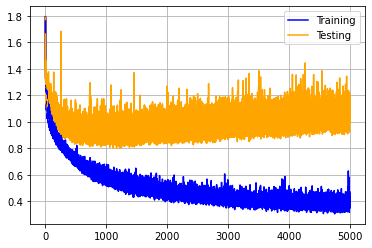

In [20]:
for i, history in enumerate(histories):
    pl.plot(history.history['loss'], label='Training', color="blue")
    pl.plot(history.history['val_loss'], label='Testing', color="orange")
    
    if i == 0:
        pl.legend()
        
    pl.grid()

In [21]:
print("mean loss: ", mean_loss)
print("mean accuracy: ", mean_accuracy)

mean loss:  1.0475209593772887
mean accuracy:  0.7012292504310608


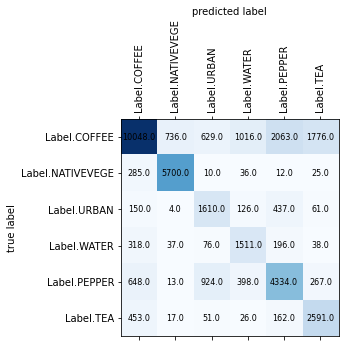

In [22]:
plot_confusion_matrix(conf_matrix, labels)

In [23]:
recall, precision, fscore = recall_precision_fscore_from_confusion_matrix(conf_matrix)

print("Precisions: ", precision)
print("Recalls: ", recall)
print("F-Score: ", fscore)

Precisions:  [0.84422786 0.87597971 0.48787879 0.48538387 0.60161022 0.54455654]
Recalls:  [0.61765429 0.93935399 0.67420436 0.69439338 0.65826245 0.78515152]
F-Score:  [0.71338303 0.90656064 0.56610408 0.57137455 0.62866261 0.64308761]
